## OpenLane Colab

This Google Colab notebook will:
* Install OpenLane and its dependencies
* Run a simple design, namely a serial-parallel multiplier, through the flow
  and targeting the [open source sky130 PDK](https://github.com/google/skywater-pdk/)
  by Google and Skywater.

In [1]:
# @title Setup Nix {display-mode: "form"}
# @markdown <img src="https://raw.githubusercontent.com/NixOS/nixos-artwork/master/logo/nix-snowflake.svg" width="32"/>
# @markdown
# @markdown Nix is a package manager with an emphasis on reproducible builds,
# @markdown and it is the primary method for installing OpenLane 2.
# @markdown
# @markdown This step installs the Nix package manager and enables the
# @markdown experimental "flakes" feature.
# @markdown
# @markdown If you're not in a Colab, this just sets the environment variables.
# @markdown You will need to install Nix and enable flakes on your own following
# @markdown [this guide](https://openlane2.readthedocs.io/en/stable/getting_started/common/nix_installation/index.html).
import os
import sys
import shutil

os.environ["LOCALE_ARCHIVE"] = "/usr/lib/locale/locale-archive"

if "google.colab" in sys.modules:
    if shutil.which("nix-env") is None:
        !curl -L https://nixos.org/nix/install | bash -s -- --daemon --yes
        !echo "extra-experimental-features = nix-command flakes" >> /etc/nix/nix.conf
        !killall nix-daemon
else:
    if shutil.which("nix-env") is None:
        raise RuntimeError("Nix is not installed!")

os.environ["PATH"] = f"/nix/var/nix/profiles/default/bin/:{os.getenv('PATH')}"

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
  0     0    0     0    0     0      0      0 --:--:-- --:--:-- --:--:--     0
100  4267  100  4267    0     0   6998      0 --:--:-- --:--:-- --:--:--  6998
downloading Nix 2.25.4 binary tarball for x86_64-linux from 'https://releases.nixos.org/nix/nix-2.25.4/nix-2.25.4-x86_64-linux.tar.xz' to '/tmp/nix-binary-tarball-unpack.nb6eI1sYfE'...
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100 22.6M  100 22.6M    0     0  33.4M      0 --:--:-- --:--:-- --:--:-- 33.5M
Note: a multi-user installation is possible. See https://nixos.org/manual/nix/stable/installation/installing-binary.html#multi-user-installation
Switching to the Multi-user Installer
Welcome to the Multi-User Nix Installation

This installation tool will set up 

In [2]:
# @title Get OpenLane {display-mode: "form"}
# @markdown Click the ▷ button to download and install OpenLane.
# @markdown
# @markdown This will install OpenLane's tool dependencies using Nix,
# @markdown and OpenLane itself using PIP.
# @markdown
# @markdown Note that `python3-tk` may need to be installed using your OS's
# @markdown package manager.
import os
import subprocess
import IPython

openlane_version = "version-2.1"  # @param {key:"OpenLane Version", type:"string"}

if openlane_version == "latest":
    openlane_version = "main"

pdk_root = "~/.volare"  # @param {key:"PDK Root", type:"string"}

pdk_root = os.path.expanduser(pdk_root)

pdk = "sky130"  # @param {key:"PDK (without the variant)", type:"string"}

openlane_ipynb_path = os.path.join(os.getcwd(), "openlane_ipynb")

display(IPython.display.HTML("<h3>Downloading OpenLane…</a>"))


TESTING_LOCALLY = False
!rm -rf {openlane_ipynb_path}
!mkdir -p {openlane_ipynb_path}
if TESTING_LOCALLY:
    !ln -s {os.getcwd()} {openlane_ipynb_path}
else:
    !curl -L "https://github.com/efabless/openlane2/tarball/{openlane_version}" | tar -xzC {openlane_ipynb_path} --strip-components 1

try:
    import tkinter
except ImportError:
    if "google.colab" in sys.modules:
        !sudo apt-get install python-tk

try:
    import tkinter
except ImportError as e:
    display(
        IPython.display.HTML(
            '<h3 style="color: #800020";>❌ Failed to import the <code>tkinter</code> library for Python, which is required to load PDK configuration values. Make sure <code>python3-tk</code> or equivalent is installed on your system.</a>'
        )
    )
    raise e from None


display(IPython.display.HTML("<h3>Downloading OpenLane's dependencies…</a>"))
try:
    subprocess.check_call(
        ["nix", "profile", "install", ".#colab-env", "--accept-flake-config"],
        cwd=openlane_ipynb_path,
    )
except subprocess.CalledProcessError as e:
    display(
        IPython.display.HTML(
            '<h3 style="color: #800020";>❌ Failed to install binary dependencies using Nix…</h3>'
        )
    )

display(IPython.display.HTML("<h3>Downloading Python dependencies using PIP…</a>"))
try:
    subprocess.check_call(
        ["pip3", "install", "."],
        cwd=openlane_ipynb_path,
    )
except subprocess.CalledProcessError as e:
    display(
        IPython.display.HTML(
            '<h3 style="color: #800020";>❌ Failed to install Python dependencies using PIP…</h3>'
        )
    )
    raise e from None

display(IPython.display.HTML("<h3>Downloading PDK…</a>"))
import volare

volare.enable(
    volare.get_volare_home(pdk_root),
    pdk,
    open(
        os.path.join(openlane_ipynb_path, "openlane", "open_pdks_rev"),
        encoding="utf8",
    )
    .read()
    .strip(),
)

sys.path.insert(0, openlane_ipynb_path)
display(IPython.display.HTML("<h3>⭕️ Done.</a>"))

import logging

# Remove the stupid default colab logging handler
logging.getLogger().handlers.clear()

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
  0     0    0     0    0     0      0      0 --:--:-- --:--:-- --:--:--     0
100 9491k    0 9491k    0     0  10.1M      0 --:--:-- --:--:-- --:--:-- 26.7M


Version bdc9412b3e468c102d01b7cf6337be06ec6e9c9a not found locally, attempting to download…

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Version bdc9412b3e468c102d01b7cf6337be06ec6e9c9a enabled for the sky130 PDK.

In [3]:
import openlane

print(openlane.__version__)

2.1.11


### Creating the design

Now that OpenLane is set up, we can write a Verilog file as follows:

In [4]:
%%writefile spm.v
module mux3 #(parameter WIDTH = 8)
    (input [WIDTH-1:0] d0, d1, d2,
     input [1:0] s,
     output [WIDTH-1:0] y);

    assign y = s[1] ? d2 : (s[0] ? d1 : d0);

endmodule

module mux2 #(parameter WIDTH = 8)
    (input [WIDTH-1:0] d0, d1,
     input s,
     output [WIDTH-1:0] y);

    assign y = s ? d1 : d0;

endmodule

module flopenr #(parameter WIDTH = 8)
    (input clk, reset, en,
     input [WIDTH-1:0] d,
     output reg [WIDTH-1:0] q);

    always @(posedge clk or posedge reset)
    begin
        if (reset)
            q <= 0;
        else if (en)
            q <= d;
    end

endmodule

module flopr #(parameter WIDTH = 8)
    (input clk, reset,
     input [WIDTH-1:0] d,
     output reg [WIDTH-1:0] q);

    always @(posedge clk or posedge reset)
    begin
        if (reset)
            q <= 0;
        else
            q <= d;
    end

endmodule

module extend(
    input [31:7] instr,
    input [2:0] immsrc,
    output reg [31:0] immext
);
    always @* begin
        case(immsrc)
            // I?type
            3'b000: immext = {{20{instr[31]}}, instr[31:20]};
            // S?type (stores)
            3'b001: immext = {{20{instr[31]}}, instr[31:25], instr[11:7]};
            // B?type (branches)
            3'b010: immext = {{20{instr[31]}}, instr[7], instr[30:25], instr[11:8], 1'b0};
            // J?type (jal)
            3'b011: immext = {{12{instr[31]}}, instr[19:12], instr[20], instr[30:21], 1'b0};
            // CAM?type (CAM)
            3'b100: immext = {{7{instr[31]}}, instr[31:7]};
            default: immext = 32'bx; // undefined
        endcase
    end

endmodule

module adder(
    input [31:0] a, b,
    output [31:0] y
);

    assign y = a + b;

endmodule

module alu(input      [31:0] a, b,
           input      [2:0]  alucont,
           output reg [31:0] result,
           output            zero);

  wire [31:0] b2, sum, slt;

  assign b2 = alucont[0] ? ~b:b;
  assign sum = a + b2 + alucont[0];
  assign slt = sum[31];
  always@(*)
    case(alucont)
      3'b000: result <= sum;
      3'b001: result <= sum;
      3'b010: result <= a & b;
      3'b011: result <= a | b;
      3'b101: result <= slt;
    endcase

  assign zero = (result == 32'b0);
endmodule

module regfile(input         clk,
               input         we3,
               input  [4:0]  ra1, ra2, wa3,
               input  [31:0] wd3,
               output [31:0] rd1, rd2);

  reg [31:0] rf[31:0];

  always @(posedge clk)
    if (we3) rf[wa3] <= wd3;

  assign rd1 = (ra1 != 0) ? rf[ra1] : 0;
  assign rd2 = (ra2 != 0) ? rf[ra2] : 0;
endmodule

module datapath(
    input clk, reset,
    input [1:0] ResultSrc,
    input PCSrc, ALUSrc,
    input RegWrite,
    input [2:0] ImmSrc,
    input [2:0] ALUControl,
    output Zero,
    output [31:0] PC,
    input [31:0] Instr,
    output [31:0] ALUResult, WriteData,
    input [31:0] ReadData,
    output [31:0] ImmExt
);

    wire [31:0] PCNext, PCPlus4, PCTarget;
    wire [31:0] SrcA, SrcB;
    wire [31:0] Result;

    // Next PC logic
    flopr #(32) pcreg(clk, reset, PCNext, PC);
    adder pcadd4(PC, 32'd4, PCPlus4);
    adder pcaddbranch(PC, ImmExt, PCTarget);
    mux2 #(32) pcmux(PCPlus4, PCTarget, PCSrc, PCNext);

    // Register file logic
    regfile rf(clk, RegWrite, Instr[19:15], Instr[24:20], Instr[11:7], Result, SrcA, WriteData);

    // Sign extension
    extend ext(Instr[31:7], ImmSrc, ImmExt);

    // ALU logic
    mux2 #(32) srcbmux(WriteData, ImmExt, ALUSrc, SrcB);
    alu alu(SrcA, SrcB, ALUControl, ALUResult, Zero);

    // Result Mux
    mux3 #(32) resultmux(ALUResult, ReadData, PCPlus4, ResultSrc, Result);

endmodule

module aludec(
    input opb5,
    input [2:0] funct3,
    input funct7b5,
    input [1:0] ALUOp,
    output reg [2:0] ALUControl
);
    wire RtypeSub;
    assign RtypeSub = funct7b5 & opb5; // TRUE for R–type subtract
    always @* begin
        case(ALUOp)
            2'b00: ALUControl = 3'b000; // addition
            2'b01: ALUControl = 3'b001; // subtraction
            default: begin
                case(funct3) // R–type or I–type ALU
                    3'b000: begin
                        if (RtypeSub)
                            ALUControl = 3'b001; // sub
                        else
                            ALUControl = 3'b000; // add, addi
                    end
                    3'b010: ALUControl = 3'b101; // slt, slti
                    3'b110: ALUControl = 3'b011; // or, ori
                    3'b111: ALUControl = 3'b010; // and, andi
                    default: ALUControl = 3'bxxx; // ???
                endcase
            end
        endcase
    end

endmodule

module maindec(
    input [6:0] op,
    output [1:0] ResultSrc,
    output MemWrite,
    output Branch,
    output ALUSrc,
    output RegWrite,
    output Jump,
    output [2:0] ImmSrc,
    output [1:0] ALUOp,
    output CamWriteEn,
    output CamMuxS
);
    reg [13:0] controls;
    assign {RegWrite, ImmSrc, ALUSrc, MemWrite, ResultSrc, Branch, ALUOp, Jump, CamWriteEn, CamMuxS} = controls;
    always @(*)
    case(op)
        7'b0000011: controls = 14'b10001001000000; // lw
        7'b0100011: controls = 14'b00011100000000; // sw
        7'b0111111: controls = 14'b00011000000010; // Cam Write
        7'b0110011: controls = 14'b1xxx0000010000; // R–type
        7'b1100011: controls = 14'b00100000101000; // beq
        7'b0010011: controls = 14'b10001000010000; // I–type ALU
        7'b1101111: controls = 14'b10110010000100; // jal
        7'b1111111: controls = 14'b01000000000001; // CAM
        default: controls = 14'bxxxxxxxxxxxxxx; // ???
    endcase

endmodule

module controller(
    input [6:0] op,
    input [2:0] funct3,
    input funct7b5,
    input Zero,
    output [1:0] ResultSrc,
    output MemWrite,
    output PCSrc,
    output ALUSrc,
    output RegWrite,
    output Jump,
    output [2:0] ImmSrc,
    output [2:0] ALUControl,
    output CamWriteEn,
    output CamMuxS
);
    wire [1:0] ALUOp;
    wire Branch;

    maindec md(op, ResultSrc, MemWrite, Branch, ALUSrc, RegWrite, Jump, ImmSrc, ALUOp, CamWriteEn, CamMuxS);
    aludec ad(op[5], funct3, funct7b5, ALUOp, ALUControl);

    assign PCSrc = Branch & Zero | Jump;
endmodule

module riscv(
    input clk,
    input reset,
    output [31:0] PC,
    input [31:0] Instr,
    output MemWrite,
    output [31:0] ALUResult, WriteData,
    input [31:0] ReadData,
    output CamWriteEn,
    output [31:0] ImmExt,
    output CamMuxS
);

    wire ALUSrc, RegWrite, Jump, Zero,PCSrc;
    wire [1:0] ResultSrc;
    wire [2:0] ImmSrc;
    wire [2:0] ALUControl;
    controller c(Instr[6:0], Instr[14:12], Instr[30], Zero, ResultSrc, MemWrite, PCSrc, ALUSrc, RegWrite, Jump, ImmSrc, ALUControl, CamWriteEn, CamMuxS);

    datapath dp(clk, reset, ResultSrc, PCSrc, ALUSrc, RegWrite, ImmSrc, ALUControl, Zero, PC, Instr, ALUResult, WriteData, ReadData, ImmExt);

endmodule

module imem(
    input [31:0] a,
    output [31:0] rd
);

    reg [31:0] RAM [63:0];
    initial begin
        $readmemh("riscvtest.txt", RAM);
    end

    assign rd = RAM[a[31:2]];

endmodule

module dmem(
    input clk, we,
    input [31:0] a, wd,
    output [31:0] rd
);

    reg [31:0] RAM [63:0];

    assign rd = RAM[a[31:2]];

    always @(posedge clk) begin
        if (we)
            RAM[a[31:2]] <= wd;
    end

endmodule

module cam_memory (
               input         clk,
               input         we3,
               input  [31:0] wa3,
               input  [31:0] wd3,
               output [15:0] mat);


  reg [31:0] mem[15:0];
  assign mat = {mem[15] == wd3,
                mem[14] == wd3,
                mem[13] == wd3,
                mem[12] == wd3,
                mem[11] == wd3,
                mem[10] == wd3,
                mem[9]  == wd3,
                mem[8]  == wd3,
                mem[7]  == wd3,
                mem[6]  == wd3,
                mem[5]  == wd3,
                mem[4]  == wd3,
                mem[3]  == wd3,
                mem[2]  == wd3,
                mem[1]  == wd3,
                mem[0]  == wd3};

  always @(posedge clk)
    if (we3) mem[wa3] <= wd3;

endmodule

module priority_enc (
    input       [15:0] mat,
    output reg  [3:0]  Adr,
    output reg          false
);

always @(*)
    casez (mat)
        16'b???????????????1:  begin Adr = 4'b0000; false = 1'b0; end
        16'b??????????????1?:  begin Adr = 4'b0001; false = 1'b0; end
        16'b?????????????1??:  begin Adr = 4'b0010; false = 1'b0; end
        16'b????????????1???:  begin Adr = 4'b0011; false = 1'b0; end
        16'b???????????1????:  begin Adr = 4'b0100; false = 1'b0; end
        16'b??????????1?????:  begin Adr = 4'b0101; false = 1'b0; end
        16'b?????????1??????:  begin Adr = 4'b0110; false = 1'b0; end
        16'b????????1???????:  begin Adr = 4'b0111; false = 1'b0; end
        16'b???????1????????:  begin Adr = 4'b1000; false = 1'b0; end
        16'b??????1?????????:  begin Adr = 4'b1001; false = 1'b0; end
        16'b?????1??????????:  begin Adr = 4'b1010; false = 1'b0; end
        16'b????1???????????:  begin Adr = 4'b1011; false = 1'b0; end
        16'b???1????????????:  begin Adr = 4'b1100; false = 1'b0; end
        16'b??1?????????????:  begin Adr = 4'b1101; false = 1'b0; end
        16'b?1??????????????:  begin Adr = 4'b1110; false = 1'b0; end
        16'b1???????????????:  begin Adr = 4'b1111; false = 1'b0; end
        default:               begin Adr = 4'b0000; false = 1'b1; end
    endcase

endmodule

module CAM_Body (
    input         clk,
    input  [31:0] wd3,
    input  [31:0] wa3,
    input         we3,
    output  [3:0] Adr,
    output       false
);

    wire [15:0] matt;

    cam_memory mem(clk, we3, wa3, wd3, matt);
    priority_enc en(matt, Adr, false);

endmodule

module CAM (
    input         clk,
    input  [31:0] wd,
    input  [31:0] wa,
    input         we,
    output  [3:0] Adr,
    output        false
);

    CAM_Body CAM(clk, wd, wa, we, Adr, false);

endmodule

module spm(
    input clk,
    input reset,
    output false,
    output [3:0] Address
);
    wire [31:0] PC, Instr, ReadData;
    wire [31:0] WriteData, DataAdr;
    wire MemWrite;
    wire CamWriteEn;
    wire [31:0] ImmExt;
    wire [31:0] CamMuxOut;
    wire CamMuxS;

    mux2 #(32) CamMux(WriteData, ImmExt, CamMuxS, CamMuxOut);

    CAM CAM(.we(CamWriteEn), .clk(clk), .wd(CamMuxOut), .Adr(Address), .false(false), .wa(DataAdr));

    riscv rvsingle(clk, reset, PC, Instr, MemWrite, DataAdr, WriteData, ReadData, CamWriteEn, ImmExt, CamMuxS);

    imem imem(PC, Instr);

    dmem dmem(clk, MemWrite, DataAdr, WriteData, ReadData);

endmodule


Writing spm.v


### Setting up the configuration

OpenLane requries you to configure any Flow before using it. This is done using
the `config` module.

For colaboratories, REPLs and other interactive environments where there is no
concrete Flow object, the Configuration may be initialized using `Config.interactive`,
which will automatically propagate the configuration to any future steps.

You can find the documentation for `Config.interactive` [here](https://openlane2.readthedocs.io/en/latest/reference/api/config/index.html#openlane.config.Config.interactive).



In [7]:
from openlane.config import Config

Config.interactive(
    "spm",
    PDK="sky130A",
    CLOCK_PORT="clk",
    CLOCK_NET="clk",
    CLOCK_PERIOD=100,
    PRIMARY_GDSII_STREAMOUT_TOOL="klayout"
)


### Interactive Configuration
#### Initial Values

<br />

```yaml
CELL_BB_VERILOG_MODELS:
- /root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/verilog/sky130_fd_sc_hd__blackbox.v
- /root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/verilog/sky130_fd_sc_hd__blackbox_pp.v
CELL_GDS:
- /root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/gds/sky130_fd_sc_hd.gds
CELL_LEFS:
- /root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/lef/sky130_ef_sc_hd.lef
- /root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/lef/sky130_fd_sc_hd.lef
CELL_PAD_EXCLUDE:
- sky130_fd_sc_hd__tap*
- sky130_fd_sc_hd__decap*
- sky130_ef_sc_hd__decap*
- sky130_fd_sc_hd__fill*
CELL_SPICE_MODELS:
- /root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/spice/sky130_ef_sc_hd__decap_12.spice
- /root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/spice/sky130_ef_sc_hd__fill_12.spice
- /root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/spice/sky130_ef_sc_hd__fill_4.spice
- /root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/spice/sky130_ef_sc_hd__fill_8.spice
- /root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/spice/sky130_fd_sc_hd.spice
CELL_VERILOG_MODELS:
- /root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/verilog/primitives.v
- /root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/verilog/sky130_fd_sc_hd.v
CLOCK_NET: clk
CLOCK_PERIOD: 100
CLOCK_PORT: clk
CLOCK_TRANSITION_CONSTRAINT: 0.15
CLOCK_UNCERTAINTY_CONSTRAINT: 0.25
CLOCK_WIRE_RC_LAYERS: null
DECAP_CELL:
- sky130_ef_sc_hd__decap_12
- sky130_fd_sc_hd__decap_8
- sky130_fd_sc_hd__decap_6
- sky130_fd_sc_hd__decap_4
- sky130_fd_sc_hd__decap_3
DEFAULT_CORNER: nom_tt_025C_1v80
DEFAULT_MAX_TRAN: null
DESIGN_DIR: .
DESIGN_NAME: spm
DIE_AREA: null
DIODE_CELL: sky130_fd_sc_hd__diode_2/DIODE
ENDCAP_CELL: sky130_fd_sc_hd__decap_3
EXTRA_EXCLUDED_CELLS: null
EXTRA_GDS_FILES: null
EXTRA_LEFS: null
EXTRA_LIBS: null
EXTRA_SPICE_MODELS: null
EXTRA_VERILOG_MODELS: null
FALLBACK_SDC_FILE: /content/openlane_ipynb/openlane/scripts/base.sdc
FILL_CELL:
- sky130_fd_sc_hd__fill*
FP_IO_HLAYER: met3
FP_IO_VLAYER: met2
FP_TAPCELL_DIST: 13
FP_TRACKS_INFO: /root/.volare/sky130A/libs.tech/openlane/sky130_fd_sc_hd/tracks.info
GND_NETS: null
GND_PIN: VGND
GPIO_PADS_LEF:
- /root/.volare/sky130A/libs.ref/sky130_fd_io/lef/sky130_fd_io.lef
- /root/.volare/sky130A/libs.ref/sky130_fd_io/lef/sky130_ef_io.lef
GPIO_PADS_LEF_CORE_SIDE:
- /root/.volare/sky130A/libs.tech/openlane/custom_cells/lef/sky130_fd_io_core.lef
- /root/.volare/sky130A/libs.tech/openlane/custom_cells/lef/sky130_ef_io_core.lef
GPIO_PADS_VERILOG:
- /root/.volare/sky130A/libs.ref/sky130_fd_io/verilog/sky130_ef_io.v
GPIO_PAD_CELLS:
- sky130_fd_io*
- sky130_ef_io*
IO_DELAY_CONSTRAINT: 20
LIB:
  '*_ff_n40C_1v95':
  - /root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/lib/sky130_fd_sc_hd__ff_n40C_1v95.lib
  '*_ss_100C_1v60':
  - /root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/lib/sky130_fd_sc_hd__ss_100C_1v60.lib
  '*_tt_025C_1v80':
  - /root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/lib/sky130_fd_sc_hd__tt_025C_1v80.lib
MACROS: null
MAX_CAPACITANCE_CONSTRAINT: 0.2
MAX_FANOUT_CONSTRAINT: 10
MAX_TRANSITION_CONSTRAINT: 0.75
OUTPUT_CAP_LOAD: 33.442
PDK: sky130A
PDK_ROOT: /root/.volare
PLACE_SITE: unithd
PNR_EXCLUDED_CELL_FILE: /root/.volare/sky130A/libs.tech/openlane/sky130_fd_sc_hd/drc_exclude.cells
PRIMARY_GDSII_STREAMOUT_TOOL: klayout
RT_MAX_LAYER: met5
RT_MIN_LAYER: met1
SCL_GROUND_PINS:
- VGND
- VNB
SCL_POWER_PINS:
- VPWR
- VPB
SIGNAL_WIRE_RC_LAYERS: null
STA_CORNERS:
- nom_tt_025C_1v80
- nom_ss_100C_1v60
- nom_ff_n40C_1v95
- min_tt_025C_1v80
- min_ss_100C_1v60
- min_ff_n40C_1v95
- max_tt_025C_1v80
- max_ss_100C_1v60
- max_ff_n40C_1v95
STD_CELL_LIBRARY: sky130_fd_sc_hd
SYNTH_BUFFER_CELL: sky130_fd_sc_hd__buf_2/A/X
SYNTH_CLK_DRIVING_CELL: null
SYNTH_DRIVING_CELL: sky130_fd_sc_hd__inv_2/Y
SYNTH_EXCLUDED_CELL_FILE: /root/.volare/sky130A/libs.tech/openlane/sky130_fd_sc_hd/no_synth.cells
SYNTH_TIEHI_CELL: sky130_fd_sc_hd__conb_1/HI
SYNTH_TIELO_CELL: sky130_fd_sc_hd__conb_1/LO
TECH_LEFS:
  max_*: /root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/techlef/sky130_fd_sc_hd__max.tlef
  min_*: /root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/techlef/sky130_fd_sc_hd__min.tlef
  nom_*: /root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/techlef/sky130_fd_sc_hd__nom.tlef
TIME_DERATING_CONSTRAINT: 5
TRISTATE_CELLS:
- sky130_fd_sc_hd__ebuf*
VDD_NETS: null
VDD_PIN: VPWR
VDD_PIN_VOLTAGE: 1.8
WELLTAP_CELL: sky130_fd_sc_hd__tapvpwrvgnd_1
WIRE_LENGTH_THRESHOLD: null
meta:
  flow: null
  openlane_version: 2.1.11
  step: null
  substituting_steps: null
  version: 1

```


### Running implementation steps

There are two ways to obtain OpenLane's built-in implementation steps:

* via directly importing from the `steps` module using its category:
    * `from openlane.steps import Yosys` then `Synthesis = Yosys.Synthesis`
* by using the step's id from the registry:
    * `from openlane.steps import Step` then `Synthesis = Step.factory.get("Yosys.Synthesis")`

You can find a full list of included steps here: https://openlane2.readthedocs.io/en/latest/reference/step_config_vars.html

In [8]:
from openlane.steps import Step

* First, get the step (and display its help)...

In [9]:
Synthesis = Step.factory.get("Yosys.Synthesis")

Synthesis.display_help()


(step-yosys-synthesis)=
### Synthesis

```{eval-rst}

Performs synthesis and technology mapping on Verilog RTL files
using Yosys and ABC, emitting a netlist.

Some metrics will also be extracted and updated, namely:

* ``design__instance__count``
* ``design__instance_unmapped__count``
* ``design__instance__area``

```

#### Importing
```python
from openlane.steps.yosys import Synthesis

# or

from openlane.steps import Step

Synthesis = Step.factory.get("Yosys.Synthesis")
```


#### Inputs and Outputs

| Inputs | Outputs |
| - | - |
|  | Verilog Netlist (.nl.v) |

(yosys.synthesis-configuration-variables)=
#### Configuration Variables

| Variable Name | Type | Description | Default | Units |
| - | - | - | - | - |
| `SYNTH_LATCH_MAP`{#var-yosys-synthesis-synth_latch_map}<sup>PDK</sup> | Path? | A path to a file containing the latch mapping for Yosys. | `None` |  |
| `SYNTH_TRISTATE_MAP`{#var-yosys-synthesis-synth_tristate_map}<sup>PDK</sup> | Path? | A path to a file containing the tri-state buffer mapping for Yosys. | `None` |  |
| `SYNTH_CSA_MAP`{#var-yosys-synthesis-synth_csa_map}<sup>PDK</sup> | Path? | A path to a file containing the carry-select adder mapping for Yosys. | `None` |  |
| `SYNTH_RCA_MAP`{#var-yosys-synthesis-synth_rca_map}<sup>PDK</sup> | Path? | A path to a file containing the ripple-carry adder mapping for Yosys. | `None` |  |
| `SYNTH_FA_MAP`{#var-yosys-synthesis-synth_fa_map}<sup>PDK</sup> | Path? | A path to a file containing the full adder mapping for Yosys. | `None` |  |
| `SYNTH_MUX_MAP`{#var-yosys-synthesis-synth_mux_map}<sup>PDK</sup> | Path? | A path to a file containing the mux mapping for Yosys. | `None` |  |
| `SYNTH_MUX4_MAP`{#var-yosys-synthesis-synth_mux4_map}<sup>PDK</sup> | Path? | A path to a file containing the mux4 mapping for Yosys. | `None` |  |
| `USE_LIGHTER`{#var-yosys-synthesis-use_lighter} | bool | Activates Lighter, an experimental plugin that attempts to optimize clock-gated flip-flops. | `False` |  |
| `LIGHTER_DFF_MAP`{#var-yosys-synthesis-lighter_dff_map} | Path? | An override to the custom DFF map file provided for the given SCL by Lighter. | `None` |  |
| `YOSYS_LOG_LEVEL`{#var-yosys-synthesis-yosys_log_level} | 'ALL'｜<br />'WARNING'｜<br />'ERROR' | Which log level for Yosys. At WARNING or higher, the initialization splash is also disabled. | `ALL` |  |
| `SYNTH_CHECKS_ALLOW_TRISTATE`{#var-yosys-synthesis-synth_checks_allow_tristate} | bool | Ignore multiple-driver warnings if they are connected to tri-state buffers on a best-effort basis. | `True` |  |
| `SYNTH_AUTONAME`{#var-yosys-synthesis-synth_autoname} | bool | Generates names for netlist instances. This results in instance names that can be extremely long, but are more human-readable. | `False` |  |
| `SYNTH_STRATEGY`{#var-yosys-synthesis-synth_strategy} | 'AREA 0'｜<br />'AREA 1'｜<br />'AREA 2'｜<br />'AREA 3'｜<br />'DELAY 0'｜<br />'DELAY 1'｜<br />'DELAY 2'｜<br />'DELAY 3'｜<br />'DELAY 4' | Strategies for abc logic synthesis and technology mapping. AREA strategies usually result in a more compact design, while DELAY strategies usually result in a design that runs at a higher frequency. Please note that there is no way to know which strategy is the best before trying them. | `AREA 0` |  |
| `SYNTH_ABC_BUFFERING`{#var-yosys-synthesis-synth_abc_buffering} | bool | Enables `abc` cell buffering. | `False` |  |
| `SYNTH_ABC_LEGACY_REFACTOR`{#var-yosys-synthesis-synth_abc_legacy_refactor} | bool | Replaces the ABC command `drf -l` with `refactor` which matches older versions of OpenLane but is more unstable. | `False` |  |
| `SYNTH_ABC_LEGACY_REWRITE`{#var-yosys-synthesis-synth_abc_legacy_rewrite} | bool | Replaces the ABC command `drw -l` with `rewrite` which matches older versions of OpenLane but is more unstable. | `False` |  |
| `SYNTH_DIRECT_WIRE_BUFFERING`{#var-yosys-synthesis-synth_direct_wire_buffering} | bool | Enables inserting buffer cells for directly connected wires. | `True` |  |
| `SYNTH_SPLITNETS`{#var-yosys-synthesis-synth_splitnets} | bool | Splits multi-bit nets into single-bit nets. Easier to trace but may not be supported by all tools. | `True` |  |
| `SYNTH_SIZING`{#var-yosys-synthesis-synth_sizing} | bool | Enables `abc` cell sizing (instead of buffering). | `False` |  |
| `SYNTH_NO_FLAT`{#var-yosys-synthesis-synth_no_flat} | bool | A flag that disables flattening the hierarchy during synthesis, only flattening it after synthesis, mapping and optimizations. | `False` |  |
| `SYNTH_SHARE_RESOURCES`{#var-yosys-synthesis-synth_share_resources} | bool | A flag that enables yosys to reduce the number of cells by determining shareable resources and merging them. | `True` |  |
| `SYNTH_ADDER_TYPE`{#var-yosys-synthesis-synth_adder_type} | 'YOSYS'｜<br />'FA'｜<br />'RCA'｜<br />'CSA' | Adder type to which the $add and $sub operators are mapped to.  Possible values are `YOSYS/FA/RCA/CSA`; where `YOSYS` refers to using Yosys internal adder definition, `FA` refers to full-adder structure, `RCA` refers to ripple carry adder structure, and `CSA` refers to carry select adder. | `YOSYS` |  |
| `SYNTH_EXTRA_MAPPING_FILE`{#var-yosys-synthesis-synth_extra_mapping_file} | Path? | Points to an extra techmap file for yosys that runs right after yosys `synth` before generic techmap. | `None` |  |
| `SYNTH_PARAMETERS`{#var-yosys-synthesis-synth_parameters} | List[str]? | Key-value pairs to be `chparam`ed in Yosys, in the format `key1=value1`. | `None` |  |
| `SYNTH_ELABORATE_ONLY`{#var-yosys-synthesis-synth_elaborate_only} | bool | "Elaborate" the design only without attempting any logic mapping. Useful when dealing with structural Verilog netlists. | `False` |  |
| `SYNTH_ELABORATE_FLATTEN`{#var-yosys-synthesis-synth_elaborate_flatten} | bool | If `SYNTH_ELABORATE_ONLY` is specified, this variable controls whether or not the top level should be flattened. | `True` |  |
| `VERILOG_FILES`{#var-yosys-synthesis-verilog_files} | List[Path] | The paths of the design's Verilog files. | `None` |  |
| `VERILOG_DEFINES`{#var-yosys-synthesis-verilog_defines} | List[str]? | Preprocessor defines for input Verilog files. | `None` |  |
| `VERILOG_POWER_DEFINE`{#var-yosys-synthesis-verilog_power_define} | str | Specifies the name of the define used to guard power and ground connections in the input RTL. | `USE_POWER_PINS` |  |
| `VERILOG_INCLUDE_DIRS`{#var-yosys-synthesis-verilog_include_dirs} | List[str]? | Specifies the Verilog `include` directories. | `None` |  |
| `USE_SYNLIG`{#var-yosys-synthesis-use_synlig} | bool | Use the Synlig plugin to process files, which has better SystemVerilog parsing capabilities but may not be compatible with all Yosys commands and attributes. | `False` |  |
| `SYNLIG_DEFER`{#var-yosys-synthesis-synlig_defer} | bool | Uses -defer flag when reading files the Synlig plugin, which may improve performance by reading each file separately, but is experimental. | `False` |  |



* Then run it. Note you can pass step-specific configs using Python keyword
  arguments.

### Synthesis

We need to start by converting our high-level Verilog to one that just shows
the connections between small silicon patterns called "standard cells" in process
called Synthesis. We can do this by passing the Verilog files as a configuration
variable to `Yosys.Synthesis` as follows, then running it.

As this is the first step, we need to create an empty state and pass it to it.

In [11]:
from openlane.state import State

synthesis = Synthesis(
    VERILOG_FILES=["./spm.v"],
    state_in=State(),
)
synthesis.start()

──────────────────────────────────────────────────── Synthesis ────────────────────────────────────────────────────

[06:39:06] VERBOSE  Running 'Yosys.Synthesis'…                                                         ]8;id=173778;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=339776;file:///content/openlane_ipynb/openlane/steps/step.py#1088\1088]8;;\

[06:39:06] VERBOSE  Logging subprocess to ]8;id=938529;file:///content/openlane_run/2-yosys-synthesis/yosys-synthesis.log\openlane_run/]8;;\]8;id=622156;file:///content/openlane_run/2-yosys-synthesis/yosys-synthesis.log\2]8;;\]8;id=938529;file:///content/openlane_run/2-yosys-synthesis/yosys-synthesis.log\-yosys-synthesis/yosys-synthesis.log]8;;\…          ]8;id=153861;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=459517;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\

/----------------------------------------------------------------------------\

|                                                                            |

|  yosys -- Yosys Open SYnthesis Suite                                       |

|                                                                            |

|  Copyright (C) 2012 - 2020  Claire Xenia Wolf <claire@yosyshq.com>         |

|                                                                            |

|  Permission to use, copy, modify, and/or distribute this software for any  |

|  purpose with or without fee is hereby granted, provided that the above    |

|  copyright notice and this permission notice appear in all copies.         |

|                                                                            |

|  THE SOFTWARE IS PROVIDED "AS IS" AND THE AUTHOR DISCLAIMS ALL WARRANTIES  |

|  WITH REGARD TO THIS SOFTWARE INCLUDING ALL IMPLIED WARRANTIES OF          |

|  MERCHANTABILITY AND FITNESS. IN NO EVENT SHALL THE AUTHOR BE LIABLE FOR   |

|  ANY SPECIAL, DIRECT, INDIRECT, OR CONSEQUENTIAL DAMAGES OR ANY DAMAGES    |

|  WHATSOEVER RESULTING FROM LOSS OF USE, DATA OR PROFITS, WHETHER IN AN     |

|  ACTION OF CONTRACT, NEGLIGENCE OR OTHER TORTIOUS ACTION, ARISING OUT OF   |

|  OR IN CONNECTION WITH THE USE OR PERFORMANCE OF THIS SOFTWARE.            |

|                                                                            |

\----------------------------------------------------------------------------/

Yosys 0.38 (git sha1 543faed9c8c, clang++ 17.0.6 -fPIC -Os)

Loaded SDC plugin

[TCL: yosys -import] Command name collision: found pre-existing command `cd' -> skip.

[TCL: yosys -import] Command name collision: found pre-existing command `eval' -> skip.

[TCL: yosys -import] Command name collision: found pre-existing command `exec' -> skip.

[TCL: yosys -import] Command name collision: found pre-existing command `read' -> skip.

[TCL: yosys -import] Command name collision: found pre-existing command `trace' -> skip.

1. Executing Liberty frontend: /root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/lib/sky130_fd_sc_hd__tt_025C_1v80.lib

Imported 428 cell types from liberty file.

2. Executing Verilog-2005 frontend: ./spm.v

Parsing SystemVerilog input from `./spm.v' to AST representation.

Generating RTLIL representation for module `\mux3'.

Generating RTLIL representation for module `\mux2'.

Generating RTLIL representation for module `\flopenr'.

Generating RTLIL representation for module `\flopr'.

Generating RTLIL representation for module `\extend'.

Generating RTLIL representation for module `\adder'.

Generating RTLIL representation for module `\alu'.

Generating RTLIL representation for module `\regfile'.

Generating RTLIL representation for module `\datapath'.

Generating RTLIL representation for module `\aludec'.

Generating RTLIL representation for module `\maindec'.

Generating RTLIL representation for module `\controller'.

Generating RTLIL representation for module `\riscv'.

Generating RTLIL representation for module `\imem'.

Generating RTLIL representation for module `\dmem'.

Generating RTLIL representation for module `\cam_memory'.

Generating RTLIL representation for module `\priority_enc'.

Generating RTLIL representation for module `\CAM_Body'.

Generating RTLIL representation for module `\CAM'.

Generating RTLIL representation for module `\spm'.

Successfully finished Verilog frontend.

3. Executing HIERARCHY pass (managing design hierarchy).

3.1. Analyzing design hierarchy..

Top module:  \spm

Used module:     \dmem

Used module:     \imem

Used module:     \riscv

Used module:         \datapath

Used module:             \mux3

Used module:             \alu

Used module:             \mux2

Used module:             \extend

Used module:             \regfile

Used module:             \adder

Used module:             \flopr

Used module:         \controller

Used module:             \aludec

Used module:             \maindec

Used module:     \CAM

Used module:         \CAM_Body

Used module:             \priority_enc

Used module:             \cam_memory

Parameter 1 (\WIDTH) = 32

3.2. Executing AST frontend in derive mode using pre-parsed AST for module `\mux3'.

Parameter 1 (\WIDTH) = 32

Generating RTLIL representation for module `$paramod\mux3\WIDTH=s32'00000000000000000000000000100000'.

Parameter 1 (\WIDTH) = 32

3.3. Executing AST frontend in derive mode using pre-parsed AST for module `\mux2'.

Parameter 1 (\WIDTH) = 32

Generating RTLIL representation for module `$paramod\mux2\WIDTH=s32'00000000000000000000000000100000'.

Parameter 1 (\WIDTH) = 32

Found cached RTLIL representation for module `$paramod\mux2\WIDTH=s32'00000000000000000000000000100000'.

Parameter 1 (\WIDTH) = 32

3.4. Executing AST frontend in derive mode using pre-parsed AST for module `\flopr'.

Parameter 1 (\WIDTH) = 32

Generating RTLIL representation for module `$paramod\flopr\WIDTH=s32'00000000000000000000000000100000'.

Parameter 1 (\WIDTH) = 32

Found cached RTLIL representation for module `$paramod\mux2\WIDTH=s32'00000000000000000000000000100000'.

3.5. Analyzing design hierarchy..

Top module:  \spm

Used module:     \dmem

Used module:     \imem

Used module:     \riscv

Used module:         \datapath

Used module:             $paramod\mux3\WIDTH=s32'00000000000000000000000000100000

Used module:             \alu

Used module:             $paramod\mux2\WIDTH=s32'00000000000000000000000000100000

Used module:             \extend

Used module:             \regfile

Used module:             \adder

Used module:             $paramod\flopr\WIDTH=s32'00000000000000000000000000100000

Used module:         \controller

Used module:             \aludec

Used module:             \maindec

Used module:     \CAM

Used module:         \CAM_Body

Used module:             \priority_enc

Used module:             \cam_memory

3.6. Analyzing design hierarchy..

Top module:  \spm

Used module:     \dmem

Used module:     \imem

Used module:     \riscv

Used module:         \datapath

Used module:             $paramod\mux3\WIDTH=s32'00000000000000000000000000100000

Used module:             \alu

Used module:             $paramod\mux2\WIDTH=s32'00000000000000000000000000100000

Used module:             \extend

Used module:             \regfile

Used module:             \adder

Used module:             $paramod\flopr\WIDTH=s32'00000000000000000000000000100000

Used module:         \controller

Used module:             \aludec

Used module:             \maindec

Used module:     \CAM

Used module:         \CAM_Body

Used module:             \priority_enc

Used module:             \cam_memory

Removing unused module `\flopr'.

Removing unused module `\flopenr'.

Removing unused module `\mux2'.

Removing unused module `\mux3'.

Removed 4 unused modules.

Mapping positional arguments of cell CAM.CAM (CAM_Body).

Mapping positional arguments of cell CAM_Body.en (priority_enc).

Mapping positional arguments of cell CAM_Body.mem (cam_memory).

Mapping positional arguments of cell riscv.dp (datapath).

Mapping positional arguments of cell riscv.c (controller).

Mapping positional arguments of cell controller.ad (aludec).

Mapping positional arguments of cell controller.md (maindec).

Mapping positional arguments of cell datapath.resultmux ($paramod\mux3\WIDTH=s32'00000000000000000000000000100000).

Mapping positional arguments of cell datapath.alu (alu).

Mapping positional arguments of cell datapath.srcbmux ($paramod\mux2\WIDTH=s32'00000000000000000000000000100000).

Mapping positional arguments of cell datapath.ext (extend).

Mapping positional arguments of cell datapath.rf (regfile).

Mapping positional arguments of cell datapath.pcmux ($paramod\mux2\WIDTH=s32'00000000000000000000000000100000).

Mapping positional arguments of cell datapath.pcaddbranch (adder).

Mapping positional arguments of cell datapath.pcadd4 (adder).

Mapping positional arguments of cell datapath.pcreg ($paramod\flopr\WIDTH=s32'00000000000000000000000000100000).

Mapping positional arguments of cell spm.dmem (dmem).

Mapping positional arguments of cell spm.imem (imem).

Mapping positional arguments of cell spm.rvsingle (riscv).

Mapping positional arguments of cell spm.CamMux ($paramod\mux2\WIDTH=s32'00000000000000000000000000100000).

Renaming module spm to spm.

4. Generating Graphviz representation of design.

Writing dot description to `/content/openlane_run/2-yosys-synthesis/hierarchy.dot'.

Dumping module spm to page 1.

5. Executing TRIBUF pass.

6. Executing HIERARCHY pass (managing design hierarchy).

6.1. Analyzing design hierarchy..

Top module:  \spm

Used module:     \dmem

Used module:     \imem

Used module:     \riscv

Used module:         \datapath

Used module:             $paramod\mux3\WIDTH=s32'00000000000000000000000000100000

Used module:             \alu

Used module:             $paramod\mux2\WIDTH=s32'00000000000000000000000000100000

Used module:             \extend

Used module:             \regfile

Used module:             \adder

Used module:             $paramod\flopr\WIDTH=s32'00000000000000000000000000100000

Used module:         \controller

Used module:             \aludec

Used module:             \maindec

Used module:     \CAM

Used module:         \CAM_Body

Used module:             \priority_enc

Used module:             \cam_memory

6.2. Analyzing design hierarchy..

Top module:  \spm

Used module:     \dmem

Used module:     \imem

Used module:     \riscv

Used module:         \datapath

Used module:             $paramod\mux3\WIDTH=s32'00000000000000000000000000100000

Used module:             \alu

Used module:             $paramod\mux2\WIDTH=s32'00000000000000000000000000100000

Used module:             \extend

Used module:             \regfile

Used module:             \adder

Used module:             $paramod\flopr\WIDTH=s32'00000000000000000000000000100000

Used module:         \controller

Used module:             \aludec

Used module:             \maindec

Used module:     \CAM

Used module:         \CAM_Body

Used module:             \priority_enc

Used module:             \cam_memory

Removed 0 unused modules.

7. Executing PROC_CLEAN pass (remove empty switches from decision trees).

Removing empty process `imem.$proc$./spm.v:0$37'.

Cleaned up 0 empty switches.

8. Executing PROC_RMDEAD pass (remove dead branches from decision trees).

Marked 1 switch rules as full_case in process $proc$./spm.v:336$87 in module priority_enc.

Marked 1 switch rules as full_case in process $proc$./spm.v:325$80 in module cam_memory.

Marked 1 switch rules as full_case in process $proc$./spm.v:292$40 in module dmem.

Marked 1 switch rules as full_case in process $proc$./spm.v:205$32 in module maindec.

Marked 3 switch rules as full_case in process $proc$./spm.v:167$31 in module aludec.

Marked 1 switch rules as full_case in process $proc$./spm.v:111$17 in module regfile.

Marked 1 switch rules as full_case in process $proc$./spm.v:54$6 in module extend.

Marked 1 switch rules as full_case in process $proc$./spm.v:39$91 in module                                        
$paramod\flopr\WIDTH=s32'00000000000000000000000000100000.

Removed a total of 0 dead cases.

9. Executing PROC_PRUNE pass (remove redundant assignments in processes).

Removed 1 redundant assignment.

Promoted 14 assignments to connections.

10. Executing PROC_INIT pass (extract init attributes).

11. Executing PROC_ARST pass (detect async resets in processes).

Found async reset \reset in `$paramod\flopr\WIDTH=s32'00000000000000000000000000100000.$proc$./spm.v:39$91'.

12. Executing PROC_ROM pass (convert switches to ROMs).

Converted 0 switches.

<suppressed ~10 debug messages>

13. Executing PROC_MUX pass (convert decision trees to multiplexers).

Creating decoders for process `\priority_enc.$proc$./spm.v:336$87'.

1/2: $1\false[0:0]

2/2: $1\Adr[3:0]

Creating decoders for process `\cam_memory.$proc$./spm.v:325$80'.

1/3: $1$memwr$\mem$./spm.v:326$47_EN[31:0]$86

2/3: $1$memwr$\mem$./spm.v:326$47_DATA[31:0]$85

3/3: $1$memwr$\mem$./spm.v:326$47_ADDR[31:0]$84

Creating decoders for process `\dmem.$proc$./spm.v:292$40'.

1/3: $1$memwr$\RAM$./spm.v:294$38_EN[31:0]$46

2/3: $1$memwr$\RAM$./spm.v:294$38_DATA[31:0]$45

3/3: $1$memwr$\RAM$./spm.v:294$38_ADDR[29:0]$44

Creating decoders for process `\maindec.$proc$./spm.v:205$32'.

1/1: $1\controls[13:0]

Creating decoders for process `\aludec.$proc$./spm.v:167$31'.

1/3: $3\ALUControl[2:0]

2/3: $2\ALUControl[2:0]

3/3: $1\ALUControl[2:0]

Creating decoders for process `\regfile.$proc$./spm.v:111$17'.

1/3: $1$memwr$\rf$./spm.v:112$16_EN[31:0]$23

2/3: $1$memwr$\rf$./spm.v:112$16_DATA[31:0]$22

3/3: $1$memwr$\rf$./spm.v:112$16_ADDR[4:0]$21

Creating decoders for process `\alu.$proc$./spm.v:91$12'.

1/1: $0\result[31:0]

Creating decoders for process `\extend.$proc$./spm.v:54$6'.

1/1: $1\immext[31:0]

Creating decoders for process `$paramod\flopr\WIDTH=s32'00000000000000000000000000100000.$proc$./spm.v:39$91'.

1/1: $0\q[31:0]

14. Executing PROC_DLATCH pass (convert process syncs to latches).

No latch inferred for signal `\priority_enc.\Adr' from process `\priority_enc.$proc$./spm.v:336$87'.

No latch inferred for signal `\priority_enc.\false' from process `\priority_enc.$proc$./spm.v:336$87'.

No latch inferred for signal `\maindec.\controls' from process `\maindec.$proc$./spm.v:205$32'.

No latch inferred for signal `\aludec.\ALUControl' from process `\aludec.$proc$./spm.v:167$31'.

Latch inferred for signal `\alu.\result' from process `\alu.$proc$./spm.v:91$12':                                  
$auto$proc_dlatch.cc:427:proc_dlatch$235

No latch inferred for signal `\extend.\immext' from process `\extend.$proc$./spm.v:54$6'.

15. Executing PROC_DFF pass (convert process syncs to FFs).

Creating register for signal `\cam_memory.$memwr$\mem$./spm.v:326$47_ADDR' using process                           
`\cam_memory.$proc$./spm.v:325$80'.

created $dff cell `$procdff$270' with positive edge clock.

Creating register for signal `\cam_memory.$memwr$\mem$./spm.v:326$47_DATA' using process                           
`\cam_memory.$proc$./spm.v:325$80'.

created $dff cell `$procdff$271' with positive edge clock.

Creating register for signal `\cam_memory.$memwr$\mem$./spm.v:326$47_EN' using process                             
`\cam_memory.$proc$./spm.v:325$80'.

created $dff cell `$procdff$272' with positive edge clock.

Creating register for signal `\dmem.$memwr$\RAM$./spm.v:294$38_ADDR' using process `\dmem.$proc$./spm.v:292$40'.

created $dff cell `$procdff$273' with positive edge clock.

Creating register for signal `\dmem.$memwr$\RAM$./spm.v:294$38_DATA' using process `\dmem.$proc$./spm.v:292$40'.

created $dff cell `$procdff$274' with positive edge clock.

Creating register for signal `\dmem.$memwr$\RAM$./spm.v:294$38_EN' using process `\dmem.$proc$./spm.v:292$40'.

created $dff cell `$procdff$275' with positive edge clock.

Creating register for signal `\regfile.$memwr$\rf$./spm.v:112$16_ADDR' using process                               
`\regfile.$proc$./spm.v:111$17'.

created $dff cell `$procdff$276' with positive edge clock.

Creating register for signal `\regfile.$memwr$\rf$./spm.v:112$16_DATA' using process                               
`\regfile.$proc$./spm.v:111$17'.

created $dff cell `$procdff$277' with positive edge clock.

Creating register for signal `\regfile.$memwr$\rf$./spm.v:112$16_EN' using process `\regfile.$proc$./spm.v:111$17'.

created $dff cell `$procdff$278' with positive edge clock.

Creating register for signal `$paramod\flopr\WIDTH=s32'00000000000000000000000000100000.\q' using process          
`$paramod\flopr\WIDTH=s32'00000000000000000000000000100000.$proc$./spm.v:39$91'.

created $adff cell `$procdff$279' with positive edge clock and positive level reset.

16. Executing PROC_MEMWR pass (convert process memory writes to cells).

17. Executing PROC_CLEAN pass (remove empty switches from decision trees).

Found and cleaned up 1 empty switch in `\priority_enc.$proc$./spm.v:336$87'.

Removing empty process `priority_enc.$proc$./spm.v:336$87'.

Found and cleaned up 1 empty switch in `\cam_memory.$proc$./spm.v:325$80'.

Removing empty process `cam_memory.$proc$./spm.v:325$80'.

Found and cleaned up 1 empty switch in `\dmem.$proc$./spm.v:292$40'.

Removing empty process `dmem.$proc$./spm.v:292$40'.

Found and cleaned up 1 empty switch in `\maindec.$proc$./spm.v:205$32'.

Removing empty process `maindec.$proc$./spm.v:205$32'.

Found and cleaned up 3 empty switches in `\aludec.$proc$./spm.v:167$31'.

Removing empty process `aludec.$proc$./spm.v:167$31'.

Found and cleaned up 1 empty switch in `\regfile.$proc$./spm.v:111$17'.

Removing empty process `regfile.$proc$./spm.v:111$17'.

Found and cleaned up 1 empty switch in `\alu.$proc$./spm.v:91$12'.

Removing empty process `alu.$proc$./spm.v:91$12'.

Found and cleaned up 1 empty switch in `\extend.$proc$./spm.v:54$6'.

Removing empty process `extend.$proc$./spm.v:54$6'.

Removing empty process `$paramod\flopr\WIDTH=s32'00000000000000000000000000100000.$proc$./spm.v:39$91'.

Cleaned up 10 empty switches.

18. Executing CHECK pass (checking for obvious problems).

Checking module spm...

Checking module CAM_Body...

Checking module priority_enc...

Checking module cam_memory...

Checking module dmem...

Checking module imem...

Checking module riscv...

Checking module controller...

Checking module maindec...

Checking module aludec...

Checking module datapath...

Checking module regfile...

Checking module alu...

Checking module adder...

Checking module extend...

Checking module $paramod\flopr\WIDTH=s32'00000000000000000000000000100000...

Checking module $paramod\mux2\WIDTH=s32'00000000000000000000000000100000...

Checking module $paramod\mux3\WIDTH=s32'00000000000000000000000000100000...

Checking module CAM...

Found and reported 0 problems.

19. Executing OPT_EXPR pass (perform const folding).

Optimizing module spm.

Optimizing module CAM_Body.

Optimizing module priority_enc.

Optimizing module cam_memory.

Optimizing module dmem.

Optimizing module imem.

Optimizing module riscv.

Optimizing module controller.

Optimizing module maindec.

Optimizing module aludec.

<suppressed ~5 debug messages>

Optimizing module datapath.

Optimizing module regfile.

<suppressed ~2 debug messages>

Optimizing module alu.

<suppressed ~10 debug messages>

Optimizing module adder.

Optimizing module extend.

<suppressed ~1 debug messages>

Optimizing module $paramod\flopr\WIDTH=s32'00000000000000000000000000100000.

Optimizing module $paramod\mux2\WIDTH=s32'00000000000000000000000000100000.

Optimizing module $paramod\mux3\WIDTH=s32'00000000000000000000000000100000.

Optimizing module CAM.

20. Executing FLATTEN pass (flatten design).

Deleting now unused module CAM_Body.

Deleting now unused module priority_enc.

Deleting now unused module cam_memory.

Deleting now unused module dmem.

Deleting now unused module imem.

Deleting now unused module riscv.

Deleting now unused module controller.

Deleting now unused module maindec.

Deleting now unused module aludec.

Deleting now unused module datapath.

Deleting now unused module regfile.

Deleting now unused module alu.

Deleting now unused module adder.

Deleting now unused module extend.

Deleting now unused module $paramod\flopr\WIDTH=s32'00000000000000000000000000100000.

Deleting now unused module $paramod\mux2\WIDTH=s32'00000000000000000000000000100000.

Deleting now unused module $paramod\mux3\WIDTH=s32'00000000000000000000000000100000.

Deleting now unused module CAM.

<suppressed ~21 debug messages>

21. Executing OPT_EXPR pass (perform const folding).

Optimizing module spm.

22. Executing OPT_CLEAN pass (remove unused cells and wires).

Finding unused cells or wires in module \spm..

Removed 10 unused cells and 127 unused wires.

<suppressed ~11 debug messages>

23. Executing OPT pass (performing simple optimizations).

23.1. Executing OPT_EXPR pass (perform const folding).

Optimizing module spm.

23.2. Executing OPT_MERGE pass (detect identical cells).

Finding identical cells in module `\spm'.

<suppressed ~15 debug messages>

Removed a total of 5 cells.

23.3. Executing OPT_MUXTREE pass (detect dead branches in mux trees).

Running muxtree optimizer on module \spm..

Creating internal representation of mux trees.

Evaluating internal representation of mux trees.

Analyzing evaluation results.

dead port 2/2 on $mux $flatten\rvsingle.\c.\ad.$procmux$193.

dead port 1/3 on $pmux $flatten\rvsingle.\c.\ad.$procmux$196.

dead port 2/3 on $pmux $flatten\rvsingle.\c.\ad.$procmux$196.

dead port 1/3 on $pmux $flatten\rvsingle.\c.\ad.$procmux$206.

dead port 2/3 on $pmux $flatten\rvsingle.\c.\ad.$procmux$206.

Removed 5 multiplexer ports.

<suppressed ~21 debug messages>

23.4. Executing OPT_REDUCE pass (consolidate $*mux and $reduce_* inputs).

Optimizing cells in module \spm.

Consolidated identical input bits for $mux cell $flatten\CAM.\CAM.\mem.$procmux$159:

Old ports: A=0, B=32'11111111111111111111111111111111,                                                             
Y=$flatten\CAM.\CAM.\mem.$0$memwr$\mem$./spm.v:326$47_EN[31:0]$83

New ports: A=1'0, B=1'1, Y=$flatten\CAM.\CAM.\mem.$0$memwr$\mem$./spm.v:326$47_EN[31:0]$83 [0]

New connections: $flatten\CAM.\CAM.\mem.$0$memwr$\mem$./spm.v:326$47_EN[31:0]$83 [31:1] = {                        
$flatten\CAM.\CAM.\mem.$0$memwr$\mem$./spm.v:326$47_EN[31:0]$83 [0]                                                
$flatten\CAM.\CAM.\mem.$0$memwr$\mem$./spm.v:326$47_EN[31:0]$83 [0]                                                
$flatten\CAM.\CAM.\mem.$0$memwr$\mem$./spm.v:326$47_EN[31:0]$83 [0]                                                
$flatten\CAM.\CAM.\mem.$0$memwr$\mem$./spm.v:326$47_EN[31:0]$83 [0]                                                
$flatten\CAM.\CAM.\mem.$0$memwr$\mem$./spm.v:326$47_EN[31:0]$83 [0]                                                
$flatten\CAM.\CAM.\mem.$0$memwr$\mem$./spm.v:326$47_EN[31:0]$83 [0]                                                
$flatten\CAM.\CAM.\mem.$0$memwr$\mem$./spm.v:326$47_EN[31:0]$83 [0]                                                
$flatten\CAM.\CAM.\mem.$0$memwr$\mem$./spm.v:326$47_EN[31:0]$83 [0]                                                
$flatten\CAM.\CAM.\mem.$0$memwr$\mem$./spm.v:326$47_EN[31:0]$83 [0]                                                
$flatten\CAM.\CAM.\mem.$0$memwr$\mem$./spm.v:326$47_EN[31:0]$83 [0]                                                
$flatten\CAM.\CAM.\mem.$0$memwr$\mem$./spm.v:326$47_EN[31:0]$83 [0]                                                
$flatten\CAM.\CAM.\mem.$0$memwr$\mem$./spm.v:326$47_EN[31:0]$83 [0]                                                
$flatten\CAM.\CAM.\mem.$0$memwr$\mem$./spm.v:326$47_EN[31:0]$83 [0]                                                
$flatten\CAM.\CAM.\mem.$0$memwr$\mem$./spm.v:326$47_EN[31:0]$83 [0]                                                
$flatten\CAM.\CAM.\mem.$0$memwr$\mem$./spm.v:326$47_EN[31:0]$83 [0]                                                
$flatten\CAM.\CAM.\mem.$0$memwr$\mem$./spm.v:326$47_EN[31:0]$83 [0]                                                
$flatten\CAM.\CAM.\mem.$0$memwr$\mem$./spm.v:326$47_EN[31:0]$83 [0]                                                
$flatten\CAM.\CAM.\mem.$0$memwr$\mem$./spm.v:326$47_EN[31:0]$83 [0]                                                
$flatten\CAM.\CAM.\mem.$0$memwr$\mem$./spm.v:326$47_EN[31:0]$83 [0]                                                
$flatten\CAM.\CAM.\mem.$0$memwr$\mem$./spm.v:326$47_EN[31:0]$83 [0]                                                
$flatten\CAM.\CAM.\mem.$0$memwr$\mem$./spm.v:326$47_EN[31:0]$83 [0]                                                
$flatten\CAM.\CAM.\mem.$0$memwr$\mem$./spm.v:326$47_EN[31:0]$83 [0]                                                
$flatten\CAM.\CAM.\mem.$0$memwr$\mem$./spm.v:326$47_EN[31:0]$83 [0]                                                
$flatten\CAM.\CAM.\mem.$0$memwr$\mem$./spm.v:326$47_EN[31:0]$83 [0]                                                
$flatten\CAM.\CAM.\mem.$0$memwr$\mem$./spm.v:326$47_EN[31:0]$83 [0]                                                
$flatten\CAM.\CAM.\mem.$0$memwr$\mem$./spm.v:326$47_EN[31:0]$83 [0]                                                
$flatten\CAM.\CAM.\mem.$0$memwr$\mem$./spm.v:326$47_EN[31:0]$83 [0]                                                
$flatten\CAM.\CAM.\mem.$0$memwr$\mem$./spm.v:326$47_EN[31:0]$83 [0]                                                
$flatten\CAM.\CAM.\mem.$0$memwr$\mem$./spm.v:326$47_EN[31:0]$83 [0]                                                
$flatten\CAM.\CAM.\mem.$0$memwr$\mem$./spm.v:326$47_EN[31:0]$83 [0]                                                
$flatten\CAM.\CAM.\mem.$0$memwr$\mem$./spm.v:326$47_EN[31:0]$83 [0] }

Consolidated identical input bits for $mux cell $flatten\dmem.$procmux$168:

Old ports: A=0, B=32'11111111111111111111111111111111, Y=$flatten\dmem.$0$memwr$\RAM$./spm.v:294$38_EN[31:0]$43

New ports: A=1'0, B=1'1, Y=$flatten\dmem.$0$memwr$\RAM$./spm.v:294$38_EN[31:0]$43 [0]

New connections: $flatten\dmem.$0$memwr$\RAM$./spm.v:294$38_EN[31:0]$43 [31:1] = {                                 
$flatten\dmem.$0$memwr$\RAM$./spm.v:294$38_EN[31:0]$43 [0] $flatten\dmem.$0$memwr$\RAM$./spm.v:294$38_EN[31:0]$43  
[0] $flatten\dmem.$0$memwr$\RAM$./spm.v:294$38_EN[31:0]$43 [0]                                                     
$flatten\dmem.$0$memwr$\RAM$./spm.v:294$38_EN[31:0]$43 [0] $flatten\dmem.$0$memwr$\RAM$./spm.v:294$38_EN[31:0]$43  
[0] $flatten\dmem.$0$memwr$\RAM$./spm.v:294$38_EN[31:0]$43 [0]                                                     
$flatten\dmem.$0$memwr$\RAM$./spm.v:294$38_EN[31:0]$43 [0] $flatten\dmem.$0$memwr$\RAM$./spm.v:294$38_EN[31:0]$43  
[0] $flatten\dmem.$0$memwr$\RAM$./spm.v:294$38_EN[31:0]$43 [0]                                                     
$flatten\dmem.$0$memwr$\RAM$./spm.v:294$38_EN[31:0]$43 [0] $flatten\dmem.$0$memwr$\RAM$./spm.v:294$38_EN[31:0]$43  
[0] $flatten\dmem.$0$memwr$\RAM$./spm.v:294$38_EN[31:0]$43 [0]                                                     
$flatten\dmem.$0$memwr$\RAM$./spm.v:294$38_EN[31:0]$43 [0] $flatten\dmem.$0$memwr$\RAM$./spm.v:294$38_EN[31:0]$43  
[0] $flatten\dmem.$0$memwr$\RAM$./spm.v:294$38_EN[31:0]$43 [0]                                                     
$flatten\dmem.$0$memwr$\RAM$./spm.v:294$38_EN[31:0]$43 [0] $flatten\dmem.$0$memwr$\RAM$./spm.v:294$38_EN[31:0]$43  
[0] $flatten\dmem.$0$memwr$\RAM$./spm.v:294$38_EN[31:0]$43 [0]                                                     
$flatten\dmem.$0$memwr$\RAM$./spm.v:294$38_EN[31:0]$43 [0] $flatten\dmem.$0$memwr$\RAM$./spm.v:294$38_EN[31:0]$43  
[0] $flatten\dmem.$0$memwr$\RAM$./spm.v:294$38_EN[31:0]$43 [0]                                                     
$flatten\dmem.$0$memwr$\RAM$./spm.v:294$38_EN[31:0]$43 [0] $flatten\dmem.$0$memwr$\RAM$./spm.v:294$38_EN[31:0]$43  
[0] $flatten\dmem.$0$memwr$\RAM$./spm.v:294$38_EN[31:0]$43 [0]                                                     
$flatten\dmem.$0$memwr$\RAM$./spm.v:294$38_EN[31:0]$43 [0] $flatten\dmem.$0$memwr$\RAM$./spm.v:294$38_EN[31:0]$43  
[0] $flatten\dmem.$0$memwr$\RAM$./spm.v:294$38_EN[31:0]$43 [0]                                                     
$flatten\dmem.$0$memwr$\RAM$./spm.v:294$38_EN[31:0]$43 [0] $flatten\dmem.$0$memwr$\RAM$./spm.v:294$38_EN[31:0]$43  
[0] $flatten\dmem.$0$memwr$\RAM$./spm.v:294$38_EN[31:0]$43 [0]                                                     
$flatten\dmem.$0$memwr$\RAM$./spm.v:294$38_EN[31:0]$43 [0] }

New ctrl vector for $pmux cell $flatten\rvsingle.\dp.\alu.$procmux$222: {                                          
$flatten\rvsingle.\dp.\alu.$procmux$225_CMP $flatten\rvsingle.\dp.\alu.$procmux$224_CMP                            
$flatten\rvsingle.\dp.\alu.$procmux$223_CMP }

Consolidated identical input bits for $mux cell $flatten\rvsingle.\dp.\rf.$procmux$214:

Old ports: A=0, B=32'11111111111111111111111111111111,                                                             
Y=$flatten\rvsingle.\dp.\rf.$0$memwr$\rf$./spm.v:112$16_EN[31:0]$20

New ports: A=1'0, B=1'1, Y=$flatten\rvsingle.\dp.\rf.$0$memwr$\rf$./spm.v:112$16_EN[31:0]$20 [0]

New connections: $flatten\rvsingle.\dp.\rf.$0$memwr$\rf$./spm.v:112$16_EN[31:0]$20 [31:1] = {                      
$flatten\rvsingle.\dp.\rf.$0$memwr$\rf$./spm.v:112$16_EN[31:0]$20 [0]                                              
$flatten\rvsingle.\dp.\rf.$0$memwr$\rf$./spm.v:112$16_EN[31:0]$20 [0]                                              
$flatten\rvsingle.\dp.\rf.$0$memwr$\rf$./spm.v:112$16_EN[31:0]$20 [0]                                              
$flatten\rvsingle.\dp.\rf.$0$memwr$\rf$./spm.v:112$16_EN[31:0]$20 [0]                                              
$flatten\rvsingle.\dp.\rf.$0$memwr$\rf$./spm.v:112$16_EN[31:0]$20 [0]                                              
$flatten\rvsingle.\dp.\rf.$0$memwr$\rf$./spm.v:112$16_EN[31:0]$20 [0]                                              
$flatten\rvsingle.\dp.\rf.$0$memwr$\rf$./spm.v:112$16_EN[31:0]$20 [0]                                              
$flatten\rvsingle.\dp.\rf.$0$memwr$\rf$./spm.v:112$16_EN[31:0]$20 [0]                                              
$flatten\rvsingle.\dp.\rf.$0$memwr$\rf$./spm.v:112$16_EN[31:0]$20 [0]                                              
$flatten\rvsingle.\dp.\rf.$0$memwr$\rf$./spm.v:112$16_EN[31:0]$20 [0]                                              
$flatten\rvsingle.\dp.\rf.$0$memwr$\rf$./spm.v:112$16_EN[31:0]$20 [0]                                              
$flatten\rvsingle.\dp.\rf.$0$memwr$\rf$./spm.v:112$16_EN[31:0]$20 [0]                                              
$flatten\rvsingle.\dp.\rf.$0$memwr$\rf$./spm.v:112$16_EN[31:0]$20 [0]                                              
$flatten\rvsingle.\dp.\rf.$0$memwr$\rf$./spm.v:112$16_EN[31:0]$20 [0]                                              
$flatten\rvsingle.\dp.\rf.$0$memwr$\rf$./spm.v:112$16_EN[31:0]$20 [0]                                              
$flatten\rvsingle.\dp.\rf.$0$memwr$\rf$./spm.v:112$16_EN[31:0]$20 [0]                                              
$flatten\rvsingle.\dp.\rf.$0$memwr$\rf$./spm.v:112$16_EN[31:0]$20 [0]                                              
$flatten\rvsingle.\dp.\rf.$0$memwr$\rf$./spm.v:112$16_EN[31:0]$20 [0]                                              
$flatten\rvsingle.\dp.\rf.$0$memwr$\rf$./spm.v:112$16_EN[31:0]$20 [0]                                              
$flatten\rvsingle.\dp.\rf.$0$memwr$\rf$./spm.v:112$16_EN[31:0]$20 [0]                                              
$flatten\rvsingle.\dp.\rf.$0$memwr$\rf$./spm.v:112$16_EN[31:0]$20 [0]                                              
$flatten\rvsingle.\dp.\rf.$0$memwr$\rf$./spm.v:112$16_EN[31:0]$20 [0]                                              
$flatten\rvsingle.\dp.\rf.$0$memwr$\rf$./spm.v:112$16_EN[31:0]$20 [0]                                              
$flatten\rvsingle.\dp.\rf.$0$memwr$\rf$./spm.v:112$16_EN[31:0]$20 [0]                                              
$flatten\rvsingle.\dp.\rf.$0$memwr$\rf$./spm.v:112$16_EN[31:0]$20 [0]                                              
$flatten\rvsingle.\dp.\rf.$0$memwr$\rf$./spm.v:112$16_EN[31:0]$20 [0]                                              
$flatten\rvsingle.\dp.\rf.$0$memwr$\rf$./spm.v:112$16_EN[31:0]$20 [0]                                              
$flatten\rvsingle.\dp.\rf.$0$memwr$\rf$./spm.v:112$16_EN[31:0]$20 [0]                                              
$flatten\rvsingle.\dp.\rf.$0$memwr$\rf$./spm.v:112$16_EN[31:0]$20 [0]                                              
$flatten\rvsingle.\dp.\rf.$0$memwr$\rf$./spm.v:112$16_EN[31:0]$20 [0]                                              
$flatten\rvsingle.\dp.\rf.$0$memwr$\rf$./spm.v:112$16_EN[31:0]$20 [0] }

Optimizing cells in module \spm.

Performed a total of 4 changes.

23.5. Executing OPT_MERGE pass (detect identical cells).

Finding identical cells in module `\spm'.

Removed a total of 0 cells.

23.6. Executing OPT_DFF pass (perform DFF optimizations).

23.7. Executing OPT_CLEAN pass (remove unused cells and wires).

Finding unused cells or wires in module \spm..

Removed 0 unused cells and 8 unused wires.

<suppressed ~1 debug messages>

23.8. Executing OPT_EXPR pass (perform const folding).

Optimizing module spm.

23.9. Rerunning OPT passes. (Maybe there is more to do..)

23.10. Executing OPT_MUXTREE pass (detect dead branches in mux trees).

Running muxtree optimizer on module \spm..

Creating internal representation of mux trees.

Evaluating internal representation of mux trees.

Analyzing evaluation results.

Removed 0 multiplexer ports.

<suppressed ~21 debug messages>

23.11. Executing OPT_REDUCE pass (consolidate $*mux and $reduce_* inputs).

Optimizing cells in module \spm.

Performed a total of 0 changes.

23.12. Executing OPT_MERGE pass (detect identical cells).

Finding identical cells in module `\spm'.

Removed a total of 0 cells.

23.13. Executing OPT_DFF pass (perform DFF optimizations).

23.14. Executing OPT_CLEAN pass (remove unused cells and wires).

Finding unused cells or wires in module \spm..

23.15. Executing OPT_EXPR pass (perform const folding).

Optimizing module spm.

23.16. Finished OPT passes. (There is nothing left to do.)

24. Executing FSM pass (extract and optimize FSM).

24.1. Executing FSM_DETECT pass (finding FSMs in design).

24.2. Executing FSM_EXTRACT pass (extracting FSM from design).

24.3. Executing FSM_OPT pass (simple optimizations of FSMs).

24.4. Executing OPT_CLEAN pass (remove unused cells and wires).

Finding unused cells or wires in module \spm..

24.5. Executing FSM_OPT pass (simple optimizations of FSMs).

24.6. Executing FSM_RECODE pass (re-assigning FSM state encoding).

24.7. Executing FSM_INFO pass (dumping all available information on FSM cells).

24.8. Executing FSM_MAP pass (mapping FSMs to basic logic).

25. Executing OPT pass (performing simple optimizations).

25.1. Executing OPT_EXPR pass (perform const folding).

Optimizing module spm.

25.2. Executing OPT_MERGE pass (detect identical cells).

Finding identical cells in module `\spm'.

Removed a total of 0 cells.

25.3. Executing OPT_MUXTREE pass (detect dead branches in mux trees).

Running muxtree optimizer on module \spm..

Creating internal representation of mux trees.

Evaluating internal representation of mux trees.

Analyzing evaluation results.

Removed 0 multiplexer ports.

<suppressed ~21 debug messages>

25.4. Executing OPT_REDUCE pass (consolidate $*mux and $reduce_* inputs).

Optimizing cells in module \spm.

Performed a total of 0 changes.

25.5. Executing OPT_MERGE pass (detect identical cells).

Finding identical cells in module `\spm'.

Removed a total of 0 cells.

25.6. Executing OPT_DFF pass (perform DFF optimizations).

25.7. Executing OPT_CLEAN pass (remove unused cells and wires).

Finding unused cells or wires in module \spm..

25.8. Executing OPT_EXPR pass (perform const folding).

Optimizing module spm.

25.9. Finished OPT passes. (There is nothing left to do.)

26. Executing WREDUCE pass (reducing word size of cells).

Removed top 28 address bits (of 32) from memory init port                                                          
spm.$flatten\CAM.\CAM.\mem.$auto$proc_memwr.cc:45:proc_memwr$280 (CAM.CAM.mem.mem).

Removed top 28 address bits (of 32) from memory read port spm.$flatten\CAM.\CAM.\mem.$memrd$\mem$./spm.v:308$78    
(CAM.CAM.mem.mem).

Removed top 28 address bits (of 32) from memory read port spm.$flatten\CAM.\CAM.\mem.$memrd$\mem$./spm.v:309$76    
(CAM.CAM.mem.mem).

Removed top 28 address bits (of 32) from memory read port spm.$flatten\CAM.\CAM.\mem.$memrd$\mem$./spm.v:310$74    
(CAM.CAM.mem.mem).

Removed top 28 address bits (of 32) from memory read port spm.$flatten\CAM.\CAM.\mem.$memrd$\mem$./spm.v:311$72    
(CAM.CAM.mem.mem).

Removed top 28 address bits (of 32) from memory read port spm.$flatten\CAM.\CAM.\mem.$memrd$\mem$./spm.v:312$70    
(CAM.CAM.mem.mem).

Removed top 28 address bits (of 32) from memory read port spm.$flatten\CAM.\CAM.\mem.$memrd$\mem$./spm.v:313$68    
(CAM.CAM.mem.mem).

Removed top 28 address bits (of 32) from memory read port spm.$flatten\CAM.\CAM.\mem.$memrd$\mem$./spm.v:314$66    
(CAM.CAM.mem.mem).

Removed top 28 address bits (of 32) from memory read port spm.$flatten\CAM.\CAM.\mem.$memrd$\mem$./spm.v:315$64    
(CAM.CAM.mem.mem).

Removed top 28 address bits (of 32) from memory read port spm.$flatten\CAM.\CAM.\mem.$memrd$\mem$./spm.v:316$62    
(CAM.CAM.mem.mem).

Removed top 28 address bits (of 32) from memory read port spm.$flatten\CAM.\CAM.\mem.$memrd$\mem$./spm.v:317$60    
(CAM.CAM.mem.mem).

Removed top 28 address bits (of 32) from memory read port spm.$flatten\CAM.\CAM.\mem.$memrd$\mem$./spm.v:318$58    
(CAM.CAM.mem.mem).

Removed top 28 address bits (of 32) from memory read port spm.$flatten\CAM.\CAM.\mem.$memrd$\mem$./spm.v:319$56    
(CAM.CAM.mem.mem).

Removed top 28 address bits (of 32) from memory read port spm.$flatten\CAM.\CAM.\mem.$memrd$\mem$./spm.v:320$54    
(CAM.CAM.mem.mem).

Removed top 28 address bits (of 32) from memory read port spm.$flatten\CAM.\CAM.\mem.$memrd$\mem$./spm.v:321$52    
(CAM.CAM.mem.mem).

Removed top 28 address bits (of 32) from memory read port spm.$flatten\CAM.\CAM.\mem.$memrd$\mem$./spm.v:322$50    
(CAM.CAM.mem.mem).

Removed top 28 address bits (of 32) from memory read port spm.$flatten\CAM.\CAM.\mem.$memrd$\mem$./spm.v:323$48    
(CAM.CAM.mem.mem).

Removed top 24 address bits (of 30) from memory init port spm.$flatten\dmem.$auto$proc_memwr.cc:45:proc_memwr$281  
(dmem.RAM).

Removed top 24 address bits (of 30) from memory read port spm.$flatten\dmem.$memrd$\RAM$./spm.v:290$39 (dmem.RAM).

Removed top 26 address bits (of 32) from memory init port spm.$flatten\imem.$meminit$\RAM$./spm.v:0$36 (imem.RAM).

Removed top 24 address bits (of 30) from memory read port spm.$flatten\imem.$memrd$\RAM$./spm.v:278$35 (imem.RAM).

Removed top 28 bits (of 32) from mux cell spm.$flatten\CAM.\CAM.\mem.$procmux$165 ($mux).

Removed top 29 bits (of 32) from port B of cell spm.$flatten\rvsingle.\dp.\pcadd4.$add$./spm.v:77$7 ($add).

Removed top 2 bits (of 3) from port B of cell spm.$flatten\rvsingle.\dp.\ext.$procmux$233_CMP0 ($eq).

Removed top 1 bits (of 3) from port B of cell spm.$flatten\rvsingle.\dp.\ext.$procmux$232_CMP0 ($eq).

Removed top 1 bits (of 3) from port B of cell spm.$flatten\rvsingle.\dp.\ext.$procmux$231_CMP0 ($eq).

Removed top 2 bits (of 3) from port B of cell spm.$flatten\rvsingle.\dp.\alu.$procmux$226_CMP0 ($eq).

Removed top 1 bits (of 3) from port B of cell spm.$flatten\rvsingle.\dp.\alu.$procmux$225_CMP0 ($eq).

Removed top 1 bits (of 3) from port B of cell spm.$flatten\rvsingle.\dp.\alu.$procmux$224_CMP0 ($eq).

Removed top 5 bits (of 7) from port B of cell spm.$flatten\rvsingle.\c.\md.$procmux$185_CMP0 ($eq).

Removed top 1 bits (of 7) from port B of cell spm.$flatten\rvsingle.\c.\md.$procmux$184_CMP0 ($eq).

Removed top 1 bits (of 7) from port B of cell spm.$flatten\rvsingle.\c.\md.$procmux$183_CMP0 ($eq).

Removed top 1 bits (of 7) from port B of cell spm.$flatten\rvsingle.\c.\md.$procmux$182_CMP0 ($eq).

Removed top 2 bits (of 7) from port B of cell spm.$flatten\rvsingle.\c.\md.$procmux$180_CMP0 ($eq).

Removed top 1 bits (of 3) from port B of cell spm.$flatten\rvsingle.\c.\ad.$procmux$203_CMP0 ($eq).

Removed top 1 bits (of 2) from port B of cell spm.$flatten\rvsingle.\c.\ad.$procmux$197_CMP0 ($eq).

Removed top 2 bits (of 3) from mux cell spm.$flatten\rvsingle.\c.\ad.$procmux$191 ($mux).

Removed top 24 bits (of 30) from mux cell spm.$flatten\dmem.$procmux$174 ($mux).

Removed top 28 bits (of 32) from wire spm.$flatten\CAM.\CAM.\mem.$0$memwr$\mem$./spm.v:326$47_ADDR[31:0]$81.

Removed top 24 bits (of 30) from wire spm.$flatten\dmem.$0$memwr$\RAM$./spm.v:294$38_ADDR[29:0]$41.

Removed top 3 bits (of 32) from wire spm.$flatten\dmem.$0$memwr$\RAM$./spm.v:294$38_DATA[31:0]$42.

Removed top 2 bits (of 3) from wire spm.$flatten\rvsingle.\c.\ad.$3\ALUControl[2:0].

Removed top 10 bits (of 32) from wire spm.Instr.

27. Executing PEEPOPT pass (run peephole optimizers).

28. Executing OPT_CLEAN pass (remove unused cells and wires).

Finding unused cells or wires in module \spm..

Removed 0 unused cells and 5 unused wires.

<suppressed ~1 debug messages>

29. Executing ALUMACC pass (create $alu and $macc cells).

Extracting $alu and $macc cells in module spm:

creating $macc model for $flatten\rvsingle.\dp.\alu.$add$./spm.v:89$10 ($add).

creating $macc model for $flatten\rvsingle.\dp.\alu.$add$./spm.v:89$11 ($add).

creating $macc model for $flatten\rvsingle.\dp.\pcadd4.$add$./spm.v:77$7 ($add).

creating $macc model for $flatten\rvsingle.\dp.\pcaddbranch.$add$./spm.v:77$7 ($add).

merging $macc model for $flatten\rvsingle.\dp.\alu.$add$./spm.v:89$10 into                                         
$flatten\rvsingle.\dp.\alu.$add$./spm.v:89$11.

creating $alu model for $macc $flatten\rvsingle.\dp.\pcadd4.$add$./spm.v:77$7.

creating $alu model for $macc $flatten\rvsingle.\dp.\alu.$add$./spm.v:89$11.

creating $alu model for $macc $flatten\rvsingle.\dp.\pcaddbranch.$add$./spm.v:77$7.

creating $alu cell for $flatten\rvsingle.\dp.\pcaddbranch.$add$./spm.v:77$7: $auto$alumacc.cc:485:replace_alu$288

creating $alu cell for $flatten\rvsingle.\dp.\alu.$add$./spm.v:89$11: $auto$alumacc.cc:485:replace_alu$291

creating $alu cell for $flatten\rvsingle.\dp.\pcadd4.$add$./spm.v:77$7: $auto$alumacc.cc:485:replace_alu$294

created 3 $alu and 0 $macc cells.

30. Executing SHARE pass (SAT-based resource sharing).

Found 3 cells in module spm that may be considered for resource sharing.

Analyzing resource sharing options for $flatten\rvsingle.\dp.\rf.$memrd$\rf$./spm.v:115$28 ($memrd):

Found cell that is never activated: $flatten\rvsingle.\dp.\alu.$add$./spm.v:89$10

Found 6 activation_patterns using ctrl signal { \rvsingle.c.md.controls [9:8] \rvsingle.c.md.controls [0]          
$flatten\rvsingle.\dp.\alu.$procmux$223_CMP $flatten\rvsingle.\dp.\alu.$procmux$224_CMP                            
$flatten\rvsingle.\dp.\alu.$procmux$225_CMP $flatten\rvsingle.\dp.\rf.$ne$./spm.v:115$27_Y }.

Found 1 candidates: $flatten\rvsingle.\dp.\rf.$memrd$\rf$./spm.v:114$25

Analyzing resource sharing with $flatten\rvsingle.\dp.\rf.$memrd$\rf$./spm.v:114$25 ($memrd):

Found 4 activation_patterns using ctrl signal { $flatten\rvsingle.\dp.\alu.$procmux$223_CMP                        
$flatten\rvsingle.\dp.\alu.$procmux$224_CMP $flatten\rvsingle.\dp.\alu.$procmux$225_CMP                            
$flatten\rvsingle.\dp.\rf.$ne$./spm.v:114$24_Y }.

Forbidden control signals for this pair of cells: \CAM.CAM.en.mat

Activation pattern for cell $flatten\rvsingle.\dp.\rf.$memrd$\rf$./spm.v:115$28: { \rvsingle.c.md.controls [9]     
$flatten\rvsingle.\dp.\alu.$procmux$223_CMP $flatten\rvsingle.\dp.\alu.$procmux$224_CMP                            
$flatten\rvsingle.\dp.\alu.$procmux$225_CMP $flatten\rvsingle.\dp.\rf.$ne$./spm.v:115$27_Y } = 5'00001

Activation pattern for cell $flatten\rvsingle.\dp.\rf.$memrd$\rf$./spm.v:115$28: { \rvsingle.c.md.controls [9]     
$flatten\rvsingle.\dp.\alu.$procmux$223_CMP $flatten\rvsingle.\dp.\rf.$ne$./spm.v:115$27_Y } = 3'011

Activation pattern for cell $flatten\rvsingle.\dp.\rf.$memrd$\rf$./spm.v:115$28: { \rvsingle.c.md.controls [9]     
$flatten\rvsingle.\dp.\alu.$procmux$225_CMP $flatten\rvsingle.\dp.\rf.$ne$./spm.v:115$27_Y } = 3'011

Activation pattern for cell $flatten\rvsingle.\dp.\rf.$memrd$\rf$./spm.v:115$28: { \rvsingle.c.md.controls [9]     
$flatten\rvsingle.\dp.\alu.$procmux$224_CMP $flatten\rvsingle.\dp.\rf.$ne$./spm.v:115$27_Y } = 3'011

Activation pattern for cell $flatten\rvsingle.\dp.\rf.$memrd$\rf$./spm.v:115$28: { \rvsingle.c.md.controls [8]     
$flatten\rvsingle.\dp.\rf.$ne$./spm.v:115$27_Y } = 2'11

Activation pattern for cell $flatten\rvsingle.\dp.\rf.$memrd$\rf$./spm.v:115$28: { \rvsingle.c.md.controls [0]     
$flatten\rvsingle.\dp.\rf.$ne$./spm.v:115$27_Y } = 2'01

Activation pattern for cell $flatten\rvsingle.\dp.\rf.$memrd$\rf$./spm.v:114$25: {                                 
$flatten\rvsingle.\dp.\alu.$procmux$224_CMP $flatten\rvsingle.\dp.\rf.$ne$./spm.v:114$24_Y } = 2'11

Activation pattern for cell $flatten\rvsingle.\dp.\rf.$memrd$\rf$./spm.v:114$25: {                                 
$flatten\rvsingle.\dp.\alu.$procmux$225_CMP $flatten\rvsingle.\dp.\rf.$ne$./spm.v:114$24_Y } = 2'11

Activation pattern for cell $flatten\rvsingle.\dp.\rf.$memrd$\rf$./spm.v:114$25: {                                 
$flatten\rvsingle.\dp.\alu.$procmux$223_CMP $flatten\rvsingle.\dp.\alu.$procmux$224_CMP                            
$flatten\rvsingle.\dp.\alu.$procmux$225_CMP $flatten\rvsingle.\dp.\rf.$ne$./spm.v:114$24_Y } = 4'0001

Activation pattern for cell $flatten\rvsingle.\dp.\rf.$memrd$\rf$./spm.v:114$25: {                                 
$flatten\rvsingle.\dp.\alu.$procmux$223_CMP $flatten\rvsingle.\dp.\rf.$ne$./spm.v:114$24_Y } = 2'11

Size of SAT problem: 0 cells, 467 variables, 1331 clauses

According to the SAT solver this pair of cells can not be shared.

Model from SAT solver: { \rvsingle.c.md.controls [9:8] \rvsingle.c.md.controls [0]                                 
$flatten\rvsingle.\dp.\alu.$procmux$223_CMP $flatten\rvsingle.\dp.\alu.$procmux$224_CMP                            
$flatten\rvsingle.\dp.\alu.$procmux$225_CMP $flatten\rvsingle.\dp.\rf.$ne$./spm.v:114$24_Y                         
$flatten\rvsingle.\dp.\rf.$ne$./spm.v:115$27_Y } = 8'00000011

Analyzing resource sharing options for $flatten\rvsingle.\dp.\rf.$memrd$\rf$./spm.v:114$25 ($memrd):

Found 4 activation_patterns using ctrl signal { $flatten\rvsingle.\dp.\alu.$procmux$223_CMP                        
$flatten\rvsingle.\dp.\alu.$procmux$224_CMP $flatten\rvsingle.\dp.\alu.$procmux$225_CMP                            
$flatten\rvsingle.\dp.\rf.$ne$./spm.v:114$24_Y }.

No candidates found.

Analyzing resource sharing options for $flatten\dmem.$memrd$\RAM$./spm.v:290$39 ($memrd):

Found 1 activation_patterns using ctrl signal { \rvsingle.c.md.controls [13] \rvsingle.c.md.controls [7:6] }.

No candidates found.

Removing 1 cells in module spm:

Removing cell $flatten\rvsingle.\dp.\alu.$add$./spm.v:89$10 ($add).

31. Executing OPT pass (performing simple optimizations).

31.1. Executing OPT_EXPR pass (perform const folding).

Optimizing module spm.

31.2. Executing OPT_MERGE pass (detect identical cells).

Finding identical cells in module `\spm'.

Removed a total of 0 cells.

31.3. Executing OPT_MUXTREE pass (detect dead branches in mux trees).

Running muxtree optimizer on module \spm..

Creating internal representation of mux trees.

Evaluating internal representation of mux trees.

Analyzing evaluation results.

Removed 0 multiplexer ports.

<suppressed ~21 debug messages>

31.4. Executing OPT_REDUCE pass (consolidate $*mux and $reduce_* inputs).

Optimizing cells in module \spm.

Performed a total of 0 changes.

31.5. Executing OPT_MERGE pass (detect identical cells).

Finding identical cells in module `\spm'.

Removed a total of 0 cells.

31.6. Executing OPT_DFF pass (perform DFF optimizations).

31.7. Executing OPT_CLEAN pass (remove unused cells and wires).

Finding unused cells or wires in module \spm..

Removed 0 unused cells and 1 unused wires.

<suppressed ~1 debug messages>

31.8. Executing OPT_EXPR pass (perform const folding).

Optimizing module spm.

31.9. Rerunning OPT passes. (Maybe there is more to do..)

31.10. Executing OPT_MUXTREE pass (detect dead branches in mux trees).

Running muxtree optimizer on module \spm..

Creating internal representation of mux trees.

Evaluating internal representation of mux trees.

Analyzing evaluation results.

Removed 0 multiplexer ports.

<suppressed ~21 debug messages>

31.11. Executing OPT_REDUCE pass (consolidate $*mux and $reduce_* inputs).

Optimizing cells in module \spm.

Performed a total of 0 changes.

31.12. Executing OPT_MERGE pass (detect identical cells).

Finding identical cells in module `\spm'.

Removed a total of 0 cells.

31.13. Executing OPT_DFF pass (perform DFF optimizations).

31.14. Executing OPT_CLEAN pass (remove unused cells and wires).

Finding unused cells or wires in module \spm..

31.15. Executing OPT_EXPR pass (perform const folding).

Optimizing module spm.

31.16. Finished OPT passes. (There is nothing left to do.)

32. Executing MEMORY pass.

32.1. Executing OPT_MEM pass (optimize memories).

spm.imem.RAM: removing const-1 lane 0

spm.imem.RAM: removing const-1 lane 1

spm.imem.RAM: removing const-0 lane 18

spm.imem.RAM: removing const-0 lane 19

Performed a total of 1 transformations.

32.2. Executing OPT_MEM_PRIORITY pass (removing unnecessary memory write priority relations).

Performed a total of 0 transformations.

32.3. Executing OPT_MEM_FEEDBACK pass (finding memory read-to-write feedback paths).

Analyzing spm.CAM.CAM.mem.mem write port 0.

Analyzing spm.dmem.RAM write port 0.

Analyzing spm.rvsingle.dp.rf.rf write port 0.

32.4. Executing MEMORY_BMUX2ROM pass (converting muxes to ROMs).

32.5. Executing MEMORY_DFF pass (merging $dff cells to $memrd).

Checking read port `\CAM.CAM.mem.mem'[0] in module `\spm': no output FF found.

Checking read port `\CAM.CAM.mem.mem'[1] in module `\spm': no output FF found.

Checking read port `\CAM.CAM.mem.mem'[2] in module `\spm': no output FF found.

Checking read port `\CAM.CAM.mem.mem'[3] in module `\spm': no output FF found.

Checking read port `\CAM.CAM.mem.mem'[4] in module `\spm': no output FF found.

Checking read port `\CAM.CAM.mem.mem'[5] in module `\spm': no output FF found.

Checking read port `\CAM.CAM.mem.mem'[6] in module `\spm': no output FF found.

Checking read port `\CAM.CAM.mem.mem'[7] in module `\spm': no output FF found.

Checking read port `\CAM.CAM.mem.mem'[8] in module `\spm': no output FF found.

Checking read port `\CAM.CAM.mem.mem'[9] in module `\spm': no output FF found.

Checking read port `\CAM.CAM.mem.mem'[10] in module `\spm': no output FF found.

Checking read port `\CAM.CAM.mem.mem'[11] in module `\spm': no output FF found.

Checking read port `\CAM.CAM.mem.mem'[12] in module `\spm': no output FF found.

Checking read port `\CAM.CAM.mem.mem'[13] in module `\spm': no output FF found.

Checking read port `\CAM.CAM.mem.mem'[14] in module `\spm': no output FF found.

Checking read port `\CAM.CAM.mem.mem'[15] in module `\spm': no output FF found.

Checking read port `\dmem.RAM'[0] in module `\spm': no output FF found.

Checking read port `\imem.RAM'[0] in module `\spm': no output FF found.

Checking read port `\rvsingle.dp.rf.rf'[0] in module `\spm': no output FF found.

Checking read port `\rvsingle.dp.rf.rf'[1] in module `\spm': no output FF found.

Checking read port address `\CAM.CAM.mem.mem'[0] in module `\spm': no address FF found.

Checking read port address `\CAM.CAM.mem.mem'[1] in module `\spm': no address FF found.

Checking read port address `\CAM.CAM.mem.mem'[2] in module `\spm': no address FF found.

Checking read port address `\CAM.CAM.mem.mem'[3] in module `\spm': no address FF found.

Checking read port address `\CAM.CAM.mem.mem'[4] in module `\spm': no address FF found.

Checking read port address `\CAM.CAM.mem.mem'[5] in module `\spm': no address FF found.

Checking read port address `\CAM.CAM.mem.mem'[6] in module `\spm': no address FF found.

Checking read port address `\CAM.CAM.mem.mem'[7] in module `\spm': no address FF found.

Checking read port address `\CAM.CAM.mem.mem'[8] in module `\spm': no address FF found.

Checking read port address `\CAM.CAM.mem.mem'[9] in module `\spm': no address FF found.

Checking read port address `\CAM.CAM.mem.mem'[10] in module `\spm': no address FF found.

Checking read port address `\CAM.CAM.mem.mem'[11] in module `\spm': no address FF found.

Checking read port address `\CAM.CAM.mem.mem'[12] in module `\spm': no address FF found.

Checking read port address `\CAM.CAM.mem.mem'[13] in module `\spm': no address FF found.

Checking read port address `\CAM.CAM.mem.mem'[14] in module `\spm': no address FF found.

Checking read port address `\CAM.CAM.mem.mem'[15] in module `\spm': no address FF found.

Checking read port address `\dmem.RAM'[0] in module `\spm': address latches are not supported.

Checking read port address `\imem.RAM'[0] in module `\spm': address FF has async set and/or reset, not supported.

Checking read port address `\rvsingle.dp.rf.rf'[0] in module `\spm': no address FF found.

Checking read port address `\rvsingle.dp.rf.rf'[1] in module `\spm': no address FF found.

32.6. Executing OPT_CLEAN pass (remove unused cells and wires).

Finding unused cells or wires in module \spm..

32.7. Executing MEMORY_SHARE pass (consolidating $memrd/$memwr cells).

Consolidating read ports of memory spm.CAM.CAM.mem.mem by address:

Merging ports 0, 1 (address 4'0000).

Merging ports 0, 2 (address 4'0000).

Merging ports 0, 3 (address 4'0000).

Merging ports 0, 4 (address 4'0000).

Merging ports 0, 5 (address 4'0000).

Merging ports 0, 6 (address 4'0000).

Merging ports 0, 7 (address 4'0000).

Merging ports 0, 8 (address 4'0000).

Merging ports 10, 11 (address 4'1010).

Merging ports 12, 13 (address 4'1100).

Merging ports 12, 14 (address 4'1100).

Merging ports 12, 15 (address 4'1100).

Consolidating read ports of memory spm.CAM.CAM.mem.mem by address:

Merging ports 1, 2 (address 4'1001).

Merging ports 1, 3 (address 4'1000).

Consolidating read ports of memory spm.CAM.CAM.mem.mem by address:

Consolidating read ports of memory spm.rvsingle.dp.rf.rf by address:

32.8. Executing OPT_MEM_WIDEN pass (optimize memories where all ports are wide).

Performed a total of 0 transformations.

32.9. Executing OPT_CLEAN pass (remove unused cells and wires).

Finding unused cells or wires in module \spm..

Removed 0 unused cells and 22 unused wires.

<suppressed ~1 debug messages>

32.10. Executing MEMORY_COLLECT pass (generating $mem cells).

33. Executing OPT_CLEAN pass (remove unused cells and wires).

Finding unused cells or wires in module \spm..

34. Executing OPT pass (performing simple optimizations).

34.1. Executing OPT_EXPR pass (perform const folding).

Optimizing module spm.

<suppressed ~17 debug messages>

34.2. Executing OPT_MERGE pass (detect identical cells).

Finding identical cells in module `\spm'.

Removed a total of 0 cells.

34.3. Executing OPT_DFF pass (perform DFF optimizations).

Adding EN signal on $flatten\rvsingle.\dp.\pcreg.$procdff$279 ($adff) from module spm (D = \rvsingle.dp.pcreg.d    
[1:0], Q = \rvsingle.dp.pcreg.q [1:0]).

34.4. Executing OPT_CLEAN pass (remove unused cells and wires).

Finding unused cells or wires in module \spm..

Removed 3 unused cells and 13 unused wires.

<suppressed ~4 debug messages>

34.5. Rerunning OPT passes. (Removed registers in this run.)

34.6. Executing OPT_EXPR pass (perform const folding).

Optimizing module spm.

<suppressed ~1 debug messages>

34.7. Executing OPT_MERGE pass (detect identical cells).

Finding identical cells in module `\spm'.

Removed a total of 0 cells.

34.8. Executing OPT_DFF pass (perform DFF optimizations).

34.9. Executing OPT_CLEAN pass (remove unused cells and wires).

Finding unused cells or wires in module \spm..

Removed 0 unused cells and 1 unused wires.

<suppressed ~1 debug messages>

34.10. Finished fast OPT passes.

35. Executing MEMORY_MAP pass (converting memories to logic and flip-flops).

Mapping memory \CAM.CAM.mem.mem in module \spm:

created 16 $dff cells and 0 static cells of width 32.

read interface: 0 $dff and 1 $mux cells.

write interface: 16 write mux blocks.

Mapping memory \dmem.RAM in module \spm:

created 64 $dff cells and 0 static cells of width 32.

read interface: 0 $dff and 63 $mux cells.

write interface: 64 write mux blocks.

Mapping memory \imem.RAM in module \spm:

created 64 $dff cells and 0 static cells of width 28.

read interface: 0 $dff and 63 $mux cells.

write interface: 0 write mux blocks.

Mapping memory \rvsingle.dp.rf.rf in module \spm:

created 32 $dff cells and 0 static cells of width 32.

read interface: 0 $dff and 62 $mux cells.

write interface: 32 write mux blocks.

36. Executing OPT pass (performing simple optimizations).

36.1. Executing OPT_EXPR pass (perform const folding).

Optimizing module spm.

<suppressed ~69 debug messages>

36.2. Executing OPT_MERGE pass (detect identical cells).

Finding identical cells in module `\spm'.

Removed a total of 0 cells.

36.3. Executing OPT_MUXTREE pass (detect dead branches in mux trees).

Running muxtree optimizer on module \spm..

Creating internal representation of mux trees.

Evaluating internal representation of mux trees.

Analyzing evaluation results.

dead port 1/2 on $mux $memory\rvsingle.dp.rf.rf$rdmux[1][4][15]$1719.

dead port 2/2 on $mux $memory\rvsingle.dp.rf.rf$rdmux[1][4][15]$1719.

dead port 1/2 on $mux $memory\rvsingle.dp.rf.rf$rdmux[1][4][14]$1716.

dead port 2/2 on $mux $memory\rvsingle.dp.rf.rf$rdmux[1][4][14]$1716.

dead port 1/2 on $mux $memory\rvsingle.dp.rf.rf$rdmux[1][4][13]$1713.

dead port 2/2 on $mux $memory\rvsingle.dp.rf.rf$rdmux[1][4][13]$1713.

dead port 1/2 on $mux $memory\rvsingle.dp.rf.rf$rdmux[1][4][12]$1710.

dead port 2/2 on $mux $memory\rvsingle.dp.rf.rf$rdmux[1][4][12]$1710.

dead port 1/2 on $mux $memory\rvsingle.dp.rf.rf$rdmux[1][4][11]$1707.

dead port 2/2 on $mux $memory\rvsingle.dp.rf.rf$rdmux[1][4][11]$1707.

dead port 1/2 on $mux $memory\rvsingle.dp.rf.rf$rdmux[1][4][10]$1704.

dead port 2/2 on $mux $memory\rvsingle.dp.rf.rf$rdmux[1][4][10]$1704.

dead port 1/2 on $mux $memory\rvsingle.dp.rf.rf$rdmux[1][4][9]$1701.

dead port 2/2 on $mux $memory\rvsingle.dp.rf.rf$rdmux[1][4][9]$1701.

dead port 1/2 on $mux $memory\rvsingle.dp.rf.rf$rdmux[1][4][8]$1698.

dead port 2/2 on $mux $memory\rvsingle.dp.rf.rf$rdmux[1][4][8]$1698.

dead port 1/2 on $mux $memory\rvsingle.dp.rf.rf$rdmux[1][4][7]$1695.

dead port 2/2 on $mux $memory\rvsingle.dp.rf.rf$rdmux[1][4][7]$1695.

dead port 1/2 on $mux $memory\rvsingle.dp.rf.rf$rdmux[1][4][6]$1692.

dead port 2/2 on $mux $memory\rvsingle.dp.rf.rf$rdmux[1][4][6]$1692.

dead port 1/2 on $mux $memory\rvsingle.dp.rf.rf$rdmux[1][4][5]$1689.

dead port 2/2 on $mux $memory\rvsingle.dp.rf.rf$rdmux[1][4][5]$1689.

dead port 1/2 on $mux $memory\rvsingle.dp.rf.rf$rdmux[1][4][4]$1686.

dead port 2/2 on $mux $memory\rvsingle.dp.rf.rf$rdmux[1][4][4]$1686.

dead port 1/2 on $mux $memory\rvsingle.dp.rf.rf$rdmux[1][3][7]$1671.

dead port 2/2 on $mux $memory\rvsingle.dp.rf.rf$rdmux[1][3][7]$1671.

dead port 1/2 on $mux $memory\rvsingle.dp.rf.rf$rdmux[1][3][6]$1668.

dead port 2/2 on $mux $memory\rvsingle.dp.rf.rf$rdmux[1][3][6]$1668.

dead port 1/2 on $mux $memory\rvsingle.dp.rf.rf$rdmux[1][3][5]$1665.

dead port 2/2 on $mux $memory\rvsingle.dp.rf.rf$rdmux[1][3][5]$1665.

dead port 1/2 on $mux $memory\rvsingle.dp.rf.rf$rdmux[1][3][4]$1662.

dead port 2/2 on $mux $memory\rvsingle.dp.rf.rf$rdmux[1][3][4]$1662.

dead port 1/2 on $mux $memory\rvsingle.dp.rf.rf$rdmux[1][3][3]$1659.

dead port 2/2 on $mux $memory\rvsingle.dp.rf.rf$rdmux[1][3][3]$1659.

dead port 1/2 on $mux $memory\rvsingle.dp.rf.rf$rdmux[1][3][2]$1656.

dead port 2/2 on $mux $memory\rvsingle.dp.rf.rf$rdmux[1][3][2]$1656.

dead port 1/2 on $mux $memory\rvsingle.dp.rf.rf$rdmux[1][2][3]$1647.

dead port 2/2 on $mux $memory\rvsingle.dp.rf.rf$rdmux[1][2][3]$1647.

dead port 1/2 on $mux $memory\rvsingle.dp.rf.rf$rdmux[1][2][2]$1644.

dead port 2/2 on $mux $memory\rvsingle.dp.rf.rf$rdmux[1][2][2]$1644.

dead port 1/2 on $mux $memory\rvsingle.dp.rf.rf$rdmux[1][2][1]$1641.

dead port 2/2 on $mux $memory\rvsingle.dp.rf.rf$rdmux[1][2][1]$1641.

Removed 42 multiplexer ports.

<suppressed ~126 debug messages>

36.4. Executing OPT_REDUCE pass (consolidate $*mux and $reduce_* inputs).

Optimizing cells in module \spm.

Consolidated identical input bits for $mux cell $memory\imem.RAM$rdmux[0][5][10]$1406:

Old ports: A=28'0000000000100100000000011000, B=28'x, Y=$memory\imem.RAM$rdmux[0][4][5]$a$1344

New ports: A=2'10, B=2'x, Y={ $memory\imem.RAM$rdmux[0][4][5]$a$1344 [3] $memory\imem.RAM$rdmux[0][4][5]$a$1344 [0]
}

New connections: { $memory\imem.RAM$rdmux[0][4][5]$a$1344 [27:4] $memory\imem.RAM$rdmux[0][4][5]$a$1344 [2:1] } = {
$memory\imem.RAM$rdmux[0][4][5]$a$1344 [0] $memory\imem.RAM$rdmux[0][4][5]$a$1344 [0]                              
$memory\imem.RAM$rdmux[0][4][5]$a$1344 [0] $memory\imem.RAM$rdmux[0][4][5]$a$1344 [0]                              
$memory\imem.RAM$rdmux[0][4][5]$a$1344 [0] $memory\imem.RAM$rdmux[0][4][5]$a$1344 [0]                              
$memory\imem.RAM$rdmux[0][4][5]$a$1344 [0] $memory\imem.RAM$rdmux[0][4][5]$a$1344 [0]                              
$memory\imem.RAM$rdmux[0][4][5]$a$1344 [0] $memory\imem.RAM$rdmux[0][4][5]$a$1344 [0]                              
$memory\imem.RAM$rdmux[0][4][5]$a$1344 [3] $memory\imem.RAM$rdmux[0][4][5]$a$1344 [0]                              
$memory\imem.RAM$rdmux[0][4][5]$a$1344 [0] $memory\imem.RAM$rdmux[0][4][5]$a$1344 [3]                              
$memory\imem.RAM$rdmux[0][4][5]$a$1344 [0] $memory\imem.RAM$rdmux[0][4][5]$a$1344 [0]                              
$memory\imem.RAM$rdmux[0][4][5]$a$1344 [0] $memory\imem.RAM$rdmux[0][4][5]$a$1344 [0]                              
$memory\imem.RAM$rdmux[0][4][5]$a$1344 [0] $memory\imem.RAM$rdmux[0][4][5]$a$1344 [0]                              
$memory\imem.RAM$rdmux[0][4][5]$a$1344 [0] $memory\imem.RAM$rdmux[0][4][5]$a$1344 [0]                              
$memory\imem.RAM$rdmux[0][4][5]$a$1344 [0] $memory\imem.RAM$rdmux[0][4][5]$a$1344 [3]                              
$memory\imem.RAM$rdmux[0][4][5]$a$1344 [0] $memory\imem.RAM$rdmux[0][4][5]$a$1344 [0] }

Consolidated identical input bits for $mux cell $memory\imem.RAM$rdmux[0][5][9]$1403:

Old ports: A=28'0000000010010100000001001100, B=28'0000001000100110100000001000,                                   
Y=$memory\imem.RAM$rdmux[0][4][4]$b$1342

New ports: A=2'01, B=2'10, Y={ $memory\imem.RAM$rdmux[0][4][4]$b$1342 [11] $memory\imem.RAM$rdmux[0][4][4]$b$1342  
[2] }

New connections: { $memory\imem.RAM$rdmux[0][4][4]$b$1342 [27:12] $memory\imem.RAM$rdmux[0][4][4]$b$1342 [10:3]    
$memory\imem.RAM$rdmux[0][4][4]$b$1342 [1:0] } = { 6'000000 $memory\imem.RAM$rdmux[0][4][4]$b$1342 [11] 1'0        
$memory\imem.RAM$rdmux[0][4][4]$b$1342 [2] 1'0 $memory\imem.RAM$rdmux[0][4][4]$b$1342 [11]                         
$memory\imem.RAM$rdmux[0][4][4]$b$1342 [2] 2'01 $memory\imem.RAM$rdmux[0][4][4]$b$1342 [11] 5'00000                
$memory\imem.RAM$rdmux[0][4][4]$b$1342 [2] 5'00100 }

Consolidated identical input bits for $mux cell $memory\imem.RAM$rdmux[0][5][8]$1400:

Old ports: A=28'0000000010000000000001111011, B=28'0000000000010000000001000100,                                   
Y=$memory\imem.RAM$rdmux[0][4][4]$a$1341

New ports: A=2'01, B=2'10, Y={ $memory\imem.RAM$rdmux[0][4][4]$a$1341 [2] $memory\imem.RAM$rdmux[0][4][4]$a$1341   
[0] }

New connections: { $memory\imem.RAM$rdmux[0][4][4]$a$1341 [27:3] $memory\imem.RAM$rdmux[0][4][4]$a$1341 [1] } = {  
8'00000000 $memory\imem.RAM$rdmux[0][4][4]$a$1341 [0] 2'00 $memory\imem.RAM$rdmux[0][4][4]$a$1341 [2] 10'0000000001
$memory\imem.RAM$rdmux[0][4][4]$a$1341 [0] $memory\imem.RAM$rdmux[0][4][4]$a$1341 [0]                              
$memory\imem.RAM$rdmux[0][4][4]$a$1341 [0] $memory\imem.RAM$rdmux[0][4][4]$a$1341 [0] }

Consolidated identical input bits for $mux cell $memory\imem.RAM$rdmux[0][5][7]$1397:

Old ports: A=28'0000011000000000100001000000, B=28'0000000001010100000100101100,                                   
Y=$memory\imem.RAM$rdmux[0][4][3]$b$1339

New ports: A=2'10, B=2'01, Y={ $memory\imem.RAM$rdmux[0][4][3]$b$1339 [6] $memory\imem.RAM$rdmux[0][4][3]$b$1339   
[2] }

New connections: { $memory\imem.RAM$rdmux[0][4][3]$b$1339 [27:7] $memory\imem.RAM$rdmux[0][4][3]$b$1339 [5:3]      
$memory\imem.RAM$rdmux[0][4][3]$b$1339 [1:0] } = { 5'00000 $memory\imem.RAM$rdmux[0][4][3]$b$1339 [6]              
$memory\imem.RAM$rdmux[0][4][3]$b$1339 [6] 2'00 $memory\imem.RAM$rdmux[0][4][3]$b$1339 [2] 1'0                     
$memory\imem.RAM$rdmux[0][4][3]$b$1339 [2] 1'0 $memory\imem.RAM$rdmux[0][4][3]$b$1339 [2] 2'00                     
$memory\imem.RAM$rdmux[0][4][3]$b$1339 [6] 2'00 $memory\imem.RAM$rdmux[0][4][3]$b$1339 [2] 1'0                     
$memory\imem.RAM$rdmux[0][4][3]$b$1339 [2] 1'0 $memory\imem.RAM$rdmux[0][4][3]$b$1339 [2] 2'00 }

Consolidated identical input bits for $mux cell $memory\imem.RAM$rdmux[0][5][6]$1394:

Old ports: A=28'0100000000101110000011101100, B=28'0000010001110110101010001000,                                   
Y=$memory\imem.RAM$rdmux[0][4][3]$a$1338

New ports: A=2'01, B=2'10, Y={ $memory\imem.RAM$rdmux[0][4][3]$a$1338 [9] $memory\imem.RAM$rdmux[0][4][3]$a$1338   
[2] }

New connections: { $memory\imem.RAM$rdmux[0][4][3]$a$1338 [27:10] $memory\imem.RAM$rdmux[0][4][3]$a$1338 [8:3]     
$memory\imem.RAM$rdmux[0][4][3]$a$1338 [1:0] } = { 1'0 $memory\imem.RAM$rdmux[0][4][3]$a$1338 [2] 3'000            
$memory\imem.RAM$rdmux[0][4][3]$a$1338 [9] 3'000 $memory\imem.RAM$rdmux[0][4][3]$a$1338 [9] 1'1                    
$memory\imem.RAM$rdmux[0][4][3]$a$1338 [9] $memory\imem.RAM$rdmux[0][4][3]$a$1338 [2] 3'110                        
$memory\imem.RAM$rdmux[0][4][3]$a$1338 [9] 3'001 $memory\imem.RAM$rdmux[0][4][3]$a$1338 [2]                        
$memory\imem.RAM$rdmux[0][4][3]$a$1338 [2] 4'0100 }

Consolidated identical input bits for $mux cell $memory\imem.RAM$rdmux[0][5][5]$1391:

Old ports: A=28'0000000000101110100010001100, B=28'0000000001011000000011101100,                                   
Y=$memory\imem.RAM$rdmux[0][4][2]$b$1336

New ports: A=2'10, B=2'01, Y={ $memory\imem.RAM$rdmux[0][4][2]$b$1336 [11] $memory\imem.RAM$rdmux[0][4][2]$b$1336  
[5] }

New connections: { $memory\imem.RAM$rdmux[0][4][2]$b$1336 [27:12] $memory\imem.RAM$rdmux[0][4][2]$b$1336 [10:6]    
$memory\imem.RAM$rdmux[0][4][2]$b$1336 [4:0] } = { 9'000000000 $memory\imem.RAM$rdmux[0][4][2]$b$1336 [5]          
$memory\imem.RAM$rdmux[0][4][2]$b$1336 [11] $memory\imem.RAM$rdmux[0][4][2]$b$1336 [5] 1'1                         
$memory\imem.RAM$rdmux[0][4][2]$b$1336 [11] $memory\imem.RAM$rdmux[0][4][2]$b$1336 [11] 5'00001                    
$memory\imem.RAM$rdmux[0][4][2]$b$1336 [5] 5'01100 }

Consolidated identical input bits for $mux cell $memory\imem.RAM$rdmux[0][5][4]$1388:

Old ports: A=28'0000000000001000000100011000, B=28'0000000000000000000010100100,                                   
Y=$memory\imem.RAM$rdmux[0][4][2]$a$1335

New ports: A=2'10, B=2'01, Y=$memory\imem.RAM$rdmux[0][4][2]$a$1335 [3:2]

New connections: { $memory\imem.RAM$rdmux[0][4][2]$a$1335 [27:4] $memory\imem.RAM$rdmux[0][4][2]$a$1335 [1:0] } = {
12'000000000000 $memory\imem.RAM$rdmux[0][4][2]$a$1335 [3] 6'000000 $memory\imem.RAM$rdmux[0][4][2]$a$1335 [3:2]   
1'0 $memory\imem.RAM$rdmux[0][4][2]$a$1335 [2] $memory\imem.RAM$rdmux[0][4][2]$a$1335 [3] 2'00 }

Consolidated identical input bits for $mux cell $memory\imem.RAM$rdmux[0][5][3]$1385:

Old ports: A=28'0000001001111010001000011000, B=28'0000000001000110100010001100,                                   
Y=$memory\imem.RAM$rdmux[0][4][1]$b$1333

New ports: A=2'10, B=2'01, Y={ $memory\imem.RAM$rdmux[0][4][1]$b$1333 [4] $memory\imem.RAM$rdmux[0][4][1]$b$1333   
[2] }

New connections: { $memory\imem.RAM$rdmux[0][4][1]$b$1333 [27:5] $memory\imem.RAM$rdmux[0][4][1]$b$1333 [3]        
$memory\imem.RAM$rdmux[0][4][1]$b$1333 [1:0] } = { 6'000000 $memory\imem.RAM$rdmux[0][4][1]$b$1333 [4] 3'001       
$memory\imem.RAM$rdmux[0][4][1]$b$1333 [4] $memory\imem.RAM$rdmux[0][4][1]$b$1333 [4]                              
$memory\imem.RAM$rdmux[0][4][1]$b$1333 [4] $memory\imem.RAM$rdmux[0][4][1]$b$1333 [2] 2'10                         
$memory\imem.RAM$rdmux[0][4][1]$b$1333 [2] 1'0 $memory\imem.RAM$rdmux[0][4][1]$b$1333 [4] 1'0                      
$memory\imem.RAM$rdmux[0][4][1]$b$1333 [2] 5'00100 }

Consolidated identical input bits for $mux cell $memory\imem.RAM$rdmux[0][5][2]$1382:

Old ports: A=28'0000000001000111110010101100, B=28'0000000001001010000010101100,                                   
Y=$memory\imem.RAM$rdmux[0][4][1]$a$1332

New ports: A=2'01, B=2'10, Y={ $memory\imem.RAM$rdmux[0][4][1]$a$1332 [15] $memory\imem.RAM$rdmux[0][4][1]$a$1332  
[10] }

New connections: { $memory\imem.RAM$rdmux[0][4][1]$a$1332 [27:16] $memory\imem.RAM$rdmux[0][4][1]$a$1332 [14:11]   
$memory\imem.RAM$rdmux[0][4][1]$a$1332 [9:0] } = { 12'000000000100 $memory\imem.RAM$rdmux[0][4][1]$a$1332 [10] 1'1 
$memory\imem.RAM$rdmux[0][4][1]$a$1332 [10] $memory\imem.RAM$rdmux[0][4][1]$a$1332 [10] 10'0010101100 }

Consolidated identical input bits for $mux cell $memory\imem.RAM$rdmux[0][5][1]$1379:

Old ports: A=28'1111111101110110000011100100, B=28'0000000000101111100010001100,                                   
Y=$memory\imem.RAM$rdmux[0][4][0]$b$1330

New ports: A=2'10, B=2'01, Y={ $memory\imem.RAM$rdmux[0][4][0]$b$1330 [5] $memory\imem.RAM$rdmux[0][4][0]$b$1330   
[3] }

New connections: { $memory\imem.RAM$rdmux[0][4][0]$b$1330 [27:6] $memory\imem.RAM$rdmux[0][4][0]$b$1330 [4]        
$memory\imem.RAM$rdmux[0][4][0]$b$1330 [2:0] } = { $memory\imem.RAM$rdmux[0][4][0]$b$1330 [5]                      
$memory\imem.RAM$rdmux[0][4][0]$b$1330 [5] $memory\imem.RAM$rdmux[0][4][0]$b$1330 [5]                              
$memory\imem.RAM$rdmux[0][4][0]$b$1330 [5] $memory\imem.RAM$rdmux[0][4][0]$b$1330 [5]                              
$memory\imem.RAM$rdmux[0][4][0]$b$1330 [5] $memory\imem.RAM$rdmux[0][4][0]$b$1330 [5]                              
$memory\imem.RAM$rdmux[0][4][0]$b$1330 [5] 1'0 $memory\imem.RAM$rdmux[0][4][0]$b$1330 [5] 1'1                      
$memory\imem.RAM$rdmux[0][4][0]$b$1330 [5] $memory\imem.RAM$rdmux[0][4][0]$b$1330 [3] 2'11                         
$memory\imem.RAM$rdmux[0][4][0]$b$1330 [3] $memory\imem.RAM$rdmux[0][4][0]$b$1330 [3] 4'0001                       
$memory\imem.RAM$rdmux[0][4][0]$b$1330 [5] 4'0100 }

Consolidated identical input bits for $mux cell $memory\imem.RAM$rdmux[0][5][0]$1376:

Old ports: A=28'0000000001010000000001000100, B=28'0000000011000000000001100100,                                   
Y=$memory\imem.RAM$rdmux[0][4][0]$a$1329

New ports: A=2'10, B=2'01, Y={ $memory\imem.RAM$rdmux[0][4][0]$a$1329 [16] $memory\imem.RAM$rdmux[0][4][0]$a$1329  
[5] }

New connections: { $memory\imem.RAM$rdmux[0][4][0]$a$1329 [27:17] $memory\imem.RAM$rdmux[0][4][0]$a$1329 [15:6]    
$memory\imem.RAM$rdmux[0][4][0]$a$1329 [4:0] } = { 8'00000000 $memory\imem.RAM$rdmux[0][4][0]$a$1329 [5]           
17'10000000000100100 }

Consolidated identical input bits for $mux cell $flatten\CAM.\CAM.\en.$procmux$126:

Old ports: A=4'0000, B=4'1111, Y=$flatten\CAM.\CAM.\en.$procmux$126_Y

New ports: A=1'0, B=1'1, Y=$flatten\CAM.\CAM.\en.$procmux$126_Y [0]

New connections: $flatten\CAM.\CAM.\en.$procmux$126_Y [3:1] = { $flatten\CAM.\CAM.\en.$procmux$126_Y [0]           
$flatten\CAM.\CAM.\en.$procmux$126_Y [0] $flatten\CAM.\CAM.\en.$procmux$126_Y [0] }

Consolidated identical input bits for $pmux cell $flatten\rvsingle.\c.\md.$procmux$177:

Old ports: A=14'10001001000000,                                                                                    
B=98'00011100000000000110000000101xxx000001000000100000101000100010000100001011001000010001000000000001,           
Y=\rvsingle.c.md.controls

New ports: A=12'100010100000,                                                                                      
B=84'0001110000000001100000101xxx00010000001000001000100010010000101100000100010000000001, Y={                     
\rvsingle.c.md.controls [13:8] \rvsingle.c.md.controls [6] \rvsingle.c.md.controls [4:0] }

New connections: { \rvsingle.c.md.controls [7] \rvsingle.c.md.controls [5] } = { \rvsingle.c.md.controls [2]       
\rvsingle.c.md.controls [3] }

Consolidated identical input bits for $pmux cell $flatten\rvsingle.\dp.\ext.$procmux$229:

Old ports: A={ \imem.rd [31] \imem.rd [31] \imem.rd [31] \imem.rd [31] \imem.rd [31] \imem.rd [31] \imem.rd [31]   
\imem.rd [31] \imem.rd [31] \imem.rd [31] \imem.rd [31] \imem.rd [31] \imem.rd [31] \imem.rd [31] \imem.rd [31]    
\imem.rd [31] \imem.rd [31] \imem.rd [31] \imem.rd [31] \imem.rd [31] \imem.rd [31:20] }, B={ \imem.rd [31]        
\imem.rd [31] \imem.rd [31] \imem.rd [31] \imem.rd [31] \imem.rd [31] \imem.rd [31] \imem.rd [31] \imem.rd [31]    
\imem.rd [31] \imem.rd [31] \imem.rd [31] \imem.rd [31] \imem.rd [31] \imem.rd [31] \imem.rd [31] \imem.rd [31]    
\imem.rd [31] \imem.rd [31] \imem.rd [31] \imem.rd [31:25] \imem.rd [11:7] \imem.rd [31] \imem.rd [31] \imem.rd    
[31] \imem.rd [31] \imem.rd [31] \imem.rd [31] \imem.rd [31] \imem.rd [31] \imem.rd [31] \imem.rd [31] \imem.rd    
[31] \imem.rd [31] \imem.rd [31] \imem.rd [31] \imem.rd [31] \imem.rd [31] \imem.rd [31] \imem.rd [31] \imem.rd    
[31] \imem.rd [31] \imem.rd [7] \imem.rd [30:25] \imem.rd [11:8] 1'0 \imem.rd [31] \imem.rd [31] \imem.rd [31]     
\imem.rd [31] \imem.rd [31] \imem.rd [31] \imem.rd [31] \imem.rd [31] \imem.rd [31] \imem.rd [31] \imem.rd [31]    
\imem.rd [31] 2'00 \imem.rd [17:12] \imem.rd [20] \imem.rd [30:21] 1'0 \imem.rd [31] \imem.rd [31] \imem.rd [31]   
\imem.rd [31] \imem.rd [31] \imem.rd [31] \imem.rd [31] \imem.rd [31:20] 2'00 \imem.rd [17:7] }, Y=\CamMux.d1

New ports: A={ \imem.rd [31] \imem.rd [31] \imem.rd [31] \imem.rd [31] \imem.rd [31] \imem.rd [31] \imem.rd [31]   
\imem.rd [31] \imem.rd [31] \imem.rd [31] \imem.rd [31] \imem.rd [31] \imem.rd [31:20] }, B={ \imem.rd [31]        
\imem.rd [31] \imem.rd [31] \imem.rd [31] \imem.rd [31] \imem.rd [31] \imem.rd [31] \imem.rd [31] \imem.rd [31]    
\imem.rd [31] \imem.rd [31] \imem.rd [31] \imem.rd [31:25] \imem.rd [11:7] \imem.rd [31] \imem.rd [31] \imem.rd    
[31] \imem.rd [31] \imem.rd [31] \imem.rd [31] \imem.rd [31] \imem.rd [31] \imem.rd [31] \imem.rd [31] \imem.rd    
[31] \imem.rd [31] \imem.rd [7] \imem.rd [30:25] \imem.rd [11:8] 1'0 \imem.rd [31] \imem.rd [31] \imem.rd [31]     
\imem.rd [31] 2'00 \imem.rd [17:12] \imem.rd [20] \imem.rd [30:21] 1'0 \imem.rd [30:20] 2'00 \imem.rd [17:7] },    
Y=\CamMux.d1 [23:0]

New connections: \CamMux.d1 [31:24] = { \imem.rd [31] \imem.rd [31] \imem.rd [31] \imem.rd [31] \imem.rd [31]      
\imem.rd [31] \imem.rd [31] \imem.rd [31] }

Optimizing cells in module \spm.

Consolidated identical input bits for $mux cell $memory\imem.RAM$rdmux[0][4][5]$1343:

Old ports: A=$memory\imem.RAM$rdmux[0][4][5]$a$1344, B=28'x, Y=$memory\imem.RAM$rdmux[0][3][2]$b$1312

New ports: A={ $memory\imem.RAM$rdmux[0][4][5]$a$1344 [3] $memory\imem.RAM$rdmux[0][4][5]$a$1344 [0] }, B=2'x, Y={ 
$memory\imem.RAM$rdmux[0][3][2]$b$1312 [3] $memory\imem.RAM$rdmux[0][3][2]$b$1312 [0] }

New connections: { $memory\imem.RAM$rdmux[0][3][2]$b$1312 [27:4] $memory\imem.RAM$rdmux[0][3][2]$b$1312 [2:1] } = {
$memory\imem.RAM$rdmux[0][3][2]$b$1312 [0] $memory\imem.RAM$rdmux[0][3][2]$b$1312 [0]                              
$memory\imem.RAM$rdmux[0][3][2]$b$1312 [0] $memory\imem.RAM$rdmux[0][3][2]$b$1312 [0]                              
$memory\imem.RAM$rdmux[0][3][2]$b$1312 [0] $memory\imem.RAM$rdmux[0][3][2]$b$1312 [0]                              
$memory\imem.RAM$rdmux[0][3][2]$b$1312 [0] $memory\imem.RAM$rdmux[0][3][2]$b$1312 [0]                              
$memory\imem.RAM$rdmux[0][3][2]$b$1312 [0] $memory\imem.RAM$rdmux[0][3][2]$b$1312 [0]                              
$memory\imem.RAM$rdmux[0][3][2]$b$1312 [3] $memory\imem.RAM$rdmux[0][3][2]$b$1312 [0]                              
$memory\imem.RAM$rdmux[0][3][2]$b$1312 [0] $memory\imem.RAM$rdmux[0][3][2]$b$1312 [3]                              
$memory\imem.RAM$rdmux[0][3][2]$b$1312 [0] $memory\imem.RAM$rdmux[0][3][2]$b$1312 [0]                              
$memory\imem.RAM$rdmux[0][3][2]$b$1312 [0] $memory\imem.RAM$rdmux[0][3][2]$b$1312 [0]                              
$memory\imem.RAM$rdmux[0][3][2]$b$1312 [0] $memory\imem.RAM$rdmux[0][3][2]$b$1312 [0]                              
$memory\imem.RAM$rdmux[0][3][2]$b$1312 [0] $memory\imem.RAM$rdmux[0][3][2]$b$1312 [0]                              
$memory\imem.RAM$rdmux[0][3][2]$b$1312 [0] $memory\imem.RAM$rdmux[0][3][2]$b$1312 [3]                              
$memory\imem.RAM$rdmux[0][3][2]$b$1312 [0] $memory\imem.RAM$rdmux[0][3][2]$b$1312 [0] }

Consolidated identical input bits for $mux cell $memory\imem.RAM$rdmux[0][4][4]$1340:

Old ports: A=$memory\imem.RAM$rdmux[0][4][4]$a$1341, B=$memory\imem.RAM$rdmux[0][4][4]$b$1342,                     
Y=$memory\imem.RAM$rdmux[0][3][2]$a$1311

New ports: A={ $memory\imem.RAM$rdmux[0][4][4]$a$1341 [0] 3'001 $memory\imem.RAM$rdmux[0][4][4]$a$1341 [0]         
$memory\imem.RAM$rdmux[0][4][4]$a$1341 [2] $memory\imem.RAM$rdmux[0][4][4]$a$1341 [0] }, B={                       
$memory\imem.RAM$rdmux[0][4][4]$b$1342 [2] 1'1 $memory\imem.RAM$rdmux[0][4][4]$b$1342 [11]                         
$memory\imem.RAM$rdmux[0][4][4]$b$1342 [2] 1'1 $memory\imem.RAM$rdmux[0][4][4]$b$1342 [2] 1'0 }, Y={               
$memory\imem.RAM$rdmux[0][3][2]$a$1311 [19] $memory\imem.RAM$rdmux[0][3][2]$a$1311 [14]                            
$memory\imem.RAM$rdmux[0][3][2]$a$1311 [11] $memory\imem.RAM$rdmux[0][3][2]$a$1311 [6]                             
$memory\imem.RAM$rdmux[0][3][2]$a$1311 [3:2] $memory\imem.RAM$rdmux[0][3][2]$a$1311 [0] }

New connections: { $memory\imem.RAM$rdmux[0][3][2]$a$1311 [27:20] $memory\imem.RAM$rdmux[0][3][2]$a$1311 [18:15]   
$memory\imem.RAM$rdmux[0][3][2]$a$1311 [13:12] $memory\imem.RAM$rdmux[0][3][2]$a$1311 [10:7]                       
$memory\imem.RAM$rdmux[0][3][2]$a$1311 [5:4] $memory\imem.RAM$rdmux[0][3][2]$a$1311 [1] } = { 6'000000             
$memory\imem.RAM$rdmux[0][3][2]$a$1311 [11] 2'00 $memory\imem.RAM$rdmux[0][3][2]$a$1311 [11]                       
$memory\imem.RAM$rdmux[0][3][2]$a$1311 [2] 1'0 $memory\imem.RAM$rdmux[0][3][2]$a$1311 [11] 5'00000                 
$memory\imem.RAM$rdmux[0][3][2]$a$1311 [0] $memory\imem.RAM$rdmux[0][3][2]$a$1311 [0]                              
$memory\imem.RAM$rdmux[0][3][2]$a$1311 [0] }

Consolidated identical input bits for $mux cell $memory\imem.RAM$rdmux[0][4][3]$1337:

Old ports: A=$memory\imem.RAM$rdmux[0][4][3]$a$1338, B=$memory\imem.RAM$rdmux[0][4][3]$b$1339,                     
Y=$memory\imem.RAM$rdmux[0][3][1]$b$1309

New ports: A={ 1'0 $memory\imem.RAM$rdmux[0][4][3]$a$1338 [9] $memory\imem.RAM$rdmux[0][4][3]$a$1338 [2]           
$memory\imem.RAM$rdmux[0][4][3]$a$1338 [9] $memory\imem.RAM$rdmux[0][4][3]$a$1338 [9] 2'01                         
$memory\imem.RAM$rdmux[0][4][3]$a$1338 [2] 1'1 $memory\imem.RAM$rdmux[0][4][3]$a$1338 [2] }, B={                   
$memory\imem.RAM$rdmux[0][4][3]$b$1339 [6] $memory\imem.RAM$rdmux[0][4][3]$b$1339 [2] 1'0                          
$memory\imem.RAM$rdmux[0][4][3]$b$1339 [6] 1'0 $memory\imem.RAM$rdmux[0][4][3]$b$1339 [2] 1'0                      
$memory\imem.RAM$rdmux[0][4][3]$b$1339 [6] $memory\imem.RAM$rdmux[0][4][3]$b$1339 [2]                              
$memory\imem.RAM$rdmux[0][4][3]$b$1339 [2] }, Y={ $memory\imem.RAM$rdmux[0][3][1]$b$1309 [21]                      
$memory\imem.RAM$rdmux[0][3][1]$b$1309 [16:15] $memory\imem.RAM$rdmux[0][3][1]$b$1309 [11]                         
$memory\imem.RAM$rdmux[0][3][1]$b$1309 [9:6] $memory\imem.RAM$rdmux[0][3][1]$b$1309 [3:2] }

New connections: { $memory\imem.RAM$rdmux[0][3][1]$b$1309 [27:22] $memory\imem.RAM$rdmux[0][3][1]$b$1309 [20:17]   
$memory\imem.RAM$rdmux[0][3][1]$b$1309 [14:12] $memory\imem.RAM$rdmux[0][3][1]$b$1309 [10]                         
$memory\imem.RAM$rdmux[0][3][1]$b$1309 [5:4] $memory\imem.RAM$rdmux[0][3][1]$b$1309 [1:0] } = { 1'0                
$memory\imem.RAM$rdmux[0][3][1]$b$1309 [15] 3'000 $memory\imem.RAM$rdmux[0][3][1]$b$1309 [11] 2'00                 
$memory\imem.RAM$rdmux[0][3][1]$b$1309 [16] $memory\imem.RAM$rdmux[0][3][1]$b$1309 [7]                             
$memory\imem.RAM$rdmux[0][3][1]$b$1309 [3] $memory\imem.RAM$rdmux[0][3][1]$b$1309 [7] 2'00                         
$memory\imem.RAM$rdmux[0][3][1]$b$1309 [2] 3'000 }

Consolidated identical input bits for $mux cell $memory\imem.RAM$rdmux[0][4][2]$1334:

Old ports: A=$memory\imem.RAM$rdmux[0][4][2]$a$1335, B=$memory\imem.RAM$rdmux[0][4][2]$b$1336,                     
Y=$memory\imem.RAM$rdmux[0][3][1]$a$1308

New ports: A={ 2'00 $memory\imem.RAM$rdmux[0][4][2]$a$1335 [2] $memory\imem.RAM$rdmux[0][4][2]$a$1335 [3]          
$memory\imem.RAM$rdmux[0][4][2]$a$1335 [3:2] }, B={ $memory\imem.RAM$rdmux[0][4][2]$b$1336 [11]                    
$memory\imem.RAM$rdmux[0][4][2]$b$1336 [5] $memory\imem.RAM$rdmux[0][4][2]$b$1336 [5] 3'011 }, Y={                 
$memory\imem.RAM$rdmux[0][3][1]$a$1308 [11] $memory\imem.RAM$rdmux[0][3][1]$a$1308 [6:2] }

New connections: { $memory\imem.RAM$rdmux[0][3][1]$a$1308 [27:12] $memory\imem.RAM$rdmux[0][3][1]$a$1308 [10:7]    
$memory\imem.RAM$rdmux[0][3][1]$a$1308 [1:0] } = { 9'000000000 $memory\imem.RAM$rdmux[0][3][1]$a$1308 [6]          
$memory\imem.RAM$rdmux[0][3][1]$a$1308 [11] $memory\imem.RAM$rdmux[0][3][1]$a$1308 [6]                             
$memory\imem.RAM$rdmux[0][3][1]$a$1308 [3] $memory\imem.RAM$rdmux[0][3][1]$a$1308 [11]                             
$memory\imem.RAM$rdmux[0][3][1]$a$1308 [11] 3'000 $memory\imem.RAM$rdmux[0][3][1]$a$1308 [4]                       
$memory\imem.RAM$rdmux[0][3][1]$a$1308 [2] 2'00 }

Consolidated identical input bits for $mux cell $memory\imem.RAM$rdmux[0][4][1]$1331:

Old ports: A=$memory\imem.RAM$rdmux[0][4][1]$a$1332, B=$memory\imem.RAM$rdmux[0][4][1]$b$1333,                     
Y=$memory\imem.RAM$rdmux[0][3][0]$b$1306

New ports: A={ $memory\imem.RAM$rdmux[0][4][1]$a$1332 [15] $memory\imem.RAM$rdmux[0][4][1]$a$1332 [10]             
$memory\imem.RAM$rdmux[0][4][1]$a$1332 [10] 3'101 }, B={ $memory\imem.RAM$rdmux[0][4][1]$b$1333 [4]                
$memory\imem.RAM$rdmux[0][4][1]$b$1333 [2] 2'00 $memory\imem.RAM$rdmux[0][4][1]$b$1333 [4]                         
$memory\imem.RAM$rdmux[0][4][1]$b$1333 [2] }, Y={ $memory\imem.RAM$rdmux[0][3][0]$b$1306 [15]                      
$memory\imem.RAM$rdmux[0][3][0]$b$1306 [11:10] $memory\imem.RAM$rdmux[0][3][0]$b$1306 [5:4]                        
$memory\imem.RAM$rdmux[0][3][0]$b$1306 [2] }

New connections: { $memory\imem.RAM$rdmux[0][3][0]$b$1306 [27:16] $memory\imem.RAM$rdmux[0][3][0]$b$1306 [14:12]   
$memory\imem.RAM$rdmux[0][3][0]$b$1306 [9:6] $memory\imem.RAM$rdmux[0][3][0]$b$1306 [3]                            
$memory\imem.RAM$rdmux[0][3][0]$b$1306 [1:0] } = { 6'000000 $memory\imem.RAM$rdmux[0][3][0]$b$1306 [4] 3'001       
$memory\imem.RAM$rdmux[0][3][0]$b$1306 [4] $memory\imem.RAM$rdmux[0][3][0]$b$1306 [4]                              
$memory\imem.RAM$rdmux[0][3][0]$b$1306 [11] 1'1 $memory\imem.RAM$rdmux[0][3][0]$b$1306 [10]                        
$memory\imem.RAM$rdmux[0][3][0]$b$1306 [4] 1'0 $memory\imem.RAM$rdmux[0][3][0]$b$1306 [2] 4'0100 }

Consolidated identical input bits for $mux cell $memory\imem.RAM$rdmux[0][4][0]$1328:

Old ports: A=$memory\imem.RAM$rdmux[0][4][0]$a$1329, B=$memory\imem.RAM$rdmux[0][4][0]$b$1330,                     
Y=$memory\imem.RAM$rdmux[0][3][0]$a$1305

New ports: A={ 1'0 $memory\imem.RAM$rdmux[0][4][0]$a$1329 [5] $memory\imem.RAM$rdmux[0][4][0]$a$1329 [16] 2'01     
$memory\imem.RAM$rdmux[0][4][0]$a$1329 [5] 1'0 }, B={ $memory\imem.RAM$rdmux[0][4][0]$b$1330 [5] 1'0               
$memory\imem.RAM$rdmux[0][4][0]$b$1330 [5] 1'1 $memory\imem.RAM$rdmux[0][4][0]$b$1330 [5]                          
$memory\imem.RAM$rdmux[0][4][0]$b$1330 [5] $memory\imem.RAM$rdmux[0][4][0]$b$1330 [3] }, Y={                       
$memory\imem.RAM$rdmux[0][3][0]$a$1305 [20:19] $memory\imem.RAM$rdmux[0][3][0]$a$1305 [16]                         
$memory\imem.RAM$rdmux[0][3][0]$a$1305 [7:5] $memory\imem.RAM$rdmux[0][3][0]$a$1305 [3] }

New connections: { $memory\imem.RAM$rdmux[0][3][0]$a$1305 [27:21] $memory\imem.RAM$rdmux[0][3][0]$a$1305 [18:17]   
$memory\imem.RAM$rdmux[0][3][0]$a$1305 [15:8] $memory\imem.RAM$rdmux[0][3][0]$a$1305 [4]                           
$memory\imem.RAM$rdmux[0][3][0]$a$1305 [2:0] } = { $memory\imem.RAM$rdmux[0][3][0]$a$1305 [20]                     
$memory\imem.RAM$rdmux[0][3][0]$a$1305 [20] $memory\imem.RAM$rdmux[0][3][0]$a$1305 [20]                            
$memory\imem.RAM$rdmux[0][3][0]$a$1305 [20] $memory\imem.RAM$rdmux[0][3][0]$a$1305 [20]                            
$memory\imem.RAM$rdmux[0][3][0]$a$1305 [20] $memory\imem.RAM$rdmux[0][3][0]$a$1305 [20]                            
$memory\imem.RAM$rdmux[0][3][0]$a$1305 [6] $memory\imem.RAM$rdmux[0][3][0]$a$1305 [7]                              
$memory\imem.RAM$rdmux[0][3][0]$a$1305 [3] $memory\imem.RAM$rdmux[0][3][0]$a$1305 [7]                              
$memory\imem.RAM$rdmux[0][3][0]$a$1305 [7] $memory\imem.RAM$rdmux[0][3][0]$a$1305 [3]                              
$memory\imem.RAM$rdmux[0][3][0]$a$1305 [3] 7'0000100 }

Consolidated identical input bits for $mux cell $flatten\CAM.\CAM.\en.$procmux$128:

Old ports: A=$flatten\CAM.\CAM.\en.$procmux$126_Y, B=4'1110, Y=$flatten\CAM.\CAM.\en.$procmux$128_Y

New ports: A={ $flatten\CAM.\CAM.\en.$procmux$126_Y [0] $flatten\CAM.\CAM.\en.$procmux$126_Y [0] }, B=2'10,        
Y=$flatten\CAM.\CAM.\en.$procmux$128_Y [1:0]

New connections: $flatten\CAM.\CAM.\en.$procmux$128_Y [3:2] = { $flatten\CAM.\CAM.\en.$procmux$128_Y [1]           
$flatten\CAM.\CAM.\en.$procmux$128_Y [1] }

Optimizing cells in module \spm.

Consolidated identical input bits for $mux cell $memory\imem.RAM$rdmux[0][3][2]$1310:

Old ports: A=$memory\imem.RAM$rdmux[0][3][2]$a$1311, B=$memory\imem.RAM$rdmux[0][3][2]$b$1312,                     
Y=$memory\imem.RAM$rdmux[0][2][1]$a$1296

New ports: A={ $memory\imem.RAM$rdmux[0][3][2]$a$1311 [19] $memory\imem.RAM$rdmux[0][3][2]$a$1311 [11]             
$memory\imem.RAM$rdmux[0][3][2]$a$1311 [14] $memory\imem.RAM$rdmux[0][3][2]$a$1311 [11] 1'0                        
$memory\imem.RAM$rdmux[0][3][2]$a$1311 [6] $memory\imem.RAM$rdmux[0][3][2]$a$1311 [0]                              
$memory\imem.RAM$rdmux[0][3][2]$a$1311 [3:2] $memory\imem.RAM$rdmux[0][3][2]$a$1311 [0] }, B={                     
$memory\imem.RAM$rdmux[0][3][2]$b$1312 [0] $memory\imem.RAM$rdmux[0][3][2]$b$1312 [3]                              
$memory\imem.RAM$rdmux[0][3][2]$b$1312 [3] $memory\imem.RAM$rdmux[0][3][2]$b$1312 [0]                              
$memory\imem.RAM$rdmux[0][3][2]$b$1312 [0] $memory\imem.RAM$rdmux[0][3][2]$b$1312 [0]                              
$memory\imem.RAM$rdmux[0][3][2]$b$1312 [3] $memory\imem.RAM$rdmux[0][3][2]$b$1312 [3]                              
$memory\imem.RAM$rdmux[0][3][2]$b$1312 [0] $memory\imem.RAM$rdmux[0][3][2]$b$1312 [0] }, Y={                       
$memory\imem.RAM$rdmux[0][2][1]$a$1296 [19] $memory\imem.RAM$rdmux[0][2][1]$a$1296 [17]                            
$memory\imem.RAM$rdmux[0][2][1]$a$1296 [14] $memory\imem.RAM$rdmux[0][2][1]$a$1296 [11]                            
$memory\imem.RAM$rdmux[0][2][1]$a$1296 [7:6] $memory\imem.RAM$rdmux[0][2][1]$a$1296 [4:2]                          
$memory\imem.RAM$rdmux[0][2][1]$a$1296 [0] }

New connections: { $memory\imem.RAM$rdmux[0][2][1]$a$1296 [27:20] $memory\imem.RAM$rdmux[0][2][1]$a$1296 [18]      
$memory\imem.RAM$rdmux[0][2][1]$a$1296 [16:15] $memory\imem.RAM$rdmux[0][2][1]$a$1296 [13:12]                      
$memory\imem.RAM$rdmux[0][2][1]$a$1296 [10:8] $memory\imem.RAM$rdmux[0][2][1]$a$1296 [5]                           
$memory\imem.RAM$rdmux[0][2][1]$a$1296 [1] } = { $memory\imem.RAM$rdmux[0][2][1]$a$1296 [7]                        
$memory\imem.RAM$rdmux[0][2][1]$a$1296 [7] $memory\imem.RAM$rdmux[0][2][1]$a$1296 [7]                              
$memory\imem.RAM$rdmux[0][2][1]$a$1296 [7] $memory\imem.RAM$rdmux[0][2][1]$a$1296 [7]                              
$memory\imem.RAM$rdmux[0][2][1]$a$1296 [7] $memory\imem.RAM$rdmux[0][2][1]$a$1296 [11]                             
$memory\imem.RAM$rdmux[0][2][1]$a$1296 [7] $memory\imem.RAM$rdmux[0][2][1]$a$1296 [7]                              
$memory\imem.RAM$rdmux[0][2][1]$a$1296 [2] $memory\imem.RAM$rdmux[0][2][1]$a$1296 [7]                              
$memory\imem.RAM$rdmux[0][2][1]$a$1296 [11] $memory\imem.RAM$rdmux[0][2][1]$a$1296 [7]                             
$memory\imem.RAM$rdmux[0][2][1]$a$1296 [7] $memory\imem.RAM$rdmux[0][2][1]$a$1296 [7]                              
$memory\imem.RAM$rdmux[0][2][1]$a$1296 [7] $memory\imem.RAM$rdmux[0][2][1]$a$1296 [0]                              
$memory\imem.RAM$rdmux[0][2][1]$a$1296 [0] }

Consolidated identical input bits for $mux cell $memory\imem.RAM$rdmux[0][3][1]$1307:

Old ports: A=$memory\imem.RAM$rdmux[0][3][1]$a$1308, B=$memory\imem.RAM$rdmux[0][3][1]$b$1309,                     
Y=$memory\imem.RAM$rdmux[0][2][0]$b$1294

New ports: A={ 3'000 $memory\imem.RAM$rdmux[0][3][1]$a$1308 [6] $memory\imem.RAM$rdmux[0][3][1]$a$1308 [3]         
$memory\imem.RAM$rdmux[0][3][1]$a$1308 [11] $memory\imem.RAM$rdmux[0][3][1]$a$1308 [11]                            
$memory\imem.RAM$rdmux[0][3][1]$a$1308 [11] 1'0 $memory\imem.RAM$rdmux[0][3][1]$a$1308 [4]                         
$memory\imem.RAM$rdmux[0][3][1]$a$1308 [2] $memory\imem.RAM$rdmux[0][3][1]$a$1308 [6:2] }, B={                     
$memory\imem.RAM$rdmux[0][3][1]$b$1309 [15] $memory\imem.RAM$rdmux[0][3][1]$b$1309 [11]                            
$memory\imem.RAM$rdmux[0][3][1]$b$1309 [21] $memory\imem.RAM$rdmux[0][3][1]$b$1309 [16:15]                         
$memory\imem.RAM$rdmux[0][3][1]$b$1309 [3] $memory\imem.RAM$rdmux[0][3][1]$b$1309 [7]                              
$memory\imem.RAM$rdmux[0][3][1]$b$1309 [11] $memory\imem.RAM$rdmux[0][3][1]$b$1309 [9:6]                           
$memory\imem.RAM$rdmux[0][3][1]$b$1309 [2] 1'0 $memory\imem.RAM$rdmux[0][3][1]$b$1309 [3:2] }, Y={                 
$memory\imem.RAM$rdmux[0][2][0]$b$1294 [26] $memory\imem.RAM$rdmux[0][2][0]$b$1294 [22:21]                         
$memory\imem.RAM$rdmux[0][2][0]$b$1294 [16:13] $memory\imem.RAM$rdmux[0][2][0]$b$1294 [11]                         
$memory\imem.RAM$rdmux[0][2][0]$b$1294 [9:2] }

New connections: { $memory\imem.RAM$rdmux[0][2][0]$b$1294 [27] $memory\imem.RAM$rdmux[0][2][0]$b$1294 [25:23]      
$memory\imem.RAM$rdmux[0][2][0]$b$1294 [20:17] $memory\imem.RAM$rdmux[0][2][0]$b$1294 [12]                         
$memory\imem.RAM$rdmux[0][2][0]$b$1294 [10] $memory\imem.RAM$rdmux[0][2][0]$b$1294 [1:0] } = { 6'000000            
$memory\imem.RAM$rdmux[0][2][0]$b$1294 [16] $memory\imem.RAM$rdmux[0][2][0]$b$1294 [13] 4'0000 }

Consolidated identical input bits for $mux cell $memory\imem.RAM$rdmux[0][3][0]$1304:

Old ports: A=$memory\imem.RAM$rdmux[0][3][0]$a$1305, B=$memory\imem.RAM$rdmux[0][3][0]$b$1306,                     
Y=$memory\imem.RAM$rdmux[0][2][0]$a$1293

New ports: A={ $memory\imem.RAM$rdmux[0][3][0]$a$1305 [20] $memory\imem.RAM$rdmux[0][3][0]$a$1305 [20:19]          
$memory\imem.RAM$rdmux[0][3][0]$a$1305 [6] $memory\imem.RAM$rdmux[0][3][0]$a$1305 [7]                              
$memory\imem.RAM$rdmux[0][3][0]$a$1305 [16] $memory\imem.RAM$rdmux[0][3][0]$a$1305 [3]                             
$memory\imem.RAM$rdmux[0][3][0]$a$1305 [7] $memory\imem.RAM$rdmux[0][3][0]$a$1305 [7]                              
$memory\imem.RAM$rdmux[0][3][0]$a$1305 [3] $memory\imem.RAM$rdmux[0][3][0]$a$1305 [3] 1'0                          
$memory\imem.RAM$rdmux[0][3][0]$a$1305 [7:5] 1'0 $memory\imem.RAM$rdmux[0][3][0]$a$1305 [3] 1'1 }, B={             
$memory\imem.RAM$rdmux[0][3][0]$b$1306 [4] 3'001 $memory\imem.RAM$rdmux[0][3][0]$b$1306 [4]                        
$memory\imem.RAM$rdmux[0][3][0]$b$1306 [4] $memory\imem.RAM$rdmux[0][3][0]$b$1306 [15]                             
$memory\imem.RAM$rdmux[0][3][0]$b$1306 [11] 1'1 $memory\imem.RAM$rdmux[0][3][0]$b$1306 [10]                        
$memory\imem.RAM$rdmux[0][3][0]$b$1306 [11:10] $memory\imem.RAM$rdmux[0][3][0]$b$1306 [2] 1'0                      
$memory\imem.RAM$rdmux[0][3][0]$b$1306 [5:4] 1'1 $memory\imem.RAM$rdmux[0][3][0]$b$1306 [2] }, Y={                 
$memory\imem.RAM$rdmux[0][2][0]$a$1293 [21:10] $memory\imem.RAM$rdmux[0][2][0]$a$1293 [7:2] }

New connections: { $memory\imem.RAM$rdmux[0][2][0]$a$1293 [27:22] $memory\imem.RAM$rdmux[0][2][0]$a$1293 [9:8]     
$memory\imem.RAM$rdmux[0][2][0]$a$1293 [1:0] } = { $memory\imem.RAM$rdmux[0][2][0]$a$1293 [20]                     
$memory\imem.RAM$rdmux[0][2][0]$a$1293 [20] $memory\imem.RAM$rdmux[0][2][0]$a$1293 [20]                            
$memory\imem.RAM$rdmux[0][2][0]$a$1293 [20] $memory\imem.RAM$rdmux[0][2][0]$a$1293 [20]                            
$memory\imem.RAM$rdmux[0][2][0]$a$1293 [20] $memory\imem.RAM$rdmux[0][2][0]$a$1293 [4] 3'000 }

Consolidated identical input bits for $mux cell $flatten\CAM.\CAM.\en.$procmux$130:

Old ports: A=$flatten\CAM.\CAM.\en.$procmux$128_Y, B=4'1101, Y=$flatten\CAM.\CAM.\en.$procmux$130_Y

New ports: A={ $flatten\CAM.\CAM.\en.$procmux$128_Y [1] $flatten\CAM.\CAM.\en.$procmux$128_Y [1:0] }, B=3'101,     
Y=$flatten\CAM.\CAM.\en.$procmux$130_Y [2:0]

New connections: $flatten\CAM.\CAM.\en.$procmux$130_Y [3] = $flatten\CAM.\CAM.\en.$procmux$130_Y [2]

Optimizing cells in module \spm.

Consolidated identical input bits for $mux cell $memory\imem.RAM$rdmux[0][2][1]$1295:

Old ports: A=$memory\imem.RAM$rdmux[0][2][1]$a$1296, B=28'x, Y=$memory\imem.RAM$rdmux[0][1][0]$b$1288

New ports: A={ $memory\imem.RAM$rdmux[0][2][1]$a$1296 [19] $memory\imem.RAM$rdmux[0][2][1]$a$1296 [17]             
$memory\imem.RAM$rdmux[0][2][1]$a$1296 [14] $memory\imem.RAM$rdmux[0][2][1]$a$1296 [11]                            
$memory\imem.RAM$rdmux[0][2][1]$a$1296 [7:6] $memory\imem.RAM$rdmux[0][2][1]$a$1296 [4:2]                          
$memory\imem.RAM$rdmux[0][2][1]$a$1296 [0] }, B=10'x, Y={ $memory\imem.RAM$rdmux[0][1][0]$b$1288 [19]              
$memory\imem.RAM$rdmux[0][1][0]$b$1288 [17] $memory\imem.RAM$rdmux[0][1][0]$b$1288 [14]                            
$memory\imem.RAM$rdmux[0][1][0]$b$1288 [11] $memory\imem.RAM$rdmux[0][1][0]$b$1288 [7:6]                           
$memory\imem.RAM$rdmux[0][1][0]$b$1288 [4:2] $memory\imem.RAM$rdmux[0][1][0]$b$1288 [0] }

New connections: { $memory\imem.RAM$rdmux[0][1][0]$b$1288 [27:20] $memory\imem.RAM$rdmux[0][1][0]$b$1288 [18]      
$memory\imem.RAM$rdmux[0][1][0]$b$1288 [16:15] $memory\imem.RAM$rdmux[0][1][0]$b$1288 [13:12]                      
$memory\imem.RAM$rdmux[0][1][0]$b$1288 [10:8] $memory\imem.RAM$rdmux[0][1][0]$b$1288 [5]                           
$memory\imem.RAM$rdmux[0][1][0]$b$1288 [1] } = { $memory\imem.RAM$rdmux[0][1][0]$b$1288 [7]                        
$memory\imem.RAM$rdmux[0][1][0]$b$1288 [7] $memory\imem.RAM$rdmux[0][1][0]$b$1288 [7]                              
$memory\imem.RAM$rdmux[0][1][0]$b$1288 [7] $memory\imem.RAM$rdmux[0][1][0]$b$1288 [7]                              
$memory\imem.RAM$rdmux[0][1][0]$b$1288 [7] $memory\imem.RAM$rdmux[0][1][0]$b$1288 [11]                             
$memory\imem.RAM$rdmux[0][1][0]$b$1288 [7] $memory\imem.RAM$rdmux[0][1][0]$b$1288 [7]                              
$memory\imem.RAM$rdmux[0][1][0]$b$1288 [2] $memory\imem.RAM$rdmux[0][1][0]$b$1288 [7]                              
$memory\imem.RAM$rdmux[0][1][0]$b$1288 [11] $memory\imem.RAM$rdmux[0][1][0]$b$1288 [7]                             
$memory\imem.RAM$rdmux[0][1][0]$b$1288 [7] $memory\imem.RAM$rdmux[0][1][0]$b$1288 [7]                              
$memory\imem.RAM$rdmux[0][1][0]$b$1288 [7] $memory\imem.RAM$rdmux[0][1][0]$b$1288 [0]                              
$memory\imem.RAM$rdmux[0][1][0]$b$1288 [0] }

Consolidated identical input bits for $mux cell $memory\imem.RAM$rdmux[0][2][0]$1292:

Old ports: A=$memory\imem.RAM$rdmux[0][2][0]$a$1293, B=$memory\imem.RAM$rdmux[0][2][0]$b$1294,                     
Y=$memory\imem.RAM$rdmux[0][1][0]$a$1287

New ports: A={ $memory\imem.RAM$rdmux[0][2][0]$a$1293 [20] $memory\imem.RAM$rdmux[0][2][0]$a$1293 [20]             
$memory\imem.RAM$rdmux[0][2][0]$a$1293 [21:10] $memory\imem.RAM$rdmux[0][2][0]$a$1293 [4] 1'0                      
$memory\imem.RAM$rdmux[0][2][0]$a$1293 [7:2] }, B={ $memory\imem.RAM$rdmux[0][2][0]$b$1294 [26]                    
$memory\imem.RAM$rdmux[0][2][0]$b$1294 [22:21] 2'00 $memory\imem.RAM$rdmux[0][2][0]$b$1294 [16]                    
$memory\imem.RAM$rdmux[0][2][0]$b$1294 [13] $memory\imem.RAM$rdmux[0][2][0]$b$1294 [16:13] 1'0                     
$memory\imem.RAM$rdmux[0][2][0]$b$1294 [11] 1'0 $memory\imem.RAM$rdmux[0][2][0]$b$1294 [9:2] }, Y={                
$memory\imem.RAM$rdmux[0][1][0]$a$1287 [26] $memory\imem.RAM$rdmux[0][1][0]$a$1287 [22:2] }

New connections: { $memory\imem.RAM$rdmux[0][1][0]$a$1287 [27] $memory\imem.RAM$rdmux[0][1][0]$a$1287 [25:23]      
$memory\imem.RAM$rdmux[0][1][0]$a$1287 [1:0] } = { $memory\imem.RAM$rdmux[0][1][0]$a$1287 [20]                     
$memory\imem.RAM$rdmux[0][1][0]$a$1287 [20] $memory\imem.RAM$rdmux[0][1][0]$a$1287 [20]                            
$memory\imem.RAM$rdmux[0][1][0]$a$1287 [20] 2'00 }

Consolidated identical input bits for $mux cell $flatten\CAM.\CAM.\en.$procmux$132:

Old ports: A=$flatten\CAM.\CAM.\en.$procmux$130_Y, B=4'1100, Y=$flatten\CAM.\CAM.\en.$procmux$132_Y

New ports: A=$flatten\CAM.\CAM.\en.$procmux$130_Y [2:0], B=3'100, Y=$flatten\CAM.\CAM.\en.$procmux$132_Y [2:0]

New connections: $flatten\CAM.\CAM.\en.$procmux$132_Y [3] = $flatten\CAM.\CAM.\en.$procmux$132_Y [2]

Optimizing cells in module \spm.

Consolidated identical input bits for $mux cell $memory\imem.RAM$rdmux[0][1][0]$1286:

Old ports: A=$memory\imem.RAM$rdmux[0][1][0]$a$1287, B=$memory\imem.RAM$rdmux[0][1][0]$b$1288,                     
Y=$memory\imem.RAM$rdmux[0][0][0]$a$1284

New ports: A={ $memory\imem.RAM$rdmux[0][1][0]$a$1287 [26] $memory\imem.RAM$rdmux[0][1][0]$a$1287 [22:2] 1'0 }, B={
$memory\imem.RAM$rdmux[0][1][0]$b$1288 [7] $memory\imem.RAM$rdmux[0][1][0]$b$1288 [7]                              
$memory\imem.RAM$rdmux[0][1][0]$b$1288 [11] $memory\imem.RAM$rdmux[0][1][0]$b$1288 [7]                             
$memory\imem.RAM$rdmux[0][1][0]$b$1288 [19] $memory\imem.RAM$rdmux[0][1][0]$b$1288 [7]                             
$memory\imem.RAM$rdmux[0][1][0]$b$1288 [17] $memory\imem.RAM$rdmux[0][1][0]$b$1288 [2]                             
$memory\imem.RAM$rdmux[0][1][0]$b$1288 [7] $memory\imem.RAM$rdmux[0][1][0]$b$1288 [14]                             
$memory\imem.RAM$rdmux[0][1][0]$b$1288 [11] $memory\imem.RAM$rdmux[0][1][0]$b$1288 [7]                             
$memory\imem.RAM$rdmux[0][1][0]$b$1288 [11] $memory\imem.RAM$rdmux[0][1][0]$b$1288 [7]                             
$memory\imem.RAM$rdmux[0][1][0]$b$1288 [7] $memory\imem.RAM$rdmux[0][1][0]$b$1288 [7]                              
$memory\imem.RAM$rdmux[0][1][0]$b$1288 [7:6] $memory\imem.RAM$rdmux[0][1][0]$b$1288 [0]                            
$memory\imem.RAM$rdmux[0][1][0]$b$1288 [4:2] $memory\imem.RAM$rdmux[0][1][0]$b$1288 [0] }, Y={                     
$memory\imem.RAM$rdmux[0][0][0]$a$1284 [26] $memory\imem.RAM$rdmux[0][0][0]$a$1284 [22:2]                          
$memory\imem.RAM$rdmux[0][0][0]$a$1284 [0] }

New connections: { $memory\imem.RAM$rdmux[0][0][0]$a$1284 [27] $memory\imem.RAM$rdmux[0][0][0]$a$1284 [25:23]      
$memory\imem.RAM$rdmux[0][0][0]$a$1284 [1] } = { $memory\imem.RAM$rdmux[0][0][0]$a$1284 [20]                       
$memory\imem.RAM$rdmux[0][0][0]$a$1284 [20] $memory\imem.RAM$rdmux[0][0][0]$a$1284 [20]                            
$memory\imem.RAM$rdmux[0][0][0]$a$1284 [20] $memory\imem.RAM$rdmux[0][0][0]$a$1284 [0] }

Optimizing cells in module \spm.

Consolidated identical input bits for $mux cell $memory\imem.RAM$rdmux[0][0][0]$1283:

Old ports: A=$memory\imem.RAM$rdmux[0][0][0]$a$1284, B=28'x, Y={ \imem.rd [31:20] \imem.rd [17:2] }

New ports: A={ $memory\imem.RAM$rdmux[0][0][0]$a$1284 [26] $memory\imem.RAM$rdmux[0][0][0]$a$1284 [22:2]           
$memory\imem.RAM$rdmux[0][0][0]$a$1284 [0] }, B=23'x, Y={ \imem.rd [30] \imem.rd [26:20] \imem.rd [17:4] \imem.rd  
[2] }

New connections: { \imem.rd [31] \imem.rd [29:27] \imem.rd [3] } = { \imem.rd [24] \imem.rd [24] \imem.rd [24]     
\imem.rd [24] \imem.rd [2] }

Optimizing cells in module \spm.

Consolidated identical input bits for $pmux cell $flatten\rvsingle.\dp.\ext.$procmux$229:

Old ports: A={ \imem.rd [31] \imem.rd [31] \imem.rd [31] \imem.rd [31] \imem.rd [31] \imem.rd [31] \imem.rd [31]   
\imem.rd [31] \imem.rd [31] \imem.rd [31] \imem.rd [31] \imem.rd [31] \imem.rd [31:20] }, B={ \imem.rd [31]        
\imem.rd [31] \imem.rd [31] \imem.rd [31] \imem.rd [31] \imem.rd [31] \imem.rd [31] \imem.rd [31] \imem.rd [31]    
\imem.rd [31] \imem.rd [31] \imem.rd [31] \imem.rd [31:25] \imem.rd [11:7] \imem.rd [31] \imem.rd [31] \imem.rd    
[31] \imem.rd [31] \imem.rd [31] \imem.rd [31] \imem.rd [31] \imem.rd [31] \imem.rd [31] \imem.rd [31] \imem.rd    
[31] \imem.rd [31] \imem.rd [7] \imem.rd [30:25] \imem.rd [11:8] 1'0 \imem.rd [31] \imem.rd [31] \imem.rd [31]     
\imem.rd [31] 2'00 \imem.rd [17:12] \imem.rd [20] \imem.rd [30:21] 1'0 \imem.rd [30:20] 2'00 \imem.rd [17:7] },    
Y=\CamMux.d1 [23:0]

New ports: A={ \imem.rd [24] \imem.rd [24] \imem.rd [24] \imem.rd [24] \imem.rd [24] \imem.rd [24] \imem.rd [24]   
\imem.rd [24] \imem.rd [24] \imem.rd [24] \imem.rd [30] \imem.rd [24] \imem.rd [24] \imem.rd [24] \imem.rd [26:20] 
}, B={ \imem.rd [24] \imem.rd [24] \imem.rd [24] \imem.rd [24] \imem.rd [24] \imem.rd [24] \imem.rd [24] \imem.rd  
[24] \imem.rd [24] \imem.rd [24] \imem.rd [30] \imem.rd [24] \imem.rd [24] \imem.rd [24] \imem.rd [26:25] \imem.rd 
[11:7] \imem.rd [24] \imem.rd [24] \imem.rd [24] \imem.rd [24] \imem.rd [24] \imem.rd [24] \imem.rd [24] \imem.rd  
[24] \imem.rd [24] \imem.rd [7] \imem.rd [30] \imem.rd [24] \imem.rd [24] \imem.rd [24] \imem.rd [26:25] \imem.rd  
[11:8] 1'0 \imem.rd [24] 2'00 \imem.rd [17:12] \imem.rd [20] \imem.rd [30] \imem.rd [24] \imem.rd [24] \imem.rd    
[24] \imem.rd [26:21] 1'0 \imem.rd [30] \imem.rd [26:20] 2'00 \imem.rd [17:7] }, Y={ \CamMux.d1 [23] \CamMux.d1    
[19:0] }

New connections: \CamMux.d1 [22:20] = { \imem.rd [24] \imem.rd [24] \imem.rd [24] }

Optimizing cells in module \spm.

Performed a total of 31 changes.

36.5. Executing OPT_MERGE pass (detect identical cells).

Finding identical cells in module `\spm'.

<suppressed ~24 debug messages>

Removed a total of 8 cells.

36.6. Executing OPT_SHARE pass.

36.7. Executing OPT_DFF pass (perform DFF optimizations).

36.8. Executing OPT_CLEAN pass (remove unused cells and wires).

Finding unused cells or wires in module \spm..

Removed 0 unused cells and 398 unused wires.

<suppressed ~1 debug messages>

36.9. Executing OPT_EXPR pass (perform const folding).

Optimizing module spm.

<suppressed ~12 debug messages>

36.10. Rerunning OPT passes. (Maybe there is more to do..)

36.11. Executing OPT_MUXTREE pass (detect dead branches in mux trees).

Running muxtree optimizer on module \spm..

Creating internal representation of mux trees.

Evaluating internal representation of mux trees.

Analyzing evaluation results.

Removed 0 multiplexer ports.

<suppressed ~128 debug messages>

36.12. Executing OPT_REDUCE pass (consolidate $*mux and $reduce_* inputs).

Optimizing cells in module \spm.

Consolidated identical input bits for $mux cell $memory\imem.RAM$rdmux[0][3][2]$1310:

Old ports: A={ $memory\imem.RAM$rdmux[0][3][2]$a$1311 [19] $memory\imem.RAM$rdmux[0][3][2]$a$1311 [21]             
$memory\imem.RAM$rdmux[0][3][2]$a$1311 [14] $memory\imem.RAM$rdmux[0][3][2]$a$1311 [21] 1'0                        
$memory\imem.RAM$rdmux[0][3][2]$a$1311 [6:5] $memory\imem.RAM$rdmux[0][3][2]$a$1311 [3]                            
$memory\imem.RAM$rdmux[0][3][2]$a$1311 [16] $memory\imem.RAM$rdmux[0][3][2]$a$1311 [5] }, B=10'0110001100, Y={     
$memory\imem.RAM$rdmux[0][2][1]$a$1296 [19] $memory\imem.RAM$rdmux[0][2][1]$a$1296 [17]                            
$memory\imem.RAM$rdmux[0][2][1]$a$1296 [14] $memory\imem.RAM$rdmux[0][2][1]$a$1296 [21]                            
$memory\imem.RAM$rdmux[0][2][1]$a$1296 [27] $memory\imem.RAM$rdmux[0][2][1]$a$1296 [6]                             
$memory\imem.RAM$rdmux[0][2][1]$a$1296 [4:3] $memory\imem.RAM$rdmux[0][2][1]$a$1296 [16]                           
$memory\imem.RAM$rdmux[0][2][1]$a$1296 [5] }

New ports: A={ $memory\imem.RAM$rdmux[0][3][2]$a$1311 [19] $memory\imem.RAM$rdmux[0][3][2]$a$1311 [21]             
$memory\imem.RAM$rdmux[0][3][2]$a$1311 [14] $memory\imem.RAM$rdmux[0][3][2]$a$1311 [21]                            
$memory\imem.RAM$rdmux[0][3][2]$a$1311 [6:5] $memory\imem.RAM$rdmux[0][3][2]$a$1311 [3]                            
$memory\imem.RAM$rdmux[0][3][2]$a$1311 [16] $memory\imem.RAM$rdmux[0][3][2]$a$1311 [5] }, B=9'011001100, Y={       
$memory\imem.RAM$rdmux[0][2][1]$a$1296 [19] $memory\imem.RAM$rdmux[0][2][1]$a$1296 [17]                            
$memory\imem.RAM$rdmux[0][2][1]$a$1296 [14] $memory\imem.RAM$rdmux[0][2][1]$a$1296 [21]                            
$memory\imem.RAM$rdmux[0][2][1]$a$1296 [6] $memory\imem.RAM$rdmux[0][2][1]$a$1296 [4:3]                            
$memory\imem.RAM$rdmux[0][2][1]$a$1296 [16] $memory\imem.RAM$rdmux[0][2][1]$a$1296 [5] }

New connections: $memory\imem.RAM$rdmux[0][2][1]$a$1296 [27] = 1'0

Consolidated identical input bits for $mux cell $memory\imem.RAM$rdmux[0][4][0]$1328:

Old ports: A={ 1'0 $memory\imem.RAM$rdmux[0][4][0]$a$1329 [19] $memory\imem.RAM$rdmux[0][4][0]$a$1329 [16] 2'01    
$memory\imem.RAM$rdmux[0][4][0]$a$1329 [19] 1'0 }, B={ $memory\imem.RAM$rdmux[0][4][0]$a$1329 [16] 1'0             
$memory\imem.RAM$rdmux[0][4][0]$a$1329 [16] 1'1 $memory\imem.RAM$rdmux[0][4][0]$a$1329 [16]                        
$memory\imem.RAM$rdmux[0][4][0]$a$1329 [16] $memory\imem.RAM$rdmux[0][4][0]$a$1329 [19] }, Y={                     
$memory\imem.RAM$rdmux[0][3][0]$a$1305 [27] $memory\imem.RAM$rdmux[0][3][0]$a$1305 [19]                            
$memory\imem.RAM$rdmux[0][3][0]$a$1305 [16] $memory\imem.RAM$rdmux[0][3][0]$a$1305 [17]                            
$memory\imem.RAM$rdmux[0][3][0]$a$1305 [18] $memory\imem.RAM$rdmux[0][3][0]$a$1305 [5]                             
$memory\imem.RAM$rdmux[0][3][0]$a$1305 [15] }

New ports: A={ 1'0 $memory\imem.RAM$rdmux[0][4][0]$a$1329 [19] 2'01 $memory\imem.RAM$rdmux[0][4][0]$a$1329 [19] 1'0
}, B={ $memory\imem.RAM$rdmux[0][4][0]$a$1329 [16] 2'01 $memory\imem.RAM$rdmux[0][4][0]$a$1329 [16]                
$memory\imem.RAM$rdmux[0][4][0]$a$1329 [16] $memory\imem.RAM$rdmux[0][4][0]$a$1329 [19] }, Y={                     
$memory\imem.RAM$rdmux[0][3][0]$a$1305 [27] $memory\imem.RAM$rdmux[0][3][0]$a$1305 [19]                            
$memory\imem.RAM$rdmux[0][3][0]$a$1305 [17] $memory\imem.RAM$rdmux[0][3][0]$a$1305 [18]                            
$memory\imem.RAM$rdmux[0][3][0]$a$1305 [5] $memory\imem.RAM$rdmux[0][3][0]$a$1305 [15] }

New connections: $memory\imem.RAM$rdmux[0][3][0]$a$1305 [16] = $memory\imem.RAM$rdmux[0][4][0]$a$1329 [16]

Consolidated identical input bits for $mux cell $memory\imem.RAM$rdmux[0][4][2]$1334:

Old ports: A={ 2'00 $memory\imem.RAM$rdmux[0][4][0]$a$1329 [19] $memory\imem.RAM$rdmux[0][4][0]$a$1329 [16]        
$memory\imem.RAM$rdmux[0][4][0]$a$1329 [16] $memory\imem.RAM$rdmux[0][4][0]$a$1329 [19] }, B={                     
$memory\imem.RAM$rdmux[0][4][0]$a$1329 [16] $memory\imem.RAM$rdmux[0][4][0]$a$1329 [19]                            
$memory\imem.RAM$rdmux[0][4][0]$a$1329 [19] 3'011 }, Y={ $memory\imem.RAM$rdmux[0][3][1]$a$1308 [17]               
$memory\imem.RAM$rdmux[0][3][1]$a$1308 [18] $memory\imem.RAM$rdmux[0][3][1]$a$1308 [5]                             
$memory\imem.RAM$rdmux[0][3][1]$a$1308 [8] $memory\imem.RAM$rdmux[0][3][1]$a$1308 [15]                             
$memory\imem.RAM$rdmux[0][3][1]$a$1308 [7] }

New ports: A={ 2'00 $memory\imem.RAM$rdmux[0][4][0]$a$1329 [16] $memory\imem.RAM$rdmux[0][4][0]$a$1329 [16]        
$memory\imem.RAM$rdmux[0][4][0]$a$1329 [19] }, B={ $memory\imem.RAM$rdmux[0][4][0]$a$1329 [16]                     
$memory\imem.RAM$rdmux[0][4][0]$a$1329 [19] 3'011 }, Y={ $memory\imem.RAM$rdmux[0][3][1]$a$1308 [17]               
$memory\imem.RAM$rdmux[0][3][1]$a$1308 [18] $memory\imem.RAM$rdmux[0][3][1]$a$1308 [8]                             
$memory\imem.RAM$rdmux[0][3][1]$a$1308 [15] $memory\imem.RAM$rdmux[0][3][1]$a$1308 [7] }

New connections: $memory\imem.RAM$rdmux[0][3][1]$a$1308 [5] = $memory\imem.RAM$rdmux[0][4][0]$a$1329 [19]

Consolidated identical input bits for $mux cell $memory\imem.RAM$rdmux[0][4][4]$1340:

Old ports: A={ $memory\imem.RAM$rdmux[0][4][1]$a$1332 [14] 3'001 $memory\imem.RAM$rdmux[0][4][1]$a$1332 [14]       
$memory\imem.RAM$rdmux[0][4][1]$a$1332 [15:14] }, B={ $memory\imem.RAM$rdmux[0][4][1]$a$1332 [14] 1'1              
$memory\imem.RAM$rdmux[0][4][1]$a$1332 [15:14] 1'1 $memory\imem.RAM$rdmux[0][4][1]$a$1332 [14] 1'0 }, Y={          
$memory\imem.RAM$rdmux[0][3][2]$a$1311 [19] $memory\imem.RAM$rdmux[0][3][2]$a$1311 [14]                            
$memory\imem.RAM$rdmux[0][3][2]$a$1311 [21] $memory\imem.RAM$rdmux[0][3][2]$a$1311 [6]                             
$memory\imem.RAM$rdmux[0][3][2]$a$1311 [3] $memory\imem.RAM$rdmux[0][3][2]$a$1311 [16]                             
$memory\imem.RAM$rdmux[0][3][2]$a$1311 [5] }

New ports: A={ 3'001 $memory\imem.RAM$rdmux[0][4][1]$a$1332 [14] $memory\imem.RAM$rdmux[0][4][1]$a$1332 [15:14] }, 
B={ 1'1 $memory\imem.RAM$rdmux[0][4][1]$a$1332 [15:14] 1'1 $memory\imem.RAM$rdmux[0][4][1]$a$1332 [14] 1'0 }, Y={  
$memory\imem.RAM$rdmux[0][3][2]$a$1311 [14] $memory\imem.RAM$rdmux[0][3][2]$a$1311 [21]                            
$memory\imem.RAM$rdmux[0][3][2]$a$1311 [6] $memory\imem.RAM$rdmux[0][3][2]$a$1311 [3]                              
$memory\imem.RAM$rdmux[0][3][2]$a$1311 [16] $memory\imem.RAM$rdmux[0][3][2]$a$1311 [5] }

New connections: $memory\imem.RAM$rdmux[0][3][2]$a$1311 [19] = $memory\imem.RAM$rdmux[0][4][1]$a$1332 [14]

Optimizing cells in module \spm.

Performed a total of 4 changes.

36.13. Executing OPT_MERGE pass (detect identical cells).

Finding identical cells in module `\spm'.

Removed a total of 0 cells.

36.14. Executing OPT_SHARE pass.

36.15. Executing OPT_DFF pass (perform DFF optimizations).

Adding EN signal on $memory\rvsingle.dp.rf.rf[9]$1490 ($dff) from module spm (D = \rvsingle.dp.rf.wd3, Q =         
\rvsingle.dp.rf.rf[9]).

Adding EN signal on $memory\rvsingle.dp.rf.rf[8]$1488 ($dff) from module spm (D = \rvsingle.dp.rf.wd3, Q =         
\rvsingle.dp.rf.rf[8]).

Adding EN signal on $memory\rvsingle.dp.rf.rf[7]$1486 ($dff) from module spm (D = \rvsingle.dp.rf.wd3, Q =         
\rvsingle.dp.rf.rf[7]).

Adding EN signal on $memory\rvsingle.dp.rf.rf[6]$1484 ($dff) from module spm (D = \rvsingle.dp.rf.wd3, Q =         
\rvsingle.dp.rf.rf[6]).

Adding EN signal on $memory\rvsingle.dp.rf.rf[5]$1482 ($dff) from module spm (D = \rvsingle.dp.rf.wd3, Q =         
\rvsingle.dp.rf.rf[5]).

Adding EN signal on $memory\rvsingle.dp.rf.rf[4]$1480 ($dff) from module spm (D = \rvsingle.dp.rf.wd3, Q =         
\rvsingle.dp.rf.rf[4]).

Adding EN signal on $memory\rvsingle.dp.rf.rf[3]$1478 ($dff) from module spm (D = \rvsingle.dp.rf.wd3, Q =         
\rvsingle.dp.rf.rf[3]).

Adding EN signal on $memory\rvsingle.dp.rf.rf[31]$1534 ($dff) from module spm (D = \rvsingle.dp.rf.wd3, Q =        
\rvsingle.dp.rf.rf[31]).

Adding EN signal on $memory\rvsingle.dp.rf.rf[30]$1532 ($dff) from module spm (D = \rvsingle.dp.rf.wd3, Q =        
\rvsingle.dp.rf.rf[30]).

Adding EN signal on $memory\rvsingle.dp.rf.rf[2]$1476 ($dff) from module spm (D = \rvsingle.dp.rf.wd3, Q =         
\rvsingle.dp.rf.rf[2]).

Adding EN signal on $memory\rvsingle.dp.rf.rf[29]$1530 ($dff) from module spm (D = \rvsingle.dp.rf.wd3, Q =        
\rvsingle.dp.rf.rf[29]).

Adding EN signal on $memory\rvsingle.dp.rf.rf[28]$1528 ($dff) from module spm (D = \rvsingle.dp.rf.wd3, Q =        
\rvsingle.dp.rf.rf[28]).

Adding EN signal on $memory\rvsingle.dp.rf.rf[27]$1526 ($dff) from module spm (D = \rvsingle.dp.rf.wd3, Q =        
\rvsingle.dp.rf.rf[27]).

Adding EN signal on $memory\rvsingle.dp.rf.rf[26]$1524 ($dff) from module spm (D = \rvsingle.dp.rf.wd3, Q =        
\rvsingle.dp.rf.rf[26]).

Adding EN signal on $memory\rvsingle.dp.rf.rf[25]$1522 ($dff) from module spm (D = \rvsingle.dp.rf.wd3, Q =        
\rvsingle.dp.rf.rf[25]).

Adding EN signal on $memory\rvsingle.dp.rf.rf[24]$1520 ($dff) from module spm (D = \rvsingle.dp.rf.wd3, Q =        
\rvsingle.dp.rf.rf[24]).

Adding EN signal on $memory\rvsingle.dp.rf.rf[23]$1518 ($dff) from module spm (D = \rvsingle.dp.rf.wd3, Q =        
\rvsingle.dp.rf.rf[23]).

Adding EN signal on $memory\rvsingle.dp.rf.rf[22]$1516 ($dff) from module spm (D = \rvsingle.dp.rf.wd3, Q =        
\rvsingle.dp.rf.rf[22]).

Adding EN signal on $memory\rvsingle.dp.rf.rf[21]$1514 ($dff) from module spm (D = \rvsingle.dp.rf.wd3, Q =        
\rvsingle.dp.rf.rf[21]).

Adding EN signal on $memory\rvsingle.dp.rf.rf[20]$1512 ($dff) from module spm (D = \rvsingle.dp.rf.wd3, Q =        
\rvsingle.dp.rf.rf[20]).

Adding EN signal on $memory\rvsingle.dp.rf.rf[1]$1474 ($dff) from module spm (D = \rvsingle.dp.rf.wd3, Q =         
\rvsingle.dp.rf.rf[1]).

Adding EN signal on $memory\rvsingle.dp.rf.rf[19]$1510 ($dff) from module spm (D = \rvsingle.dp.rf.wd3, Q =        
\rvsingle.dp.rf.rf[19]).

Adding EN signal on $memory\rvsingle.dp.rf.rf[18]$1508 ($dff) from module spm (D = \rvsingle.dp.rf.wd3, Q =        
\rvsingle.dp.rf.rf[18]).

Adding EN signal on $memory\rvsingle.dp.rf.rf[17]$1506 ($dff) from module spm (D = \rvsingle.dp.rf.wd3, Q =        
\rvsingle.dp.rf.rf[17]).

Adding EN signal on $memory\rvsingle.dp.rf.rf[16]$1504 ($dff) from module spm (D = \rvsingle.dp.rf.wd3, Q =        
\rvsingle.dp.rf.rf[16]).

Adding EN signal on $memory\rvsingle.dp.rf.rf[15]$1502 ($dff) from module spm (D = \rvsingle.dp.rf.wd3, Q =        
\rvsingle.dp.rf.rf[15]).

Adding EN signal on $memory\rvsingle.dp.rf.rf[14]$1500 ($dff) from module spm (D = \rvsingle.dp.rf.wd3, Q =        
\rvsingle.dp.rf.rf[14]).

Adding EN signal on $memory\rvsingle.dp.rf.rf[13]$1498 ($dff) from module spm (D = \rvsingle.dp.rf.wd3, Q =        
\rvsingle.dp.rf.rf[13]).

Adding EN signal on $memory\rvsingle.dp.rf.rf[12]$1496 ($dff) from module spm (D = \rvsingle.dp.rf.wd3, Q =        
\rvsingle.dp.rf.rf[12]).

Adding EN signal on $memory\rvsingle.dp.rf.rf[11]$1494 ($dff) from module spm (D = \rvsingle.dp.rf.wd3, Q =        
\rvsingle.dp.rf.rf[11]).

Adding EN signal on $memory\rvsingle.dp.rf.rf[10]$1492 ($dff) from module spm (D = \rvsingle.dp.rf.wd3, Q =        
\rvsingle.dp.rf.rf[10]).

Adding EN signal on $memory\rvsingle.dp.rf.rf[0]$1472 ($dff) from module spm (D = \rvsingle.dp.rf.wd3, Q =         
\rvsingle.dp.rf.rf[0]).

Adding EN signal on $memory\dmem.RAM[9]$536 ($dff) from module spm (D = \CamMux.d0, Q = \dmem.RAM[9]).

Adding EN signal on $memory\dmem.RAM[8]$534 ($dff) from module spm (D = \CamMux.d0, Q = \dmem.RAM[8]).

Adding EN signal on $memory\dmem.RAM[7]$532 ($dff) from module spm (D = \CamMux.d0, Q = \dmem.RAM[7]).

Adding EN signal on $memory\dmem.RAM[6]$530 ($dff) from module spm (D = \CamMux.d0, Q = \dmem.RAM[6]).

Adding EN signal on $memory\dmem.RAM[63]$644 ($dff) from module spm (D = \CamMux.d0, Q = \dmem.RAM[63]).

Adding EN signal on $memory\dmem.RAM[62]$642 ($dff) from module spm (D = \CamMux.d0, Q = \dmem.RAM[62]).

Adding EN signal on $memory\dmem.RAM[61]$640 ($dff) from module spm (D = \CamMux.d0, Q = \dmem.RAM[61]).

Adding EN signal on $memory\dmem.RAM[60]$638 ($dff) from module spm (D = \CamMux.d0, Q = \dmem.RAM[60]).

Adding EN signal on $memory\dmem.RAM[5]$528 ($dff) from module spm (D = \CamMux.d0, Q = \dmem.RAM[5]).

Adding EN signal on $memory\dmem.RAM[59]$636 ($dff) from module spm (D = \CamMux.d0, Q = \dmem.RAM[59]).

Adding EN signal on $memory\dmem.RAM[58]$634 ($dff) from module spm (D = \CamMux.d0, Q = \dmem.RAM[58]).

Adding EN signal on $memory\dmem.RAM[57]$632 ($dff) from module spm (D = \CamMux.d0, Q = \dmem.RAM[57]).

Adding EN signal on $memory\dmem.RAM[56]$630 ($dff) from module spm (D = \CamMux.d0, Q = \dmem.RAM[56]).

Adding EN signal on $memory\dmem.RAM[55]$628 ($dff) from module spm (D = \CamMux.d0, Q = \dmem.RAM[55]).

Adding EN signal on $memory\dmem.RAM[54]$626 ($dff) from module spm (D = \CamMux.d0, Q = \dmem.RAM[54]).

Adding EN signal on $memory\dmem.RAM[53]$624 ($dff) from module spm (D = \CamMux.d0, Q = \dmem.RAM[53]).

Adding EN signal on $memory\dmem.RAM[52]$622 ($dff) from module spm (D = \CamMux.d0, Q = \dmem.RAM[52]).

Adding EN signal on $memory\dmem.RAM[51]$620 ($dff) from module spm (D = \CamMux.d0, Q = \dmem.RAM[51]).

Adding EN signal on $memory\dmem.RAM[50]$618 ($dff) from module spm (D = \CamMux.d0, Q = \dmem.RAM[50]).

Adding EN signal on $memory\dmem.RAM[4]$526 ($dff) from module spm (D = \CamMux.d0, Q = \dmem.RAM[4]).

Adding EN signal on $memory\dmem.RAM[49]$616 ($dff) from module spm (D = \CamMux.d0, Q = \dmem.RAM[49]).

Adding EN signal on $memory\dmem.RAM[48]$614 ($dff) from module spm (D = \CamMux.d0, Q = \dmem.RAM[48]).

Adding EN signal on $memory\dmem.RAM[47]$612 ($dff) from module spm (D = \CamMux.d0, Q = \dmem.RAM[47]).

Adding EN signal on $memory\dmem.RAM[46]$610 ($dff) from module spm (D = \CamMux.d0, Q = \dmem.RAM[46]).

Adding EN signal on $memory\dmem.RAM[45]$608 ($dff) from module spm (D = \CamMux.d0, Q = \dmem.RAM[45]).

Adding EN signal on $memory\dmem.RAM[44]$606 ($dff) from module spm (D = \CamMux.d0, Q = \dmem.RAM[44]).

Adding EN signal on $memory\dmem.RAM[43]$604 ($dff) from module spm (D = \CamMux.d0, Q = \dmem.RAM[43]).

Adding EN signal on $memory\dmem.RAM[42]$602 ($dff) from module spm (D = \CamMux.d0, Q = \dmem.RAM[42]).

Adding EN signal on $memory\dmem.RAM[41]$600 ($dff) from module spm (D = \CamMux.d0, Q = \dmem.RAM[41]).

Adding EN signal on $memory\dmem.RAM[40]$598 ($dff) from module spm (D = \CamMux.d0, Q = \dmem.RAM[40]).

Adding EN signal on $memory\dmem.RAM[3]$524 ($dff) from module spm (D = \CamMux.d0, Q = \dmem.RAM[3]).

Adding EN signal on $memory\dmem.RAM[39]$596 ($dff) from module spm (D = \CamMux.d0, Q = \dmem.RAM[39]).

Adding EN signal on $memory\dmem.RAM[38]$594 ($dff) from module spm (D = \CamMux.d0, Q = \dmem.RAM[38]).

Adding EN signal on $memory\dmem.RAM[37]$592 ($dff) from module spm (D = \CamMux.d0, Q = \dmem.RAM[37]).

Adding EN signal on $memory\dmem.RAM[36]$590 ($dff) from module spm (D = \CamMux.d0, Q = \dmem.RAM[36]).

Adding EN signal on $memory\dmem.RAM[35]$588 ($dff) from module spm (D = \CamMux.d0, Q = \dmem.RAM[35]).

Adding EN signal on $memory\dmem.RAM[34]$586 ($dff) from module spm (D = \CamMux.d0, Q = \dmem.RAM[34]).

Adding EN signal on $memory\dmem.RAM[33]$584 ($dff) from module spm (D = \CamMux.d0, Q = \dmem.RAM[33]).

Adding EN signal on $memory\dmem.RAM[32]$582 ($dff) from module spm (D = \CamMux.d0, Q = \dmem.RAM[32]).

Adding EN signal on $memory\dmem.RAM[31]$580 ($dff) from module spm (D = \CamMux.d0, Q = \dmem.RAM[31]).

Adding EN signal on $memory\dmem.RAM[30]$578 ($dff) from module spm (D = \CamMux.d0, Q = \dmem.RAM[30]).

Adding EN signal on $memory\dmem.RAM[2]$522 ($dff) from module spm (D = \CamMux.d0, Q = \dmem.RAM[2]).

Adding EN signal on $memory\dmem.RAM[29]$576 ($dff) from module spm (D = \CamMux.d0, Q = \dmem.RAM[29]).

Adding EN signal on $memory\dmem.RAM[28]$574 ($dff) from module spm (D = \CamMux.d0, Q = \dmem.RAM[28]).

Adding EN signal on $memory\dmem.RAM[27]$572 ($dff) from module spm (D = \CamMux.d0, Q = \dmem.RAM[27]).

Adding EN signal on $memory\dmem.RAM[26]$570 ($dff) from module spm (D = \CamMux.d0, Q = \dmem.RAM[26]).

Adding EN signal on $memory\dmem.RAM[25]$568 ($dff) from module spm (D = \CamMux.d0, Q = \dmem.RAM[25]).

Adding EN signal on $memory\dmem.RAM[24]$566 ($dff) from module spm (D = \CamMux.d0, Q = \dmem.RAM[24]).

Adding EN signal on $memory\dmem.RAM[23]$564 ($dff) from module spm (D = \CamMux.d0, Q = \dmem.RAM[23]).

Adding EN signal on $memory\dmem.RAM[22]$562 ($dff) from module spm (D = \CamMux.d0, Q = \dmem.RAM[22]).

Adding EN signal on $memory\dmem.RAM[21]$560 ($dff) from module spm (D = \CamMux.d0, Q = \dmem.RAM[21]).

Adding EN signal on $memory\dmem.RAM[20]$558 ($dff) from module spm (D = \CamMux.d0, Q = \dmem.RAM[20]).

Adding EN signal on $memory\dmem.RAM[1]$520 ($dff) from module spm (D = \CamMux.d0, Q = \dmem.RAM[1]).

Adding EN signal on $memory\dmem.RAM[19]$556 ($dff) from module spm (D = \CamMux.d0, Q = \dmem.RAM[19]).

Adding EN signal on $memory\dmem.RAM[18]$554 ($dff) from module spm (D = \CamMux.d0, Q = \dmem.RAM[18]).

Adding EN signal on $memory\dmem.RAM[17]$552 ($dff) from module spm (D = \CamMux.d0, Q = \dmem.RAM[17]).

Adding EN signal on $memory\dmem.RAM[16]$550 ($dff) from module spm (D = \CamMux.d0, Q = \dmem.RAM[16]).

Adding EN signal on $memory\dmem.RAM[15]$548 ($dff) from module spm (D = \CamMux.d0, Q = \dmem.RAM[15]).

Adding EN signal on $memory\dmem.RAM[14]$546 ($dff) from module spm (D = \CamMux.d0, Q = \dmem.RAM[14]).

Adding EN signal on $memory\dmem.RAM[13]$544 ($dff) from module spm (D = \CamMux.d0, Q = \dmem.RAM[13]).

Adding EN signal on $memory\dmem.RAM[12]$542 ($dff) from module spm (D = \CamMux.d0, Q = \dmem.RAM[12]).

Adding EN signal on $memory\dmem.RAM[11]$540 ($dff) from module spm (D = \CamMux.d0, Q = \dmem.RAM[11]).

Adding EN signal on $memory\dmem.RAM[10]$538 ($dff) from module spm (D = \CamMux.d0, Q = \dmem.RAM[10]).

Adding EN signal on $memory\dmem.RAM[0]$518 ($dff) from module spm (D = \CamMux.d0, Q = \dmem.RAM[0]).

Adding EN signal on $memory\CAM.CAM.mem.mem[9]$373 ($dff) from module spm (D = \CAM.CAM.mem.wd3, Q =               
\CAM.CAM.mem.mem[9]).

Adding EN signal on $memory\CAM.CAM.mem.mem[8]$371 ($dff) from module spm (D = \CAM.CAM.mem.wd3, Q =               
\CAM.CAM.mem.mem[8]).

Adding EN signal on $memory\CAM.CAM.mem.mem[7]$369 ($dff) from module spm (D = \CAM.CAM.mem.wd3, Q =               
\CAM.CAM.mem.mem[7]).

Adding EN signal on $memory\CAM.CAM.mem.mem[6]$367 ($dff) from module spm (D = \CAM.CAM.mem.wd3, Q =               
\CAM.CAM.mem.mem[6]).

Adding EN signal on $memory\CAM.CAM.mem.mem[5]$365 ($dff) from module spm (D = \CAM.CAM.mem.wd3, Q =               
\CAM.CAM.mem.mem[5]).

Adding EN signal on $memory\CAM.CAM.mem.mem[4]$363 ($dff) from module spm (D = \CAM.CAM.mem.wd3, Q =               
\CAM.CAM.mem.mem[4]).

Adding EN signal on $memory\CAM.CAM.mem.mem[3]$361 ($dff) from module spm (D = \CAM.CAM.mem.wd3, Q =               
\CAM.CAM.mem.mem[3]).

Adding EN signal on $memory\CAM.CAM.mem.mem[2]$359 ($dff) from module spm (D = \CAM.CAM.mem.wd3, Q =               
\CAM.CAM.mem.mem[2]).

Adding EN signal on $memory\CAM.CAM.mem.mem[1]$357 ($dff) from module spm (D = \CAM.CAM.mem.wd3, Q =               
\CAM.CAM.mem.mem[1]).

Adding EN signal on $memory\CAM.CAM.mem.mem[15]$385 ($dff) from module spm (D = \CAM.CAM.mem.wd3, Q =              
\CAM.CAM.mem.mem[15]).

Adding EN signal on $memory\CAM.CAM.mem.mem[14]$383 ($dff) from module spm (D = \CAM.CAM.mem.wd3, Q =              
\CAM.CAM.mem.mem[14]).

Adding EN signal on $memory\CAM.CAM.mem.mem[13]$381 ($dff) from module spm (D = \CAM.CAM.mem.wd3, Q =              
\CAM.CAM.mem.mem[13]).

Adding EN signal on $memory\CAM.CAM.mem.mem[12]$379 ($dff) from module spm (D = \CAM.CAM.mem.wd3, Q =              
\CAM.CAM.mem.mem[12]).

Adding EN signal on $memory\CAM.CAM.mem.mem[11]$377 ($dff) from module spm (D = \CAM.CAM.mem.wd3, Q =              
\CAM.CAM.mem.mem[11]).

Adding EN signal on $memory\CAM.CAM.mem.mem[10]$375 ($dff) from module spm (D = \CAM.CAM.mem.wd3, Q =              
\CAM.CAM.mem.mem[10]).

Adding EN signal on $memory\CAM.CAM.mem.mem[0]$355 ($dff) from module spm (D = \CAM.CAM.mem.wd3, Q =               
\CAM.CAM.mem.mem[0]).

36.16. Executing OPT_CLEAN pass (remove unused cells and wires).

Finding unused cells or wires in module \spm..

Removed 112 unused cells and 118 unused wires.

<suppressed ~113 debug messages>

36.17. Executing OPT_EXPR pass (perform const folding).

Optimizing module spm.

36.18. Rerunning OPT passes. (Maybe there is more to do..)

36.19. Executing OPT_MUXTREE pass (detect dead branches in mux trees).

Running muxtree optimizer on module \spm..

Creating internal representation of mux trees.

Evaluating internal representation of mux trees.

Analyzing evaluation results.

Removed 0 multiplexer ports.

<suppressed ~16 debug messages>

36.20. Executing OPT_REDUCE pass (consolidate $*mux and $reduce_* inputs).

Optimizing cells in module \spm.

Performed a total of 0 changes.

36.21. Executing OPT_MERGE pass (detect identical cells).

Finding identical cells in module `\spm'.

Removed a total of 0 cells.

36.22. Executing OPT_SHARE pass.

36.23. Executing OPT_DFF pass (perform DFF optimizations).

36.24. Executing OPT_CLEAN pass (remove unused cells and wires).

Finding unused cells or wires in module \spm..

36.25. Executing OPT_EXPR pass (perform const folding).

Optimizing module spm.

36.26. Finished OPT passes. (There is nothing left to do.)

37. Executing TECHMAP pass (map to technology primitives).

37.1. Executing Verilog-2005 frontend:                                                                             
/nix/store/sx2v0i73mn1ih2z1nk61pm9n5gjgpidy-yosys/bin/../share/yosys/techmap.v

Parsing Verilog input from `/nix/store/sx2v0i73mn1ih2z1nk61pm9n5gjgpidy-yosys/bin/../share/yosys/techmap.v' to AST 
representation.

Generating RTLIL representation for module `\_90_simplemap_bool_ops'.

Generating RTLIL representation for module `\_90_simplemap_reduce_ops'.

Generating RTLIL representation for module `\_90_simplemap_logic_ops'.

Generating RTLIL representation for module `\_90_simplemap_compare_ops'.

Generating RTLIL representation for module `\_90_simplemap_various'.

Generating RTLIL representation for module `\_90_simplemap_registers'.

Generating RTLIL representation for module `\_90_shift_ops_shr_shl_sshl_sshr'.

Generating RTLIL representation for module `\_90_shift_shiftx'.

Generating RTLIL representation for module `\_90_fa'.

Generating RTLIL representation for module `\_90_lcu'.

Generating RTLIL representation for module `\_90_alu'.

Generating RTLIL representation for module `\_90_macc'.

Generating RTLIL representation for module `\_90_alumacc'.

Generating RTLIL representation for module `\$__div_mod_u'.

Generating RTLIL representation for module `\$__div_mod_trunc'.

Generating RTLIL representation for module `\_90_div'.

Generating RTLIL representation for module `\_90_mod'.

Generating RTLIL representation for module `\$__div_mod_floor'.

Generating RTLIL representation for module `\_90_divfloor'.

Generating RTLIL representation for module `\_90_modfloor'.

Generating RTLIL representation for module `\_90_pow'.

Generating RTLIL representation for module `\_90_pmux'.

Generating RTLIL representation for module `\_90_demux'.

Generating RTLIL representation for module `\_90_lut'.

Successfully finished Verilog frontend.

37.2. Continuing TECHMAP pass.

Using extmapper simplemap for cells of type $mux.

Using extmapper simplemap for cells of type $dffe.

Using extmapper simplemap for cells of type $and.

Using extmapper simplemap for cells of type $not.

Using extmapper simplemap for cells of type $eq.

Using template $paramod$cbe5e4ee6c98c32f05e498a8db103f4b6491f459\_90_pmux for cells of type $pmux.

Using template $paramod$fbc7873bff55778c0b3173955b7e4bce1d9d6834\_90_alu for cells of type $alu.

Using template $paramod$85df5dc01c7df96a7d8e5f1fdf76ce9ac452af63\_90_pmux for cells of type $pmux.

Using template $paramod$32e7c4d6f92ff4337599ece53082d2e88a82a9f2\_90_pmux for cells of type $pmux.

Using extmapper simplemap for cells of type $reduce_bool.

Using extmapper simplemap for cells of type $adff.

Using extmapper simplemap for cells of type $dlatch.

Using extmapper simplemap for cells of type $logic_not.

Using template $paramod$54d740639e1393b22262823179ff783ea9f17a35\_90_pmux for cells of type $pmux.

Using extmapper simplemap for cells of type $or.

Using template $paramod$44a13d10af618e7fbe7b9aad2f6151ffcee1e2fa\_90_alu for cells of type $alu.

Using template $paramod$743dfd64f57fc3630ba301f496379973fa2780fb\_90_pmux for cells of type $pmux.

Using extmapper simplemap for cells of type $adffe.

Using extmapper simplemap for cells of type $reduce_or.

Using extmapper simplemap for cells of type $xor.

Using template $paramod\_90_lcu\WIDTH=32'00000000000000000000000000100000 for cells of type $lcu.

Using extmapper simplemap for cells of type $pos.

Using template $paramod\_90_lcu\WIDTH=32'00000000000000000000000000011110 for cells of type $lcu.

No more expansions possible.

<suppressed ~1597 debug messages>

38. Executing OPT pass (performing simple optimizations).

38.1. Executing OPT_EXPR pass (perform const folding).

Optimizing module spm.

<suppressed ~657 debug messages>

38.2. Executing OPT_MERGE pass (detect identical cells).

Finding identical cells in module `\spm'.

<suppressed ~384 debug messages>

Removed a total of 128 cells.

38.3. Executing OPT_DFF pass (perform DFF optimizations).

38.4. Executing OPT_CLEAN pass (remove unused cells and wires).

Finding unused cells or wires in module \spm..

Removed 112 unused cells and 607 unused wires.

<suppressed ~113 debug messages>

38.5. Finished fast OPT passes.

39. Executing ABC pass (technology mapping using ABC).

39.1. Extracting gate netlist of module `\spm' to `<abc-temp-dir>/input.blif'..

Replacing 2 occurrences of constant undef bits with constant zero bits

Extracted 5967 gates and 9618 wires to a netlist network with 3648 inputs and 279 outputs.

39.1.1. Executing ABC.

Running ABC command: "/nix/store/wq2q0njg3sx8wvj2akz7x1qxwyrv9xlr-yosys-abc/bin/abc" -s -f                         
<abc-temp-dir>/abc.script 2>&1

ABC: ABC command line: "source <abc-temp-dir>/abc.script".

ABC:

ABC: + read_blif <abc-temp-dir>/input.blif

ABC: + read_library <abc-temp-dir>/stdcells.genlib

ABC: Entered genlib library with 13 gates from file "<abc-temp-dir>/stdcells.genlib".

ABC: + strash

ABC: + dretime

ABC: + map

ABC: + write_blif <abc-temp-dir>/output.blif

39.1.2. Re-integrating ABC results.

ABC RESULTS:              XNOR cells:      362

ABC RESULTS:               XOR cells:      338

ABC RESULTS:               MUX cells:     3496

ABC RESULTS:               NOR cells:      154

ABC RESULTS:               NOT cells:     1097

ABC RESULTS:              NAND cells:       39

ABC RESULTS:             ORNOT cells:       86

ABC RESULTS:                OR cells:      831

ABC RESULTS:            ANDNOT cells:      538

ABC RESULTS:               AND cells:       31

ABC RESULTS:        internal signals:     5691

ABC RESULTS:           input signals:     3648

ABC RESULTS:          output signals:      279

Removing temp directory.

40. Executing OPT pass (performing simple optimizations).

40.1. Executing OPT_EXPR pass (perform const folding).

Optimizing module spm.

<suppressed ~1247 debug messages>

40.2. Executing OPT_MERGE pass (detect identical cells).

Finding identical cells in module `\spm'.

<suppressed ~21 debug messages>

Removed a total of 7 cells.

40.3. Executing OPT_DFF pass (perform DFF optimizations).

40.4. Executing OPT_CLEAN pass (remove unused cells and wires).

Finding unused cells or wires in module \spm..

Removed 5 unused cells and 4741 unused wires.

<suppressed ~73 debug messages>

40.5. Finished fast OPT passes.

41. Executing HIERARCHY pass (managing design hierarchy).

41.1. Analyzing design hierarchy..

Top module:  \spm

41.2. Analyzing design hierarchy..

Top module:  \spm

Removed 0 unused modules.

42. Printing statistics.

=== spm ===

Number of wires:               7003

Number of wire bits:          12340

Number of public wires:         207

Number of public wire bits:    5513

Number of memories:               0

Number of memory bits:            0

Number of processes:              0

Number of cells:              10608

$_ANDNOT_                     538

$_AND_                         31

$_DFFE_PP0N_                    2

$_DFFE_PP_                   3584

$_DFF_PP0_                     30

$_DLATCH_N_                    32

$_MUX_                       3496

$_NAND_                        39

$_NOR_                        153

$_NOT_                       1092

$_ORNOT_                       82

$_OR_                         829

$_XNOR_                       362

$_XOR_                        338

43. Executing CHECK pass (checking for obvious problems).

Checking module spm...

Found and reported 0 problems.

44. Generating Graphviz representation of design.

Writing dot description to `/content/openlane_run/2-yosys-synthesis/primitive_techmap.dot'.

Dumping module spm to page 1.

45. Executing OPT pass (performing simple optimizations).

45.1. Executing OPT_EXPR pass (perform const folding).

Optimizing module spm.

45.2. Executing OPT_MERGE pass (detect identical cells).

Finding identical cells in module `\spm'.

Removed a total of 0 cells.

45.3. Executing OPT_MUXTREE pass (detect dead branches in mux trees).

Running muxtree optimizer on module \spm..

Creating internal representation of mux trees.

No muxes found in this module.

Removed 0 multiplexer ports.

45.4. Executing OPT_REDUCE pass (consolidate $*mux and $reduce_* inputs).

Optimizing cells in module \spm.

Performed a total of 0 changes.

45.5. Executing OPT_MERGE pass (detect identical cells).

Finding identical cells in module `\spm'.

Removed a total of 0 cells.

45.6. Executing OPT_DFF pass (perform DFF optimizations).

45.7. Executing OPT_CLEAN pass (remove unused cells and wires).

Finding unused cells or wires in module \spm..

45.8. Executing OPT_EXPR pass (perform const folding).

Optimizing module spm.

45.9. Finished OPT passes. (There is nothing left to do.)

46. Executing OPT_CLEAN pass (remove unused cells and wires).

Finding unused cells or wires in module \spm..

Removed 0 unused cells and 85 unused wires.

<suppressed ~85 debug messages>

{

"creator": "Yosys 0.38 (git sha1 543faed9c8c, clang++ 17.0.6 -fPIC -Os)",

"invocation": "stat -json -liberty /content/openlane_run/tmp/6f74509bd7d247e1bb3bd12c2e7739bf.lib ",

"modules": {

"\\spm": {

"num_wires":         6918,

"num_wire_bits":     10610,

"num_pub_wires":     122,

"num_pub_wire_bits": 3783,

"num_memories":      0,

"num_memory_bits":   0,

"num_processes":     0,

"num_cells":         10608,

"num_cells_by_type": {

"$_ANDNOT_": 538,

"$_AND_": 31,

"$_DFFE_PP0N_": 2,

"$_DFFE_PP_": 3584,

"$_DFF_PP0_": 30,

"$_DLATCH_N_": 32,

"$_MUX_": 3496,

"$_NAND_": 39,

"$_NOR_": 153,

"$_NOT_": 1092,

"$_ORNOT_": 82,

"$_OR_": 829,

"$_XNOR_": 362,

"$_XOR_": 338

}

}

},

"design": {

"num_wires":         6918,

"num_wire_bits":     10610,

"num_pub_wires":     122,

"num_pub_wire_bits": 3783,

"num_memories":      0,

"num_memory_bits":   0,

"num_processes":     0,

"num_cells":         10608,

"num_cells_by_type": {

"$_ANDNOT_": 538,

"$_AND_": 31,

"$_DFFE_PP0N_": 2,

"$_DFFE_PP_": 3584,

"$_DFF_PP0_": 30,

"$_DLATCH_N_": 32,

"$_MUX_": 3496,

"$_NAND_": 39,

"$_NOR_": 153,

"$_NOT_": 1092,

"$_ORNOT_": 82,

"$_OR_": 829,

"$_XNOR_": 362,

"$_XOR_": 338

}

}

}

47. Printing statistics.

=== spm ===

Number of wires:               6918

Number of wire bits:          10610

Number of public wires:         122

Number of public wire bits:    3783

Number of memories:               0

Number of memory bits:            0

Number of processes:              0

Number of cells:              10608

$_ANDNOT_                     538

$_AND_                         31

$_DFFE_PP0N_                    2

$_DFFE_PP_                   3584

$_DFF_PP0_                     30

$_DLATCH_N_                    32

$_MUX_                       3496

$_NAND_                        39

$_NOR_                        153

$_NOT_                       1092

$_ORNOT_                       82

$_OR_                         829

$_XNOR_                       362

$_XOR_                        338

Area for cell type $_NOT_ is unknown!

Area for cell type $_AND_ is unknown!

Area for cell type $_NAND_ is unknown!

Area for cell type $_OR_ is unknown!

Area for cell type $_NOR_ is unknown!

Area for cell type $_XOR_ is unknown!

Area for cell type $_XNOR_ is unknown!

Area for cell type $_ANDNOT_ is unknown!

Area for cell type $_ORNOT_ is unknown!

Area for cell type $_MUX_ is unknown!

Area for cell type $_DFFE_PP_ is unknown!

Area for cell type $_DFF_PP0_ is unknown!

Area for cell type $_DFFE_PP0N_ is unknown!

Area for cell type $_DLATCH_N_ is unknown!

mapping tbuf

[INFO] Applying tri-state buffer mapping from                                                                      
'/root/.volare/sky130A/libs.tech/openlane/sky130_fd_sc_hd/tribuff_map.v'...

48. Executing TECHMAP pass (map to technology primitives).

48.1. Executing Verilog-2005 frontend: /root/.volare/sky130A/libs.tech/openlane/sky130_fd_sc_hd/tribuff_map.v

Parsing Verilog input from `/root/.volare/sky130A/libs.tech/openlane/sky130_fd_sc_hd/tribuff_map.v' to AST         
representation.

Generating RTLIL representation for module `\$_TBUF_'.

Successfully finished Verilog frontend.

48.2. Continuing TECHMAP pass.

No more expansions possible.

<suppressed ~3 debug messages>

49. Executing SIMPLEMAP pass (map simple cells to gate primitives).

[INFO] Applying latch mapping from '/root/.volare/sky130A/libs.tech/openlane/sky130_fd_sc_hd/latch_map.v'...

50. Executing TECHMAP pass (map to technology primitives).

50.1. Executing Verilog-2005 frontend: /root/.volare/sky130A/libs.tech/openlane/sky130_fd_sc_hd/latch_map.v

Parsing Verilog input from `/root/.volare/sky130A/libs.tech/openlane/sky130_fd_sc_hd/latch_map.v' to AST           
representation.

Generating RTLIL representation for module `\$_DLATCH_P_'.

Generating RTLIL representation for module `\$_DLATCH_N_'.

Successfully finished Verilog frontend.

50.2. Continuing TECHMAP pass.

Using template \$_DLATCH_N_ for cells of type $_DLATCH_N_.

No more expansions possible.

<suppressed ~36 debug messages>

51. Executing SIMPLEMAP pass (map simple cells to gate primitives).

52. Executing DFFLIBMAP pass (mapping DFF cells to sequential cells from liberty file).

cell sky130_fd_sc_hd__dfxtp_2 (noninv, pins=3, area=21.27) is a direct match for cell type $_DFF_P_.

cell sky130_fd_sc_hd__dfrtp_2 (noninv, pins=4, area=26.28) is a direct match for cell type $_DFF_PN0_.

cell sky130_fd_sc_hd__dfstp_2 (noninv, pins=4, area=26.28) is a direct match for cell type $_DFF_PN1_.

cell sky130_fd_sc_hd__dfbbn_2 (noninv, pins=6, area=35.03) is a direct match for cell type $_DFFSR_NNN_.

final dff cell mappings:

unmapped dff cell: $_DFF_N_

\sky130_fd_sc_hd__dfxtp_2 _DFF_P_ (.CLK( C), .D( D), .Q( Q));

unmapped dff cell: $_DFF_NN0_

unmapped dff cell: $_DFF_NN1_

unmapped dff cell: $_DFF_NP0_

unmapped dff cell: $_DFF_NP1_

\sky130_fd_sc_hd__dfrtp_2 _DFF_PN0_ (.CLK( C), .D( D), .Q( Q), .RESET_B( R));

\sky130_fd_sc_hd__dfstp_2 _DFF_PN1_ (.CLK( C), .D( D), .Q( Q), .SET_B( R));

unmapped dff cell: $_DFF_PP0_

unmapped dff cell: $_DFF_PP1_

\sky130_fd_sc_hd__dfbbn_2 _DFFSR_NNN_ (.CLK_N( C), .D( D), .Q( Q), .Q_N(~Q), .RESET_B( R), .SET_B( S));

unmapped dff cell: $_DFFSR_NNP_

unmapped dff cell: $_DFFSR_NPN_

unmapped dff cell: $_DFFSR_NPP_

unmapped dff cell: $_DFFSR_PNN_

unmapped dff cell: $_DFFSR_PNP_

unmapped dff cell: $_DFFSR_PPN_

unmapped dff cell: $_DFFSR_PPP_

52.1. Executing DFFLEGALIZE pass (convert FFs to types supported by the target).

Mapping DFF cells in module `\spm':

mapped 32 $_DFF_PN0_ cells to \sky130_fd_sc_hd__dfrtp_2 cells.

mapped 3584 $_DFF_P_ cells to \sky130_fd_sc_hd__dfxtp_2 cells.

{

"creator": "Yosys 0.38 (git sha1 543faed9c8c, clang++ 17.0.6 -fPIC -Os)",

"invocation": "stat -json -liberty /content/openlane_run/tmp/6f74509bd7d247e1bb3bd12c2e7739bf.lib ",

"modules": {

"\\spm": {

"num_wires":         10632,

"num_wire_bits":     14324,

"num_pub_wires":     122,

"num_pub_wire_bits": 3783,

"num_memories":      0,

"num_memory_bits":   0,

"num_processes":     0,

"num_cells":         14226,

"area":              77554.380800,

"num_cells_by_type": {

"$_ANDNOT_": 538,

"$_AND_": 31,

"$_MUX_": 7082,

"$_NAND_": 39,

"$_NOR_": 153,

"$_NOT_": 1124,

"$_ORNOT_": 82,

"$_OR_": 829,

"$_XNOR_": 362,

"$_XOR_": 338,

"sky130_fd_sc_hd__dfrtp_2": 32,

"sky130_fd_sc_hd__dfxtp_2": 3584,

"sky130_fd_sc_hd__dlxtn_1": 32

}

}

},

"design": {

"num_wires":         10632,

"num_wire_bits":     14324,

"num_pub_wires":     122,

"num_pub_wire_bits": 3783,

"num_memories":      0,

"num_memory_bits":   0,

"num_processes":     0,

"num_cells":         14226,

"area":              77554.380800,

"num_cells_by_type": {

"$_ANDNOT_": 538,

"$_AND_": 31,

"$_MUX_": 7082,

"$_NAND_": 39,

"$_NOR_": 153,

"$_NOT_": 1124,

"$_ORNOT_": 82,

"$_OR_": 829,

"$_XNOR_": 362,

"$_XOR_": 338,

"sky130_fd_sc_hd__dfrtp_2": 32,

"sky130_fd_sc_hd__dfxtp_2": 3584,

"sky130_fd_sc_hd__dlxtn_1": 32

}

}

}

53. Printing statistics.

=== spm ===

Number of wires:              10632

Number of wire bits:          14324

Number of public wires:         122

Number of public wire bits:    3783

Number of memories:               0

Number of memory bits:            0

Number of processes:              0

Number of cells:              14226

$_ANDNOT_                     538

$_AND_                         31

$_MUX_                       7082

$_NAND_                        39

$_NOR_                        153

$_NOT_                       1124

$_ORNOT_                       82

$_OR_                         829

$_XNOR_                       362

$_XOR_                        338

sky130_fd_sc_hd__dfrtp_2       32

sky130_fd_sc_hd__dfxtp_2     3584

sky130_fd_sc_hd__dlxtn_1       32

Area for cell type $_NOT_ is unknown!

Area for cell type $_AND_ is unknown!

Area for cell type $_NAND_ is unknown!

Area for cell type $_OR_ is unknown!

Area for cell type $_NOR_ is unknown!

Area for cell type $_XOR_ is unknown!

Area for cell type $_XNOR_ is unknown!

Area for cell type $_ANDNOT_ is unknown!

Area for cell type $_ORNOT_ is unknown!

Area for cell type $_MUX_ is unknown!

Chip area for module '\spm': 77554.380800

[INFO] Using strategy "AREA 0"...

54. Executing ABC pass (technology mapping using ABC).

54.1. Extracting gate netlist of module `\spm' to `/tmp/yosys-abc-ocl7Vl/input.blif'..

Extracted 10578 gates and 14227 wires to a netlist network with 3649 inputs and 3686 outputs.

54.1.1. Executing ABC.

Running ABC command: "/nix/store/wq2q0njg3sx8wvj2akz7x1qxwyrv9xlr-yosys-abc/bin/abc" -s -f                         
/tmp/yosys-abc-ocl7Vl/abc.script 2>&1

ABC: ABC command line: "source /tmp/yosys-abc-ocl7Vl/abc.script".

ABC:

ABC: + read_blif /tmp/yosys-abc-ocl7Vl/input.blif

ABC: + read_lib -w /content/openlane_run/tmp/6f74509bd7d247e1bb3bd12c2e7739bf.lib

ABC: Parsing finished successfully.  Parsing time =     0.21 sec

ABC: Scl_LibertyReadGenlib() skipped sequential cell "sky130_fd_sc_hd__dfbbn_2".

ABC: Scl_LibertyReadGenlib() skipped sequential cell "sky130_fd_sc_hd__dfrbp_2".

ABC: Scl_LibertyReadGenlib() skipped sequential cell "sky130_fd_sc_hd__dfrtp_2".

ABC: Scl_LibertyReadGenlib() skipped sequential cell "sky130_fd_sc_hd__dfrtp_4".

ABC: Scl_LibertyReadGenlib() skipped sequential cell "sky130_fd_sc_hd__dfsbp_2".

ABC: Scl_LibertyReadGenlib() skipped sequential cell "sky130_fd_sc_hd__dfstp_2".

ABC: Scl_LibertyReadGenlib() skipped sequential cell "sky130_fd_sc_hd__dfstp_4".

ABC: Scl_LibertyReadGenlib() skipped sequential cell "sky130_fd_sc_hd__dfxbp_2".

ABC: Scl_LibertyReadGenlib() skipped sequential cell "sky130_fd_sc_hd__dfxtp_2".

ABC: Scl_LibertyReadGenlib() skipped sequential cell "sky130_fd_sc_hd__dfxtp_4".

ABC: Scl_LibertyReadGenlib() skipped sequential cell "sky130_fd_sc_hd__dlxtn_1".

ABC: Scl_LibertyReadGenlib() skipped sequential cell "sky130_fd_sc_hd__dlxtn_2".

ABC: Scl_LibertyReadGenlib() skipped sequential cell "sky130_fd_sc_hd__dlxtn_4".

ABC: Scl_LibertyReadGenlib() skipped sequential cell "sky130_fd_sc_hd__dlxtp_1".

ABC: Scl_LibertyReadGenlib() skipped three-state cell "sky130_fd_sc_hd__ebufn_2".

ABC: Scl_LibertyReadGenlib() skipped three-state cell "sky130_fd_sc_hd__ebufn_4".

ABC: Scl_LibertyReadGenlib() skipped three-state cell "sky130_fd_sc_hd__ebufn_8".

ABC: Library "sky130_fd_sc_hd__tt_025C_1v80" from "/content/openlane_run/tmp/6f74509bd7d247e1bb3bd12c2e7739bf.lib" 
has 175 cells (17 skipped: 14 seq; 3 tri-state; 0 no func; 0 dont_use).  Time =     0.30 sec

ABC: Memory =    9.54 MB. Time =     0.30 sec

ABC: Warning: Detected 2 multi-output gates (for example, "sky130_fd_sc_hd__fa_1").

ABC: + read_constr -v /content/openlane_run/2-yosys-synthesis/synthesis.sdc

ABC: Setting driving cell to be "sky130_fd_sc_hd__inv_2/Y".

ABC: Setting output load to be 33.442001.

ABC: + read_constr /content/openlane_run/2-yosys-synthesis/synthesis.sdc

ABC: + fx

ABC: + mfs

ABC: + strash

ABC: + drf -l

ABC: + balance

ABC: + drw -l

ABC: + drf -l

ABC: + balance

ABC: + drw -l

ABC: + drw -l -z

ABC: + balance

ABC: + drf -l -z

ABC: + drw -l -z

ABC: + balance

ABC: + retime -D -D 100000 -M 5

ABC: + scleanup

ABC: Error: The network is combinational.

ABC: + fraig_store

ABC: + balance

ABC: + fraig_store

ABC: + balance

ABC: + drw -l

ABC: + drf -l

ABC: + balance

ABC: + drw -l

ABC: + drw -l -z

ABC: + balance

ABC: + drf -l -z

ABC: + drw -l -z

ABC: + balance

ABC: + fraig_store

ABC: + balance

ABC: + drw -l

ABC: + drf -l

ABC: + balance

ABC: + drw -l

ABC: + drw -l -z

ABC: + balance

ABC: + drf -l -z

ABC: + drw -l -z

ABC: + balance

ABC: + fraig_store

ABC: + balance

ABC: + drw -l

ABC: + drf -l

ABC: + balance

ABC: + drw -l

ABC: + drw -l -z

ABC: + balance

ABC: + drf -l -z

ABC: + drw -l -z

ABC: + balance

ABC: + fraig_store

ABC: + fraig_restore

ABC: + amap -m -Q 0.1 -F 20 -A 20 -C 5000

ABC: + retime -D -D 100000

ABC: + &get -n

ABC: + &st

ABC: + &dch

ABC: + &nf

ABC: + &put

ABC: +

ABC: + stime -p

ABC: Cannot find the default PI driving cell (sky130_fd_sc_hd__inv_2/Y) in the library.

ABC: WireLoad = "none"  Gates =   7225 ( 20.5 %)   Cap = 16.1 ff ( 13.4 %)   Area =    65768.08 ( 45.7 %)   Delay =
9363.50 ps  ( 18.5 %)

ABC: Path  0 --    1546 : 0   17 pi                       A =   0.00  Df =   0.0   -0.0 ps  S =   0.0 ps  Cin =    
0.0 ff  Cout =  45.3 ff  Cmax =   0.0 ff  G =    0

ABC: Path  1 --    9434 : 3  256 sky130_fd_sc_hd__nor3b_2 A =  12.51  Df =7138.9-6012.2 ps  S =9709.7 ps  Cin =    
3.4 ff  Cout = 641.0 ff  Cmax =  93.4 ff  G =17869

ABC: Path  2 --   10214 : 4    1 sky130_fd_sc_hd__a22o_2  A =  10.01  Df =8024.9-6263.5 ps  S = 167.8 ps  Cin =    
2.3 ff  Cout =   2.4 ff  Cmax = 301.2 ff  G =   96

ABC: Path  3 --   10215 : 5    1 sky130_fd_sc_hd__a221o_2 A =  11.26  Df =8156.6-6105.7 ps  S = 219.5 ps  Cin =    
2.3 ff  Cout =   2.4 ff  Cmax = 299.4 ff  G =   97

ABC: Path  4 --   10216 : 5    1 sky130_fd_sc_hd__a221o_2 A =  11.26  Df =8301.2-5960.6 ps  S =  93.5 ps  Cin =    
2.3 ff  Cout =   2.4 ff  Cmax = 299.4 ff  G =   97

ABC: Path  5 --   10217 : 5    1 sky130_fd_sc_hd__a221o_2 A =  11.26  Df =8411.1-5779.9 ps  S = 220.2 ps  Cin =    
2.3 ff  Cout =   2.5 ff  Cmax = 299.4 ff  G =  100

ABC: Path  6 --   10218 : 5    1 sky130_fd_sc_hd__a221o_2 A =  11.26  Df =8591.8-5636.4 ps  S =  49.8 ps  Cin =    
2.3 ff  Cout =   2.4 ff  Cmax = 299.4 ff  G =   97

ABC: Path  7 --   10219 : 5    1 sky130_fd_sc_hd__a221o_2 A =  11.26  Df =8677.2-5441.1 ps  S =  46.3 ps  Cin =    
2.3 ff  Cout =   1.4 ff  Cmax = 299.4 ff  G =   57

ABC: Path  8 --   10220 : 4    1 sky130_fd_sc_hd__or4_2   A =   8.76  Df =8767.7-5011.2 ps  S =  93.2 ps  Cin =    
1.5 ff  Cout =   2.0 ff  Cmax = 310.4 ff  G =  125

ABC: Path  9 --   10221 : 3    1 sky130_fd_sc_hd__mux2_1  A =  11.26  Df =8871.9-4820.8 ps  S =  51.0 ps  Cin =    
2.3 ff  Cout =   2.0 ff  Cmax = 173.0 ff  G =   82

ABC: Path 10 --   10222 : 3    6 sky130_fd_sc_hd__mux2_1  A =  11.26  Df =9036.2-4650.5 ps  S = 104.2 ps  Cin =    
2.3 ff  Cout =  10.0 ff  Cmax = 173.0 ff  G =  424

ABC: Path 11 --   11250 : 3    1 sky130_fd_sc_hd__mux2_1  A =  11.26  Df =9363.5-4525.8 ps  S = 303.0 ps  Cin =    
2.3 ff  Cout =  33.4 ff  Cmax = 173.0 ff  G = 1465

ABC: Start-point = pi1545 (\CAM.CAM.mem.wa3 [3]).  End-point = po1494 ($auto$rtlil.cc:2684:MuxGate$23332).

ABC: + print_stats -m

ABC: netlist                       : i/o = 3649/ 3686  lat =    0  nd =  7225  edge =  20494  area =65764.98  delay
=21.00  lev = 21

ABC: + write_blif /tmp/yosys-abc-ocl7Vl/output.blif

54.1.2. Re-integrating ABC results.

ABC RESULTS:   sky130_fd_sc_hd__a32oi_2 cells:        1

ABC RESULTS:   sky130_fd_sc_hd__a21boi_2 cells:        2

ABC RESULTS:   sky130_fd_sc_hd__nor4_2 cells:        2

ABC RESULTS:   sky130_fd_sc_hd__nand4b_2 cells:        1

ABC RESULTS:   sky130_fd_sc_hd__o221ai_2 cells:        4

ABC RESULTS:   sky130_fd_sc_hd__or4bb_2 cells:        3

ABC RESULTS:   sky130_fd_sc_hd__a22oi_2 cells:        4

ABC RESULTS:   sky130_fd_sc_hd__a2111oi_2 cells:        1

ABC RESULTS:   sky130_fd_sc_hd__o2111ai_2 cells:        2

ABC RESULTS:   sky130_fd_sc_hd__a211oi_2 cells:        2

ABC RESULTS:   sky130_fd_sc_hd__o311ai_2 cells:        1

ABC RESULTS:   sky130_fd_sc_hd__o22ai_2 cells:        5

ABC RESULTS:   sky130_fd_sc_hd__o2111a_2 cells:       16

ABC RESULTS:   sky130_fd_sc_hd__o41a_2 cells:        1

ABC RESULTS:   sky130_fd_sc_hd__o21ba_2 cells:        1

ABC RESULTS:   sky130_fd_sc_hd__and4b_2 cells:        3

ABC RESULTS:   sky130_fd_sc_hd__nand4_2 cells:        2

ABC RESULTS:   sky130_fd_sc_hd__a221oi_2 cells:        2

ABC RESULTS:   sky130_fd_sc_hd__a311oi_2 cells:        1

ABC RESULTS:   sky130_fd_sc_hd__o32a_2 cells:        2

ABC RESULTS:   sky130_fd_sc_hd__and4bb_2 cells:        3

ABC RESULTS:   sky130_fd_sc_hd__a31oi_2 cells:        3

ABC RESULTS:   sky130_fd_sc_hd__o2bb2a_2 cells:       26

ABC RESULTS:   sky130_fd_sc_hd__o31ai_2 cells:        2

ABC RESULTS:   sky130_fd_sc_hd__and2b_2 cells:       16

ABC RESULTS:   sky130_fd_sc_hd__nand2b_2 cells:        9

ABC RESULTS:   sky130_fd_sc_hd__a32o_2 cells:        3

ABC RESULTS:   sky130_fd_sc_hd__nor3_2 cells:        7

ABC RESULTS:   sky130_fd_sc_hd__and2_2 cells:       51

ABC RESULTS:   sky130_fd_sc_hd__a21oi_2 cells:       38

ABC RESULTS:   sky130_fd_sc_hd__a2bb2o_2 cells:       31

ABC RESULTS:   sky130_fd_sc_hd__o21bai_2 cells:        2

ABC RESULTS:   sky130_fd_sc_hd__o21ai_2 cells:       37

ABC RESULTS:   sky130_fd_sc_hd__xnor2_2 cells:      166

ABC RESULTS:   sky130_fd_sc_hd__xor2_2 cells:       90

ABC RESULTS:   sky130_fd_sc_hd__o211ai_2 cells:       14

ABC RESULTS:   sky130_fd_sc_hd__nand3_2 cells:        4

ABC RESULTS:   sky130_fd_sc_hd__and3b_2 cells:        6

ABC RESULTS:   sky130_fd_sc_hd__nand3b_2 cells:        6

ABC RESULTS:   sky130_fd_sc_hd__nor3b_2 cells:        3

ABC RESULTS:   sky130_fd_sc_hd__or3b_2 cells:       10

ABC RESULTS:   sky130_fd_sc_hd__a21bo_2 cells:        7

ABC RESULTS:   sky130_fd_sc_hd__a41o_2 cells:        2

ABC RESULTS:   sky130_fd_sc_hd__and4_2 cells:        9

ABC RESULTS:   sky130_fd_sc_hd__a311o_2 cells:       18

ABC RESULTS:   sky130_fd_sc_hd__and3_2 cells:       41

ABC RESULTS:   sky130_fd_sc_hd__a31o_2 cells:       72

ABC RESULTS:   sky130_fd_sc_hd__or3_2 cells:       30

ABC RESULTS:   sky130_fd_sc_hd__o31a_2 cells:        9

ABC RESULTS:   sky130_fd_sc_hd__o221a_2 cells:       73

ABC RESULTS:   sky130_fd_sc_hd__a2111o_2 cells:       12

ABC RESULTS:   sky130_fd_sc_hd__a211o_2 cells:       80

ABC RESULTS:   sky130_fd_sc_hd__o22a_2 cells:       63

ABC RESULTS:   sky130_fd_sc_hd__a22o_2 cells:      557

ABC RESULTS:   sky130_fd_sc_hd__o21a_2 cells:      246

ABC RESULTS:   sky130_fd_sc_hd__a221o_2 cells:      657

ABC RESULTS:   sky130_fd_sc_hd__or4_2 cells:       83

ABC RESULTS:   sky130_fd_sc_hd__o211a_2 cells:      102

ABC RESULTS:   sky130_fd_sc_hd__a21o_2 cells:       69

ABC RESULTS:   sky130_fd_sc_hd__or4b_2 cells:       26

ABC RESULTS:   sky130_fd_sc_hd__or2_2 cells:      254

ABC RESULTS:   sky130_fd_sc_hd__nand2_2 cells:      169

ABC RESULTS:   sky130_fd_sc_hd__nor2_2 cells:      149

ABC RESULTS:   sky130_fd_sc_hd__mux2_1 cells:     2429

ABC RESULTS:          _const0_ cells:        1

ABC RESULTS:   sky130_fd_sc_hd__inv_2 cells:      138

ABC RESULTS:   sky130_fd_sc_hd__buf_1 cells:     1346

ABC RESULTS:        internal signals:     6892

ABC RESULTS:           input signals:     3649

ABC RESULTS:          output signals:     3686

Removing temp directory.

55. Executing SETUNDEF pass (replace undef values with defined constants).

56. Executing HILOMAP pass (mapping to constant drivers).

57. Executing SPLITNETS pass (splitting up multi-bit signals).

58. Executing OPT_CLEAN pass (remove unused cells and wires).

Finding unused cells or wires in module \spm..

Removed 1348 unused cells and 15672 unused wires.

<suppressed ~2121 debug messages>

59. Executing INSBUF pass (insert buffer cells for connected wires).

60. Executing CHECK pass (checking for obvious problems).

Checking module spm...

Found and reported 0 problems.

{

"creator": "Yosys 0.38 (git sha1 543faed9c8c, clang++ 17.0.6 -fPIC -Os)",

"invocation": "stat -json -liberty /content/openlane_run/tmp/6f74509bd7d247e1bb3bd12c2e7739bf.lib ",

"modules": {

"\\spm": {

"num_wires":         9524,

"num_wire_bits":     9527,

"num_pub_wires":     3008,

"num_pub_wire_bits": 3011,

"num_memories":      0,

"num_memory_bits":   0,

"num_processes":     0,

"num_cells":         9525,

"area":              126460.035200,

"num_cells_by_type": {

"sky130_fd_sc_hd__a2111o_2": 12,

"sky130_fd_sc_hd__a2111oi_2": 1,

"sky130_fd_sc_hd__a211o_2": 80,

"sky130_fd_sc_hd__a211oi_2": 2,

"sky130_fd_sc_hd__a21bo_2": 7,

"sky130_fd_sc_hd__a21boi_2": 2,

"sky130_fd_sc_hd__a21o_2": 69,

"sky130_fd_sc_hd__a21oi_2": 38,

"sky130_fd_sc_hd__a221o_2": 657,

"sky130_fd_sc_hd__a221oi_2": 2,

"sky130_fd_sc_hd__a22o_2": 557,

"sky130_fd_sc_hd__a22oi_2": 4,

"sky130_fd_sc_hd__a2bb2o_2": 31,

"sky130_fd_sc_hd__a311o_2": 18,

"sky130_fd_sc_hd__a311oi_2": 1,

"sky130_fd_sc_hd__a31o_2": 72,

"sky130_fd_sc_hd__a31oi_2": 3,

"sky130_fd_sc_hd__a32o_2": 3,

"sky130_fd_sc_hd__a32oi_2": 1,

"sky130_fd_sc_hd__a41o_2": 2,

"sky130_fd_sc_hd__and2_2": 51,

"sky130_fd_sc_hd__and2b_2": 16,

"sky130_fd_sc_hd__and3_2": 41,

"sky130_fd_sc_hd__and3b_2": 6,

"sky130_fd_sc_hd__and4_2": 9,

"sky130_fd_sc_hd__and4b_2": 3,

"sky130_fd_sc_hd__and4bb_2": 3,

"sky130_fd_sc_hd__buf_1": 672,

"sky130_fd_sc_hd__conb_1": 1,

"sky130_fd_sc_hd__dfrtp_2": 32,

"sky130_fd_sc_hd__dfxtp_2": 2910,

"sky130_fd_sc_hd__dlxtn_1": 32,

"sky130_fd_sc_hd__inv_2": 138,

"sky130_fd_sc_hd__mux2_1": 2429,

"sky130_fd_sc_hd__nand2_2": 169,

"sky130_fd_sc_hd__nand2b_2": 9,

"sky130_fd_sc_hd__nand3_2": 4,

"sky130_fd_sc_hd__nand3b_2": 6,

"sky130_fd_sc_hd__nand4_2": 2,

"sky130_fd_sc_hd__nand4b_2": 1,

"sky130_fd_sc_hd__nor2_2": 149,

"sky130_fd_sc_hd__nor3_2": 7,

"sky130_fd_sc_hd__nor3b_2": 3,

"sky130_fd_sc_hd__nor4_2": 2,

"sky130_fd_sc_hd__o2111a_2": 16,

"sky130_fd_sc_hd__o2111ai_2": 2,

"sky130_fd_sc_hd__o211a_2": 102,

"sky130_fd_sc_hd__o211ai_2": 14,

"sky130_fd_sc_hd__o21a_2": 246,

"sky130_fd_sc_hd__o21ai_2": 37,

"sky130_fd_sc_hd__o21ba_2": 1,

"sky130_fd_sc_hd__o21bai_2": 2,

"sky130_fd_sc_hd__o221a_2": 73,

"sky130_fd_sc_hd__o221ai_2": 4,

"sky130_fd_sc_hd__o22a_2": 63,

"sky130_fd_sc_hd__o22ai_2": 5,

"sky130_fd_sc_hd__o2bb2a_2": 26,

"sky130_fd_sc_hd__o311ai_2": 1,

"sky130_fd_sc_hd__o31a_2": 9,

"sky130_fd_sc_hd__o31ai_2": 2,

"sky130_fd_sc_hd__o32a_2": 2,

"sky130_fd_sc_hd__o41a_2": 1,

"sky130_fd_sc_hd__or2_2": 254,

"sky130_fd_sc_hd__or3_2": 30,

"sky130_fd_sc_hd__or3b_2": 10,

"sky130_fd_sc_hd__or4_2": 83,

"sky130_fd_sc_hd__or4b_2": 26,

"sky130_fd_sc_hd__or4bb_2": 3,

"sky130_fd_sc_hd__xnor2_2": 166,

"sky130_fd_sc_hd__xor2_2": 90

}

}

},

"design": {

"num_wires":         9524,

"num_wire_bits":     9527,

"num_pub_wires":     3008,

"num_pub_wire_bits": 3011,

"num_memories":      0,

"num_memory_bits":   0,

"num_processes":     0,

"num_cells":         9525,

"area":              126460.035200,

"num_cells_by_type": {

"sky130_fd_sc_hd__a2111o_2": 12,

"sky130_fd_sc_hd__a2111oi_2": 1,

"sky130_fd_sc_hd__a211o_2": 80,

"sky130_fd_sc_hd__a211oi_2": 2,

"sky130_fd_sc_hd__a21bo_2": 7,

"sky130_fd_sc_hd__a21boi_2": 2,

"sky130_fd_sc_hd__a21o_2": 69,

"sky130_fd_sc_hd__a21oi_2": 38,

"sky130_fd_sc_hd__a221o_2": 657,

"sky130_fd_sc_hd__a221oi_2": 2,

"sky130_fd_sc_hd__a22o_2": 557,

"sky130_fd_sc_hd__a22oi_2": 4,

"sky130_fd_sc_hd__a2bb2o_2": 31,

"sky130_fd_sc_hd__a311o_2": 18,

"sky130_fd_sc_hd__a311oi_2": 1,

"sky130_fd_sc_hd__a31o_2": 72,

"sky130_fd_sc_hd__a31oi_2": 3,

"sky130_fd_sc_hd__a32o_2": 3,

"sky130_fd_sc_hd__a32oi_2": 1,

"sky130_fd_sc_hd__a41o_2": 2,

"sky130_fd_sc_hd__and2_2": 51,

"sky130_fd_sc_hd__and2b_2": 16,

"sky130_fd_sc_hd__and3_2": 41,

"sky130_fd_sc_hd__and3b_2": 6,

"sky130_fd_sc_hd__and4_2": 9,

"sky130_fd_sc_hd__and4b_2": 3,

"sky130_fd_sc_hd__and4bb_2": 3,

"sky130_fd_sc_hd__buf_1": 672,

"sky130_fd_sc_hd__conb_1": 1,

"sky130_fd_sc_hd__dfrtp_2": 32,

"sky130_fd_sc_hd__dfxtp_2": 2910,

"sky130_fd_sc_hd__dlxtn_1": 32,

"sky130_fd_sc_hd__inv_2": 138,

"sky130_fd_sc_hd__mux2_1": 2429,

"sky130_fd_sc_hd__nand2_2": 169,

"sky130_fd_sc_hd__nand2b_2": 9,

"sky130_fd_sc_hd__nand3_2": 4,

"sky130_fd_sc_hd__nand3b_2": 6,

"sky130_fd_sc_hd__nand4_2": 2,

"sky130_fd_sc_hd__nand4b_2": 1,

"sky130_fd_sc_hd__nor2_2": 149,

"sky130_fd_sc_hd__nor3_2": 7,

"sky130_fd_sc_hd__nor3b_2": 3,

"sky130_fd_sc_hd__nor4_2": 2,

"sky130_fd_sc_hd__o2111a_2": 16,

"sky130_fd_sc_hd__o2111ai_2": 2,

"sky130_fd_sc_hd__o211a_2": 102,

"sky130_fd_sc_hd__o211ai_2": 14,

"sky130_fd_sc_hd__o21a_2": 246,

"sky130_fd_sc_hd__o21ai_2": 37,

"sky130_fd_sc_hd__o21ba_2": 1,

"sky130_fd_sc_hd__o21bai_2": 2,

"sky130_fd_sc_hd__o221a_2": 73,

"sky130_fd_sc_hd__o221ai_2": 4,

"sky130_fd_sc_hd__o22a_2": 63,

"sky130_fd_sc_hd__o22ai_2": 5,

"sky130_fd_sc_hd__o2bb2a_2": 26,

"sky130_fd_sc_hd__o311ai_2": 1,

"sky130_fd_sc_hd__o31a_2": 9,

"sky130_fd_sc_hd__o31ai_2": 2,

"sky130_fd_sc_hd__o32a_2": 2,

"sky130_fd_sc_hd__o41a_2": 1,

"sky130_fd_sc_hd__or2_2": 254,

"sky130_fd_sc_hd__or3_2": 30,

"sky130_fd_sc_hd__or3b_2": 10,

"sky130_fd_sc_hd__or4_2": 83,

"sky130_fd_sc_hd__or4b_2": 26,

"sky130_fd_sc_hd__or4bb_2": 3,

"sky130_fd_sc_hd__xnor2_2": 166,

"sky130_fd_sc_hd__xor2_2": 90

}

}

}

61. Printing statistics.

=== spm ===

Number of wires:               9524

Number of wire bits:           9527

Number of public wires:        3008

Number of public wire bits:    3011

Number of memories:               0

Number of memory bits:            0

Number of processes:              0

Number of cells:               9525

sky130_fd_sc_hd__a2111o_2      12

sky130_fd_sc_hd__a2111oi_2      1

sky130_fd_sc_hd__a211o_2       80

sky130_fd_sc_hd__a211oi_2       2

sky130_fd_sc_hd__a21bo_2        7

sky130_fd_sc_hd__a21boi_2       2

sky130_fd_sc_hd__a21o_2        69

sky130_fd_sc_hd__a21oi_2       38

sky130_fd_sc_hd__a221o_2      657

sky130_fd_sc_hd__a221oi_2       2

sky130_fd_sc_hd__a22o_2       557

sky130_fd_sc_hd__a22oi_2        4

sky130_fd_sc_hd__a2bb2o_2      31

sky130_fd_sc_hd__a311o_2       18

sky130_fd_sc_hd__a311oi_2       1

sky130_fd_sc_hd__a31o_2        72

sky130_fd_sc_hd__a31oi_2        3

sky130_fd_sc_hd__a32o_2         3

sky130_fd_sc_hd__a32oi_2        1

sky130_fd_sc_hd__a41o_2         2

sky130_fd_sc_hd__and2_2        51

sky130_fd_sc_hd__and2b_2       16

sky130_fd_sc_hd__and3_2        41

sky130_fd_sc_hd__and3b_2        6

sky130_fd_sc_hd__and4_2         9

sky130_fd_sc_hd__and4b_2        3

sky130_fd_sc_hd__and4bb_2       3

sky130_fd_sc_hd__buf_1        672

sky130_fd_sc_hd__conb_1         1

sky130_fd_sc_hd__dfrtp_2       32

sky130_fd_sc_hd__dfxtp_2     2910

sky130_fd_sc_hd__dlxtn_1       32

sky130_fd_sc_hd__inv_2        138

sky130_fd_sc_hd__mux2_1      2429

sky130_fd_sc_hd__nand2_2      169

sky130_fd_sc_hd__nand2b_2       9

sky130_fd_sc_hd__nand3_2        4

sky130_fd_sc_hd__nand3b_2       6

sky130_fd_sc_hd__nand4_2        2

sky130_fd_sc_hd__nand4b_2       1

sky130_fd_sc_hd__nor2_2       149

sky130_fd_sc_hd__nor3_2         7

sky130_fd_sc_hd__nor3b_2        3

sky130_fd_sc_hd__nor4_2         2

sky130_fd_sc_hd__o2111a_2      16

sky130_fd_sc_hd__o2111ai_2      2

sky130_fd_sc_hd__o211a_2      102

sky130_fd_sc_hd__o211ai_2      14

sky130_fd_sc_hd__o21a_2       246

sky130_fd_sc_hd__o21ai_2       37

sky130_fd_sc_hd__o21ba_2        1

sky130_fd_sc_hd__o21bai_2       2

sky130_fd_sc_hd__o221a_2       73

sky130_fd_sc_hd__o221ai_2       4

sky130_fd_sc_hd__o22a_2        63

sky130_fd_sc_hd__o22ai_2        5

sky130_fd_sc_hd__o2bb2a_2      26

sky130_fd_sc_hd__o311ai_2       1

sky130_fd_sc_hd__o31a_2         9

sky130_fd_sc_hd__o31ai_2        2

sky130_fd_sc_hd__o32a_2         2

sky130_fd_sc_hd__o41a_2         1

sky130_fd_sc_hd__or2_2        254

sky130_fd_sc_hd__or3_2         30

sky130_fd_sc_hd__or3b_2        10

sky130_fd_sc_hd__or4_2         83

sky130_fd_sc_hd__or4b_2        26

sky130_fd_sc_hd__or4bb_2        3

sky130_fd_sc_hd__xnor2_2      166

sky130_fd_sc_hd__xor2_2        90

Chip area for module '\spm': 126460.035200

62. Executing Verilog backend.

Dumping module `\spm'.

63. Executing JSON backend.

End of script. Logfile hash: 7211f742b8, CPU: user 11.00s system 0.24s, MEM: 255.14 MB peak

Yosys 0.38 (git sha1 543faed9c8c, clang++ 17.0.6 -fPIC -Os)

Time spent: 84% 2x abc (55 sec), 3% 24x opt_expr (2 sec), ...

[06:40:28] VERBOSE  Parsing synthesis checks…                                                           ]8;id=928115;file:///content/openlane_ipynb/openlane/steps/yosys.py\yosys.py]8;;\:]8;id=434282;file:///content/openlane_ipynb/openlane/steps/yosys.py#58\58]8;;\

Format,Path
nl,openlane_run/2-yosys-synthesis/spm.nl.v


In [12]:
display(synthesis)

#### Time Elapsed: 82.28s
#### Views updated:
* Verilog Netlist


### Floorplanning

Floorplanning does two things:

* Determines the dimensions of the final chip.
* Creates the "cell placement grid" which placed cells must be aligned to.
    * Each cell in the grid is called a "site." Cells can occupy multiple
      sites, with the overwhelming majority of cells occupying multiple sites
      by width, and some standard cell libraries supporting varying heights as well.

> Don't forget- you may call `display_help()` on any Step class to get a full
> list of configuration variables.


In [13]:
Floorplan = Step.factory.get("OpenROAD.Floorplan")

floorplan = Floorplan(state_in=synthesis.state_out)
floorplan.start()

──────────────────────────────────────────── Floorplan Initialization ─────────────────────────────────────────────

[06:42:46] VERBOSE  Running 'OpenROAD.Floorplan'…                                                      ]8;id=718309;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=143262;file:///content/openlane_ipynb/openlane/steps/step.py#1088\1088]8;;\

[06:42:46] VERBOSE  Logging subprocess to ]8;id=435032;file:///content/openlane_run/3-openroad-floorplan/openroad-floorplan.log\openlane_run/]8;;\]8;id=732367;file:///content/openlane_run/3-openroad-floorplan/openroad-floorplan.log\3]8;;\]8;id=435032;file:///content/openlane_run/3-openroad-floorplan/openroad-floorplan.log\-openroad-floorplan/openroad-floorplan.log]8;;\…    ]8;id=111172;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=810780;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\

Reading library file at '/root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/lib/sky130_fd_sc_hd__tt_025C_1v80.lib'…

Reading technology LEF file at '/root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/techlef/sky130_fd_sc_hd__nom.tlef'…

[INFO ODB-0227] LEF file: /root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/techlef/sky130_fd_sc_hd__nom.tlef, created
13 layers, 25 vias

Reading cell LEF file at '/root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/lef/sky130_ef_sc_hd.lef'…

The NOWIREEXTENSIONATPIN statement will be ignored. See file                                                       
/root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/lef/sky130_ef_sc_hd.lef at line 2.

[INFO ODB-0227] LEF file: /root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/lef/sky130_ef_sc_hd.lef, created 4 library
cells

Reading cell LEF file at '/root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/lef/sky130_fd_sc_hd.lef'…

The NOWIREEXTENSIONATPIN statement will be ignored. See file                                                       
/root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/lef/sky130_fd_sc_hd.lef at line 2.

[INFO ODB-0227] LEF file: /root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/lef/sky130_fd_sc_hd.lef, created 437      
library cells

Reading top-level netlist at '/content/openlane_run/2-yosys-synthesis/spm.nl.v'…

Linking design 'spm' from netlist…

Reading design constraints file at '/content/openlane_ipynb/openlane/scripts/base.sdc'…

[INFO] Using clock clk…

[INFO] Setting output delay to: 20

[INFO] Setting input delay to: 20

[INFO] Setting load to: 0.033442

[INFO] Setting clock uncertainty to: 0.25

[INFO] Setting clock transition to: 0.1499999999999999944488848768742172978818416595458984375

[INFO] Setting timing derate to: 5%

Using site height: 2.72 and site width: 0.46…

[INFO] Using relative sizing for the floorplan.

[INFO IFP-0001] Added 184 rows of 1093 site unithd.

[INFO IFP-0030] Inserted 0 tiecells using sky130_fd_sc_hd__conb_1/LO.

[INFO IFP-0030] Inserted 0 tiecells using sky130_fd_sc_hd__conb_1/HI.

[INFO] Extracting DIE_AREA and CORE_AREA from the floorplan

[INFO] Floorplanned on a die area of 0.0 0.0 513.95 524.67 (µm).

[INFO] Floorplanned on a core area of 5.52 10.88 508.3 511.36 (µm).

Writing metric design__die__bbox: 0.0 0.0 513.95 524.67

Writing metric design__core__bbox: 5.52 10.88 508.3 511.36

Setting global connections for newly added cells…

[INFO] Setting global connections...

Writing OpenROAD database to '/content/openlane_run/3-openroad-floorplan/spm.odb'…

Writing netlist to '/content/openlane_run/3-openroad-floorplan/spm.nl.v'…

Writing powered netlist to '/content/openlane_run/3-openroad-floorplan/spm.pnl.v'…

Writing layout to '/content/openlane_run/3-openroad-floorplan/spm.def'…

Writing timing constraints to '/content/openlane_run/3-openroad-floorplan/spm.sdc'…

Format,Path
nl,openlane_run/3-openroad-floorplan/spm.nl.v
pnl,openlane_run/3-openroad-floorplan/spm.pnl.v
def,openlane_run/3-openroad-floorplan/spm.def
odb,openlane_run/3-openroad-floorplan/spm.odb
sdc,openlane_run/3-openroad-floorplan/spm.sdc


──────────────────────────────────────────── Render Image (w/ KLayout) ────────────────────────────────────────────

[06:43:07] VERBOSE  Running 'KLayout.Render'…                                                          ]8;id=670886;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=8425;file:///content/openlane_ipynb/openlane/steps/step.py#1088\1088]8;;\

[06:43:07] VERBOSE  Logging subprocess to ]8;id=328107;file:///tmp/openlane_klayout_tmp_oylz3g1k/klayout-render.log\..]8;;\]8;id=230662;file:///tmp/openlane_klayout_tmp_oylz3g1k/klayout-render.log\/tmp/openlane_klayout_tmp_oylz3g1k/]8;;\]8;id=389246;file:///tmp/openlane_klayout_tmp_oylz3g1k/klayout-render.log\klayout-render.log]8;;\…     ]8;id=526610;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=238241;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\

#### Time Elapsed: 2.85s
#### Views updated:
* Verilog Netlist
* Powered Verilog Netlist
* Design Exchange Format
* OpenDB Database
* Design Constraints
#### Preview:
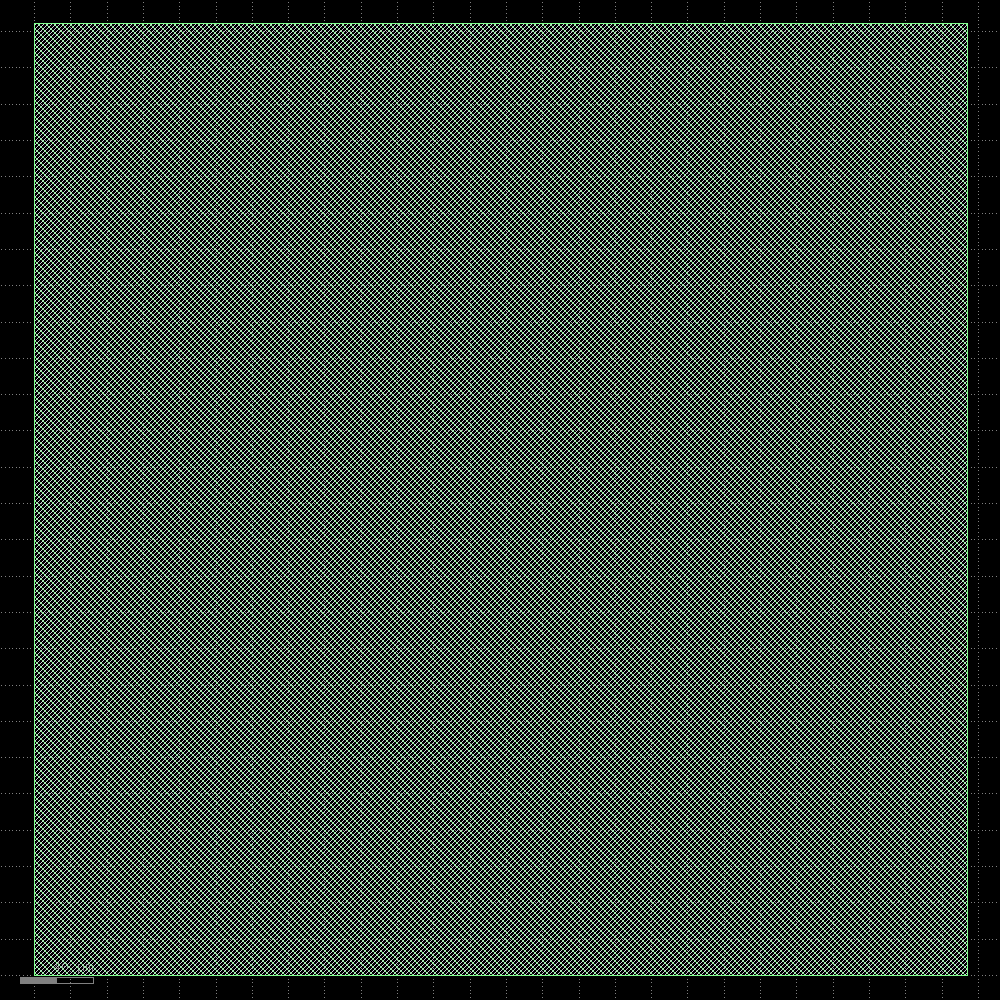

In [14]:
display(floorplan)

### Tap/Endcap Cell Insertion

This places two kinds of cells on the floorplan:

* End cap/boundary cells: Added at the beginning and end of each row. True to
  their name, they "cap off" the core area of a design.
* Tap cells: Placed in a polka dot-ish fashion across the rows. Tap cells
  connect VDD to the nwell and the psubstrate to VSS, which the majority of cells
  do not do themselves to save area- but if you go long enough without one such
  connection you end up with the cell "latching-up"; i.e.; refusing to switch
  back to LO from HI.

  There is a maximum distance between tap cells enforced as part of every
  foundry process.

In [15]:
TapEndcapInsertion = Step.factory.get("OpenROAD.TapEndcapInsertion")

tdi = TapEndcapInsertion(state_in=floorplan.state_out)
tdi.start()

─────────────────────────────────────────────── Tap/Decap Insertion ───────────────────────────────────────────────

[06:43:15] VERBOSE  Running 'OpenROAD.TapEndcapInsertion'…                                             ]8;id=236034;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=173215;file:///content/openlane_ipynb/openlane/steps/step.py#1088\1088]8;;\

[06:43:15] VERBOSE  Logging subprocess to                                                              ]8;id=36219;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=616743;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\
                    ]8;id=18184;file:///content/openlane_run/4-openroad-tapendcapinsertion/openroad-tapendcapinsertion.log\openlane_run/]8;;\]8;id=891488;file:///content/openlane_run/4-openroad-tapendcapinsertion/openroad-tapendcapinsertion.log\4]8;;\]8;id=18184;file:///content/openlane_run/4-openroad-tapendcapinsertion/openroad-tapendcapinsertion.log\-openroad-tapendcapinsertion/openroad-tapendcapinsertion.log]8;;\…                    

Reading OpenROAD database at '/content/openlane_run/3-openroad-floorplan/spm.odb'…

Reading library file at '/root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/lib/sky130_fd_sc_hd__tt_025C_1v80.lib'…

Reading design constraints file at '/content/openlane_ipynb/openlane/scripts/base.sdc'…

[INFO] Using clock clk…

[INFO] Setting output delay to: 20

[INFO] Setting input delay to: 20

[INFO] Setting load to: 0.033442

[INFO] Setting clock uncertainty to: 0.25

[INFO] Setting clock transition to: 0.1499999999999999944488848768742172978818416595458984375

[INFO] Setting timing derate to: 5%

[INFO TAP-0004] Inserted 368 endcaps.

[INFO TAP-0005] Inserted 3534 tapcells.

Setting global connections for newly added cells…

[INFO] Setting global connections...

Writing OpenROAD database to '/content/openlane_run/4-openroad-tapendcapinsertion/spm.odb'…

Writing netlist to '/content/openlane_run/4-openroad-tapendcapinsertion/spm.nl.v'…

Writing powered netlist to '/content/openlane_run/4-openroad-tapendcapinsertion/spm.pnl.v'…

Writing layout to '/content/openlane_run/4-openroad-tapendcapinsertion/spm.def'…

Writing timing constraints to '/content/openlane_run/4-openroad-tapendcapinsertion/spm.sdc'…

Format,Path
nl,openlane_run/4-openroad-tapendcapinsertion/spm.nl.v
pnl,openlane_run/4-openroad-tapendcapinsertion/spm.pnl.v
def,openlane_run/4-openroad-tapendcapinsertion/spm.def
odb,openlane_run/4-openroad-tapendcapinsertion/spm.odb
sdc,openlane_run/4-openroad-tapendcapinsertion/spm.sdc


──────────────────────────────────────────── Render Image (w/ KLayout) ────────────────────────────────────────────

[06:43:19] VERBOSE  Running 'KLayout.Render'…                                                          ]8;id=402311;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=890565;file:///content/openlane_ipynb/openlane/steps/step.py#1088\1088]8;;\

[06:43:19] VERBOSE  Logging subprocess to ]8;id=588980;file:///tmp/openlane_klayout_tmp_p_agw7pk/klayout-render.log\..]8;;\]8;id=179426;file:///tmp/openlane_klayout_tmp_p_agw7pk/klayout-render.log\/tmp/openlane_klayout_tmp_p_agw7pk/]8;;\]8;id=946549;file:///tmp/openlane_klayout_tmp_p_agw7pk/klayout-render.log\klayout-render.log]8;;\…     ]8;id=593529;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=26955;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\

#### Time Elapsed: 1.53s
#### Views updated:
* Verilog Netlist
* Powered Verilog Netlist
* Design Exchange Format
* OpenDB Database
* Design Constraints
#### Preview:
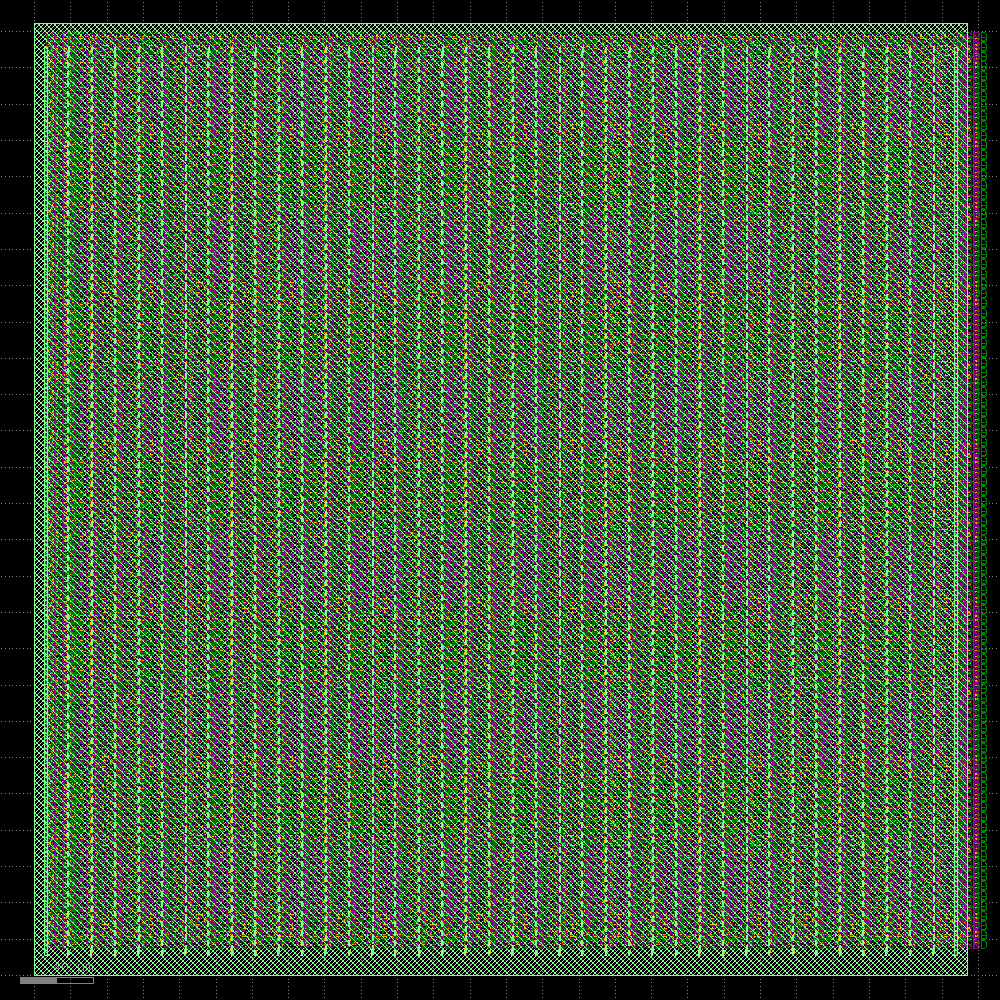

In [16]:
display(tdi)

### I/O Placement

This places metal pins at the edges of the design corresponding to the top level
inputs and outputs for your design. These pins act as the interface with other
designs when you integrate it with other designs.

In [17]:
IOPlacement = Step.factory.get("OpenROAD.IOPlacement")

ioplace = IOPlacement(state_in=tdi.state_out)
ioplace.start()

────────────────────────────────────────────────── I/O Placement ──────────────────────────────────────────────────

[06:43:28] VERBOSE  Running 'OpenROAD.IOPlacement'…                                                    ]8;id=375023;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=629789;file:///content/openlane_ipynb/openlane/steps/step.py#1088\1088]8;;\

[06:43:28] VERBOSE  Logging subprocess to                                                              ]8;id=409208;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=349265;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\
                    ]8;id=546745;file:///content/openlane_run/5-openroad-ioplacement/openroad-ioplacement.log\openlane_run/]8;;\]8;id=795523;file:///content/openlane_run/5-openroad-ioplacement/openroad-ioplacement.log\5]8;;\]8;id=546745;file:///content/openlane_run/5-openroad-ioplacement/openroad-ioplacement.log\-openroad-ioplacement/openroad-ioplacement.log]8;;\…                                  

Reading OpenROAD database at '/content/openlane_run/4-openroad-tapendcapinsertion/spm.odb'…

Reading library file at '/root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/lib/sky130_fd_sc_hd__tt_025C_1v80.lib'…

Reading design constraints file at '/content/openlane_ipynb/openlane/scripts/base.sdc'…

[INFO] Using clock clk…

[INFO] Setting output delay to: 20

[INFO] Setting input delay to: 20

[INFO] Setting load to: 0.033442

[INFO] Setting clock uncertainty to: 0.25

[INFO] Setting clock transition to: 0.1499999999999999944488848768742172978818416595458984375

[INFO] Setting timing derate to: 5%

[INFO] place_pins args: -min_distance 3

Found 0 macro blocks.

[INFO PPL-0010] Tentative 0 to set up sections.

[INFO PPL-0001] Number of slots           630

[INFO PPL-0002] Number of I/O             7

[INFO PPL-0003] Number of I/O w/sink      7

[INFO PPL-0004] Number of I/O w/o sink    0

[INFO PPL-0005] Slots per section         200

[INFO PPL-0006] Slots increase factor     0.01

[INFO PPL-0008] Successfully assigned pins to sections.

[INFO PPL-0012] I/O nets HPWL: 1839.82 um.

Setting global connections for newly added cells…

[INFO] Setting global connections...

Writing OpenROAD database to '/content/openlane_run/5-openroad-ioplacement/spm.odb'…

Writing netlist to '/content/openlane_run/5-openroad-ioplacement/spm.nl.v'…

Writing powered netlist to '/content/openlane_run/5-openroad-ioplacement/spm.pnl.v'…

Writing layout to '/content/openlane_run/5-openroad-ioplacement/spm.def'…

Writing timing constraints to '/content/openlane_run/5-openroad-ioplacement/spm.sdc'…

Format,Path
nl,openlane_run/5-openroad-ioplacement/spm.nl.v
pnl,openlane_run/5-openroad-ioplacement/spm.pnl.v
def,openlane_run/5-openroad-ioplacement/spm.def
odb,openlane_run/5-openroad-ioplacement/spm.odb
sdc,openlane_run/5-openroad-ioplacement/spm.sdc


──────────────────────────────────────────── Render Image (w/ KLayout) ────────────────────────────────────────────

[06:43:35] VERBOSE  Running 'KLayout.Render'…                                                          ]8;id=983004;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=791733;file:///content/openlane_ipynb/openlane/steps/step.py#1088\1088]8;;\

[06:43:35] VERBOSE  Logging subprocess to ]8;id=492159;file:///tmp/openlane_klayout_tmp_1w_zrlry/klayout-render.log\..]8;;\]8;id=564354;file:///tmp/openlane_klayout_tmp_1w_zrlry/klayout-render.log\/tmp/openlane_klayout_tmp_1w_zrlry/]8;;\]8;id=694139;file:///tmp/openlane_klayout_tmp_1w_zrlry/klayout-render.log\klayout-render.log]8;;\…     ]8;id=326294;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=144812;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\

#### Time Elapsed: 1.84s
#### Views updated:
* Verilog Netlist
* Powered Verilog Netlist
* Design Exchange Format
* OpenDB Database
* Design Constraints
#### Preview:
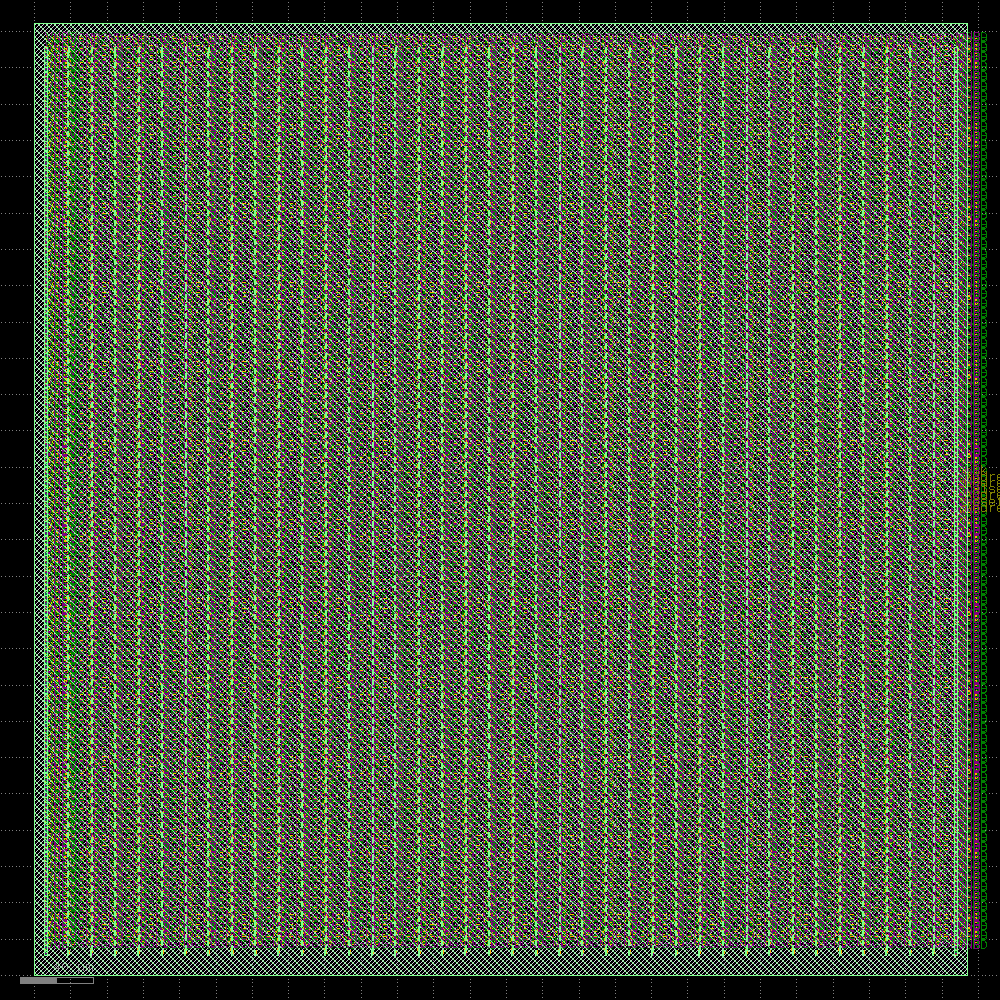

In [18]:
display(ioplace)

### Generating the Power Distribution Network (PDN)

This creates the power distribution network for your design, which is essentially
a plaid pattern of horizontal and vertical "straps" across the design that is
then connected to the rails' VDD and VSS (via the tap cells.)

You can find an explanation of how the power distribution network works at this
link: https://openlane2.readthedocs.io/en/latest/usage/hardening_macros.html#pdn-generation

While we typically don't need to mess with the PDN too much, the SPM is a small
design, so we're going to need to make the plaid pattern formed by the PDN a bit
smaller.

In [19]:
GeneratePDN = Step.factory.get("OpenROAD.GeneratePDN")

pdn = GeneratePDN(
    state_in=ioplace.state_out,
    FP_PDN_VWIDTH=2,
    FP_PDN_HWIDTH=2,
    FP_PDN_VPITCH=30,
    FP_PDN_HPITCH=30,
)
pdn.start()

────────────────────────────────────── Power Distribution Network Generation ──────────────────────────────────────

[06:43:42] VERBOSE  Running 'OpenROAD.GeneratePDN'…                                                    ]8;id=938900;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=676470;file:///content/openlane_ipynb/openlane/steps/step.py#1088\1088]8;;\

[06:43:42] INFO     'FP_PDN_CFG' not explicitly set, setting it to                                 ]8;id=415928;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=857114;file:///content/openlane_ipynb/openlane/steps/openroad.py#1174\1174]8;;\
                    /content/openlane_ipynb/openlane/scripts/openroad/common/pdn_cfg.tcl…                          

[06:43:42] VERBOSE  Logging subprocess to                                                              ]8;id=673651;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=695388;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\
                    ]8;id=572366;file:///content/openlane_run/6-openroad-generatepdn/openroad-generatepdn.log\openlane_run/]8;;\]8;id=143376;file:///content/openlane_run/6-openroad-generatepdn/openroad-generatepdn.log\6]8;;\]8;id=572366;file:///content/openlane_run/6-openroad-generatepdn/openroad-generatepdn.log\-openroad-generatepdn/openroad-generatepdn.log]8;;\…                                  

Reading OpenROAD database at '/content/openlane_run/5-openroad-ioplacement/spm.odb'…

Reading library file at '/root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/lib/sky130_fd_sc_hd__tt_025C_1v80.lib'…

Reading design constraints file at '/content/openlane_ipynb/openlane/scripts/base.sdc'…

[INFO] Using clock clk…

[INFO] Setting output delay to: 20

[INFO] Setting input delay to: 20

[INFO] Setting load to: 0.033442

[INFO] Setting clock uncertainty to: 0.25

[INFO] Setting clock transition to: 0.1499999999999999944488848768742172978818416595458984375

[INFO] Setting timing derate to: 5%

[INFO] Setting global connections...

[INFO PDN-0001] Inserting grid: stdcell_grid

Setting global connections for newly added cells…

[INFO] Setting global connections...

Writing OpenROAD database to '/content/openlane_run/6-openroad-generatepdn/spm.odb'…

Writing netlist to '/content/openlane_run/6-openroad-generatepdn/spm.nl.v'…

Writing powered netlist to '/content/openlane_run/6-openroad-generatepdn/spm.pnl.v'…

Writing layout to '/content/openlane_run/6-openroad-generatepdn/spm.def'…

Writing timing constraints to '/content/openlane_run/6-openroad-generatepdn/spm.sdc'…

[INFO PSM-0040] All shapes on net VPWR are connected.

[INFO PSM-0040] All shapes on net VGND are connected.

Format,Path
nl,openlane_run/6-openroad-generatepdn/spm.nl.v
pnl,openlane_run/6-openroad-generatepdn/spm.pnl.v
def,openlane_run/6-openroad-generatepdn/spm.def
odb,openlane_run/6-openroad-generatepdn/spm.odb
sdc,openlane_run/6-openroad-generatepdn/spm.sdc


──────────────────────────────────────────── Render Image (w/ KLayout) ────────────────────────────────────────────

[06:43:51] VERBOSE  Running 'KLayout.Render'…                                                          ]8;id=926562;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=772318;file:///content/openlane_ipynb/openlane/steps/step.py#1088\1088]8;;\

[06:43:51] VERBOSE  Logging subprocess to ]8;id=248409;file:///tmp/openlane_klayout_tmp_4wnnzzz8/klayout-render.log\..]8;;\]8;id=693134;file:///tmp/openlane_klayout_tmp_4wnnzzz8/klayout-render.log\/tmp/openlane_klayout_tmp_4wnnzzz8/]8;;\]8;id=742775;file:///tmp/openlane_klayout_tmp_4wnnzzz8/klayout-render.log\klayout-render.log]8;;\…     ]8;id=265753;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=586035;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\

#### Time Elapsed: 2.66s
#### Views updated:
* Verilog Netlist
* Powered Verilog Netlist
* Design Exchange Format
* OpenDB Database
* Design Constraints
#### Preview:
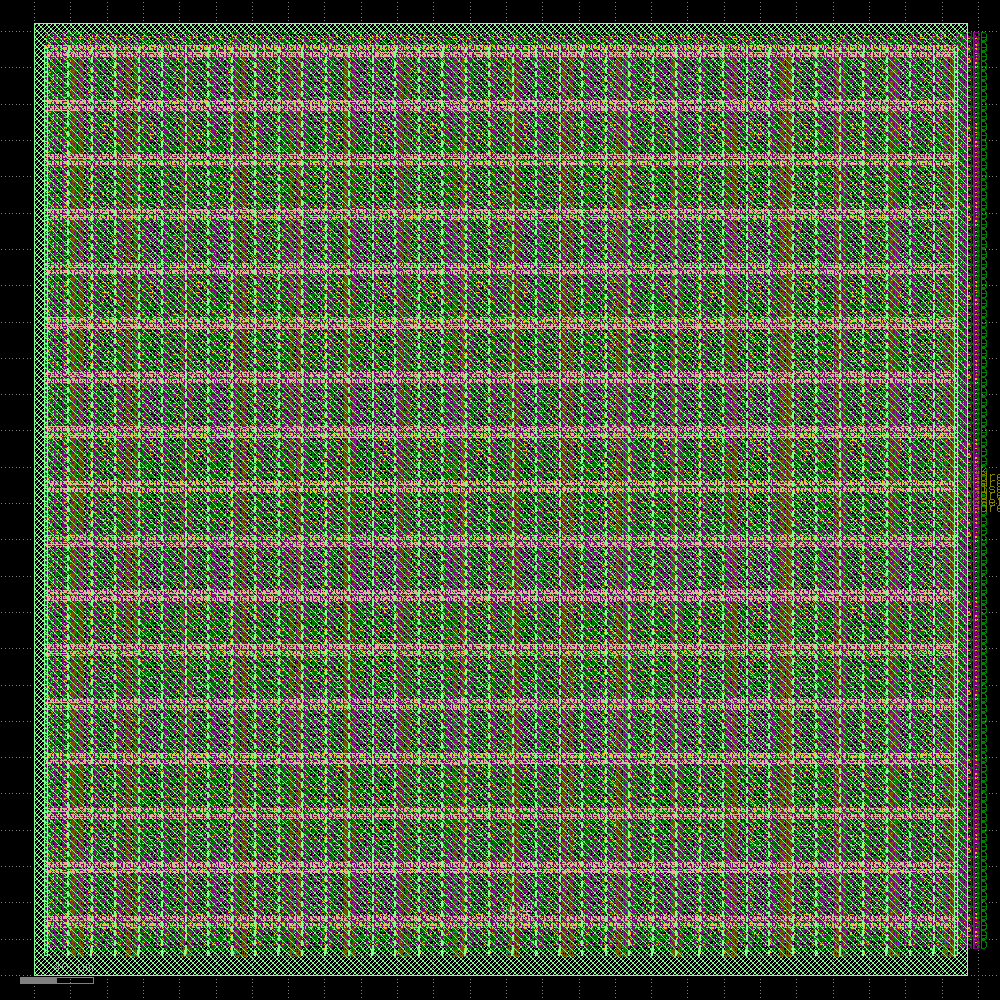

In [20]:
display(pdn)

### Global Placement

Global Placement is deciding on a fuzzy, non-final location for each of the cells,
with the aim of minimizing the distance between cells that are connected
together (more specifically, the total length of the not-yet-created wires that
will connect them).

As you will see in the `.display()` in the second cell below, the placement is
considered "illegal", i.e., not properly aligned with the cell placement grid.
This is addressed by "Detailed Placement", also referred to as "placement
legalization", which is the next step.

In [21]:
GlobalPlacement = Step.factory.get("OpenROAD.GlobalPlacement")

gpl = GlobalPlacement(state_in=pdn.state_out)
gpl.start()

──────────────────────────────────────────────── Global Placement ─────────────────────────────────────────────────

[06:44:00] VERBOSE  Running 'OpenROAD.GlobalPlacement'…                                                ]8;id=53592;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=236960;file:///content/openlane_ipynb/openlane/steps/step.py#1088\1088]8;;\

[06:44:00] INFO     'PL_TARGET_DENSITY_PCT' not explicitly set, using dynamically calculated       ]8;id=502688;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=434723;file:///content/openlane_ipynb/openlane/steps/openroad.py#1260\1260]8;;\
                    target density: 62.013300…                                                                     

[06:44:00] VERBOSE  Logging subprocess to                                                              ]8;id=29486;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=934549;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\
                    ]8;id=196182;file:///content/openlane_run/7-openroad-globalplacement/openroad-globalplacement.log\openlane_run/]8;;\]8;id=218404;file:///content/openlane_run/7-openroad-globalplacement/openroad-globalplacement.log\7]8;;\]8;id=196182;file:///content/openlane_run/7-openroad-globalplacement/openroad-globalplacement.log\-openroad-globalplacement/openroad-globalplacement.log]8;;\…                          

Reading OpenROAD database at '/content/openlane_run/6-openroad-generatepdn/spm.odb'…

Reading library file at '/root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/lib/sky130_fd_sc_hd__tt_025C_1v80.lib'…

Reading design constraints file at '/content/openlane_ipynb/openlane/scripts/base.sdc'…

[INFO] Using clock clk…

[INFO] Setting output delay to: 20

[INFO] Setting input delay to: 20

[INFO] Setting load to: 0.033442

[INFO] Setting clock uncertainty to: 0.25

[INFO] Setting clock transition to: 0.1499999999999999944488848768742172978818416595458984375

[INFO] Setting timing derate to: 5%

[INFO] Setting RC values…

[INFO] Setting signal min routing layer to: met1 and clock min routing layer to met1.

[INFO] Setting signal max routing layer to: met5 and clock max routing layer to met5.

[INFO GPL-0002] DBU: 1000

[INFO GPL-0003] SiteSize: (  0.460  2.720 ) um

[INFO GPL-0004] CoreBBox: (  5.520 10.880 ) ( 508.300 511.360 ) um

[INFO GPL-0006] NumInstances:             13427

[INFO GPL-0007] NumPlaceInstances:         9525

[INFO GPL-0008] NumFixedInstances:         3902

[INFO GPL-0009] NumDummyInstances:            0

[INFO GPL-0010] NumNets:                   9527

[INFO GPL-0011] NumPins:                  35332

[INFO GPL-0012] DieBBox:  (  0.000  0.000 ) ( 513.950 524.670 ) um

[INFO GPL-0013] CoreBBox: (  5.520 10.880 ) ( 508.300 511.360 ) um

[INFO GPL-0016] CoreArea:            251631.334 um^2

[INFO GPL-0017] NonPlaceInstsArea:     5803.066 um^2

[INFO GPL-0018] PlaceInstsArea:      126460.035 um^2

[INFO GPL-0019] Util:                    51.442 %

[INFO GPL-0020] StdInstsArea:        126460.035 um^2

[INFO GPL-0021] MacroInstsArea:           0.000 um^2

[InitialPlace]  Iter: 1 CG residual: 0.00086686 HPWL: 93002250

[InitialPlace]  Iter: 2 CG residual: 0.00156771 HPWL: 95155053

[InitialPlace]  Iter: 3 CG residual: 0.00049195 HPWL: 95867265

[InitialPlace]  Iter: 4 CG residual: 0.00047642 HPWL: 96536497

[InitialPlace]  Iter: 5 CG residual: 0.00046183 HPWL: 96455279

[InitialPlace]  Iter: 6 CG residual: 0.00047848 HPWL: 96617155

[InitialPlace]  Iter: 7 CG residual: 0.00067214 HPWL: 96511161

[InitialPlace]  Iter: 8 CG residual: 0.00042653 HPWL: 96621944

[InitialPlace]  Iter: 9 CG residual: 0.00044967 HPWL: 96485490

[InitialPlace]  Iter: 10 CG residual: 0.00043365 HPWL: 96580234

[InitialPlace]  Iter: 11 CG residual: 0.00053640 HPWL: 96462612

[InitialPlace]  Iter: 12 CG residual: 0.00042926 HPWL: 96580864

[InitialPlace]  Iter: 13 CG residual: 0.00047454 HPWL: 96454355

[InitialPlace]  Iter: 14 CG residual: 0.00046132 HPWL: 96547966

[InitialPlace]  Iter: 15 CG residual: 0.00045727 HPWL: 96437176

[InitialPlace]  Iter: 16 CG residual: 0.00044509 HPWL: 96549548

[InitialPlace]  Iter: 17 CG residual: 0.00048636 HPWL: 96420562

[InitialPlace]  Iter: 18 CG residual: 0.00045117 HPWL: 96534535

[InitialPlace]  Iter: 19 CG residual: 0.00047144 HPWL: 96400737

[InitialPlace]  Iter: 20 CG residual: 0.00051859 HPWL: 96506545

[INFO GPL-0031] FillerInit:NumGCells:     11472

[INFO GPL-0032] FillerInit:NumGNets:       9527

[INFO GPL-0033] FillerInit:NumGPins:      35332

[INFO GPL-0023] TargetDensity:            0.620

[INFO GPL-0024] AvrgPlaceInstArea:       13.277 um^2

[INFO GPL-0025] IdealBinArea:            21.409 um^2

[INFO GPL-0026] IdealBinCnt:              11753

[INFO GPL-0027] TotalBinArea:        251631.334 um^2

[INFO GPL-0028] BinCnt:        64     64

[INFO GPL-0029] BinSize: (  7.856  7.820 )

[INFO GPL-0030] NumBins: 4096

[NesterovSolve] Iter:    1 overflow: 0.996 HPWL: 24382732

[NesterovSolve] Iter:   10 overflow: 0.995 HPWL: 20895724

[NesterovSolve] Iter:   20 overflow: 0.995 HPWL: 20944164

[NesterovSolve] Iter:   30 overflow: 0.995 HPWL: 21040483

[NesterovSolve] Iter:   40 overflow: 0.995 HPWL: 21143997

[NesterovSolve] Iter:   50 overflow: 0.994 HPWL: 21208461

[NesterovSolve] Iter:   60 overflow: 0.994 HPWL: 21266766

[NesterovSolve] Iter:   70 overflow: 0.994 HPWL: 21308400

[NesterovSolve] Iter:   80 overflow: 0.995 HPWL: 21327853

[NesterovSolve] Iter:   90 overflow: 0.994 HPWL: 21329042

[NesterovSolve] Iter:  100 overflow: 0.994 HPWL: 21322712

[NesterovSolve] Iter:  110 overflow: 0.994 HPWL: 21340290

[NesterovSolve] Iter:  120 overflow: 0.994 HPWL: 21412099

[NesterovSolve] Iter:  130 overflow: 0.993 HPWL: 21663896

[NesterovSolve] Iter:  140 overflow: 0.993 HPWL: 22369385

[NesterovSolve] Iter:  150 overflow: 0.992 HPWL: 23766387

[NesterovSolve] Iter:  160 overflow: 0.990 HPWL: 26195974

[NesterovSolve] Iter:  170 overflow: 0.987 HPWL: 30221052

[NesterovSolve] Iter:  180 overflow: 0.978 HPWL: 37618398

[NesterovSolve] Iter:  190 overflow: 0.965 HPWL: 46671459

[NesterovSolve] Iter:  200 overflow: 0.951 HPWL: 55938511

[NesterovSolve] Iter:  210 overflow: 0.933 HPWL: 66096898

[NesterovSolve] Iter:  220 overflow: 0.910 HPWL: 77065824

[NesterovSolve] Iter:  230 overflow: 0.882 HPWL: 88415712

[NesterovSolve] Iter:  240 overflow: 0.850 HPWL: 101101113

[NesterovSolve] Iter:  250 overflow: 0.812 HPWL: 115306469

[INFO GPL-0100] worst slack 5.08e-08

[INFO GPL-0103] Weighted 952 nets.

[NesterovSolve] Iter:  260 overflow: 0.774 HPWL: 127752428

[NesterovSolve] Iter:  270 overflow: 0.748 HPWL: 139751931

[NesterovSolve] Iter:  280 overflow: 0.692 HPWL: 150887939

[NesterovSolve] Iter:  290 overflow: 0.633 HPWL: 158875578

[INFO GPL-0100] worst slack 4.97e-08

[INFO GPL-0103] Weighted 952 nets.

[NesterovSolve] Snapshot saved at iter = 296

[NesterovSolve] Iter:  300 overflow: 0.586 HPWL: 165433387

[NesterovSolve] Iter:  310 overflow: 0.535 HPWL: 173012057

[NesterovSolve] Iter:  320 overflow: 0.484 HPWL: 176377262

[INFO GPL-0100] worst slack 4.91e-08

[INFO GPL-0103] Weighted 952 nets.

[NesterovSolve] Iter:  330 overflow: 0.440 HPWL: 178374794

[NesterovSolve] Iter:  340 overflow: 0.393 HPWL: 175113166

[NesterovSolve] Iter:  350 overflow: 0.352 HPWL: 173986435

[NesterovSolve] Iter:  360 overflow: 0.316 HPWL: 173425146

[NesterovSolve] Iter:  370 overflow: 0.284 HPWL: 171532661

[INFO GPL-0100] worst slack 4.78e-08

[INFO GPL-0103] Weighted 952 nets.

[NesterovSolve] Iter:  380 overflow: 0.252 HPWL: 171075199

[NesterovSolve] Iter:  390 overflow: 0.223 HPWL: 170004397

[INFO GPL-0100] worst slack 4.76e-08

[INFO GPL-0103] Weighted 952 nets.

[NesterovSolve] Iter:  400 overflow: 0.198 HPWL: 169788107

[INFO GPL-0075] Routability numCall: 1 inflationIterCnt: 1 bloatIterCnt: 0

[INFO GPL-0036] TileBBox: (    0    0 ) ( 6900 6900 ) DBU

[INFO GPL-0038] TileCnt:      74   76

[INFO GPL-0039] numRoutingLayers: 6

[INFO GPL-0040] NumTiles: 5624

[INFO GPL-0063] TotalRouteOverflowH2: 4.950000524520874

[INFO GPL-0064] TotalRouteOverflowV2: 5.100001215934753

[INFO GPL-0065] OverflowTileCnt2: 69

[INFO GPL-0066] 0.5%RC: 1.0981

[INFO GPL-0067] 1.0%RC: 1.0495

[INFO GPL-0068] 2.0%RC: 1.0249

[INFO GPL-0069] 5.0%RC: 1.0044

[INFO GPL-0070] 0.5rcK: 1

[INFO GPL-0071] 1.0rcK: 1

[INFO GPL-0072] 2.0rcK: 0

[INFO GPL-0073] 5.0rcK: 0

[INFO GPL-0074] FinalRC: 1.0738

[INFO GPL-0078] FinalRC lower than minRC (1e+30), min RC updated.

[INFO GPL-0045] InflatedAreaDelta:     2953.347 um^2

[INFO GPL-0046] TargetDensity:            0.620

[INFO GPL-0049] WhiteSpaceArea:      245828.269 um^2

[INFO GPL-0050] NesterovInstsArea:   126460.035 um^2

[INFO GPL-0051] TotalFillerArea:      25986.187 um^2

[INFO GPL-0052] TotalGCellsArea:     152446.222 um^2

[INFO GPL-0053] ExpectedGCellsArea:  155399.569 um^2

[INFO GPL-0054] NewTargetDensity:         0.632

[INFO GPL-0055] NewWhiteSpaceArea:   245828.269 um^2

[INFO GPL-0056] MovableArea:         155399.569 um^2

[INFO GPL-0057] NewNesterovInstArea: 129413.382 um^2

[INFO GPL-0058] NewTotalFillerArea:   25986.188 um^2

[INFO GPL-0059] NewTotalGCellsArea:  155399.569 um^2

[NesterovSolve] Revert back to snapshot coordi

[NesterovSolve] Iter:  410 overflow: 0.550 HPWL: 171360017

[NesterovSolve] Iter:  420 overflow: 0.511 HPWL: 174795964

[NesterovSolve] Iter:  430 overflow: 0.477 HPWL: 175980125

[NesterovSolve] Iter:  440 overflow: 0.438 HPWL: 175361643

[NesterovSolve] Iter:  450 overflow: 0.409 HPWL: 174123897

[NesterovSolve] Iter:  460 overflow: 0.373 HPWL: 172590098

[NesterovSolve] Iter:  470 overflow: 0.329 HPWL: 172399251

[NesterovSolve] Iter:  480 overflow: 0.307 HPWL: 170904276

[NesterovSolve] Iter:  490 overflow: 0.271 HPWL: 170612290

[NesterovSolve] Iter:  500 overflow: 0.244 HPWL: 170041264

[NesterovSolve] Iter:  510 overflow: 0.215 HPWL: 169833158

[INFO GPL-0075] Routability numCall: 2 inflationIterCnt: 2 bloatIterCnt: 0

[INFO GPL-0036] TileBBox: (    0    0 ) ( 6900 6900 ) DBU

[INFO GPL-0038] TileCnt:      74   76

[INFO GPL-0039] numRoutingLayers: 6

[INFO GPL-0040] NumTiles: 5624

[INFO GPL-0063] TotalRouteOverflowH2: 2.100000500679016

[INFO GPL-0064] TotalRouteOverflowV2: 4.600000977516174

[INFO GPL-0065] OverflowTileCnt2: 56

[INFO GPL-0066] 0.5%RC: 1.0885

[INFO GPL-0067] 1.0%RC: 1.0447

[INFO GPL-0068] 2.0%RC: 1.0224

[INFO GPL-0069] 5.0%RC: 0.9981

[INFO GPL-0070] 0.5rcK: 1

[INFO GPL-0071] 1.0rcK: 1

[INFO GPL-0072] 2.0rcK: 0

[INFO GPL-0073] 5.0rcK: 0

[INFO GPL-0074] FinalRC: 1.0666

[INFO GPL-0078] FinalRC lower than minRC (1.0737958), min RC updated.

[INFO GPL-0045] InflatedAreaDelta:     1678.830 um^2

[INFO GPL-0046] TargetDensity:            0.632

[INFO GPL-0049] WhiteSpaceArea:      245828.269 um^2

[INFO GPL-0050] NesterovInstsArea:   129413.382 um^2

[INFO GPL-0051] TotalFillerArea:      25986.188 um^2

[INFO GPL-0052] TotalGCellsArea:     155399.569 um^2

[INFO GPL-0053] ExpectedGCellsArea:  157078.400 um^2

[INFO GPL-0054] NewTargetDensity:         0.639

[INFO GPL-0055] NewWhiteSpaceArea:   245828.269 um^2

[INFO GPL-0056] MovableArea:         157078.405 um^2

[INFO GPL-0057] NewNesterovInstArea: 131092.212 um^2

[INFO GPL-0058] NewTotalFillerArea:   25986.193 um^2

[INFO GPL-0059] NewTotalGCellsArea:  157078.405 um^2

[NesterovSolve] Revert back to snapshot coordi

[NesterovSolve] Iter:  520 overflow: 0.588 HPWL: 166163580

[NesterovSolve] Iter:  530 overflow: 0.538 HPWL: 173677476

[NesterovSolve] Iter:  540 overflow: 0.498 HPWL: 175341533

[NesterovSolve] Iter:  550 overflow: 0.469 HPWL: 177913013

[NesterovSolve] Iter:  560 overflow: 0.431 HPWL: 175336023

[NesterovSolve] Iter:  570 overflow: 0.394 HPWL: 174302060

[NesterovSolve] Iter:  580 overflow: 0.361 HPWL: 173990084

[NesterovSolve] Iter:  590 overflow: 0.325 HPWL: 172095899

[NesterovSolve] Iter:  600 overflow: 0.299 HPWL: 170972207

[NesterovSolve] Iter:  610 overflow: 0.263 HPWL: 171004305

[NesterovSolve] Iter:  620 overflow: 0.238 HPWL: 170113750

[NesterovSolve] Iter:  630 overflow: 0.208 HPWL: 170089941

[INFO GPL-0075] Routability numCall: 3 inflationIterCnt: 3 bloatIterCnt: 0

[INFO GPL-0036] TileBBox: (    0    0 ) ( 6900 6900 ) DBU

[INFO GPL-0038] TileCnt:      74   76

[INFO GPL-0039] numRoutingLayers: 6

[INFO GPL-0040] NumTiles: 5624

[INFO GPL-0063] TotalRouteOverflowH2: 3.1500004529953003

[INFO GPL-0064] TotalRouteOverflowV2: 2.9000006914138794

[INFO GPL-0065] OverflowTileCnt2: 49

[INFO GPL-0066] 0.5%RC: 1.0558

[INFO GPL-0067] 1.0%RC: 1.0282

[INFO GPL-0068] 2.0%RC: 1.0141

[INFO GPL-0069] 5.0%RC: 1.0041

[INFO GPL-0070] 0.5rcK: 1

[INFO GPL-0071] 1.0rcK: 1

[INFO GPL-0072] 2.0rcK: 0

[INFO GPL-0073] 5.0rcK: 0

[INFO GPL-0074] FinalRC: 1.0420

[INFO GPL-0078] FinalRC lower than minRC (1.0665609), min RC updated.

[INFO GPL-0045] InflatedAreaDelta:     2205.677 um^2

[INFO GPL-0046] TargetDensity:            0.639

[INFO GPL-0049] WhiteSpaceArea:      245828.269 um^2

[INFO GPL-0050] NesterovInstsArea:   131092.212 um^2

[INFO GPL-0051] TotalFillerArea:      25986.193 um^2

[INFO GPL-0052] TotalGCellsArea:     157078.405 um^2

[INFO GPL-0053] ExpectedGCellsArea:  159284.082 um^2

[INFO GPL-0054] NewTargetDensity:         0.648

[INFO GPL-0055] NewWhiteSpaceArea:   245828.269 um^2

[INFO GPL-0056] MovableArea:         159284.085 um^2

[INFO GPL-0057] NewNesterovInstArea: 133297.889 um^2

[INFO GPL-0058] NewTotalFillerArea:   25986.196 um^2

[INFO GPL-0059] NewTotalGCellsArea:  159284.085 um^2

[NesterovSolve] Revert back to snapshot coordi

[NesterovSolve] Iter:  640 overflow: 0.568 HPWL: 170378666

[NesterovSolve] Iter:  650 overflow: 0.523 HPWL: 175548329

[NesterovSolve] Iter:  660 overflow: 0.485 HPWL: 176309298

[NesterovSolve] Iter:  670 overflow: 0.452 HPWL: 177985058

[NesterovSolve] Iter:  680 overflow: 0.415 HPWL: 175845028

[NesterovSolve] Iter:  690 overflow: 0.382 HPWL: 174234219

[NesterovSolve] Iter:  700 overflow: 0.345 HPWL: 173706153

[NesterovSolve] Iter:  710 overflow: 0.313 HPWL: 172499051

[NesterovSolve] Iter:  720 overflow: 0.286 HPWL: 172137008

[NesterovSolve] Iter:  730 overflow: 0.252 HPWL: 171237735

[NesterovSolve] Iter:  740 overflow: 0.223 HPWL: 170978255

[NesterovSolve] Iter:  750 overflow: 0.199 HPWL: 171035639

[INFO GPL-0075] Routability numCall: 4 inflationIterCnt: 4 bloatIterCnt: 0

[INFO GPL-0036] TileBBox: (    0    0 ) ( 6900 6900 ) DBU

[INFO GPL-0038] TileCnt:      74   76

[INFO GPL-0039] numRoutingLayers: 6

[INFO GPL-0040] NumTiles: 5624

[INFO GPL-0063] TotalRouteOverflowH2: 3.500000476837158

[INFO GPL-0064] TotalRouteOverflowV2: 3.733333945274353

[INFO GPL-0065] OverflowTileCnt2: 44

[INFO GPL-0066] 0.5%RC: 1.0718

[INFO GPL-0067] 1.0%RC: 1.0362

[INFO GPL-0068] 2.0%RC: 1.0182

[INFO GPL-0069] 5.0%RC: 0.9951

[INFO GPL-0070] 0.5rcK: 1

[INFO GPL-0071] 1.0rcK: 1

[INFO GPL-0072] 2.0rcK: 0

[INFO GPL-0073] 5.0rcK: 0

[INFO GPL-0074] FinalRC: 1.0540

[INFO GPL-0079] MinRC (1.0419623) violation occurred, total count: 1.

[INFO GPL-0045] InflatedAreaDelta:     2787.338 um^2

[INFO GPL-0046] TargetDensity:            0.648

[INFO GPL-0049] WhiteSpaceArea:      245828.269 um^2

[INFO GPL-0050] NesterovInstsArea:   133297.889 um^2

[INFO GPL-0051] TotalFillerArea:      25986.196 um^2

[INFO GPL-0052] TotalGCellsArea:     159284.085 um^2

[INFO GPL-0053] ExpectedGCellsArea:  162071.423 um^2

[INFO GPL-0054] NewTargetDensity:         0.659

[INFO GPL-0055] NewWhiteSpaceArea:   245828.269 um^2

[INFO GPL-0056] MovableArea:         162071.429 um^2

[INFO GPL-0057] NewNesterovInstArea: 136085.227 um^2

[INFO GPL-0058] NewTotalFillerArea:   25986.202 um^2

[INFO GPL-0059] NewTotalGCellsArea:  162071.429 um^2

[NesterovSolve] Revert back to snapshot coordi

[NesterovSolve] Iter:  760 overflow: 0.536 HPWL: 174648500

[NesterovSolve] Iter:  770 overflow: 0.507 HPWL: 176700518

[NesterovSolve] Iter:  780 overflow: 0.473 HPWL: 176785152

[NesterovSolve] Iter:  790 overflow: 0.430 HPWL: 176793072

[NesterovSolve] Iter:  800 overflow: 0.405 HPWL: 175454470

[NesterovSolve] Iter:  810 overflow: 0.368 HPWL: 174720899

[NesterovSolve] Iter:  820 overflow: 0.335 HPWL: 173206853

[NesterovSolve] Iter:  830 overflow: 0.299 HPWL: 172125693

[NesterovSolve] Iter:  840 overflow: 0.268 HPWL: 171999271

[NesterovSolve] Iter:  850 overflow: 0.240 HPWL: 171398508

[NesterovSolve] Iter:  860 overflow: 0.212 HPWL: 170946714

[INFO GPL-0075] Routability numCall: 5 inflationIterCnt: 0 bloatIterCnt: 1

[INFO GPL-0036] TileBBox: (    0    0 ) ( 6900 6900 ) DBU

[INFO GPL-0038] TileCnt:      74   76

[INFO GPL-0039] numRoutingLayers: 6

[INFO GPL-0040] NumTiles: 5624

[INFO GPL-0063] TotalRouteOverflowH2: 5.700000643730164

[INFO GPL-0064] TotalRouteOverflowV2: 4.900001287460327

[INFO GPL-0065] OverflowTileCnt2: 72

[INFO GPL-0066] 0.5%RC: 1.0942

[INFO GPL-0067] 1.0%RC: 1.0476

[INFO GPL-0068] 2.0%RC: 1.0239

[INFO GPL-0069] 5.0%RC: 1.0075

[INFO GPL-0070] 0.5rcK: 1

[INFO GPL-0071] 1.0rcK: 1

[INFO GPL-0072] 2.0rcK: 0

[INFO GPL-0073] 5.0rcK: 0

[INFO GPL-0074] FinalRC: 1.0709

[INFO GPL-0079] MinRC (1.0419623) violation occurred, total count: 2.

[INFO GPL-0045] InflatedAreaDelta:     3404.332 um^2

[INFO GPL-0046] TargetDensity:            0.659

[INFO GPL-0049] WhiteSpaceArea:      245828.269 um^2

[INFO GPL-0050] NesterovInstsArea:   136085.227 um^2

[INFO GPL-0051] TotalFillerArea:      25986.202 um^2

[INFO GPL-0052] TotalGCellsArea:     162071.429 um^2

[INFO GPL-0053] ExpectedGCellsArea:  165475.761 um^2

[INFO GPL-0054] NewTargetDensity:         0.673

[INFO GPL-0055] NewWhiteSpaceArea:   245828.269 um^2

[INFO GPL-0056] MovableArea:         165475.762 um^2

[INFO GPL-0057] NewNesterovInstArea: 139489.558 um^2

[INFO GPL-0058] NewTotalFillerArea:   25986.204 um^2

[INFO GPL-0059] NewTotalGCellsArea:  165475.762 um^2

[NesterovSolve] Revert back to snapshot coordi

[NesterovSolve] Iter:  870 overflow: 0.569 HPWL: 172223090

[NesterovSolve] Iter:  880 overflow: 0.518 HPWL: 176280213

[NesterovSolve] Iter:  890 overflow: 0.483 HPWL: 177341479

[NesterovSolve] Iter:  900 overflow: 0.446 HPWL: 179321476

[NesterovSolve] Iter:  910 overflow: 0.416 HPWL: 176341149

[NesterovSolve] Iter:  920 overflow: 0.381 HPWL: 175842813

[NesterovSolve] Iter:  930 overflow: 0.347 HPWL: 174900714

[NesterovSolve] Iter:  940 overflow: 0.314 HPWL: 173323663

[NesterovSolve] Iter:  950 overflow: 0.287 HPWL: 172477641

[NesterovSolve] Iter:  960 overflow: 0.255 HPWL: 172159872

[NesterovSolve] Iter:  970 overflow: 0.226 HPWL: 171251165

[NesterovSolve] Iter:  980 overflow: 0.198 HPWL: 171178127

[INFO GPL-0075] Routability numCall: 6 inflationIterCnt: 1 bloatIterCnt: 1

[INFO GPL-0036] TileBBox: (    0    0 ) ( 6900 6900 ) DBU

[INFO GPL-0038] TileCnt:      74   76

[INFO GPL-0039] numRoutingLayers: 6

[INFO GPL-0040] NumTiles: 5624

[INFO GPL-0063] TotalRouteOverflowH2: 2.4000004529953003

[INFO GPL-0064] TotalRouteOverflowV2: 4.8666672706604

[INFO GPL-0065] OverflowTileCnt2: 56

[INFO GPL-0066] 0.5%RC: 1.0936

[INFO GPL-0067] 1.0%RC: 1.0472

[INFO GPL-0068] 2.0%RC: 1.0237

[INFO GPL-0069] 5.0%RC: 1.0005

[INFO GPL-0070] 0.5rcK: 1

[INFO GPL-0071] 1.0rcK: 1

[INFO GPL-0072] 2.0rcK: 0

[INFO GPL-0073] 5.0rcK: 0

[INFO GPL-0074] FinalRC: 1.0704

[INFO GPL-0079] MinRC (1.0419623) violation occurred, total count: 3.

[INFO GPL-0045] InflatedAreaDelta:     2012.045 um^2

[INFO GPL-0046] TargetDensity:            0.673

Revert Routability Procedure. Target density higher than max, or minRC max violations.

[INFO GPL-0080] minRcViolatedCnt: 3

[INFO GPL-0047] SavedMinRC: 1.0420

[INFO GPL-0048] SavedTargetDensity: 0.6390

[NesterovSolve] Revert back to snapshot coordi

[NesterovSolve] Iter:  990 overflow: 0.536 HPWL: 166798593

[NesterovSolve] Iter: 1000 overflow: 0.493 HPWL: 172121957

[NesterovSolve] Iter: 1010 overflow: 0.461 HPWL: 173988694

[NesterovSolve] Iter: 1020 overflow: 0.423 HPWL: 173780722

[NesterovSolve] Iter: 1030 overflow: 0.391 HPWL: 172088480

[NesterovSolve] Iter: 1040 overflow: 0.356 HPWL: 171257486

[NesterovSolve] Iter: 1050 overflow: 0.325 HPWL: 171357195

[NesterovSolve] Iter: 1060 overflow: 0.295 HPWL: 170075316

[NesterovSolve] Iter: 1070 overflow: 0.264 HPWL: 170359766

[NesterovSolve] Iter: 1080 overflow: 0.233 HPWL: 169302548

[NesterovSolve] Iter: 1090 overflow: 0.206 HPWL: 169422493

[NesterovSolve] Iter: 1100 overflow: 0.181 HPWL: 169271073

[NesterovSolve] Iter: 1110 overflow: 0.156 HPWL: 169237973

[INFO GPL-0100] worst slack 4.77e-08

[INFO GPL-0103] Weighted 952 nets.

[NesterovSolve] Iter: 1120 overflow: 0.141 HPWL: 169453554

[NesterovSolve] Iter: 1130 overflow: 0.118 HPWL: 169827301

[NesterovSolve] Iter: 1140 overflow: 0.101 HPWL: 170184881

[NesterovSolve] Finished with Overflow: 0.099122

[INFO] Setting RC values…

Setting global connections for newly added cells…

[INFO] Setting global connections...

Writing OpenROAD database to '/content/openlane_run/7-openroad-globalplacement/spm.odb'…

Writing netlist to '/content/openlane_run/7-openroad-globalplacement/spm.nl.v'…

Writing powered netlist to '/content/openlane_run/7-openroad-globalplacement/spm.pnl.v'…

Writing layout to '/content/openlane_run/7-openroad-globalplacement/spm.def'…

Writing timing constraints to '/content/openlane_run/7-openroad-globalplacement/spm.sdc'…

Format,Path
nl,openlane_run/7-openroad-globalplacement/spm.nl.v
pnl,openlane_run/7-openroad-globalplacement/spm.pnl.v
def,openlane_run/7-openroad-globalplacement/spm.def
odb,openlane_run/7-openroad-globalplacement/spm.odb
sdc,openlane_run/7-openroad-globalplacement/spm.sdc


──────────────────────────────────────────── Render Image (w/ KLayout) ────────────────────────────────────────────

[06:45:19] VERBOSE  Running 'KLayout.Render'…                                                          ]8;id=230154;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=424045;file:///content/openlane_ipynb/openlane/steps/step.py#1088\1088]8;;\

[06:45:19] VERBOSE  Logging subprocess to ]8;id=921469;file:///tmp/openlane_klayout_tmp_5mt4dput/klayout-render.log\..]8;;\]8;id=694148;file:///tmp/openlane_klayout_tmp_5mt4dput/klayout-render.log\/tmp/openlane_klayout_tmp_5mt4dput/]8;;\]8;id=179316;file:///tmp/openlane_klayout_tmp_5mt4dput/klayout-render.log\klayout-render.log]8;;\…     ]8;id=987578;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=197355;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\

#### Time Elapsed: 60.68s
#### Views updated:
* Verilog Netlist
* Powered Verilog Netlist
* Design Exchange Format
* OpenDB Database
* Design Constraints
#### Preview:
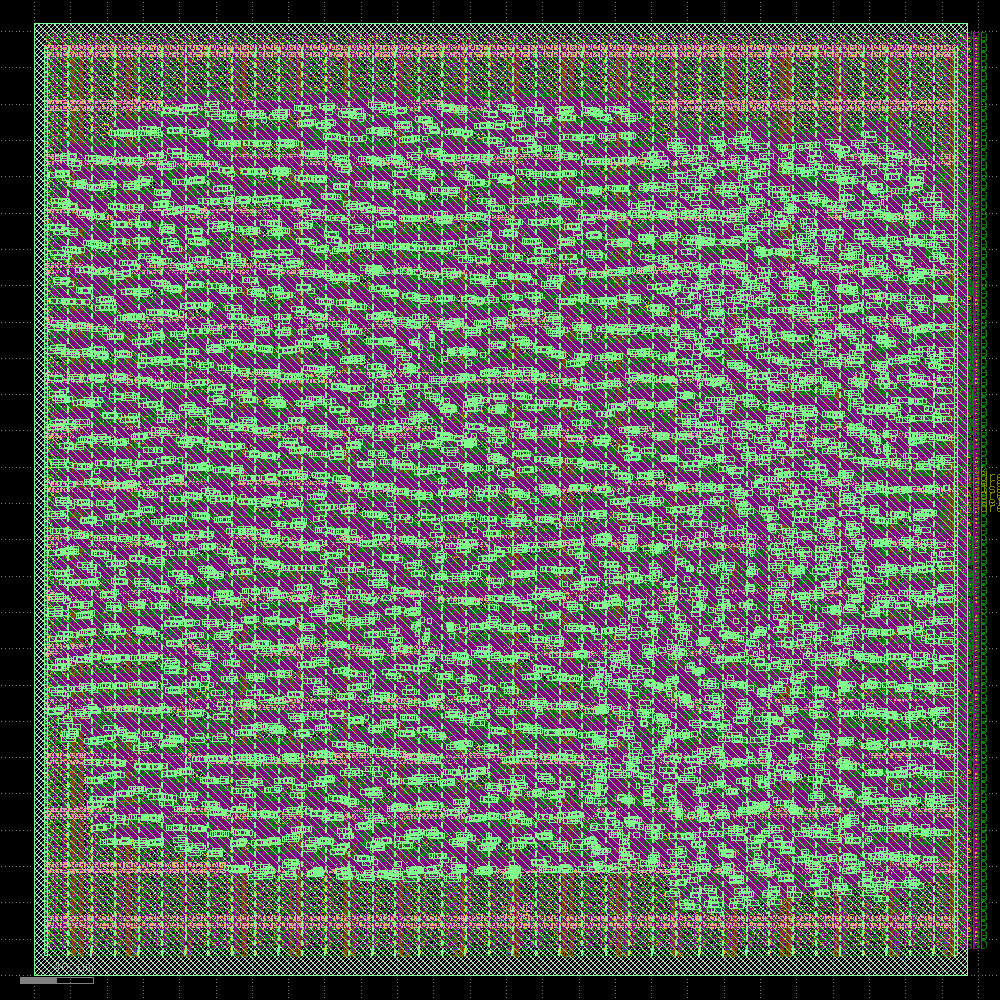

In [22]:
display(gpl)

### Detailed Placement

This aligns the fuzzy placement from before with the grid, "legalizing" it.

In [23]:
DetailedPlacement = Step.factory.get("OpenROAD.DetailedPlacement")

dpl = DetailedPlacement(state_in=gpl.state_out)
dpl.start()

─────────────────────────────────────────────── Detailed Placement ────────────────────────────────────────────────

[06:45:28] VERBOSE  Running 'OpenROAD.DetailedPlacement'…                                              ]8;id=44895;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=33932;file:///content/openlane_ipynb/openlane/steps/step.py#1088\1088]8;;\

[06:45:28] VERBOSE  Logging subprocess to                                                              ]8;id=252250;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=42403;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\
                    ]8;id=614690;file:///content/openlane_run/8-openroad-detailedplacement/openroad-detailedplacement.log\openlane_run/]8;;\]8;id=420235;file:///content/openlane_run/8-openroad-detailedplacement/openroad-detailedplacement.log\8]8;;\]8;id=614690;file:///content/openlane_run/8-openroad-detailedplacement/openroad-detailedplacement.log\-openroad-detailedplacement/openroad-detailedplacement.log]8;;\…                      

Reading OpenROAD database at '/content/openlane_run/7-openroad-globalplacement/spm.odb'…

Reading library file at '/root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/lib/sky130_fd_sc_hd__tt_025C_1v80.lib'…

Reading design constraints file at '/content/openlane_ipynb/openlane/scripts/base.sdc'…

[INFO] Using clock clk…

[INFO] Setting output delay to: 20

[INFO] Setting input delay to: 20

[INFO] Setting load to: 0.033442

[INFO] Setting clock uncertainty to: 0.25

[INFO] Setting clock transition to: 0.1499999999999999944488848768742172978818416595458984375

[INFO] Setting timing derate to: 5%

Placement Analysis

---------------------------------

total displacement      35208.1 u

average displacement        2.6 u

max displacement           12.1 u

original HPWL          169795.4 u

legalized HPWL         212154.7 u

delta HPWL                   25 %

[INFO DPL-0020] Mirrored 2241 instances

[INFO DPL-0021] HPWL before          212154.7 u

[INFO DPL-0022] HPWL after           207704.6 u

[INFO DPL-0023] HPWL delta               -2.1 %

Setting global connections for newly added cells…

[INFO] Setting global connections...

Writing OpenROAD database to '/content/openlane_run/8-openroad-detailedplacement/spm.odb'…

Writing netlist to '/content/openlane_run/8-openroad-detailedplacement/spm.nl.v'…

Writing powered netlist to '/content/openlane_run/8-openroad-detailedplacement/spm.pnl.v'…

Writing layout to '/content/openlane_run/8-openroad-detailedplacement/spm.def'…

Writing timing constraints to '/content/openlane_run/8-openroad-detailedplacement/spm.sdc'…

Format,Path
nl,openlane_run/8-openroad-detailedplacement/spm.nl.v
pnl,openlane_run/8-openroad-detailedplacement/spm.pnl.v
def,openlane_run/8-openroad-detailedplacement/spm.def
odb,openlane_run/8-openroad-detailedplacement/spm.odb
sdc,openlane_run/8-openroad-detailedplacement/spm.sdc


──────────────────────────────────────────── Render Image (w/ KLayout) ────────────────────────────────────────────

[06:45:35] VERBOSE  Running 'KLayout.Render'…                                                          ]8;id=785096;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=669370;file:///content/openlane_ipynb/openlane/steps/step.py#1088\1088]8;;\

[06:45:35] VERBOSE  Logging subprocess to ]8;id=483139;file:///tmp/openlane_klayout_tmp_20x0mzv5/klayout-render.log\..]8;;\]8;id=58194;file:///tmp/openlane_klayout_tmp_20x0mzv5/klayout-render.log\/tmp/openlane_klayout_tmp_20x0mzv5/]8;;\]8;id=284836;file:///tmp/openlane_klayout_tmp_20x0mzv5/klayout-render.log\klayout-render.log]8;;\…     ]8;id=241001;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=285262;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\

#### Time Elapsed: 2.34s
#### Views updated:
* Verilog Netlist
* Powered Verilog Netlist
* Design Exchange Format
* OpenDB Database
* Design Constraints
#### Preview:
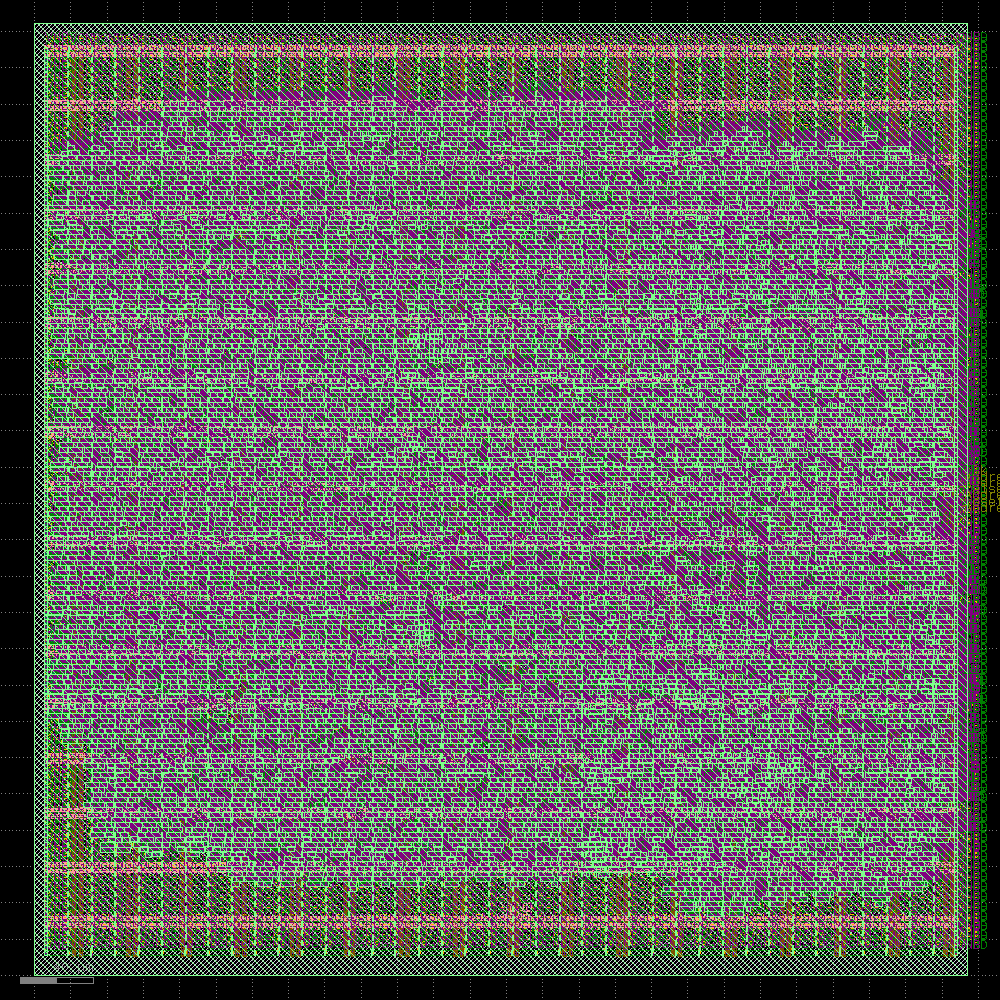

In [24]:
display(dpl)

### Clock Tree Synthesis (CTS)

With the cells now having a final placement, we can go ahead and create what
is known as the clock tree, i.e., the hierarchical set of buffers used
for clock signal to minimize what is known as "clock skew"- variable delay
of the clock cycle from register to register because of factors such as metal
wire length, clock load (number of gates connected to the same clock buffer,)
et cetera.

The CTS step creates the cells and places the between the gaps in the detailed
placement above.

In [25]:
CTS = Step.factory.get("OpenROAD.CTS")

cts = CTS(state_in=dpl.state_out)
cts.start()

────────────────────────────────────────────── Clock Tree Synthesis ───────────────────────────────────────────────

[06:45:43] VERBOSE  Running 'OpenROAD.CTS'…                                                            ]8;id=832642;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=718070;file:///content/openlane_ipynb/openlane/steps/step.py#1088\1088]8;;\

[06:45:43] VERBOSE  Logging subprocess to ]8;id=262187;file:///content/openlane_run/9-openroad-cts/openroad-cts.log\openlane_run/]8;;\]8;id=313114;file:///content/openlane_run/9-openroad-cts/openroad-cts.log\9]8;;\]8;id=262187;file:///content/openlane_run/9-openroad-cts/openroad-cts.log\-openroad-cts/openroad-cts.log]8;;\…                ]8;id=526778;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=990464;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\

Reading timing models for corner nom_tt_025C_1v80…

Reading timing library for the 'nom_tt_025C_1v80' corner at                                                        
'/root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/lib/sky130_fd_sc_hd__tt_025C_1v80.lib'…

Reading timing models for corner nom_ff_n40C_1v95…

Reading timing library for the 'nom_ff_n40C_1v95' corner at                                                        
'/root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/lib/sky130_fd_sc_hd__ff_n40C_1v95.lib'…

Reading timing models for corner nom_ss_100C_1v60…

Reading timing library for the 'nom_ss_100C_1v60' corner at                                                        
'/root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/lib/sky130_fd_sc_hd__ss_100C_1v60.lib'…

Reading OpenROAD database at '/content/openlane_run/8-openroad-detailedplacement/spm.odb'…

Reading design constraints file at '/content/openlane_ipynb/openlane/scripts/base.sdc'…

[INFO] Using clock clk…

[INFO] Setting output delay to: 20

[INFO] Setting input delay to: 20

[INFO] Setting load to: 0.033442

[INFO] Setting clock uncertainty to: 0.25

[INFO] Setting clock transition to: 0.1499999999999999944488848768742172978818416595458984375

[INFO] Setting timing derate to: 5%

[INFO] Setting RC values…

[INFO] Configuring cts characterization…

[INFO] Performing clock tree synthesis…

[INFO] Looking for the following net(s): clk

[INFO] Running Clock Tree Synthesis…

[INFO CTS-0050] Root buffer is sky130_fd_sc_hd__clkbuf_16.

[INFO CTS-0051] Sink buffer is sky130_fd_sc_hd__clkbuf_8.

[INFO CTS-0052] The following clock buffers will be used for CTS:

sky130_fd_sc_hd__clkbuf_2

sky130_fd_sc_hd__clkbuf_4

sky130_fd_sc_hd__clkbuf_8

[INFO CTS-0049] Characterization buffer is sky130_fd_sc_hd__clkbuf_8.

[INFO CTS-0007] Net "clk" found for clock "clk".

[INFO CTS-0010]  Clock net "clk" has 2942 sinks.

[INFO CTS-0008] TritonCTS found 1 clock nets.

[INFO CTS-0097] Characterization used 3 buffer(s) types.

[INFO CTS-0200] 0 placement blockages have been identified.

[INFO CTS-0201] 0 placed hard macros will be treated like blockages.

[INFO CTS-0027] Generating H-Tree topology for net clk.

[INFO CTS-0028]  Total number of sinks: 2942.

[INFO CTS-0029]  Sinks will be clustered in groups of up to 25 and with maximum cluster diameter of 50.0 um.

[INFO CTS-0030]  Number of static layers: 0.

[INFO CTS-0020]  Wire segment unit: 13600  dbu (13 um).

[INFO CTS-0204] A clustering solution was found from clustering size of 25 and clustering diameter of 50.

[INFO CTS-0205] Better solution may be possible if either -sink_clustering_size, -sink_clustering_max_diameter, or 
both options are omitted to enable automatic clustering.

[INFO CTS-0019]  Total number of sinks after clustering: 221.

[INFO CTS-0024]  Normalized sink region: [(1.07935, 3.0826), (37.0714, 34.7264)].

[INFO CTS-0025]     Width:  35.9921.

[INFO CTS-0026]     Height: 31.6438.

Level 1

Direction: Horizontal

Sinks per sub-region: 111

Sub-region size: 17.9960 X 31.6438

[INFO CTS-0034]     Segment length (rounded): 8.

Level 2

Direction: Vertical

Sinks per sub-region: 56

Sub-region size: 17.9960 X 15.8219

[INFO CTS-0034]     Segment length (rounded): 8.

Level 3

Direction: Horizontal

Sinks per sub-region: 28

Sub-region size: 8.9980 X 15.8219

[INFO CTS-0034]     Segment length (rounded): 4.

Level 4

Direction: Vertical

Sinks per sub-region: 14

Sub-region size: 8.9980 X 7.9109

[INFO CTS-0034]     Segment length (rounded): 4.

[INFO CTS-0032]  Stop criterion found. Max number of sinks is 15.

[INFO CTS-0035]  Number of sinks covered: 221.

[INFO CTS-0018]     Created 237 clock buffers.

[INFO CTS-0012]     Minimum number of buffers in the clock path: 2.

[INFO CTS-0013]     Maximum number of buffers in the clock path: 3.

[INFO CTS-0015]     Created 237 clock nets.

[INFO CTS-0016]     Fanout distribution for the current clock = 2:2, 3:4, 4:3, 5:2, 6:1, 7:4, 8:9, 9:7, 10:14,     
11:19, 12:20, 13:28, 14:31, 15:32, 16:12, 17:16, 18:10, 19:11, 20:4, 21:1, 22:5, 24:1..

[INFO CTS-0017]     Max level of the clock tree: 4.

[INFO CTS-0098] Clock net "clk"

[INFO CTS-0099]  Sinks 3154

[INFO CTS-0100]  Leaf buffers 220

[INFO CTS-0101]  Average sink wire length 582.51 um

[INFO CTS-0102]  Path depth 2 - 3

[INFO CTS-0207]  Leaf load cells 212

[INFO] Repairing long wires on clock nets…

[INFO RSZ-0058] Using max wire length 6335um.

Setting global connections for newly added cells…

[INFO] Setting global connections...

Writing OpenROAD database to '/content/openlane_run/9-openroad-cts/spm.odb'…

Writing netlist to '/content/openlane_run/9-openroad-cts/spm.nl.v'…

Writing powered netlist to '/content/openlane_run/9-openroad-cts/spm.pnl.v'…

Writing layout to '/content/openlane_run/9-openroad-cts/spm.def'…

Writing timing constraints to '/content/openlane_run/9-openroad-cts/spm.sdc'…

[INFO] Legalizing…

Placement Analysis

---------------------------------

total displacement       3595.9 u

average displacement        0.3 u

max displacement           14.2 u

original HPWL          224015.4 u

legalized HPWL         231233.0 u

delta HPWL                    3 %

[INFO DPL-0020] Mirrored 2372 instances

[INFO DPL-0021] HPWL before          231233.0 u

[INFO DPL-0022] HPWL after           226146.0 u

[INFO DPL-0023] HPWL delta               -2.2 %

Setting global connections for newly added cells…

[INFO] Setting global connections...

Writing OpenROAD database to '/content/openlane_run/9-openroad-cts/spm.odb'…

Writing netlist to '/content/openlane_run/9-openroad-cts/spm.nl.v'…

Writing powered netlist to '/content/openlane_run/9-openroad-cts/spm.pnl.v'…

Writing layout to '/content/openlane_run/9-openroad-cts/spm.def'…

Writing timing constraints to '/content/openlane_run/9-openroad-cts/spm.sdc'…

Format,Path
nl,openlane_run/9-openroad-cts/spm.nl.v
pnl,openlane_run/9-openroad-cts/spm.pnl.v
def,openlane_run/9-openroad-cts/spm.def
odb,openlane_run/9-openroad-cts/spm.odb
sdc,openlane_run/9-openroad-cts/spm.sdc


──────────────────────────────────────────── Render Image (w/ KLayout) ────────────────────────────────────────────

[06:46:50] VERBOSE  Running 'KLayout.Render'…                                                          ]8;id=894132;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=626514;file:///content/openlane_ipynb/openlane/steps/step.py#1088\1088]8;;\

[06:46:50] VERBOSE  Logging subprocess to ]8;id=839214;file:///tmp/openlane_klayout_tmp_6kz7ig1b/klayout-render.log\..]8;;\]8;id=678013;file:///tmp/openlane_klayout_tmp_6kz7ig1b/klayout-render.log\/tmp/openlane_klayout_tmp_6kz7ig1b/]8;;\]8;id=318440;file:///tmp/openlane_klayout_tmp_6kz7ig1b/klayout-render.log\klayout-render.log]8;;\…     ]8;id=934188;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=313379;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\

#### Time Elapsed: 22.94s
#### Views updated:
* Verilog Netlist
* Powered Verilog Netlist
* Design Exchange Format
* OpenDB Database
* Design Constraints
#### Preview:
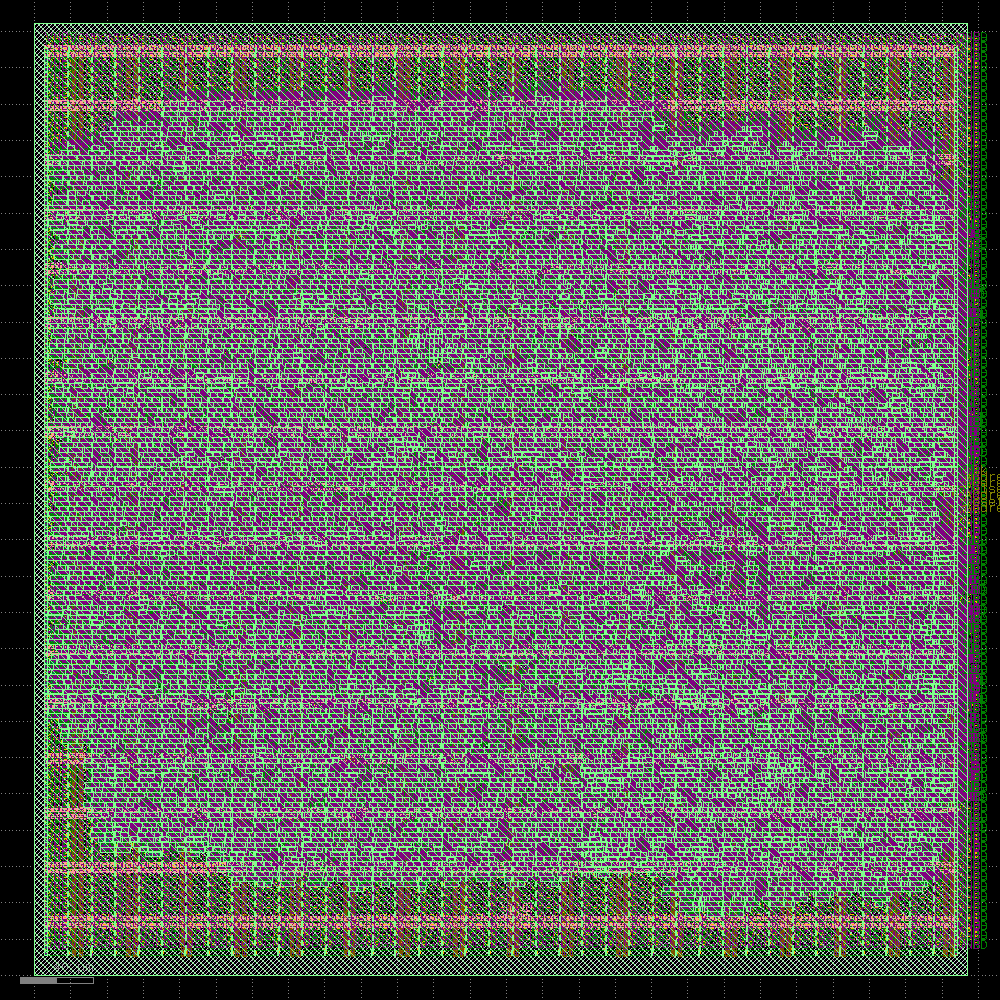

In [26]:
display(cts)

### Global Routing

Global routing "plans" the routes the wires between two gates (or gates and
I/O pins/the PDN) will take. The results of global routing (which are called
"routing guides") are stored in internal data structures and have no effect on
the actual design, so there is no `display()` statement.

In [27]:
GlobalRouting = Step.factory.get("OpenROAD.GlobalRouting")

grt = GlobalRouting(state_in=cts.state_out)
grt.start()

───────────────────────────────────────────────── Global Routing ──────────────────────────────────────────────────

[06:47:07] VERBOSE  Running 'OpenROAD.GlobalRouting'…                                                  ]8;id=67649;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=951385;file:///content/openlane_ipynb/openlane/steps/step.py#1088\1088]8;;\

[06:47:07] VERBOSE  Logging subprocess to                                                              ]8;id=758440;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=721925;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\
                    ]8;id=773680;file:///content/openlane_run/10-openroad-globalrouting/openroad-globalrouting.log\openlane_run/]8;;\]8;id=982667;file:///content/openlane_run/10-openroad-globalrouting/openroad-globalrouting.log\10]8;;\]8;id=773680;file:///content/openlane_run/10-openroad-globalrouting/openroad-globalrouting.log\-openroad-globalrouting/openroad-globalrouting.log]8;;\…                             

Reading OpenROAD database at '/content/openlane_run/9-openroad-cts/spm.odb'…

Reading library file at '/root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/lib/sky130_fd_sc_hd__tt_025C_1v80.lib'…

Reading design constraints file at '/content/openlane_ipynb/openlane/scripts/base.sdc'…

[INFO] Using clock clk…

[INFO] Setting output delay to: 20

[INFO] Setting input delay to: 20

[INFO] Setting load to: 0.033442

[INFO] Setting clock uncertainty to: 0.25

[INFO] Setting clock transition to: 0.1499999999999999944488848768742172978818416595458984375

[INFO] Setting timing derate to: 5%

[INFO] Setting signal min routing layer to: met1 and clock min routing layer to met1.

[INFO] Setting signal max routing layer to: met5 and clock max routing layer to met5.

-congestion_iterations 50 -verbose

[INFO GRT-0020] Min routing layer: met1

[INFO GRT-0021] Max routing layer: met5

[INFO GRT-0022] Global adjustment: 30%

[INFO GRT-0023] Grid origin: (0, 0)

[INFO GRT-0043] No OR_DEFAULT vias defined.

[INFO GRT-0088] Layer li1     Track-Pitch = 0.4600  line-2-Via Pitch: 0.3400

[INFO GRT-0088] Layer met1    Track-Pitch = 0.3400  line-2-Via Pitch: 0.3400

[INFO GRT-0088] Layer met2    Track-Pitch = 0.4600  line-2-Via Pitch: 0.3500

[INFO GRT-0088] Layer met3    Track-Pitch = 0.6800  line-2-Via Pitch: 0.6150

[INFO GRT-0088] Layer met4    Track-Pitch = 0.9200  line-2-Via Pitch: 1.0400

[INFO GRT-0088] Layer met5    Track-Pitch = 3.4000  line-2-Via Pitch: 3.1100

[INFO GRT-0019] Found 238 clock nets.

[INFO GRT-0001] Minimum degree: 2

[INFO GRT-0002] Maximum degree: 257

[INFO GRT-0003] Macros: 0

[INFO GRT-0043] No OR_DEFAULT vias defined.

[INFO GRT-0004] Blockages: 42788

[INFO GRT-0053] Routing resources analysis:

Routing      Original      Derated      Resource

Layer     Direction    Resources     Resources    Reduction (%)

---------------------------------------------------------------

li1        Vertical            0             0          0.00%

met1       Horizontal     112514         53401          52.54%

met2       Vertical        84922         55340          34.83%

met3       Horizontal      56220         37854          32.67%

met4       Vertical        34136         16877          50.56%

met5       Horizontal      11244          4599          59.10%

---------------------------------------------------------------

[INFO GRT-0101] Running extra iterations to remove overflow.

[INFO GRT-0197] Via related to pin nodes: 61908

[INFO GRT-0198] Via related Steiner nodes: 1864

[INFO GRT-0199] Via filling finished.

[INFO GRT-0111] Final number of vias: 79751

[INFO GRT-0112] Final usage 3D: 291478

[INFO GRT-0096] Final congestion report:

Layer         Resource        Demand        Usage (%)    Max H / Max V / Total Overflow

---------------------------------------------------------------------------------------

li1                  0             0            0.00%             0 /  0 /  0

met1             53401         23237           43.51%             0 /  0 /  0

met2             55340         24366           44.03%             0 /  0 /  0

met3             37854          2351            6.21%             0 /  0 /  0

met4             16877          2271           13.46%             0 /  0 /  0

met5              4599             0            0.00%             0 /  0 /  0

---------------------------------------------------------------------------------------

Total           168071         52225           31.07%             0 /  0 /  0

[INFO GRT-0018] Total wirelength: 550530 um

[INFO GRT-0014] Routed nets: 9764

[INFO] Setting RC values…

Setting global connections for newly added cells…

[INFO] Setting global connections...

Writing OpenROAD database to '/content/openlane_run/10-openroad-globalrouting/spm.odb'…

Writing layout to '/content/openlane_run/10-openroad-globalrouting/spm.def'…

Format,Path
nl,openlane_run/9-openroad-cts/spm.nl.v
pnl,openlane_run/9-openroad-cts/spm.pnl.v
def,openlane_run/10-openroad-globalrouting/spm.def
odb,openlane_run/10-openroad-globalrouting/spm.odb
sdc,openlane_run/9-openroad-cts/spm.sdc


### Detailed Routing

Detailed routing uses the guides from Global Routing to actually create wires
on the metal layers and connect the gates, making the connections finally physical.

This is typically the longest step in the flow.

In [28]:
DetailedRouting = Step.factory.get("OpenROAD.DetailedRouting")

drt = DetailedRouting(state_in=grt.state_out)
drt.start()

──────────────────────────────────────────────── Detailed Routing ─────────────────────────────────────────────────

[06:47:19] VERBOSE  Running 'OpenROAD.DetailedRouting'…                                                ]8;id=953606;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=590246;file:///content/openlane_ipynb/openlane/steps/step.py#1088\1088]8;;\

[06:47:19] INFO     Running TritonRoute with 2 threads…                                            ]8;id=691862;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=169458;file:///content/openlane_ipynb/openlane/steps/openroad.py#1619\1619]8;;\

[06:47:19] VERBOSE  Logging subprocess to                                                              ]8;id=131357;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=243881;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\
                    ]8;id=628196;file:///content/openlane_run/11-openroad-detailedrouting/openroad-detailedrouting.log\openlane_run/]8;;\]8;id=156128;file:///content/openlane_run/11-openroad-detailedrouting/openroad-detailedrouting.log\11]8;;\]8;id=628196;file:///content/openlane_run/11-openroad-detailedrouting/openroad-detailedrouting.log\-openroad-detailedrouting/openroad-detailedrouting.log]8;;\…                         

Reading OpenROAD database at '/content/openlane_run/10-openroad-globalrouting/spm.odb'…

Reading library file at '/root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/lib/sky130_fd_sc_hd__tt_025C_1v80.lib'…

Reading design constraints file at '/content/openlane_ipynb/openlane/scripts/base.sdc'…

[INFO] Using clock clk…

[INFO] Setting output delay to: 20

[INFO] Setting input delay to: 20

[INFO] Setting load to: 0.033442

[INFO] Setting clock uncertainty to: 0.25

[INFO] Setting clock transition to: 0.1499999999999999944488848768742172978818416595458984375

[INFO] Setting timing derate to: 5%

[INFO ORD-0030] Using 2 thread(s).

[INFO DRT-0149] Reading tech and libs.

[06:47:20] WARNING  [DRT-0349] LEF58_ENCLOSURE with no CUTCLASS is not supported. Skipping for      ]8;id=70593;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=3490;file:///content/openlane_ipynb/openlane/steps/openroad.py#235\235]8;;\
                    layer mcon                                                                                     

[06:47:20] WARNING  [DRT-0349] LEF58_ENCLOSURE with no CUTCLASS is not supported. Skipping for      ]8;id=713088;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=793514;file:///content/openlane_ipynb/openlane/steps/openroad.py#235\235]8;;\
                    layer mcon                                                                                     

[06:47:20] WARNING  [DRT-0349] LEF58_ENCLOSURE with no CUTCLASS is not supported. Skipping for      ]8;id=764882;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=280266;file:///content/openlane_ipynb/openlane/steps/openroad.py#235\235]8;;\
                    layer via                                                                                      

[06:47:20] WARNING  [DRT-0349] LEF58_ENCLOSURE with no CUTCLASS is not supported. Skipping for      ]8;id=791016;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=833961;file:///content/openlane_ipynb/openlane/steps/openroad.py#235\235]8;;\
                    layer via                                                                                      

[06:47:20] WARNING  [DRT-0349] LEF58_ENCLOSURE with no CUTCLASS is not supported. Skipping for      ]8;id=627260;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=692666;file:///content/openlane_ipynb/openlane/steps/openroad.py#235\235]8;;\
                    layer via2                                                                                     

[06:47:20] WARNING  [DRT-0349] LEF58_ENCLOSURE with no CUTCLASS is not supported. Skipping for      ]8;id=762012;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=298740;file:///content/openlane_ipynb/openlane/steps/openroad.py#235\235]8;;\
                    layer via2                                                                                     

[06:47:20] WARNING  [DRT-0349] LEF58_ENCLOSURE with no CUTCLASS is not supported. Skipping for      ]8;id=565469;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=665389;file:///content/openlane_ipynb/openlane/steps/openroad.py#235\235]8;;\
                    layer via3                                                                                     

[06:47:20] WARNING  [DRT-0349] LEF58_ENCLOSURE with no CUTCLASS is not supported. Skipping for      ]8;id=936529;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=822553;file:///content/openlane_ipynb/openlane/steps/openroad.py#235\235]8;;\
                    layer via3                                                                                     

[06:47:20] WARNING  [DRT-0349] LEF58_ENCLOSURE with no CUTCLASS is not supported. Skipping for      ]8;id=532538;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=956897;file:///content/openlane_ipynb/openlane/steps/openroad.py#235\235]8;;\
                    layer via4                                                                                     

[06:47:20] WARNING  [DRT-0349] LEF58_ENCLOSURE with no CUTCLASS is not supported. Skipping for      ]8;id=733402;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=819603;file:///content/openlane_ipynb/openlane/steps/openroad.py#235\235]8;;\
                    layer via4                                                                                     

Units:                1000

Number of layers:     13

Number of macros:     441

Number of vias:       29

Number of viarulegen: 25

[INFO DRT-0150] Reading design.

Design:                   spm

Die area:                 ( 0 0 ) ( 513950 524670 )

Number of track patterns: 12

Number of DEF vias:       0

Number of components:     13876

Number of terminals:      9

Number of snets:          2

Number of nets:           9764

[INFO DRT-0167] List of default vias:

Layer via

default via: M1M2_PR

Layer via2

default via: M2M3_PR

Layer via3

default via: M3M4_PR

Layer via4

default via: M4M5_PR

[INFO DRT-0162] Library cell analysis.

[INFO DRT-0163] Instance analysis.

[INFO DRT-0164] Number of unique instances = 246.

[INFO DRT-0168] Init region query.

[INFO DRT-0024]   Complete FR_MASTERSLICE.

[INFO DRT-0024]   Complete Fr_VIA.

[INFO DRT-0024]   Complete li1.

[INFO DRT-0024]   Complete mcon.

[INFO DRT-0024]   Complete met1.

[INFO DRT-0024]   Complete via.

[INFO DRT-0024]   Complete met2.

[INFO DRT-0024]   Complete via2.

[INFO DRT-0024]   Complete met3.

[INFO DRT-0024]   Complete via3.

[INFO DRT-0024]   Complete met4.

[INFO DRT-0024]   Complete via4.

[INFO DRT-0024]   Complete met5.

[INFO DRT-0033] FR_MASTERSLICE shape region query size = 0.

[INFO DRT-0033] FR_VIA shape region query size = 0.

[INFO DRT-0033] li1 shape region query size = 401631.

[INFO DRT-0033] mcon shape region query size = 0.

[INFO DRT-0033] met1 shape region query size = 56225.

[INFO DRT-0033] via shape region query size = 18870.

[INFO DRT-0033] met2 shape region query size = 6290.

[INFO DRT-0033] via2 shape region query size = 15725.

[INFO DRT-0033] met3 shape region query size = 9442.

[INFO DRT-0033] via3 shape region query size = 15725.

[INFO DRT-0033] met4 shape region query size = 3791.

[INFO DRT-0033] via4 shape region query size = 578.

[INFO DRT-0033] met5 shape region query size = 646.

[INFO DRT-0165] Start pin access.

[INFO DRT-0078]   Complete 957 pins.

[INFO DRT-0079]   Complete 100 unique inst patterns.

[INFO DRT-0079]   Complete 200 unique inst patterns.

[INFO DRT-0081]   Complete 240 unique inst patterns.

[INFO DRT-0084]   Complete 6244 groups.

#scanned instances     = 13876

#unique  instances     = 246

#stdCellGenAp          = 6868

#stdCellValidPlanarAp  = 63

#stdCellValidViaAp     = 5341

#stdCellPinNoAp        = 0

#stdCellPinCnt         = 36011

#instTermValidViaApCnt = 0

#macroGenAp            = 0

#macroValidPlanarAp    = 0

#macroValidViaAp       = 0

#macroNoAp             = 0

[INFO DRT-0166] Complete pin access.

[INFO DRT-0267] cpu time = 00:02:49, elapsed time = 00:01:44, memory = 193.35 (MB), peak = 255.14 (MB)

Number of guides:     84760

[INFO DRT-0169] Post process guides.

[INFO DRT-0176] GCELLGRID X 0 DO 74 STEP 6900 ;

[INFO DRT-0177] GCELLGRID Y 0 DO 76 STEP 6900 ;

[INFO DRT-0028]   Complete FR_MASTERSLICE.

[INFO DRT-0028]   Complete Fr_VIA.

[INFO DRT-0028]   Complete li1.

[INFO DRT-0028]   Complete mcon.

[INFO DRT-0028]   Complete met1.

[INFO DRT-0028]   Complete via.

[INFO DRT-0028]   Complete met2.

[INFO DRT-0028]   Complete via2.

[INFO DRT-0028]   Complete met3.

[INFO DRT-0028]   Complete via3.

[INFO DRT-0028]   Complete met4.

[INFO DRT-0028]   Complete via4.

[INFO DRT-0028]   Complete met5.

[INFO DRT-0178] Init guide query.

[INFO DRT-0035]   Complete FR_MASTERSLICE (guide).

[INFO DRT-0035]   Complete Fr_VIA (guide).

[INFO DRT-0035]   Complete li1 (guide).

[INFO DRT-0035]   Complete mcon (guide).

[INFO DRT-0035]   Complete met1 (guide).

[INFO DRT-0035]   Complete via (guide).

[INFO DRT-0035]   Complete met2 (guide).

[INFO DRT-0035]   Complete via2 (guide).

[INFO DRT-0035]   Complete met3 (guide).

[INFO DRT-0035]   Complete via3 (guide).

[INFO DRT-0035]   Complete met4 (guide).

[INFO DRT-0035]   Complete via4 (guide).

[INFO DRT-0035]   Complete met5 (guide).

[INFO DRT-0036] FR_MASTERSLICE guide region query size = 0.

[INFO DRT-0036] FR_VIA guide region query size = 0.

[INFO DRT-0036] li1 guide region query size = 29090.

[INFO DRT-0036] mcon guide region query size = 0.

[INFO DRT-0036] met1 guide region query size = 23891.

[INFO DRT-0036] via guide region query size = 0.

[INFO DRT-0036] met2 guide region query size = 13164.

[INFO DRT-0036] via2 guide region query size = 0.

[INFO DRT-0036] met3 guide region query size = 549.

[INFO DRT-0036] via3 guide region query size = 0.

[INFO DRT-0036] met4 guide region query size = 188.

[INFO DRT-0036] via4 guide region query size = 0.

[INFO DRT-0036] met5 guide region query size = 0.

[INFO DRT-0179] Init gr pin query.

[INFO DRT-0245] skipped writing guide updates to database.

[INFO DRT-0185] Post process initialize RPin region query.

[INFO DRT-0181] Start track assignment.

[INFO DRT-0184] Done with 42442 vertical wires in 2 frboxes and 24440 horizontal wires in 2 frboxes.

[INFO DRT-0186] Done with 5501 vertical wires in 2 frboxes and 7540 horizontal wires in 2 frboxes.

[INFO DRT-0182] Complete track assignment.

[INFO DRT-0267] cpu time = 00:00:10, elapsed time = 00:00:08, memory = 331.52 (MB), peak = 331.52 (MB)

[INFO DRT-0187] Start routing data preparation.

[INFO DRT-0267] cpu time = 00:00:00, elapsed time = 00:00:00, memory = 331.52 (MB), peak = 331.52 (MB)

[INFO DRT-0194] Start detail routing.

[INFO DRT-0195] Start 0th optimization iteration.

Completing 10% with 0 violations.

elapsed time = 00:00:47, memory = 381.97 (MB).

Completing 20% with 0 violations.

elapsed time = 00:01:44, memory = 469.52 (MB).

Completing 30% with 1147 violations.

elapsed time = 00:01:59, memory = 520.05 (MB).

Completing 40% with 1147 violations.

elapsed time = 00:02:52, memory = 534.57 (MB).

Completing 50% with 1147 violations.

elapsed time = 00:04:02, memory = 558.45 (MB).

Completing 60% with 2626 violations.

elapsed time = 00:04:44, memory = 601.50 (MB).

Completing 70% with 2626 violations.

elapsed time = 00:05:38, memory = 608.46 (MB).

Completing 80% with 3752 violations.

elapsed time = 00:06:37, memory = 610.78 (MB).

Completing 90% with 3752 violations.

elapsed time = 00:07:46, memory = 630.14 (MB).

Completing 100% with 5026 violations.

elapsed time = 00:09:19, memory = 638.18 (MB).

[INFO DRT-0199]   Number of violations = 12655.

Viol/Layer         li1   mcon   met1    via   met2   met3   met4

Cut Spacing          0      2      0      0      0      0      0

Metal Spacing      114      0    995      0    283      3      0

Min Hole             0      0      4      0      0      0      0

NS Metal             6      0      0      0      0      0      0

Recheck              3      0   5014      0   2437    160     15

Short                0      0   2862      1    756      0      0

[INFO DRT-0267] cpu time = 00:15:16, elapsed time = 00:09:22, memory = 832.04 (MB), peak = 832.04 (MB)

Total wire length = 383633 um.

Total wire length on LAYER li1 = 0 um.

Total wire length on LAYER met1 = 174588 um.

Total wire length on LAYER met2 = 175204 um.

Total wire length on LAYER met3 = 18736 um.

Total wire length on LAYER met4 = 15104 um.

Total wire length on LAYER met5 = 0 um.

Total number of vias = 80340.

Up-via summary (total 80340):

------------------------

FR_MASTERSLICE        0

li1    35893

met1    42989

met2     1118

met3      340

met4        0

------------------------

80340

[INFO DRT-0195] Start 1st optimization iteration.

Completing 10% with 12655 violations.

elapsed time = 00:00:29, memory = 832.04 (MB).

Completing 20% with 12655 violations.

elapsed time = 00:01:12, memory = 832.04 (MB).

Completing 30% with 9907 violations.

elapsed time = 00:01:25, memory = 832.04 (MB).

Completing 40% with 9907 violations.

elapsed time = 00:01:58, memory = 832.04 (MB).

Completing 50% with 9907 violations.

elapsed time = 00:02:39, memory = 832.04 (MB).

Completing 60% with 7201 violations.

elapsed time = 00:03:07, memory = 832.04 (MB).

Completing 70% with 7201 violations.

elapsed time = 00:03:37, memory = 832.04 (MB).

Completing 80% with 4531 violations.

elapsed time = 00:04:17, memory = 832.04 (MB).

Completing 90% with 4531 violations.

elapsed time = 00:04:47, memory = 832.04 (MB).

Completing 100% with 1775 violations.

elapsed time = 00:05:31, memory = 832.04 (MB).

[INFO DRT-0199]   Number of violations = 1775.

Viol/Layer        mcon   met1   met2

Cut Spacing          1      0      0

Metal Spacing        0    336    114

Short                0   1036    288

[INFO DRT-0267] cpu time = 00:09:06, elapsed time = 00:05:33, memory = 832.04 (MB), peak = 855.76 (MB)

Total wire length = 379078 um.

Total wire length on LAYER li1 = 0 um.

Total wire length on LAYER met1 = 173031 um.

Total wire length on LAYER met2 = 172415 um.

Total wire length on LAYER met3 = 18559 um.

Total wire length on LAYER met4 = 15072 um.

Total wire length on LAYER met5 = 0 um.

Total number of vias = 79959.

Up-via summary (total 79959):

------------------------

FR_MASTERSLICE        0

li1    35888

met1    42643

met2     1092

met3      336

met4        0

------------------------

79959

[INFO DRT-0195] Start 2nd optimization iteration.

Completing 10% with 1775 violations.

elapsed time = 00:00:26, memory = 832.04 (MB).

Completing 20% with 1775 violations.

elapsed time = 00:01:06, memory = 832.04 (MB).

Completing 30% with 1710 violations.

elapsed time = 00:01:25, memory = 832.04 (MB).

Completing 40% with 1710 violations.

elapsed time = 00:02:07, memory = 832.04 (MB).

Completing 50% with 1710 violations.

elapsed time = 00:02:45, memory = 832.04 (MB).

Completing 60% with 1674 violations.

elapsed time = 00:03:20, memory = 832.04 (MB).

Completing 70% with 1674 violations.

elapsed time = 00:04:09, memory = 832.04 (MB).

Completing 80% with 1603 violations.

elapsed time = 00:04:30, memory = 832.04 (MB).

Completing 90% with 1603 violations.

elapsed time = 00:05:14, memory = 856.27 (MB).

Completing 100% with 1579 violations.

elapsed time = 00:05:32, memory = 832.04 (MB).

[INFO DRT-0199]   Number of violations = 1579.

Viol/Layer        mcon   met1   met2

Cut Spacing          1      0      0

Metal Spacing        0    337     95

Min Hole             0      1      0

Short                0    885    260

[INFO DRT-0267] cpu time = 00:09:04, elapsed time = 00:05:34, memory = 835.17 (MB), peak = 856.27 (MB)

Total wire length = 377605 um.

Total wire length on LAYER li1 = 0 um.

Total wire length on LAYER met1 = 172894 um.

Total wire length on LAYER met2 = 171199 um.

Total wire length on LAYER met3 = 18547 um.

Total wire length on LAYER met4 = 14963 um.

Total wire length on LAYER met5 = 0 um.

Total number of vias = 79655.

Up-via summary (total 79655):

------------------------

FR_MASTERSLICE        0

li1    35888

met1    42364

met2     1069

met3      334

met4        0

------------------------

79655

[INFO DRT-0195] Start 3rd optimization iteration.

Completing 10% with 1579 violations.

elapsed time = 00:00:12, memory = 835.17 (MB).

Completing 20% with 1579 violations.

elapsed time = 00:00:27, memory = 835.17 (MB).

Completing 30% with 1216 violations.

elapsed time = 00:00:37, memory = 835.17 (MB).

Completing 40% with 1216 violations.

elapsed time = 00:00:50, memory = 835.17 (MB).

Completing 50% with 1216 violations.

elapsed time = 00:01:13, memory = 835.17 (MB).

Completing 60% with 777 violations.

elapsed time = 00:01:34, memory = 835.17 (MB).

Completing 70% with 777 violations.

elapsed time = 00:01:59, memory = 835.17 (MB).

Completing 80% with 488 violations.

elapsed time = 00:02:19, memory = 835.17 (MB).

Completing 90% with 488 violations.

elapsed time = 00:02:42, memory = 835.17 (MB).

Completing 100% with 120 violations.

elapsed time = 00:03:16, memory = 835.17 (MB).

[INFO DRT-0199]   Number of violations = 120.

Viol/Layer        met1   met2

Metal Spacing       29     23

Short               53     15

[INFO DRT-0267] cpu time = 00:05:24, elapsed time = 00:03:17, memory = 835.17 (MB), peak = 856.27 (MB)

Total wire length = 377112 um.

Total wire length on LAYER li1 = 0 um.

Total wire length on LAYER met1 = 165808 um.

Total wire length on LAYER met2 = 170354 um.

Total wire length on LAYER met3 = 25327 um.

Total wire length on LAYER met4 = 15622 um.

Total wire length on LAYER met5 = 0 um.

Total number of vias = 80584.

Up-via summary (total 80584):

------------------------

FR_MASTERSLICE        0

li1    35888

met1    42272

met2     2023

met3      401

met4        0

------------------------

80584

[INFO DRT-0195] Start 4th optimization iteration.

Completing 10% with 120 violations.

elapsed time = 00:00:01, memory = 835.17 (MB).

Completing 20% with 120 violations.

elapsed time = 00:00:04, memory = 835.17 (MB).

Completing 30% with 78 violations.

elapsed time = 00:00:05, memory = 835.17 (MB).

Completing 40% with 78 violations.

elapsed time = 00:00:05, memory = 835.17 (MB).

Completing 50% with 78 violations.

elapsed time = 00:00:06, memory = 835.17 (MB).

Completing 60% with 47 violations.

elapsed time = 00:00:08, memory = 835.17 (MB).

Completing 70% with 47 violations.

elapsed time = 00:00:08, memory = 835.17 (MB).

Completing 80% with 44 violations.

elapsed time = 00:00:09, memory = 835.17 (MB).

Completing 90% with 44 violations.

elapsed time = 00:00:12, memory = 835.17 (MB).

Completing 100% with 2 violations.

elapsed time = 00:00:13, memory = 835.17 (MB).

[INFO DRT-0199]   Number of violations = 2.

Viol/Layer        met1

Short                2

[INFO DRT-0267] cpu time = 00:00:23, elapsed time = 00:00:14, memory = 835.17 (MB), peak = 856.27 (MB)

Total wire length = 377125 um.

Total wire length on LAYER li1 = 0 um.

Total wire length on LAYER met1 = 165616 um.

Total wire length on LAYER met2 = 170354 um.

Total wire length on LAYER met3 = 25531 um.

Total wire length on LAYER met4 = 15623 um.

Total wire length on LAYER met5 = 0 um.

Total number of vias = 80585.

Up-via summary (total 80585):

------------------------

FR_MASTERSLICE        0

li1    35888

met1    42258

met2     2038

met3      401

met4        0

------------------------

80585

[INFO DRT-0195] Start 5th optimization iteration.

Completing 10% with 2 violations.

elapsed time = 00:00:00, memory = 835.17 (MB).

Completing 20% with 2 violations.

elapsed time = 00:00:00, memory = 835.17 (MB).

Completing 30% with 0 violations.

elapsed time = 00:00:04, memory = 835.17 (MB).

Completing 40% with 0 violations.

elapsed time = 00:00:04, memory = 835.17 (MB).

Completing 50% with 0 violations.

elapsed time = 00:00:04, memory = 835.17 (MB).

Completing 60% with 0 violations.

elapsed time = 00:00:04, memory = 835.17 (MB).

Completing 70% with 0 violations.

elapsed time = 00:00:04, memory = 835.17 (MB).

Completing 80% with 0 violations.

elapsed time = 00:00:04, memory = 835.17 (MB).

Completing 90% with 0 violations.

elapsed time = 00:00:04, memory = 835.17 (MB).

Completing 100% with 0 violations.

elapsed time = 00:00:04, memory = 835.17 (MB).

[INFO DRT-0199]   Number of violations = 0.

[INFO DRT-0267] cpu time = 00:00:04, elapsed time = 00:00:04, memory = 835.17 (MB), peak = 856.27 (MB)

Total wire length = 377121 um.

Total wire length on LAYER li1 = 0 um.

Total wire length on LAYER met1 = 165615 um.

Total wire length on LAYER met2 = 170354 um.

Total wire length on LAYER met3 = 25528 um.

Total wire length on LAYER met4 = 15623 um.

Total wire length on LAYER met5 = 0 um.

Total number of vias = 80583.

Up-via summary (total 80583):

------------------------

FR_MASTERSLICE        0

li1    35888

met1    42258

met2     2036

met3      401

met4        0

------------------------

80583

[INFO DRT-0198] Complete detail routing.

Total wire length = 377121 um.

Total wire length on LAYER li1 = 0 um.

Total wire length on LAYER met1 = 165615 um.

Total wire length on LAYER met2 = 170354 um.

Total wire length on LAYER met3 = 25528 um.

Total wire length on LAYER met4 = 15623 um.

Total wire length on LAYER met5 = 0 um.

Total number of vias = 80583.

Up-via summary (total 80583):

------------------------

FR_MASTERSLICE        0

li1    35888

met1    42258

met2     2036

met3      401

met4        0

------------------------

80583

[INFO DRT-0267] cpu time = 00:39:21, elapsed time = 00:24:07, memory = 835.17 (MB), peak = 856.27 (MB)

[INFO DRT-0180] Post processing.

Setting global connections for newly added cells…

[INFO] Setting global connections...

Writing OpenROAD database to '/content/openlane_run/11-openroad-detailedrouting/spm.odb'…

Writing netlist to '/content/openlane_run/11-openroad-detailedrouting/spm.nl.v'…

Writing powered netlist to '/content/openlane_run/11-openroad-detailedrouting/spm.pnl.v'…

Writing layout to '/content/openlane_run/11-openroad-detailedrouting/spm.def'…

Writing timing constraints to '/content/openlane_run/11-openroad-detailedrouting/spm.sdc'…

Format,Path
nl,openlane_run/11-openroad-detailedrouting/spm.nl.v
pnl,openlane_run/11-openroad-detailedrouting/spm.pnl.v
def,openlane_run/11-openroad-detailedrouting/spm.def
odb,openlane_run/11-openroad-detailedrouting/spm.odb
sdc,openlane_run/11-openroad-detailedrouting/spm.sdc


──────────────────────────────────────────── Render Image (w/ KLayout) ────────────────────────────────────────────

[07:14:42] VERBOSE  Running 'KLayout.Render'…                                                          ]8;id=81822;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=832157;file:///content/openlane_ipynb/openlane/steps/step.py#1088\1088]8;;\

[07:14:42] VERBOSE  Logging subprocess to ]8;id=475709;file:///tmp/openlane_klayout_tmp_8eu3f_ls/klayout-render.log\..]8;;\]8;id=875489;file:///tmp/openlane_klayout_tmp_8eu3f_ls/klayout-render.log\/tmp/openlane_klayout_tmp_8eu3f_ls/]8;;\]8;id=683817;file:///tmp/openlane_klayout_tmp_8eu3f_ls/klayout-render.log\klayout-render.log]8;;\…     ]8;id=14645;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=181391;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\

#### Time Elapsed: 1565.17s
#### Views updated:
* Verilog Netlist
* Powered Verilog Netlist
* Design Exchange Format
* OpenDB Database
* Design Constraints
#### Preview:
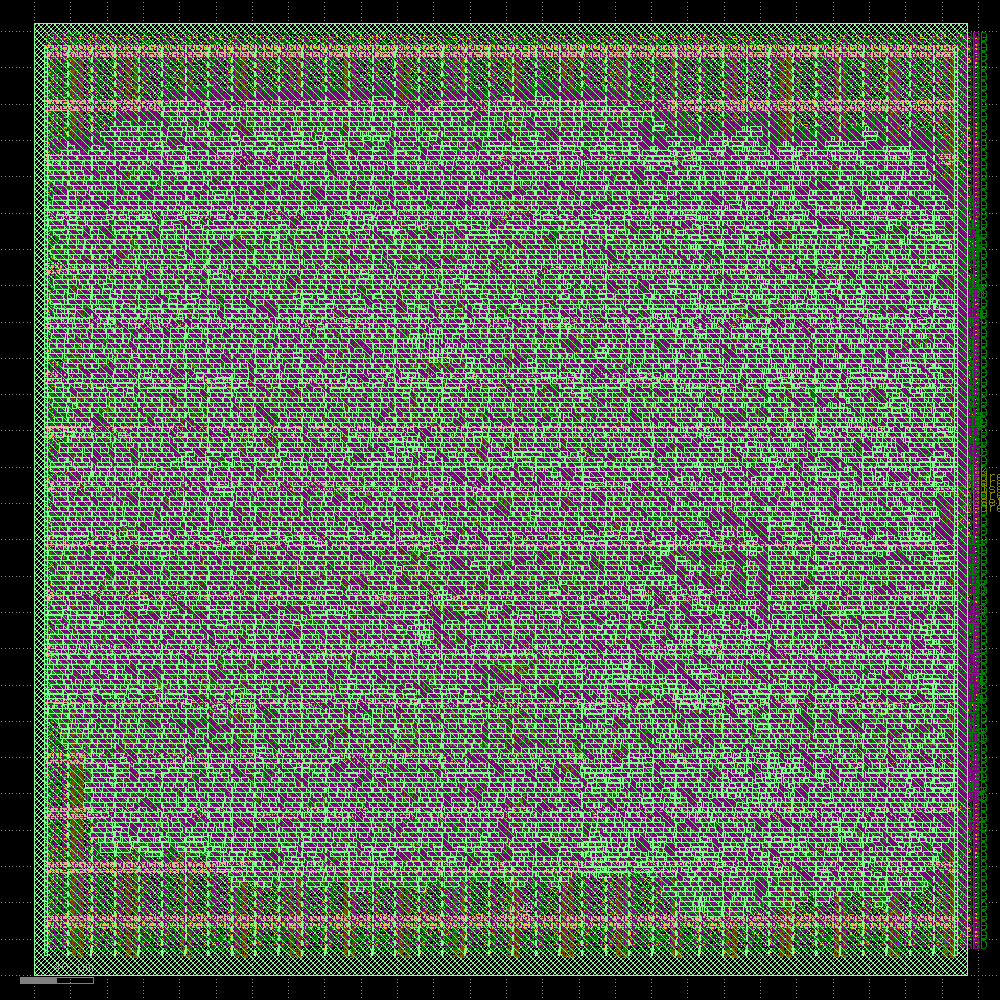

In [29]:
display(drt)

### Fill Insertion

Finally, as we're done placing all the essential cells, the only thing left to
do is fill in the gaps.

We prioritize the use of decap (decoupling capacitor) cells, which
further supports the power distribution network, but when there aren't any
small enough cells, we just use regular fill cells.

In [30]:
FillInsertion = Step.factory.get("OpenROAD.FillInsertion")

fill = FillInsertion(state_in=drt.state_out)
fill.start()

───────────────────────────────────────────────── Fill Insertion ──────────────────────────────────────────────────

[07:14:53] VERBOSE  Running 'OpenROAD.FillInsertion'…                                                  ]8;id=715467;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=544336;file:///content/openlane_ipynb/openlane/steps/step.py#1088\1088]8;;\

[07:14:53] VERBOSE  Logging subprocess to                                                              ]8;id=484438;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=50674;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\
                    ]8;id=946911;file:///content/openlane_run/12-openroad-fillinsertion/openroad-fillinsertion.log\openlane_run/]8;;\]8;id=767436;file:///content/openlane_run/12-openroad-fillinsertion/openroad-fillinsertion.log\12]8;;\]8;id=946911;file:///content/openlane_run/12-openroad-fillinsertion/openroad-fillinsertion.log\-openroad-fillinsertion/openroad-fillinsertion.log]8;;\…                             

Reading OpenROAD database at '/content/openlane_run/11-openroad-detailedrouting/spm.odb'…

Reading library file at '/root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/lib/sky130_fd_sc_hd__tt_025C_1v80.lib'…

Reading design constraints file at '/content/openlane_ipynb/openlane/scripts/base.sdc'…

[INFO] Using clock clk…

[INFO] Setting output delay to: 20

[INFO] Setting input delay to: 20

[INFO] Setting load to: 0.033442

[INFO] Setting clock uncertainty to: 0.25

[INFO] Setting clock transition to: 0.1499999999999999944488848768742172978818416595458984375

[INFO] Setting timing derate to: 5%

sky130_ef_sc_hd__decap_12 sky130_fd_sc_hd__decap_8 sky130_fd_sc_hd__decap_6 sky130_fd_sc_hd__decap_4               
sky130_fd_sc_hd__decap_3 sky130_fd_sc_hd__fill*

[INFO DPL-0001] Placed 14628 filler instances.

Setting global connections for newly added cells…

[INFO] Setting global connections...

Writing OpenROAD database to '/content/openlane_run/12-openroad-fillinsertion/spm.odb'…

Writing netlist to '/content/openlane_run/12-openroad-fillinsertion/spm.nl.v'…

Writing powered netlist to '/content/openlane_run/12-openroad-fillinsertion/spm.pnl.v'…

Writing layout to '/content/openlane_run/12-openroad-fillinsertion/spm.def'…

Writing timing constraints to '/content/openlane_run/12-openroad-fillinsertion/spm.sdc'…

Format,Path
nl,openlane_run/12-openroad-fillinsertion/spm.nl.v
pnl,openlane_run/12-openroad-fillinsertion/spm.pnl.v
def,openlane_run/12-openroad-fillinsertion/spm.def
odb,openlane_run/12-openroad-fillinsertion/spm.odb
sdc,openlane_run/12-openroad-fillinsertion/spm.sdc


──────────────────────────────────────────── Render Image (w/ KLayout) ────────────────────────────────────────────

[07:15:00] VERBOSE  Running 'KLayout.Render'…                                                          ]8;id=866961;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=220836;file:///content/openlane_ipynb/openlane/steps/step.py#1088\1088]8;;\

[07:15:00] VERBOSE  Logging subprocess to ]8;id=24067;file:///tmp/openlane_klayout_tmp_99n6o9t5/klayout-render.log\..]8;;\]8;id=81202;file:///tmp/openlane_klayout_tmp_99n6o9t5/klayout-render.log\/tmp/openlane_klayout_tmp_99n6o9t5/]8;;\]8;id=321768;file:///tmp/openlane_klayout_tmp_99n6o9t5/klayout-render.log\klayout-render.log]8;;\…     ]8;id=701107;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=551553;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\

#### Time Elapsed: 2.45s
#### Views updated:
* Verilog Netlist
* Powered Verilog Netlist
* Design Exchange Format
* OpenDB Database
* Design Constraints
#### Preview:
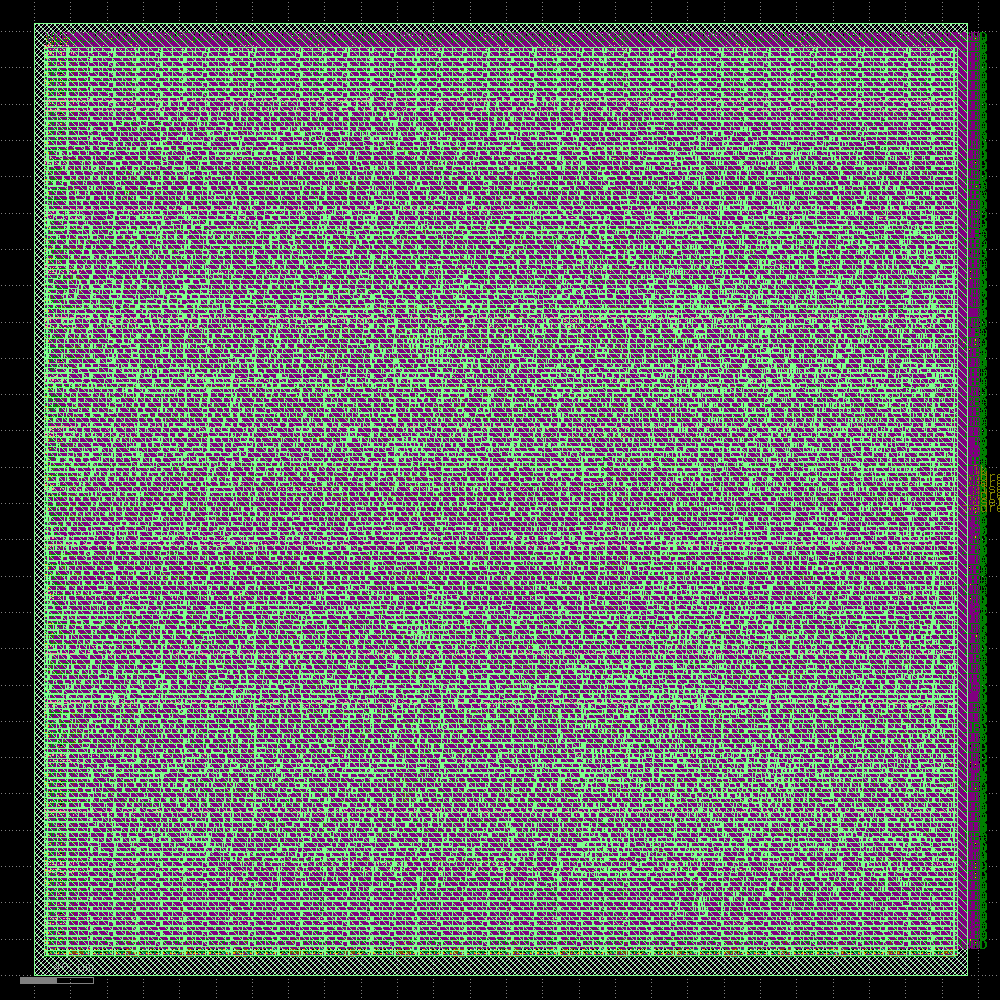

In [31]:
display(fill)

### Parasitics Extraction a.k.a. Resistance/Capacitance Extraction (RCX)

This step does not alter the design- rather, it computes the
[Parasitic elements](https://en.wikipedia.org/wiki/Parasitic_element_(electrical_networks))
of the circuit, which have an effect of timing, as we prepare to do the final
timing analysis.

The parasitic elements are saved in the **Standard Parasitics Exchange Format**,
or SPEF. OpenLane creates a SPEF file for each interconnect corner as described in
the [Corners and STA](https://openlane2.readthedocs.io/en/latest/usage/corners_and_sta.html)
section of the documentation.

In [32]:
RCX = Step.factory.get("OpenROAD.RCX")

rcx = RCX(state_in=fill.state_out)
rcx.start()

─────────────────────────────────── Parasitic Resistance/Capacitance Extraction ───────────────────────────────────

[07:15:12] VERBOSE  Running 'OpenROAD.RCX'…                                                            ]8;id=513949;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=351069;file:///content/openlane_ipynb/openlane/steps/step.py#1088\1088]8;;\

[07:15:12] INFO     Running RCX for corners matching nom_*                                         ]8;id=856440;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=58497;file:///content/openlane_ipynb/openlane/steps/openroad.py#1748\1748]8;;\
                    (/content/openlane_run/13-openroad-rcx/nom/rcx.log)…                                           

[07:15:12] INFO     Running RCX for corners matching min_*                                         ]8;id=560141;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=816620;file:///content/openlane_ipynb/openlane/steps/openroad.py#1748\1748]8;;\
                    (/content/openlane_run/13-openroad-rcx/min/rcx.log)…                                           

[07:15:12] VERBOSE  Logging subprocess to ]8;id=902501;file:///content/openlane_run/13-openroad-rcx/nom/rcx.log\openlane_run/]8;;\]8;id=714160;file:///content/openlane_run/13-openroad-rcx/nom/rcx.log\13]8;;\]8;id=902501;file:///content/openlane_run/13-openroad-rcx/nom/rcx.log\-openroad-rcx/nom/rcx.log]8;;\…                    ]8;id=840864;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=322237;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\

[07:15:12] VERBOSE  Logging subprocess to ]8;id=515150;file:///content/openlane_run/13-openroad-rcx/min/rcx.log\openlane_run/]8;;\]8;id=611062;file:///content/openlane_run/13-openroad-rcx/min/rcx.log\13]8;;\]8;id=515150;file:///content/openlane_run/13-openroad-rcx/min/rcx.log\-openroad-rcx/min/rcx.log]8;;\…                    ]8;id=505359;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=14499;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\

[07:15:26] INFO     Finished RCX for corners matching min_*.                                       ]8;id=450132;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=121053;file:///content/openlane_ipynb/openlane/steps/openroad.py#1757\1757]8;;\

[07:15:26] INFO     Running RCX for corners matching max_*                                         ]8;id=386123;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=174865;file:///content/openlane_ipynb/openlane/steps/openroad.py#1748\1748]8;;\
                    (/content/openlane_run/13-openroad-rcx/max/rcx.log)…                                           

[07:15:26] VERBOSE  Logging subprocess to ]8;id=60009;file:///content/openlane_run/13-openroad-rcx/max/rcx.log\openlane_run/]8;;\]8;id=92460;file:///content/openlane_run/13-openroad-rcx/max/rcx.log\13]8;;\]8;id=60009;file:///content/openlane_run/13-openroad-rcx/max/rcx.log\-openroad-rcx/max/rcx.log]8;;\…                    ]8;id=423625;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=10716;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\

[07:15:27] INFO     Finished RCX for corners matching nom_*.                                       ]8;id=877238;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=168536;file:///content/openlane_ipynb/openlane/steps/openroad.py#1757\1757]8;;\

[07:15:33] INFO     Finished RCX for corners matching max_*.                                       ]8;id=942166;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=419194;file:///content/openlane_ipynb/openlane/steps/openroad.py#1757\1757]8;;\

{'nl': Path('/content/openlane_run/12-openroad-fillinsertion/spm.nl.v'), 'pnl': Path('/content/openlane_run/12-openroad-fillinsertion/spm.pnl.v'), 'pnl-sdf-friendly': None, 'pnl-npc': None, 'def': Path('/content/openlane_run/12-openroad-fillinsertion/spm.def'), 'lef': None, 'openroad-lef': None, 'odb': Path('/content/openlane_run/12-openroad-fillinsertion/spm.odb'), 'sdc': Path('/content/openlane_run/12-openroad-fillinsertion/spm.sdc'), 'sdf': None, 'spef': {'nom_*': Path('/content/openlane_run/13-openroad-rcx/nom/spm.nom.spef'), 'min_*': Path('/content/openlane_run/13-openroad-rcx/min/spm.min.spef'), 'max_*': Path('/content/openlane_run/13-openroad-rcx/max/spm.max.spef')}, 'lib': None, 'spice': None, 'mag': None, 'gds': None, 'mag_gds': None, 'klayout_gds': None, 'json_h': None, 'vh': None, 'metrics': {'design__instance__count': 13508, 'design__instance__area': 136752, 'design__instance_unmapped__count': 0, 'synthesis__check_error__count': 0, 'design__die__bbox': '0.0 0.0 513.95 524.67', 'design__core__bbox': '5.52 10.88 508.3 511.36', 'flow__warnings__count': 0, 'flow__errors__count': 0, 'design__io': 9, 'design__die__area': 269654, 'design__core__area': 251631, 'design__instance__count__stdcell': 13508, 'design__instance__area__stdcell': 136752, 'design__instance__count__macros': 0, 'design__instance__area__macros': 0, 'design__instance__utilization': Decimal('0.543463'), 'design__instance__utilization__stdcell': Decimal('0.543463'), 'floorplan__design__io': 7, 'design__io__hpwl': 1839820, 'design__power_grid_violation__count__net:VGND': 0, 'design__power_grid_violation__count__net:VPWR': 0, 'design__power_grid_violation__count': 0, 'design__instance__displacement__total': Decimal('3595.89'), 'design__instance__displacement__mean': Decimal('0.259'), 'design__instance__displacement__max': Decimal('14.238'), 'route__wirelength__estimated': 231233, 'design__violations': 0, 'antenna__violating__nets': 38, 'antenna__violating__pins': 46, 'route__net': 9764, 'route__net__special': 2, 'route__drc_errors__iter:1': 12655, 'route__wirelength__iter:1': 383633, 'route__drc_errors__iter:2': 1775, 'route__wirelength__iter:2': 379078, 'route__drc_errors__iter:3': 1579, 'route__wirelength__iter:3': 377605, 'route__drc_errors__iter:4': 120, 'route__wirelength__iter:4': 377112, 'route__drc_errors__iter:5': 2, 'route__wirelength__iter:5': 377125, 'route__drc_errors__iter:6': 0, 'route__wirelength__iter:6': 377121, 'route__drc_errors': 0, 'route__wirelength': 377121, 'route__vias': 80583, 'route__vias__singlecut': 80583, 'route__vias__multicut': 0}}

### Static Timing Analysis (Post-PnR)

STA is a process that verifies that a chip meets certain constraints on clock
and data timings to run at its rated clock speed. See [Corners and STA](https://openlane2.readthedocs.io/en/latest/usage/corners_and_sta.html)
in the documentation for more info.

---

This step generates two kinds of files:
* `.lib`: Liberty™-compatible Library files. Can be used to do static timing
  analysis when creating a design with this design as a sub-macro.
* `.sdf`: Standard Delay Format. Can be used with certain simulation software
  to do *dynamic* timing analysis.

Unfortunately, the `.lib` files coming out of OpenLane right now are not super
reliable for timing purposes and are only provided for completeness.
When using OpenLane-created macros withing other designs, it is best to use the
macro's final netlist and extracted parasitics instead.

In [33]:
STAPostPNR = Step.factory.get("OpenROAD.STAPostPNR")

sta_post_pnr = STAPostPNR(state_in=rcx.state_out)
sta_post_pnr.start()

──────────────────────────────────────── Static Timing Analysis (Post-PnR) ────────────────────────────────────────

[07:15:39] VERBOSE  Running 'OpenROAD.STAPostPNR'…                                                     ]8;id=492149;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=987369;file:///content/openlane_ipynb/openlane/steps/step.py#1088\1088]8;;\

[07:15:39] INFO     Starting STA for the nom_tt_025C_1v80 timing corner…                            ]8;id=686884;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=181032;file:///content/openlane_ipynb/openlane/steps/openroad.py#561\561]8;;\

[07:15:39] INFO     Starting STA for the nom_ss_100C_1v60 timing corner…                            ]8;id=364351;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=104689;file:///content/openlane_ipynb/openlane/steps/openroad.py#561\561]8;;\

[07:15:39] VERBOSE  Logging subprocess to                                                              ]8;id=575157;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=595902;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\
                    ]8;id=807687;file:///content/openlane_run/14-openroad-stapostpnr/nom_tt_025C_1v80/sta.log\openlane_run/]8;;\]8;id=391066;file:///content/openlane_run/14-openroad-stapostpnr/nom_tt_025C_1v80/sta.log\14]8;;\]8;id=807687;file:///content/openlane_run/14-openroad-stapostpnr/nom_tt_025C_1v80/sta.log\-openroad-stapostpnr/nom_tt_025C_1v80/sta.log]8;;\…                                  

[07:15:39] VERBOSE  Logging subprocess to                                                              ]8;id=817294;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=480224;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\
                    ]8;id=71765;file:///content/openlane_run/14-openroad-stapostpnr/nom_ss_100C_1v60/sta.log\openlane_run/]8;;\]8;id=763801;file:///content/openlane_run/14-openroad-stapostpnr/nom_ss_100C_1v60/sta.log\14]8;;\]8;id=71765;file:///content/openlane_run/14-openroad-stapostpnr/nom_ss_100C_1v60/sta.log\-openroad-stapostpnr/nom_ss_100C_1v60/sta.log]8;;\…                                  

[07:16:14] INFO     Finished STA for the nom_tt_025C_1v80 timing corner.                            ]8;id=923423;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=74204;file:///content/openlane_ipynb/openlane/steps/openroad.py#576\576]8;;\

[07:16:14] VERBOSE  Logging subprocess to                                                              ]8;id=821682;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=973617;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\
                    ]8;id=177009;file:///content/openlane_run/14-openroad-stapostpnr/nom_tt_025C_1v80/filter_unannotated.log\openlane_run/]8;;\]8;id=592429;file:///content/openlane_run/14-openroad-stapostpnr/nom_tt_025C_1v80/filter_unannotated.log\14]8;;\]8;id=177009;file:///content/openlane_run/14-openroad-stapostpnr/nom_tt_025C_1v80/filter_unannotated.log\-openroad-stapostpnr/nom_tt_025C_1v80/filter_unannotated.log]8;;\…                   

[07:16:14] INFO     Finished STA for the nom_ss_100C_1v60 timing corner.                            ]8;id=726781;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=452990;file:///content/openlane_ipynb/openlane/steps/openroad.py#576\576]8;;\

[07:16:15] VERBOSE  Logging subprocess to                                                              ]8;id=267369;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=303465;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\
                    ]8;id=242280;file:///content/openlane_run/14-openroad-stapostpnr/nom_ss_100C_1v60/filter_unannotated.log\openlane_run/]8;;\]8;id=929634;file:///content/openlane_run/14-openroad-stapostpnr/nom_ss_100C_1v60/filter_unannotated.log\14]8;;\]8;id=242280;file:///content/openlane_run/14-openroad-stapostpnr/nom_ss_100C_1v60/filter_unannotated.log\-openroad-stapostpnr/nom_ss_100C_1v60/filter_unannotated.log]8;;\…                   

[07:16:17] INFO     Starting STA for the nom_ff_n40C_1v95 timing corner…                            ]8;id=552812;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=744838;file:///content/openlane_ipynb/openlane/steps/openroad.py#561\561]8;;\

[07:16:17] VERBOSE  Logging subprocess to                                                              ]8;id=859265;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=240970;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\
                    ]8;id=678160;file:///content/openlane_run/14-openroad-stapostpnr/nom_ff_n40C_1v95/sta.log\openlane_run/]8;;\]8;id=389671;file:///content/openlane_run/14-openroad-stapostpnr/nom_ff_n40C_1v95/sta.log\14]8;;\]8;id=678160;file:///content/openlane_run/14-openroad-stapostpnr/nom_ff_n40C_1v95/sta.log\-openroad-stapostpnr/nom_ff_n40C_1v95/sta.log]8;;\…                                  

[07:16:17] INFO     Starting STA for the min_tt_025C_1v80 timing corner…                            ]8;id=909923;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=279442;file:///content/openlane_ipynb/openlane/steps/openroad.py#561\561]8;;\

[07:16:17] VERBOSE  Logging subprocess to                                                              ]8;id=94617;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=987354;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\
                    ]8;id=525481;file:///content/openlane_run/14-openroad-stapostpnr/min_tt_025C_1v80/sta.log\openlane_run/]8;;\]8;id=541978;file:///content/openlane_run/14-openroad-stapostpnr/min_tt_025C_1v80/sta.log\14]8;;\]8;id=525481;file:///content/openlane_run/14-openroad-stapostpnr/min_tt_025C_1v80/sta.log\-openroad-stapostpnr/min_tt_025C_1v80/sta.log]8;;\…                                  

[07:16:54] INFO     Finished STA for the min_tt_025C_1v80 timing corner.                            ]8;id=487419;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=491620;file:///content/openlane_ipynb/openlane/steps/openroad.py#576\576]8;;\

[07:16:54] VERBOSE  Logging subprocess to                                                              ]8;id=519590;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=345268;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\
                    ]8;id=72033;file:///content/openlane_run/14-openroad-stapostpnr/min_tt_025C_1v80/filter_unannotated.log\openlane_run/]8;;\]8;id=933704;file:///content/openlane_run/14-openroad-stapostpnr/min_tt_025C_1v80/filter_unannotated.log\14]8;;\]8;id=72033;file:///content/openlane_run/14-openroad-stapostpnr/min_tt_025C_1v80/filter_unannotated.log\-openroad-stapostpnr/min_tt_025C_1v80/filter_unannotated.log]8;;\…                   

[07:16:54] INFO     Finished STA for the nom_ff_n40C_1v95 timing corner.                            ]8;id=708022;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=686182;file:///content/openlane_ipynb/openlane/steps/openroad.py#576\576]8;;\

[07:16:54] VERBOSE  Logging subprocess to                                                              ]8;id=596823;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=883622;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\
                    ]8;id=573251;file:///content/openlane_run/14-openroad-stapostpnr/nom_ff_n40C_1v95/filter_unannotated.log\openlane_run/]8;;\]8;id=23900;file:///content/openlane_run/14-openroad-stapostpnr/nom_ff_n40C_1v95/filter_unannotated.log\14]8;;\]8;id=573251;file:///content/openlane_run/14-openroad-stapostpnr/nom_ff_n40C_1v95/filter_unannotated.log\-openroad-stapostpnr/nom_ff_n40C_1v95/filter_unannotated.log]8;;\…                   

[07:16:55] INFO     Starting STA for the min_ss_100C_1v60 timing corner…                            ]8;id=406312;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=892083;file:///content/openlane_ipynb/openlane/steps/openroad.py#561\561]8;;\

[07:16:55] VERBOSE  Logging subprocess to                                                              ]8;id=973439;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=806006;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\
                    ]8;id=519909;file:///content/openlane_run/14-openroad-stapostpnr/min_ss_100C_1v60/sta.log\openlane_run/]8;;\]8;id=429437;file:///content/openlane_run/14-openroad-stapostpnr/min_ss_100C_1v60/sta.log\14]8;;\]8;id=519909;file:///content/openlane_run/14-openroad-stapostpnr/min_ss_100C_1v60/sta.log\-openroad-stapostpnr/min_ss_100C_1v60/sta.log]8;;\…                                  

[07:16:55] INFO     Starting STA for the min_ff_n40C_1v95 timing corner…                            ]8;id=741706;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=514242;file:///content/openlane_ipynb/openlane/steps/openroad.py#561\561]8;;\

[07:16:55] VERBOSE  Logging subprocess to                                                              ]8;id=116536;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=318234;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\
                    ]8;id=408364;file:///content/openlane_run/14-openroad-stapostpnr/min_ff_n40C_1v95/sta.log\openlane_run/]8;;\]8;id=896636;file:///content/openlane_run/14-openroad-stapostpnr/min_ff_n40C_1v95/sta.log\14]8;;\]8;id=408364;file:///content/openlane_run/14-openroad-stapostpnr/min_ff_n40C_1v95/sta.log\-openroad-stapostpnr/min_ff_n40C_1v95/sta.log]8;;\…                                  

[07:17:32] INFO     Finished STA for the min_ss_100C_1v60 timing corner.                            ]8;id=553133;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=459517;file:///content/openlane_ipynb/openlane/steps/openroad.py#576\576]8;;\

[07:17:32] VERBOSE  Logging subprocess to                                                              ]8;id=378180;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=699070;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\
                    ]8;id=116659;file:///content/openlane_run/14-openroad-stapostpnr/min_ss_100C_1v60/filter_unannotated.log\openlane_run/]8;;\]8;id=879449;file:///content/openlane_run/14-openroad-stapostpnr/min_ss_100C_1v60/filter_unannotated.log\14]8;;\]8;id=116659;file:///content/openlane_run/14-openroad-stapostpnr/min_ss_100C_1v60/filter_unannotated.log\-openroad-stapostpnr/min_ss_100C_1v60/filter_unannotated.log]8;;\…                   

[07:17:33] INFO     Finished STA for the min_ff_n40C_1v95 timing corner.                            ]8;id=992805;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=333761;file:///content/openlane_ipynb/openlane/steps/openroad.py#576\576]8;;\

[07:17:33] VERBOSE  Logging subprocess to                                                              ]8;id=381390;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=779242;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\
                    ]8;id=975082;file:///content/openlane_run/14-openroad-stapostpnr/min_ff_n40C_1v95/filter_unannotated.log\openlane_run/]8;;\]8;id=761909;file:///content/openlane_run/14-openroad-stapostpnr/min_ff_n40C_1v95/filter_unannotated.log\14]8;;\]8;id=975082;file:///content/openlane_run/14-openroad-stapostpnr/min_ff_n40C_1v95/filter_unannotated.log\-openroad-stapostpnr/min_ff_n40C_1v95/filter_unannotated.log]8;;\…                   

[07:17:33] INFO     Starting STA for the max_tt_025C_1v80 timing corner…                            ]8;id=178549;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=359262;file:///content/openlane_ipynb/openlane/steps/openroad.py#561\561]8;;\

[07:17:33] VERBOSE  Logging subprocess to                                                              ]8;id=450997;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=778887;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\
                    ]8;id=726489;file:///content/openlane_run/14-openroad-stapostpnr/max_tt_025C_1v80/sta.log\openlane_run/]8;;\]8;id=960006;file:///content/openlane_run/14-openroad-stapostpnr/max_tt_025C_1v80/sta.log\14]8;;\]8;id=726489;file:///content/openlane_run/14-openroad-stapostpnr/max_tt_025C_1v80/sta.log\-openroad-stapostpnr/max_tt_025C_1v80/sta.log]8;;\…                                  

[07:17:35] INFO     Starting STA for the max_ss_100C_1v60 timing corner…                            ]8;id=299519;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=91561;file:///content/openlane_ipynb/openlane/steps/openroad.py#561\561]8;;\

[07:17:35] VERBOSE  Logging subprocess to                                                              ]8;id=783004;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=356558;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\
                    ]8;id=393038;file:///content/openlane_run/14-openroad-stapostpnr/max_ss_100C_1v60/sta.log\openlane_run/]8;;\]8;id=643924;file:///content/openlane_run/14-openroad-stapostpnr/max_ss_100C_1v60/sta.log\14]8;;\]8;id=393038;file:///content/openlane_run/14-openroad-stapostpnr/max_ss_100C_1v60/sta.log\-openroad-stapostpnr/max_ss_100C_1v60/sta.log]8;;\…                                  

[07:18:18] INFO     Finished STA for the max_tt_025C_1v80 timing corner.                            ]8;id=49290;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=173490;file:///content/openlane_ipynb/openlane/steps/openroad.py#576\576]8;;\

[07:18:18] VERBOSE  Logging subprocess to                                                              ]8;id=270941;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=931498;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\
                    ]8;id=158228;file:///content/openlane_run/14-openroad-stapostpnr/max_tt_025C_1v80/filter_unannotated.log\openlane_run/]8;;\]8;id=317464;file:///content/openlane_run/14-openroad-stapostpnr/max_tt_025C_1v80/filter_unannotated.log\14]8;;\]8;id=158228;file:///content/openlane_run/14-openroad-stapostpnr/max_tt_025C_1v80/filter_unannotated.log\-openroad-stapostpnr/max_tt_025C_1v80/filter_unannotated.log]8;;\…                   

[07:18:19] INFO     Finished STA for the max_ss_100C_1v60 timing corner.                            ]8;id=428241;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=720920;file:///content/openlane_ipynb/openlane/steps/openroad.py#576\576]8;;\

[07:18:19] VERBOSE  Logging subprocess to                                                              ]8;id=923975;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=391984;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\
                    ]8;id=870681;file:///content/openlane_run/14-openroad-stapostpnr/max_ss_100C_1v60/filter_unannotated.log\openlane_run/]8;;\]8;id=390008;file:///content/openlane_run/14-openroad-stapostpnr/max_ss_100C_1v60/filter_unannotated.log\14]8;;\]8;id=870681;file:///content/openlane_run/14-openroad-stapostpnr/max_ss_100C_1v60/filter_unannotated.log\-openroad-stapostpnr/max_ss_100C_1v60/filter_unannotated.log]8;;\…                   

[07:18:20] INFO     Starting STA for the max_ff_n40C_1v95 timing corner…                            ]8;id=640187;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=389365;file:///content/openlane_ipynb/openlane/steps/openroad.py#561\561]8;;\

[07:18:20] VERBOSE  Logging subprocess to                                                              ]8;id=531494;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=190741;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\
                    ]8;id=668791;file:///content/openlane_run/14-openroad-stapostpnr/max_ff_n40C_1v95/sta.log\openlane_run/]8;;\]8;id=54756;file:///content/openlane_run/14-openroad-stapostpnr/max_ff_n40C_1v95/sta.log\14]8;;\]8;id=668791;file:///content/openlane_run/14-openroad-stapostpnr/max_ff_n40C_1v95/sta.log\-openroad-stapostpnr/max_ff_n40C_1v95/sta.log]8;;\…                                  

[07:18:44] INFO     Finished STA for the max_ff_n40C_1v95 timing corner.                            ]8;id=161329;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=937717;file:///content/openlane_ipynb/openlane/steps/openroad.py#576\576]8;;\

[07:18:44] VERBOSE  Logging subprocess to                                                              ]8;id=811534;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=831389;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\
                    ]8;id=306408;file:///content/openlane_run/14-openroad-stapostpnr/max_ff_n40C_1v95/filter_unannotated.log\openlane_run/]8;;\]8;id=350833;file:///content/openlane_run/14-openroad-stapostpnr/max_ff_n40C_1v95/filter_unannotated.log\14]8;;\]8;id=306408;file:///content/openlane_run/14-openroad-stapostpnr/max_ff_n40C_1v95/filter_unannotated.log\-openroad-stapostpnr/max_ff_n40C_1v95/filter_unannotated.log]8;;\…                   

┏━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━┳━━━━━━━┳━━━━━━┳━━━━━━━┳━━━━━━┳━━━━━━━┳━━━━━━┳━━━━━━━┳━━━━━━┳━━━━━━━┳━━━━━━┳━━━━━━━┓
┃                      ┃       ┃       ┃      ┃       ┃ of   ┃       ┃      ┃       ┃      ┃ of    ┃      ┃       ┃
┃                      ┃       ┃ Reg   ┃      ┃       ┃ whi… ┃       ┃ Reg  ┃       ┃      ┃ which ┃      ┃       ┃
┃                      ┃ Hold  ┃ to    ┃      ┃ Hold  ┃ reg  ┃ Setup ┃ to   ┃       ┃ Set… ┃ reg   ┃ Max  ┃ Max   ┃
┃                      ┃ Worst ┃ Reg   ┃ Hold ┃ Vio   ┃ to   ┃ Worst ┃ Reg  ┃ Setup ┃ Vio  ┃ to    ┃ Cap  ┃ Slew  ┃
┃ Corner/Group         ┃ Slack ┃ Paths ┃ TNS  ┃ Count ┃ reg  ┃ Slack ┃ Pat… ┃ TNS   ┃ Cou… ┃ reg   ┃ Vio… ┃ Viol… ┃
┡━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━╇━━━━━━━╇━━━━━━╇━━━━━━━╇━━━━━━╇━━━━━━━╇━━━━━━╇━━━━━━━╇━━━━━━╇━━━━━━━╇━━━━━━╇━━━━━━━┩
│ Overall              │ 0.01… │ 0.01… │ 0.0… │ 0     │ 0    │ 35.5… │ 35.… │ 0.00… │ 0    │ 0     │ 162  │ 9955  │
│ nom_tt_025C_1v80     │ 0.17… │ 0.17… │ 0.0… │ 0     │ 0    │ 65.5… │ 67.… │ 0.00… │ 0    │ 0     │ 154  │ 8624  │
│ nom_ss_100C_1v60     │ 0.59… │ 0.59… │ 0.0… │ 0     │ 0    │ 38.8… │ 38.… │ 0.00… │ 0    │ 0     │ 161  │ 9892  │
│ nom_ff_n40C_1v95     │ 0.01… │ 0.01… │ 0.0… │ 0     │ 0    │ 70.9… │ 79.… │ 0.00… │ 0    │ 0     │ 138  │ 8338  │
│ min_tt_025C_1v80     │ 0.17… │ 0.17… │ 0.0… │ 0     │ 0    │ 66.0… │ 68.… │ 0.00… │ 0    │ 0     │ 151  │ 8530  │
│ min_ss_100C_1v60     │ 0.58… │ 0.58… │ 0.0… │ 0     │ 0    │ 42.0… │ 42.… │ 0.00… │ 0    │ 0     │ 159  │ 9870  │
│ min_ff_n40C_1v95     │ 0.01… │ 0.01… │ 0.0… │ 0     │ 0    │ 71.2… │ 81.… │ 0.00… │ 0    │ 0     │ 138  │ 8315  │
│ max_tt_025C_1v80     │ 0.17… │ 0.17… │ 0.0… │ 0     │ 0    │ 64.6… │ 64.… │ 0.00… │ 0    │ 0     │ 157  │ 8664  │
│ max_ss_100C_1v60     │ 0.59… │ 0.59… │ 0.0… │ 0     │ 0    │ 35.5… │ 35.… │ 0.00… │ 0    │ 0     │ 162  │ 9955  │
│ max_ff_n40C_1v95     │ 0.01… │ 0.01… │ 0.0… │ 0     │ 0    │ 70.5… │ 78.… │ 0.00… │ 0    │ 0     │ 143  │ 8474  │
└──────────────────────┴───────┴───────┴──────┴───────┴──────┴───────┴──────┴───────┴──────┴───────┴──────┴───────┘

┏━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━┳━━━━━━━━━━┳━━━━━━━━━━┳━━━━━━━━━━┳━━━━━━━━━━━┳━━━━━━━━━━┳━━━━━━━━━━━┳━━━━━━━━━━┳━━━━━━━━━━━┳━━━━━━━━━━┳━━━━━━━━━━━┳━━━━━━━━━━┓
┃                      ┃ Hold     ┃ Reg to   ┃          ┃          ┃ of which  ┃ Setup    ┃           ┃          ┃           ┃ of which ┃           ┃          ┃
┃                      ┃ Worst    ┃ Reg      ┃          ┃ Hold Vio ┃ reg to    ┃ Worst    ┃ Reg to    ┃ Setup    ┃ Setup Vio ┃ reg to   ┃ Max Cap   ┃ Max Slew ┃
┃ Corner/Group         ┃ Slack    ┃ Paths    ┃ Hold TNS ┃ Count    ┃ reg       ┃ Slack    ┃ Reg Paths ┃ TNS      ┃ Count     ┃ reg      ┃ Violatio… ┃ Violati… ┃
┡━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━╇━━━━━━━━━━╇━━━━━━━━━━╇━━━━━━━━━━╇━━━━━━━━━━━╇━━━━━━━━━━╇━━━━━━━━━━━╇━━━━━━━━━━╇━━━━━━━━━━━╇━━━━━━━━━━╇━━━━━━━━━━━╇━━━━━━━━━━┩
│ Overall              │ 0.0171   │ 0.0171   │ 0.0000   │ 0        │ 0         │ 35.5899  │ 35.5899   │ 0.0000   │ 0         │ 0        │ 162       │ 9955     │
│ nom_tt_025C_1v80     │ 0.1753   │ 0.1753   │ 0.0000   │ 0        │ 0         │ 65.5620  │ 67.0476   │ 0.0000   │ 0         │ 0        │ 154       │ 8624     │
│ nom_ss_100C_1v60     │ 0.5911   │ 0.5911   │ 0.0000   │ 0        │ 0         │ 38.8789  │ 38.8789   │ 0.0000   │ 0         │ 0        │ 161       │ 9892     │
│ nom_ff_n40C_1v95     │ 0.0181   │ 0.0181   │ 0.0000   │ 0        │ 0         │ 70.9627  │ 79.7841   │ 0.0000   │ 0         │ 0        │ 138       │ 8338     │
│ min_tt_025C_1v80     │ 0.1739   │ 0.1739   │ 0.0000   │ 0        │ 0         │ 66.0685  │ 68.9389   │ 0.0000   │ 0         │ 0        │ 151       │ 8530     │
│ min_ss_100C_1v60     │ 0.5891   │ 0.5891   │ 0.0000   │ 0        │ 0         │ 42.0693  │ 42.0693   │ 0.0000   │ 0         │ 0        │ 159       │ 9870     │
│ min_ff_n40C_1v95     │ 0.0171   │ 0.0171   │ 0.0000   │ 0        │ 0         │ 71.2887  │ 81.0040   │ 0.0000   │ 0         │ 0        │ 138       │ 8315     │
│ max_tt_025C_1v80     │ 0.1768   │ 0.1768   │ 0.0000   │ 0        │ 0         │ 64.6578  │ 64.6578   │ 0.0000   │ 0         │ 0        │ 157       │ 8664     │
│ max_ss_100C_1v60     │ 0.5932   │ 0.5932   │ 0.0000   │ 0        │ 0         │ 35.5899  │ 35.5899   │ 0.0000   │ 0         │ 0        │ 162       │ 9955     │
│ max_ff_n40C_1v95     │ 0.0192   │ 0.0192   │ 0.0000   │ 0        │ 0         │ 70.5589  │ 78.1735   │ 0.0000   │ 0         │ 0        │ 143       │ 8474     │
└──────────────────────┴──────────┴──────────┴──────────┴──────────┴───────────┴──────────┴───────────┴──────────┴───────────┴──────────┴───────────┴──────────┘

{'nl': Path('/content/openlane_run/12-openroad-fillinsertion/spm.nl.v'), 'pnl': Path('/content/openlane_run/12-openroad-fillinsertion/spm.pnl.v'), 'pnl-sdf-friendly': None, 'pnl-npc': None, 'def': Path('/content/openlane_run/12-openroad-fillinsertion/spm.def'), 'lef': None, 'openroad-lef': None, 'odb': Path('/content/openlane_run/12-openroad-fillinsertion/spm.odb'), 'sdc': Path('/content/openlane_run/12-openroad-fillinsertion/spm.sdc'), 'sdf': {'nom_tt_025C_1v80': Path('/content/openlane_run/14-openroad-stapostpnr/nom_tt_025C_1v80/spm__nom_tt_025C_1v80.sdf'), 'nom_ss_100C_1v60': Path('/content/openlane_run/14-openroad-stapostpnr/nom_ss_100C_1v60/spm__nom_ss_100C_1v60.sdf'), 'nom_ff_n40C_1v95': Path('/content/openlane_run/14-openroad-stapostpnr/nom_ff_n40C_1v95/spm__nom_ff_n40C_1v95.sdf'), 'min_tt_025C_1v80': Path('/content/openlane_run/14-openroad-stapostpnr/min_tt_025C_1v80/spm__min_tt_025C_1v80.sdf'), 'min_ss_100C_1v60': Path('/content/openlane_run/14-openroad-stapostpnr/min_ss_100C_1v60/spm__min_ss_100C_1v60.sdf'), 'min_ff_n40C_1v95': Path('/content/openlane_run/14-openroad-stapostpnr/min_ff_n40C_1v95/spm__min_ff_n40C_1v95.sdf'), 'max_tt_025C_1v80': Path('/content/openlane_run/14-openroad-stapostpnr/max_tt_025C_1v80/spm__max_tt_025C_1v80.sdf'), 'max_ss_100C_1v60': Path('/content/openlane_run/14-openroad-stapostpnr/max_ss_100C_1v60/spm__max_ss_100C_1v60.sdf'), 'max_ff_n40C_1v95': Path('/content/openlane_run/14-openroad-stapostpnr/max_ff_n40C_1v95/spm__max_ff_n40C_1v95.sdf')}, 'spef': {'nom_*': Path('/content/openlane_run/13-openroad-rcx/nom/spm.nom.spef'), 'min_*': Path('/content/openlane_run/13-openroad-rcx/min/spm.min.spef'), 'max_*': Path('/content/openlane_run/13-openroad-rcx/max/spm.max.spef')}, 'lib': {'nom_tt_025C_1v80': Path('/content/openlane_run/14-openroad-stapostpnr/nom_tt_025C_1v80/spm__nom_tt_025C_1v80.lib'), 'nom_ss_100C_1v60': Path('/content/openlane_run/14-openroad-stapostpnr/nom_ss_100C_1v60/spm__nom_ss_100C_1v60.lib'), 'nom_ff_n40C_1v95': Path('/content/openlane_run/14-openroad-stapostpnr/nom_ff_n40C_1v95/spm__nom_ff_n40C_1v95.lib'), 'min_tt_025C_1v80': Path('/content/openlane_run/14-openroad-stapostpnr/min_tt_025C_1v80/spm__min_tt_025C_1v80.lib'), 'min_ss_100C_1v60': Path('/content/openlane_run/14-openroad-stapostpnr/min_ss_100C_1v60/spm__min_ss_100C_1v60.lib'), 'min_ff_n40C_1v95': Path('/content/openlane_run/14-openroad-stapostpnr/min_ff_n40C_1v95/spm__min_ff_n40C_1v95.lib'), 'max_tt_025C_1v80': Path('/content/openlane_run/14-openroad-stapostpnr/max_tt_025C_1v80/spm__max_tt_025C_1v80.lib'), 'max_ss_100C_1v60': Path('/content/openlane_run/14-openroad-stapostpnr/max_ss_100C_1v60/spm__max_ss_100C_1v60.lib'), 'max_ff_n40C_1v95': Path('/content/openlane_run/14-openroad-stapostpnr/max_ff_n40C_1v95/spm__max_ff_n40C_1v95.lib')}, 'spice': None, 'mag': None, 'gds': None, 'mag_gds': None, 'klayout_gds': None, 'json_h': None, 'vh': None, 'metrics': {'design__instance__count': 13508, 'design__instance__area': 136752, 'design__instance_unmapped__count': 0, 'synthesis__check_error__count': 0, 'design__die__bbox': '0.0 0.0 513.95 524.67', 'design__core__bbox': '5.52 10.88 508.3 511.36', 'flow__warnings__count': 1, 'flow__errors__count': 0, 'design__io': 9, 'design__die__area': 269654, 'design__core__area': 251631, 'design__instance__count__stdcell': 13508, 'design__instance__area__stdcell': 136752, 'design__instance__count__macros': 0, 'design__instance__area__macros': 0, 'design__instance__utilization': Decimal('0.543463'), 'design__instance__utilization__stdcell': Decimal('0.543463'), 'floorplan__design__io': 7, 'design__io__hpwl': 1839820, 'design__power_grid_violation__count__net:VGND': 0, 'design__power_grid_violation__count__net:VPWR': 0, 'design__power_grid_violation__count': 0, 'design__instance__displacement__total': Decimal('3595.89'), 'design__instance__displacement__mean': Decimal('0.259'), 'design__instance__displacement__max': Decimal('14.238'), 'route__wirelength__estimated': 231233, 'design__violations':

### Stream-out

Stream-out is the process of converting the designs from the abstract formats
using during floorplanning, placement and routing into a concrete format called
GDSII (lit. Graphic Design System 2), which is the final file that is then sent
for fabrication.

In [34]:
StreamOut = Step.factory.get("KLayout.StreamOut")

gds = StreamOut(state_in=sta_post_pnr.state_out)
gds.start()

─────────────────────────────────────────── GDSII Stream Out (KLayout) ────────────────────────────────────────────

[07:19:17] VERBOSE  Running 'KLayout.StreamOut'…                                                       ]8;id=189221;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=511348;file:///content/openlane_ipynb/openlane/steps/step.py#1088\1088]8;;\

[07:19:17] VERBOSE  Logging subprocess to ]8;id=970743;file:///content/openlane_run/15-klayout-streamout/klayout-streamout.log\openlane_run/]8;;\]8;id=557221;file:///content/openlane_run/15-klayout-streamout/klayout-streamout.log\15]8;;\]8;id=970743;file:///content/openlane_run/15-klayout-streamout/klayout-streamout.log\-klayout-streamout/klayout-streamout.log]8;;\…     ]8;id=527537;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=789688;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\

[INFO] Clearing cells…

[INFO] Merging GDS files…

[INFO] Copying top level cell 'spm'…

[INFO] Checking for missing GDS…

[INFO] All LEF cells have matching GDS cells.

[INFO] Writing out GDS '/content/openlane_run/15-klayout-streamout/spm.klayout.gds'…

[INFO] Done.

{'nl': Path('/content/openlane_run/12-openroad-fillinsertion/spm.nl.v'), 'pnl': Path('/content/openlane_run/12-openroad-fillinsertion/spm.pnl.v'), 'pnl-sdf-friendly': None, 'pnl-npc': None, 'def': Path('/content/openlane_run/12-openroad-fillinsertion/spm.def'), 'lef': None, 'openroad-lef': None, 'odb': Path('/content/openlane_run/12-openroad-fillinsertion/spm.odb'), 'sdc': Path('/content/openlane_run/12-openroad-fillinsertion/spm.sdc'), 'sdf': {'nom_tt_025C_1v80': Path('/content/openlane_run/14-openroad-stapostpnr/nom_tt_025C_1v80/spm__nom_tt_025C_1v80.sdf'), 'nom_ss_100C_1v60': Path('/content/openlane_run/14-openroad-stapostpnr/nom_ss_100C_1v60/spm__nom_ss_100C_1v60.sdf'), 'nom_ff_n40C_1v95': Path('/content/openlane_run/14-openroad-stapostpnr/nom_ff_n40C_1v95/spm__nom_ff_n40C_1v95.sdf'), 'min_tt_025C_1v80': Path('/content/openlane_run/14-openroad-stapostpnr/min_tt_025C_1v80/spm__min_tt_025C_1v80.sdf'), 'min_ss_100C_1v60': Path('/content/openlane_run/14-openroad-stapostpnr/min_ss_100C_1v60/spm__min_ss_100C_1v60.sdf'), 'min_ff_n40C_1v95': Path('/content/openlane_run/14-openroad-stapostpnr/min_ff_n40C_1v95/spm__min_ff_n40C_1v95.sdf'), 'max_tt_025C_1v80': Path('/content/openlane_run/14-openroad-stapostpnr/max_tt_025C_1v80/spm__max_tt_025C_1v80.sdf'), 'max_ss_100C_1v60': Path('/content/openlane_run/14-openroad-stapostpnr/max_ss_100C_1v60/spm__max_ss_100C_1v60.sdf'), 'max_ff_n40C_1v95': Path('/content/openlane_run/14-openroad-stapostpnr/max_ff_n40C_1v95/spm__max_ff_n40C_1v95.sdf')}, 'spef': {'nom_*': Path('/content/openlane_run/13-openroad-rcx/nom/spm.nom.spef'), 'min_*': Path('/content/openlane_run/13-openroad-rcx/min/spm.min.spef'), 'max_*': Path('/content/openlane_run/13-openroad-rcx/max/spm.max.spef')}, 'lib': {'nom_tt_025C_1v80': Path('/content/openlane_run/14-openroad-stapostpnr/nom_tt_025C_1v80/spm__nom_tt_025C_1v80.lib'), 'nom_ss_100C_1v60': Path('/content/openlane_run/14-openroad-stapostpnr/nom_ss_100C_1v60/spm__nom_ss_100C_1v60.lib'), 'nom_ff_n40C_1v95': Path('/content/openlane_run/14-openroad-stapostpnr/nom_ff_n40C_1v95/spm__nom_ff_n40C_1v95.lib'), 'min_tt_025C_1v80': Path('/content/openlane_run/14-openroad-stapostpnr/min_tt_025C_1v80/spm__min_tt_025C_1v80.lib'), 'min_ss_100C_1v60': Path('/content/openlane_run/14-openroad-stapostpnr/min_ss_100C_1v60/spm__min_ss_100C_1v60.lib'), 'min_ff_n40C_1v95': Path('/content/openlane_run/14-openroad-stapostpnr/min_ff_n40C_1v95/spm__min_ff_n40C_1v95.lib'), 'max_tt_025C_1v80': Path('/content/openlane_run/14-openroad-stapostpnr/max_tt_025C_1v80/spm__max_tt_025C_1v80.lib'), 'max_ss_100C_1v60': Path('/content/openlane_run/14-openroad-stapostpnr/max_ss_100C_1v60/spm__max_ss_100C_1v60.lib'), 'max_ff_n40C_1v95': Path('/content/openlane_run/14-openroad-stapostpnr/max_ff_n40C_1v95/spm__max_ff_n40C_1v95.lib')}, 'spice': None, 'mag': None, 'gds': Path('/content/openlane_run/15-klayout-streamout/spm.gds'), 'mag_gds': None, 'klayout_gds': Path('/content/openlane_run/15-klayout-streamout/spm.klayout.gds'), 'json_h': None, 'vh': None, 'metrics': {'design__instance__count': 13508, 'design__instance__area': 136752, 'design__instance_unmapped__count': 0, 'synthesis__check_error__count': 0, 'design__die__bbox': '0.0 0.0 513.95 524.67', 'design__core__bbox': '5.52 10.88 508.3 511.36', 'flow__warnings__count': 1, 'flow__errors__count': 0, 'design__io': 9, 'design__die__area': 269654, 'design__core__area': 251631, 'design__instance__count__stdcell': 13508, 'design__instance__area__stdcell': 136752, 'design__instance__count__macros': 0, 'design__instance__area__macros': 0, 'design__instance__utilization': Decimal('0.543463'), 'design__instance__utilization__stdcell': Decimal('0.543463'), 'floorplan__design__io': 7, 'design__io__hpwl': 1839820, 'design__power_grid_violation__count__net:VGND': 0, 'design__power_grid_violation__count__net:VPWR': 0, 'design__power_grid_violation__count': 0, 'design__instance__displacement__total': Decimal('3595.89'), 'design__instance__displacement__mean': Decimal('0.259'), 'de

──────────────────────────────────────────── Render Image (w/ KLayout) ────────────────────────────────────────────

[07:19:24] VERBOSE  Running 'KLayout.Render'…                                                          ]8;id=747871;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=384200;file:///content/openlane_ipynb/openlane/steps/step.py#1088\1088]8;;\

[07:19:24] VERBOSE  Logging subprocess to ]8;id=113255;file:///tmp/openlane_klayout_tmp_rbhw7q7w/klayout-render.log\..]8;;\]8;id=983440;file:///tmp/openlane_klayout_tmp_rbhw7q7w/klayout-render.log\/tmp/openlane_klayout_tmp_rbhw7q7w/]8;;\]8;id=746989;file:///tmp/openlane_klayout_tmp_rbhw7q7w/klayout-render.log\klayout-render.log]8;;\…     ]8;id=762246;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=683980;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\

#### Time Elapsed: 2.96s
#### Views updated:
* GDSII Stream
* GDSII Stream (KLayout)
#### Preview:
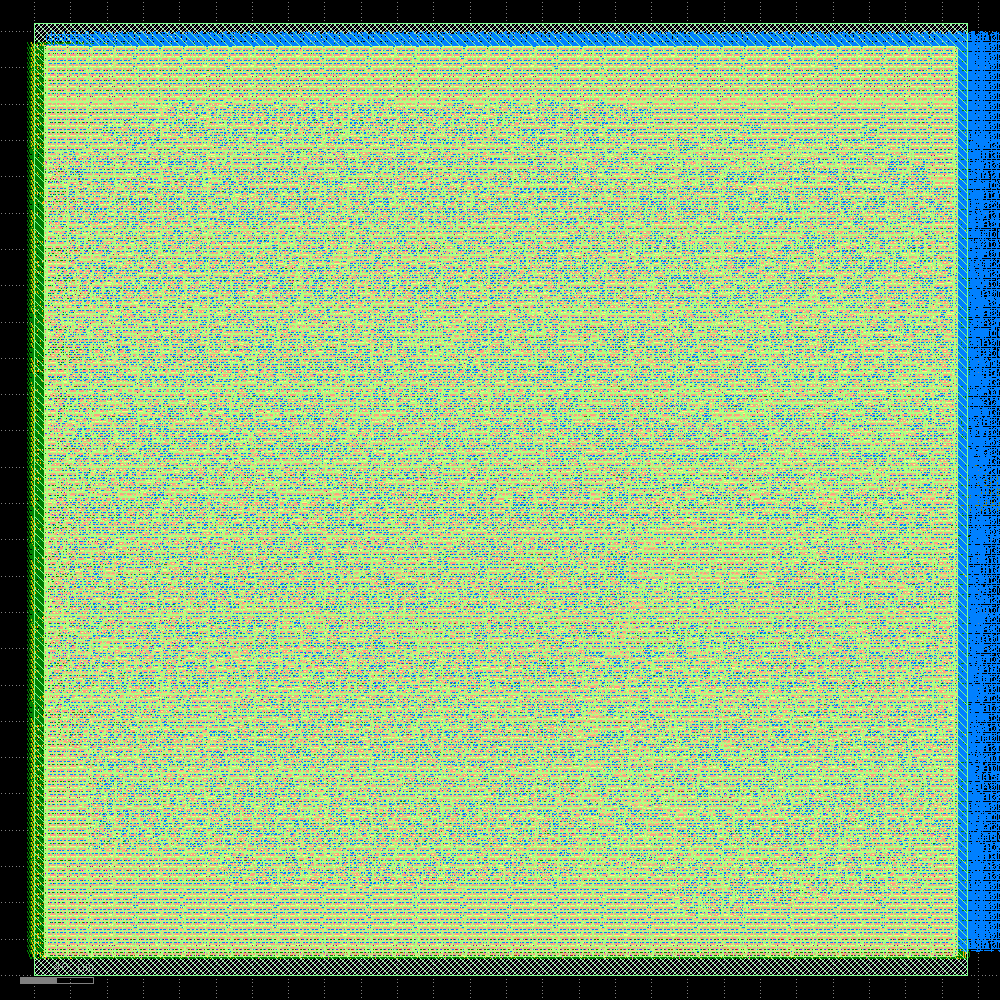

In [35]:
display(gds)

### Design Rule Checks (DRC)

DRC determines that the final layout does not violate any of the rules set by
the foundry to ensure the design is actually manufacturable- for example,
not enough space between two wires, *too much* space between tap cells, and so
on.

A design not passing DRC will typically be rejected by the foundry, who
also run DRC on their side.

In [36]:
DRC = Step.factory.get("Magic.DRC")

drc = DRC(state_in=gds.state_out)
drc.start()

─────────────────────────────────────────────── Design Rule Checks ────────────────────────────────────────────────

[07:19:43] VERBOSE  Running 'Magic.DRC'…                                                               ]8;id=294722;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=703350;file:///content/openlane_ipynb/openlane/steps/step.py#1088\1088]8;;\

[07:19:43] VERBOSE  Logging subprocess to ]8;id=270765;file:///content/openlane_run/16-magic-drc/magic-drc.log\openlane_run/]8;;\]8;id=332081;file:///content/openlane_run/16-magic-drc/magic-drc.log\16]8;;\]8;id=270765;file:///content/openlane_run/16-magic-drc/magic-drc.log\-magic-drc/magic-drc.log]8;;\…                     ]8;id=557058;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=623234;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\

Magic 8.3 revision 483 - Compiled on Sun Jun  2 18:57:41 UTC 2024.

Starting magic under Tcl interpreter

Using the terminal as the console.

Using NULL graphics device.

Processing system .magicrc file

Sourcing design .magicrc for technology sky130A ...

2 Magic internal units = 1 Lambda

Input style sky130(): scaleFactor=2, multiplier=2

The following types are not handled by extraction and will be treated as non-electrical types:

ubm

Scaled tech values by 2 / 1 to match internal grid scaling

Loading sky130A Device Generator Menu ...

Loading "/content/openlane_ipynb/openlane/scripts/magic/wrapper.tcl" from command line.

Warning: Calma reading is not undoable!  I hope that's OK.

Library written using GDS-II Release 6.0

Library name: LIB

Reading "VIA_M1M2_PR_MR".

Reading "VIA_M3M4_PR".

Reading "VIA_M2M3_PR".

Reading "VIA_L1M1_PR_MR".

Reading "VIA_M1M2_PR".

Reading "VIA_via2_3_2000_480_1_6_320_320".

Reading "VIA_via3_4_2000_480_1_5_400_400".

Reading "VIA_via4_5_2000_480_1_5_400_400".

Reading "VIA_via5_6_2000_2000_1_1_1600_1600".

Reading "sky130_fd_sc_hd__clkinv_16".

Reading "sky130_fd_sc_hd__clkinv_4".

Reading "sky130_fd_sc_hd__inv_12".

Reading "sky130_fd_sc_hd__inv_16".

Reading "sky130_fd_sc_hd__clkinvlp_4".

Reading "sky130_fd_sc_hd__clkinv_8".

Reading "sky130_fd_sc_hd__inv_8".

Reading "sky130_fd_sc_hd__bufinv_16".

Reading "sky130_fd_sc_hd__clkinv_2".

Reading "sky130_fd_sc_hd__clkbuf_4".

Reading "sky130_fd_sc_hd__inv_6".

Reading "sky130_fd_sc_hd__clkbuf_8".

Reading "sky130_fd_sc_hd__clkbuf_16".

Reading "sky130_fd_sc_hd__conb_1".

Reading "sky130_fd_sc_hd__dlxtn_1".

Reading "sky130_fd_sc_hd__dfrtp_2".

Reading "sky130_fd_sc_hd__dfxtp_2".

Reading "sky130_fd_sc_hd__buf_1".

Reading "sky130_fd_sc_hd__nor3b_2".

Reading "sky130_fd_sc_hd__o21bai_2".

Reading "sky130_fd_sc_hd__a41o_2".

Reading "sky130_fd_sc_hd__a311oi_2".

Reading "sky130_fd_sc_hd__nand3_2".

Reading "sky130_fd_sc_hd__o31ai_2".

Reading "sky130_fd_sc_hd__o21ba_2".

Reading "sky130_fd_sc_hd__o41a_2".

Reading "sky130_fd_sc_hd__o311ai_2".

Reading "sky130_fd_sc_hd__a31oi_2".

Reading "sky130_fd_sc_hd__o31a_2".

Reading "sky130_fd_sc_hd__a2111oi_2".

Reading "sky130_fd_sc_hd__nand4_2".

Reading "sky130_fd_sc_hd__nor3_2".

Reading "sky130_fd_sc_hd__and4b_2".

Reading "sky130_fd_sc_hd__o22ai_2".

Reading "sky130_fd_sc_hd__a211oi_2".

Reading "sky130_fd_sc_hd__nand4b_2".

Reading "sky130_fd_sc_hd__and4_2".

Reading "sky130_fd_sc_hd__o2111ai_2".

Reading "sky130_fd_sc_hd__or4_2".

Reading "sky130_fd_sc_hd__o221ai_2".

Reading "sky130_fd_sc_hd__a2111o_2".

Reading "sky130_fd_sc_hd__a22oi_2".

Reading "sky130_fd_sc_hd__and4bb_2".

Reading "sky130_fd_sc_hd__and3b_2".

Reading "sky130_fd_sc_hd__nor4_2".

Reading "sky130_fd_sc_hd__or4b_2".

Reading "sky130_fd_sc_hd__a221oi_2".

Reading "sky130_fd_sc_hd__or3b_2".

Reading "sky130_fd_sc_hd__o2111a_2".

Reading "sky130_fd_sc_hd__a21boi_2".

Reading "sky130_fd_sc_hd__a22o_2".

Reading "sky130_fd_sc_hd__xnor2_2".

Reading "sky130_fd_sc_hd__o211ai_2".

Reading "sky130_fd_sc_hd__a211o_2".

Reading "sky130_fd_sc_hd__xor2_2".

Reading "sky130_fd_sc_hd__o211a_2".

Reading "sky130_fd_sc_hd__o22a_2".

Reading "sky130_fd_sc_hd__a311o_2".

Reading "sky130_fd_sc_hd__mux2_1".

Reading "sky130_fd_sc_hd__o21a_2".

Reading "sky130_fd_sc_hd__or4bb_2".

Reading "sky130_fd_sc_hd__a32oi_2".

Reading "sky130_fd_sc_hd__a221o_2".

Reading "sky130_fd_sc_hd__o221a_2".

Reading "sky130_fd_sc_hd__a2bb2o_2".

Reading "sky130_fd_sc_hd__o2bb2a_2".

Reading "sky130_fd_sc_hd__nand3b_2".

Reading "sky130_fd_sc_hd__o21ai_2".

Reading "sky130_fd_sc_hd__a32o_2".

Reading "sky130_fd_sc_hd__o32a_2".

Reading "sky130_fd_sc_hd__a21bo_2".

Reading "sky130_fd_sc_hd__a31o_2".

Reading "sky130_fd_sc_hd__a21o_2".

Reading "sky130_fd_sc_hd__nand2_2".

Reading "sky130_fd_sc_hd__and2_2".

Reading "sky130_fd_sc_hd__a21oi_2".

Reading "sky130_fd_sc_hd__or3_2".

Reading "sky130_fd_sc_hd__and3_2".

Reading "sky130_fd_sc_hd__nand2b_2".

Reading "sky130_fd_sc_hd__and2b_2".

Reading "sky130_fd_sc_hd__or2_2".

Reading "sky130_fd_sc_hd__nor2_2".

Reading "sky130_fd_sc_hd__inv_2".

Reading "sky130_fd_sc_hd__tapvpwrvgnd_1".

Reading "sky130_fd_sc_hd__decap_8".

Reading "sky130_fd_sc_hd__decap_4".

Reading "sky130_fd_sc_hd__fill_2".

Reading "sky130_fd_sc_hd__decap_6".

Reading "sky130_fd_sc_hd__fill_1".

Reading "sky130_ef_sc_hd__decap_12".

Reading "sky130_fd_sc_hd__decap_3".

Reading "spm".

5000 uses

10000 uses

15000 uses

20000 uses

25000 uses

30000 uses

35000 uses

40000 uses

45000 uses

50000 uses

55000 uses

60000 uses

65000 uses

70000 uses

75000 uses

80000 uses

85000 uses

90000 uses

95000 uses

100000 uses

105000 uses

110000 uses

115000 uses

[INFO] Loading spm

DRC style is now "drc(full)"

Loading DRC CIF style.

No errors found.

[INFO] COUNT: 0

[INFO] Should be divided by 3 or 4

[INFO] DRC Checking DONE (/content/openlane_run/16-magic-drc/reports/drc_violations.magic.rpt)

[INFO] Saving mag view with DRC errors (/content/openlane_run/16-magic-drc/views/spm.drc.mag)

[INFO] Saved

{'nl': Path('/content/openlane_run/12-openroad-fillinsertion/spm.nl.v'), 'pnl': Path('/content/openlane_run/12-openroad-fillinsertion/spm.pnl.v'), 'pnl-sdf-friendly': None, 'pnl-npc': None, 'def': Path('/content/openlane_run/12-openroad-fillinsertion/spm.def'), 'lef': None, 'openroad-lef': None, 'odb': Path('/content/openlane_run/12-openroad-fillinsertion/spm.odb'), 'sdc': Path('/content/openlane_run/12-openroad-fillinsertion/spm.sdc'), 'sdf': {'nom_tt_025C_1v80': Path('/content/openlane_run/14-openroad-stapostpnr/nom_tt_025C_1v80/spm__nom_tt_025C_1v80.sdf'), 'nom_ss_100C_1v60': Path('/content/openlane_run/14-openroad-stapostpnr/nom_ss_100C_1v60/spm__nom_ss_100C_1v60.sdf'), 'nom_ff_n40C_1v95': Path('/content/openlane_run/14-openroad-stapostpnr/nom_ff_n40C_1v95/spm__nom_ff_n40C_1v95.sdf'), 'min_tt_025C_1v80': Path('/content/openlane_run/14-openroad-stapostpnr/min_tt_025C_1v80/spm__min_tt_025C_1v80.sdf'), 'min_ss_100C_1v60': Path('/content/openlane_run/14-openroad-stapostpnr/min_ss_100C_1v60/spm__min_ss_100C_1v60.sdf'), 'min_ff_n40C_1v95': Path('/content/openlane_run/14-openroad-stapostpnr/min_ff_n40C_1v95/spm__min_ff_n40C_1v95.sdf'), 'max_tt_025C_1v80': Path('/content/openlane_run/14-openroad-stapostpnr/max_tt_025C_1v80/spm__max_tt_025C_1v80.sdf'), 'max_ss_100C_1v60': Path('/content/openlane_run/14-openroad-stapostpnr/max_ss_100C_1v60/spm__max_ss_100C_1v60.sdf'), 'max_ff_n40C_1v95': Path('/content/openlane_run/14-openroad-stapostpnr/max_ff_n40C_1v95/spm__max_ff_n40C_1v95.sdf')}, 'spef': {'nom_*': Path('/content/openlane_run/13-openroad-rcx/nom/spm.nom.spef'), 'min_*': Path('/content/openlane_run/13-openroad-rcx/min/spm.min.spef'), 'max_*': Path('/content/openlane_run/13-openroad-rcx/max/spm.max.spef')}, 'lib': {'nom_tt_025C_1v80': Path('/content/openlane_run/14-openroad-stapostpnr/nom_tt_025C_1v80/spm__nom_tt_025C_1v80.lib'), 'nom_ss_100C_1v60': Path('/content/openlane_run/14-openroad-stapostpnr/nom_ss_100C_1v60/spm__nom_ss_100C_1v60.lib'), 'nom_ff_n40C_1v95': Path('/content/openlane_run/14-openroad-stapostpnr/nom_ff_n40C_1v95/spm__nom_ff_n40C_1v95.lib'), 'min_tt_025C_1v80': Path('/content/openlane_run/14-openroad-stapostpnr/min_tt_025C_1v80/spm__min_tt_025C_1v80.lib'), 'min_ss_100C_1v60': Path('/content/openlane_run/14-openroad-stapostpnr/min_ss_100C_1v60/spm__min_ss_100C_1v60.lib'), 'min_ff_n40C_1v95': Path('/content/openlane_run/14-openroad-stapostpnr/min_ff_n40C_1v95/spm__min_ff_n40C_1v95.lib'), 'max_tt_025C_1v80': Path('/content/openlane_run/14-openroad-stapostpnr/max_tt_025C_1v80/spm__max_tt_025C_1v80.lib'), 'max_ss_100C_1v60': Path('/content/openlane_run/14-openroad-stapostpnr/max_ss_100C_1v60/spm__max_ss_100C_1v60.lib'), 'max_ff_n40C_1v95': Path('/content/openlane_run/14-openroad-stapostpnr/max_ff_n40C_1v95/spm__max_ff_n40C_1v95.lib')}, 'spice': None, 'mag': None, 'gds': Path('/content/openlane_run/15-klayout-streamout/spm.gds'), 'mag_gds': None, 'klayout_gds': Path('/content/openlane_run/15-klayout-streamout/spm.klayout.gds'), 'json_h': None, 'vh': None, 'metrics': {'design__instance__count': 13508, 'design__instance__area': 136752, 'design__instance_unmapped__count': 0, 'synthesis__check_error__count': 0, 'design__die__bbox': '0.0 0.0 513.95 524.67', 'design__core__bbox': '5.52 10.88 508.3 511.36', 'flow__warnings__count': 1, 'flow__errors__count': 0, 'design__io': 9, 'design__die__area': 269654, 'design__core__area': 251631, 'design__instance__count__stdcell': 13508, 'design__instance__area__stdcell': 136752, 'design__instance__count__macros': 0, 'design__instance__area__macros': 0, 'design__instance__utilization': Decimal('0.543463'), 'design__instance__utilization__stdcell': Decimal('0.543463'), 'floorplan__design__io': 7, 'design__io__hpwl': 1839820, 'design__power_grid_violation__count__net:VGND': 0, 'design__power_grid_violation__count__net:VPWR': 0, 'design__power_grid_violation__count': 0, 'design__instance__displacement__total': Decimal('3595.89'), 'design__instance__displacement__mean': Decimal('0.259'), 'de

### SPICE Extraction for Layout vs. Schematic Check

This step tries to reconstruct a SPICE netlist from the GDSII file, so it can
later be used for the **Layout vs. Schematic** (LVS) check.

In [37]:
SpiceExtraction = Step.factory.get("Magic.SpiceExtraction")

spx = SpiceExtraction(state_in=drc.state_out)
spx.start()

───────────────────────────────────────────── SPICE Model Extraction ──────────────────────────────────────────────

[07:22:59] VERBOSE  Running 'Magic.SpiceExtraction'…                                                   ]8;id=165222;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=214376;file:///content/openlane_ipynb/openlane/steps/step.py#1088\1088]8;;\

[07:22:59] VERBOSE  Logging subprocess to                                                              ]8;id=910753;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=584699;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\
                    ]8;id=292069;file:///content/openlane_run/17-magic-spiceextraction/magic-spiceextraction.log\openlane_run/]8;;\]8;id=625446;file:///content/openlane_run/17-magic-spiceextraction/magic-spiceextraction.log\17]8;;\]8;id=292069;file:///content/openlane_run/17-magic-spiceextraction/magic-spiceextraction.log\-magic-spiceextraction/magic-spiceextraction.log]8;;\…                               

Magic 8.3 revision 483 - Compiled on Sun Jun  2 18:57:41 UTC 2024.

Starting magic under Tcl interpreter

Using the terminal as the console.

Using NULL graphics device.

Processing system .magicrc file

Sourcing design .magicrc for technology sky130A ...

2 Magic internal units = 1 Lambda

Input style sky130(): scaleFactor=2, multiplier=2

The following types are not handled by extraction and will be treated as non-electrical types:

ubm

Scaled tech values by 2 / 1 to match internal grid scaling

Loading sky130A Device Generator Menu ...

Loading "/content/openlane_ipynb/openlane/scripts/magic/wrapper.tcl" from command line.

> lef read /root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/techlef/sky130_fd_sc_hd__nom.tlef

Reading LEF data from file /root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/techlef/sky130_fd_sc_hd__nom.tlef.

This action cannot be undone.

LEF read, Line 78 (Message): Unknown keyword "ANTENNAMODEL" in LEF file; ignoring.

LEF read, Line 79 (Message): Unknown keyword "ANTENNADIFFSIDEAREARATIO" in LEF file; ignoring.

LEF read, Line 112 (Message): Unknown keyword "MINENCLOSEDAREA" in LEF file; ignoring.

LEF read, Line 114 (Message): Unknown keyword "ANTENNAMODEL" in LEF file; ignoring.

LEF read, Line 115 (Message): Unknown keyword "ANTENNADIFFSIDEAREARATIO" in LEF file; ignoring.

LEF read, Line 121 (Message): Unknown keyword "MAXIMUMDENSITY" in LEF file; ignoring.

LEF read, Line 122 (Message): Unknown keyword "DENSITYCHECKWINDOW" in LEF file; ignoring.

LEF read, Line 123 (Message): Unknown keyword "DENSITYCHECKSTEP" in LEF file; ignoring.

LEF read, Line 156 (Message): Unknown keyword "MINENCLOSEDAREA" in LEF file; ignoring.

LEF read, Line 164 (Message): Unknown keyword "ANTENNAMODEL" in LEF file; ignoring.

LEF read, Line 165 (Message): Unknown keyword "ANTENNADIFFSIDEAREARATIO" in LEF file; ignoring.

LEF read, Line 167 (Message): Unknown keyword "MAXIMUMDENSITY" in LEF file; ignoring.

LEF read, Line 168 (Message): Unknown keyword "DENSITYCHECKWINDOW" in LEF file; ignoring.

LEF read, Line 169 (Message): Unknown keyword "DENSITYCHECKSTEP" in LEF file; ignoring.

LEF read, Line 206 (Message): Unknown keyword "ANTENNAMODEL" in LEF file; ignoring.

LEF read, Line 207 (Message): Unknown keyword "ANTENNADIFFSIDEAREARATIO" in LEF file; ignoring.

LEF read, Line 209 (Message): Unknown keyword "MAXIMUMDENSITY" in LEF file; ignoring.

LEF read, Line 210 (Message): Unknown keyword "DENSITYCHECKWINDOW" in LEF file; ignoring.

LEF read, Line 211 (Message): Unknown keyword "DENSITYCHECKSTEP" in LEF file; ignoring.

LEF read, Line 248 (Message): Unknown keyword "ANTENNAMODEL" in LEF file; ignoring.

LEF read, Line 249 (Message): Unknown keyword "ANTENNADIFFSIDEAREARATIO" in LEF file; ignoring.

LEF read, Line 251 (Message): Unknown keyword "MAXIMUMDENSITY" in LEF file; ignoring.

LEF read, Line 252 (Message): Unknown keyword "DENSITYCHECKWINDOW" in LEF file; ignoring.

LEF read, Line 253 (Message): Unknown keyword "DENSITYCHECKSTEP" in LEF file; ignoring.

LEF read, Line 290 (Message): Unknown keyword "ANTENNAMODEL" in LEF file; ignoring.

LEF read, Line 291 (Message): Unknown keyword "ANTENNADIFFSIDEAREARATIO" in LEF file; ignoring.

LEF read: Processed 797 lines.

> lef read /root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/lef/sky130_ef_sc_hd.lef

Reading LEF data from file /root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/lef/sky130_ef_sc_hd.lef.

This action cannot be undone.

LEF read: Processed 278 lines.

> lef read /root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/lef/sky130_fd_sc_hd.lef

Reading LEF data from file /root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/lef/sky130_fd_sc_hd.lef.

This action cannot be undone.

LEF read: Processed 56535 lines.

> def read /content/openlane_run/12-openroad-fillinsertion/spm.def -noblockage -labels

Reading DEF data from file /content/openlane_run/12-openroad-fillinsertion/spm.def.

This action cannot be undone.

Processed 4 vias total.

Processed 28504 subcell instances total.

Processed 9 pins total.

Processed 2 special nets total.

Processed 9764 nets total.

DEF read: Processed 216536 lines.

Moving label "CAM.CAM.mem.mem\[0\]\[0\]" from metal1 to via1 in cell spm.

Moving label "CAM.CAM.mem.mem\[0\]\[8\]" from metal2 to via1 in cell spm.

Moving label "CAM.CAM.mem.mem\[10\]\[13\]" from metal2 to via2 in cell spm.

Moving label "CAM.CAM.mem.mem\[10\]\[22\]" from metal1 to viali in cell spm.

Moving label "CAM.CAM.mem.mem\[12\]\[28\]" from metal1 to via1 in cell spm.

Moving label "CAM.CAM.mem.mem\[14\]\[17\]" from metal2 to via1 in cell spm.

Moving label "CAM.CAM.mem.mem\[15\]\[12\]" from metal1 to via1 in cell spm.

Moving label "CAM.CAM.mem.mem\[2\]\[14\]" from metal1 to via1 in cell spm.

Moving label "CAM.CAM.mem.mem\[4\]\[10\]" from metal1 to via1 in cell spm.

Moving label "CAM.CAM.mem.mem\[4\]\[28\]" from metal1 to viali in cell spm.

Moving label "CAM.CAM.mem.mem\[4\]\[2\]" from metal1 to via1 in cell spm.

Moving label "CAM.CAM.mem.mem\[6\]\[15\]" from metal1 to via1 in cell spm.

Moving label "CAM.CAM.mem.mem\[8\]\[22\]" from metal1 to via1 in cell spm.

Moving label "CAM.CAM.mem.mem\[8\]\[31\]" from metal1 to via1 in cell spm.

Moving label "CAM.CAM.mem.mem\[9\]\[28\]" from metal2 to via1 in cell spm.

Moving label "CAM.CAM.mem.wa3\[22\]" from metal1 to via1 in cell spm.

Moving label "CAM.CAM.mem.wa3\[24\]" from metal1 to viali in cell spm.

Moving label "CAM.CAM.mem.wa3\[25\]" from metal1 to via1 in cell spm.

Moving label "CAM.CAM.mem.wa3\[28\]" from metal1 to via1 in cell spm.

Moving label "_00048_" from metal1 to via1 in cell spm.

Moving label "_00055_" from metal1 to via1 in cell spm.

Moving label "_00061_" from metal1 to via1 in cell spm.

Moving label "_00063_" from metal1 to via1 in cell spm.

Moving label "_00070_" from metal1 to via1 in cell spm.

Moving label "_00072_" from metal1 to via1 in cell spm.

Moving label "_00080_" from metal1 to via1 in cell spm.

Moving label "_00081_" from metal1 to via1 in cell spm.

Moving label "_00082_" from metal1 to via1 in cell spm.

Moving label "_00085_" from metal1 to via1 in cell spm.

Moving label "_00086_" from metal1 to via1 in cell spm.

Moving label "_00105_" from metal1 to via1 in cell spm.

Moving label "_00113_" from metal1 to via1 in cell spm.

Moving label "_00115_" from metal1 to via1 in cell spm.

Moving label "_00118_" from metal1 to via1 in cell spm.

Moving label "_00123_" from metal1 to via1 in cell spm.

Moving label "_00139_" from metal1 to via1 in cell spm.

Moving label "_00141_" from metal1 to via1 in cell spm.

Moving label "_00149_" from metal1 to via1 in cell spm.

Moving label "_00154_" from metal1 to via1 in cell spm.

Moving label "_00159_" from metal1 to via1 in cell spm.

Moving label "_00161_" from metal1 to via1 in cell spm.

Moving label "_00162_" from metal1 to via1 in cell spm.

Moving label "_00176_" from metal1 to via1 in cell spm.

Moving label "_00180_" from metal1 to via1 in cell spm.

Moving label "_00183_" from metal1 to via1 in cell spm.

Moving label "_00189_" from metal1 to via1 in cell spm.

Moving label "_00196_" from metal1 to via1 in cell spm.

Moving label "_00198_" from metal1 to via1 in cell spm.

Moving label "_00210_" from metal1 to viali in cell spm.

Moving label "_00214_" from metal1 to via1 in cell spm.

Moving label "_00227_" from metal1 to via1 in cell spm.

Moving label "_00245_" from metal1 to via1 in cell spm.

Moving label "_00257_" from metal1 to via1 in cell spm.

Moving label "_00258_" from metal1 to via1 in cell spm.

Moving label "_00260_" from metal1 to via1 in cell spm.

Moving label "_00266_" from metal1 to via1 in cell spm.

Moving label "_00272_" from metal1 to via1 in cell spm.

Moving label "_00279_" from metal1 to via1 in cell spm.

Moving label "_00294_" from metal1 to via1 in cell spm.

Moving label "_00302_" from metal1 to via1 in cell spm.

Moving label "_00309_" from metal1 to via1 in cell spm.

Moving label "_00314_" from metal1 to via1 in cell spm.

Moving label "_00337_" from metal1 to via1 in cell spm.

Moving label "_00339_" from metal1 to via1 in cell spm.

Moving label "_00347_" from metal1 to via1 in cell spm.

Moving label "_00348_" from metal1 to via1 in cell spm.

Moving label "_00364_" from metal1 to via1 in cell spm.

Moving label "_00385_" from metal1 to via1 in cell spm.

Moving label "_00388_" from metal1 to via1 in cell spm.

Moving label "_00410_" from metal1 to via1 in cell spm.

Moving label "_00411_" from metal1 to via1 in cell spm.

Moving label "_00414_" from metal1 to via1 in cell spm.

Moving label "_00418_" from metal1 to via1 in cell spm.

Moving label "_00422_" from metal1 to via1 in cell spm.

Moving label "_00425_" from metal1 to via1 in cell spm.

Moving label "_00435_" from metal1 to via1 in cell spm.

Moving label "_00437_" from metal1 to via1 in cell spm.

Moving label "_00438_" from metal1 to via1 in cell spm.

Moving label "_00443_" from metal1 to via1 in cell spm.

Moving label "_00452_" from metal1 to via1 in cell spm.

Moving label "_00460_" from metal1 to via1 in cell spm.

Moving label "_00461_" from metal1 to via1 in cell spm.

Moving label "_00467_" from metal1 to viali in cell spm.

Moving label "_00472_" from metal1 to via1 in cell spm.

Moving label "_00476_" from metal1 to via1 in cell spm.

Moving label "_00480_" from metal1 to via1 in cell spm.

Moving label "_00482_" from metal1 to via1 in cell spm.

Moving label "_00491_" from metal1 to via1 in cell spm.

Moving label "_00500_" from metal1 to via1 in cell spm.

Moving label "_00501_" from metal1 to via1 in cell spm.

Moving label "_00504_" from metal1 to via1 in cell spm.

Moving label "_00522_" from metal1 to viali in cell spm.

Moving label "_00527_" from metal1 to via1 in cell spm.

Moving label "_00542_" from metal1 to via1 in cell spm.

Moving label "_00546_" from metal1 to via1 in cell spm.

Moving label "_00548_" from metal1 to via1 in cell spm.

Moving label "_00552_" from metal1 to via1 in cell spm.

Moving label "_00562_" from metal1 to via1 in cell spm.

Moving label "_00563_" from metal1 to via1 in cell spm.

Moving label "_00571_" from metal1 to via1 in cell spm.

Moving label "_00578_" from metal1 to via1 in cell spm.

Moving label "_00579_" from metal1 to via1 in cell spm.

Moving label "_00602_" from metal1 to viali in cell spm.

Moving label "_00603_" from metal1 to via1 in cell spm.

Moving label "_00607_" from metal1 to via1 in cell spm.

Moving label "_00609_" from metal1 to via1 in cell spm.

Moving label "_00613_" from metal1 to via1 in cell spm.

Moving label "_00618_" from metal1 to via1 in cell spm.

Moving label "_00637_" from metal1 to via1 in cell spm.

Moving label "_00640_" from metal1 to viali in cell spm.

Moving label "_00647_" from metal1 to via1 in cell spm.

Moving label "_00649_" from metal1 to via1 in cell spm.

Moving label "_00654_" from metal1 to via1 in cell spm.

Moving label "_00656_" from metal1 to via1 in cell spm.

Moving label "_00661_" from metal1 to via1 in cell spm.

Moving label "_00668_" from metal1 to via1 in cell spm.

Moving label "_00683_" from metal1 to via1 in cell spm.

Moving label "_00690_" from metal1 to via1 in cell spm.

Moving label "_00700_" from metal1 to via1 in cell spm.

Moving label "_00701_" from metal1 to via1 in cell spm.

Moving label "_00711_" from metal1 to via1 in cell spm.

Moving label "_00712_" from metal1 to via1 in cell spm.

Moving label "_00715_" from metal1 to via1 in cell spm.

Moving label "_00716_" from metal1 to via1 in cell spm.

Moving label "_00720_" from metal1 to via1 in cell spm.

Moving label "_00734_" from metal1 to via1 in cell spm.

Moving label "_00736_" from metal1 to via1 in cell spm.

Moving label "_00746_" from metal1 to via1 in cell spm.

Moving label "_00750_" from metal1 to via1 in cell spm.

Moving label "_00760_" from metal1 to via1 in cell spm.

Moving label "_00767_" from metal1 to via1 in cell spm.

Moving label "_00778_" from metal1 to via1 in cell spm.

Moving label "_00783_" from metal1 to via1 in cell spm.

Moving label "_00790_" from metal1 to via1 in cell spm.

Moving label "_00795_" from metal1 to via1 in cell spm.

Moving label "_00806_" from metal1 to via1 in cell spm.

Moving label "_00807_" from metal1 to via1 in cell spm.

Moving label "_00811_" from metal1 to via1 in cell spm.

Moving label "_00819_" from metal1 to via1 in cell spm.

Moving label "_00844_" from metal1 to via1 in cell spm.

Moving label "_00848_" from metal1 to via1 in cell spm.

Moving label "_00863_" from metal1 to via1 in cell spm.

Moving label "_00877_" from metal1 to via1 in cell spm.

Moving label "_00892_" from metal1 to via1 in cell spm.

Moving label "_00902_" from metal1 to via1 in cell spm.

Moving label "_00906_" from metal1 to via1 in cell spm.

Moving label "_00911_" from metal1 to viali in cell spm.

Moving label "_00918_" from metal1 to via1 in cell spm.

Moving label "_00932_" from metal1 to via1 in cell spm.

Moving label "_00934_" from metal1 to via1 in cell spm.

Moving label "_00938_" from metal1 to via1 in cell spm.

Moving label "_00939_" from metal1 to via1 in cell spm.

Moving label "_00945_" from metal1 to via1 in cell spm.

Moving label "_00954_" from metal1 to via1 in cell spm.

Moving label "_00955_" from metal1 to via1 in cell spm.

Moving label "_00964_" from metal1 to via1 in cell spm.

Moving label "_00988_" from metal1 to via1 in cell spm.

Moving label "_00994_" from metal1 to via1 in cell spm.

Moving label "_00998_" from metal1 to via1 in cell spm.

Moving label "_00999_" from metal1 to viali in cell spm.

Moving label "_01006_" from metal1 to via1 in cell spm.

Moving label "_01032_" from metal1 to viali in cell spm.

Moving label "_01033_" from metal1 to via1 in cell spm.

Moving label "_01036_" from metal1 to via1 in cell spm.

Moving label "_01052_" from metal1 to via1 in cell spm.

Moving label "_01053_" from metal1 to viali in cell spm.

Moving label "_01065_" from metal1 to via1 in cell spm.

Moving label "_01070_" from metal1 to via1 in cell spm.

Moving label "_01075_" from metal1 to via1 in cell spm.

Moving label "_01076_" from metal1 to via1 in cell spm.

Moving label "_01084_" from metal1 to viali in cell spm.

Moving label "_01085_" from metal1 to via1 in cell spm.

Moving label "_01087_" from metal1 to via1 in cell spm.

Moving label "_01105_" from metal1 to via1 in cell spm.

Moving label "_01114_" from metal1 to via1 in cell spm.

Moving label "_01133_" from metal1 to via1 in cell spm.

Moving label "_01135_" from metal1 to via1 in cell spm.

Moving label "_01151_" from metal1 to via1 in cell spm.

Moving label "_01156_" from metal1 to via1 in cell spm.

Moving label "_01161_" from metal1 to via1 in cell spm.

Moving label "_01165_" from metal1 to via1 in cell spm.

Moving label "_01181_" from metal1 to via1 in cell spm.

Moving label "_01199_" from metal1 to via1 in cell spm.

Moving label "_01203_" from metal1 to via1 in cell spm.

Moving label "_01206_" from metal1 to via1 in cell spm.

Moving label "_01226_" from metal1 to via1 in cell spm.

Moving label "_01227_" from metal1 to via1 in cell spm.

Moving label "_01230_" from metal1 to via1 in cell spm.

Moving label "_01234_" from metal1 to via1 in cell spm.

Moving label "_01238_" from metal1 to viali in cell spm.

Moving label "_01269_" from metal1 to via1 in cell spm.

Moving label "_01278_" from metal1 to via1 in cell spm.

Moving label "_01279_" from metal1 to via1 in cell spm.

Moving label "_01287_" from metal1 to via1 in cell spm.

Moving label "_01291_" from metal1 to via1 in cell spm.

Moving label "_01294_" from metal1 to via1 in cell spm.

Moving label "_01298_" from metal1 to via1 in cell spm.

Moving label "_01307_" from metal1 to via1 in cell spm.

Moving label "_01328_" from metal1 to via1 in cell spm.

Moving label "_01342_" from metal1 to via1 in cell spm.

Moving label "_01350_" from metal1 to via1 in cell spm.

Moving label "_01351_" from metal1 to via1 in cell spm.

Moving label "_01358_" from metal1 to via1 in cell spm.

Moving label "_01360_" from metal1 to via1 in cell spm.

Moving label "_01362_" from metal1 to via1 in cell spm.

Moving label "_01369_" from metal1 to via1 in cell spm.

Moving label "_01376_" from metal1 to via1 in cell spm.

Moving label "_01378_" from metal1 to via1 in cell spm.

Moving label "_01381_" from metal1 to via1 in cell spm.

Moving label "_01382_" from metal1 to viali in cell spm.

Moving label "_01392_" from metal1 to via1 in cell spm.

Moving label "_01393_" from metal1 to via1 in cell spm.

Moving label "_01394_" from metal1 to via1 in cell spm.

Moving label "_01438_" from metal1 to via1 in cell spm.

Moving label "_01442_" from metal1 to via1 in cell spm.

Moving label "_01457_" from metal1 to via1 in cell spm.

Moving label "_01473_" from metal1 to via1 in cell spm.

Moving label "_01476_" from metal1 to via1 in cell spm.

Moving label "_01495_" from metal1 to via1 in cell spm.

Moving label "_01509_" from metal1 to via1 in cell spm.

Moving label "_01513_" from metal1 to via1 in cell spm.

Moving label "_01524_" from metal1 to via1 in cell spm.

Moving label "_01526_" from metal1 to via1 in cell spm.

Moving label "_01527_" from metal1 to via1 in cell spm.

Moving label "_01534_" from metal1 to via1 in cell spm.

Moving label "_01538_" from metal1 to via1 in cell spm.

Moving label "_01539_" from metal1 to via1 in cell spm.

Moving label "_01549_" from metal1 to via1 in cell spm.

Moving label "_01550_" from metal1 to via1 in cell spm.

Moving label "_01553_" from metal1 to via1 in cell spm.

Moving label "_01554_" from metal1 to via1 in cell spm.

Moving label "_01559_" from metal1 to viali in cell spm.

Moving label "_01567_" from metal1 to via1 in cell spm.

Moving label "_01580_" from metal1 to via1 in cell spm.

Moving label "_01590_" from metal1 to via1 in cell spm.

Moving label "_01593_" from metal1 to via1 in cell spm.

Moving label "_01599_" from metal1 to via1 in cell spm.

Moving label "_01621_" from metal1 to via1 in cell spm.

Moving label "_01632_" from metal1 to via1 in cell spm.

Moving label "_01648_" from metal1 to via1 in cell spm.

Moving label "_01652_" from metal1 to via1 in cell spm.

Moving label "_01667_" from metal1 to via1 in cell spm.

Moving label "_01669_" from metal1 to via1 in cell spm.

Moving label "_01671_" from metal1 to via1 in cell spm.

Moving label "_01680_" from metal1 to via1 in cell spm.

Moving label "_01687_" from metal1 to via1 in cell spm.

Moving label "_01688_" from metal1 to via1 in cell spm.

Moving label "_01694_" from metal1 to via1 in cell spm.

Moving label "_01700_" from metal1 to via1 in cell spm.

Moving label "_01703_" from metal1 to via1 in cell spm.

Moving label "_01710_" from metal1 to via1 in cell spm.

Moving label "_01724_" from metal1 to via1 in cell spm.

Moving label "_01725_" from metal1 to via1 in cell spm.

Moving label "_01726_" from metal1 to via1 in cell spm.

Moving label "_01730_" from metal1 to viali in cell spm.

Moving label "_01738_" from metal1 to via1 in cell spm.

Moving label "_01761_" from metal1 to via1 in cell spm.

Moving label "_01764_" from metal1 to via1 in cell spm.

Moving label "_01766_" from metal1 to via1 in cell spm.

Moving label "_01772_" from metal1 to via1 in cell spm.

Moving label "_01788_" from metal1 to via1 in cell spm.

Moving label "_01797_" from metal1 to via1 in cell spm.

Moving label "_01798_" from metal1 to via1 in cell spm.

Moving label "_01804_" from metal1 to via1 in cell spm.

Moving label "_01809_" from metal1 to via1 in cell spm.

Moving label "_01818_" from metal1 to via1 in cell spm.

Moving label "_01822_" from metal1 to via1 in cell spm.

Moving label "_01833_" from metal1 to via1 in cell spm.

Moving label "_01835_" from metal1 to via1 in cell spm.

Moving label "_01855_" from metal1 to via1 in cell spm.

Moving label "_01866_" from metal1 to via1 in cell spm.

Moving label "_01871_" from metal1 to via1 in cell spm.

Moving label "_01876_" from metal1 to via1 in cell spm.

Moving label "_01887_" from metal1 to via1 in cell spm.

Moving label "_01909_" from metal1 to via1 in cell spm.

Moving label "_01928_" from metal1 to via1 in cell spm.

Moving label "_01932_" from metal1 to via1 in cell spm.

Moving label "_01942_" from metal1 to via1 in cell spm.

Moving label "_01950_" from metal1 to via1 in cell spm.

Moving label "_01957_" from metal1 to via1 in cell spm.

Moving label "_01976_" from metal1 to via1 in cell spm.

Moving label "_01977_" from metal1 to via1 in cell spm.

Moving label "_01992_" from metal1 to via1 in cell spm.

Moving label "_01994_" from metal1 to via1 in cell spm.

Moving label "_02005_" from metal1 to via1 in cell spm.

Moving label "_02010_" from metal1 to via1 in cell spm.

Moving label "_02020_" from metal1 to via1 in cell spm.

Moving label "_02033_" from metal1 to via1 in cell spm.

Moving label "_02036_" from metal1 to via1 in cell spm.

Moving label "_02044_" from metal1 to via1 in cell spm.

Moving label "_02052_" from metal1 to via1 in cell spm.

Moving label "_02057_" from metal1 to via1 in cell spm.

Moving label "_02066_" from metal1 to via1 in cell spm.

Moving label "_02069_" from metal1 to via1 in cell spm.

Moving label "_02076_" from metal1 to viali in cell spm.

Moving label "_02080_" from metal1 to via1 in cell spm.

Moving label "_02092_" from metal1 to via1 in cell spm.

Moving label "_02103_" from metal1 to via1 in cell spm.

Moving label "_02125_" from metal1 to via1 in cell spm.

Moving label "_02128_" from metal1 to viali in cell spm.

Moving label "_02135_" from metal1 to via1 in cell spm.

Moving label "_02137_" from metal1 to viali in cell spm.

Moving label "_02141_" from metal1 to via1 in cell spm.

Moving label "_02169_" from metal1 to via1 in cell spm.

Moving label "_02173_" from metal1 to via1 in cell spm.

Moving label "_02191_" from metal1 to via1 in cell spm.

Moving label "_02209_" from metal1 to via1 in cell spm.

Moving label "_02211_" from metal1 to via1 in cell spm.

Moving label "_02219_" from metal1 to via1 in cell spm.

Moving label "_02229_" from metal1 to via1 in cell spm.

Moving label "_02230_" from metal1 to via1 in cell spm.

Moving label "_02242_" from metal1 to via1 in cell spm.

Moving label "_02243_" from metal1 to via1 in cell spm.

Moving label "_02261_" from metal1 to via1 in cell spm.

Moving label "_02269_" from metal1 to viali in cell spm.

Moving label "_02271_" from metal1 to via1 in cell spm.

Moving label "_02283_" from metal1 to via1 in cell spm.

Moving label "_02287_" from metal1 to via1 in cell spm.

Moving label "_02291_" from metal1 to via1 in cell spm.

Moving label "_02297_" from metal1 to via1 in cell spm.

Moving label "_02310_" from metal1 to via1 in cell spm.

Moving label "_02316_" from metal1 to via1 in cell spm.

Moving label "_02317_" from metal1 to via1 in cell spm.

Moving label "_02323_" from metal1 to via1 in cell spm.

Moving label "_02338_" from metal1 to via1 in cell spm.

Moving label "_02342_" from metal1 to via1 in cell spm.

Moving label "_02344_" from metal1 to via1 in cell spm.

Moving label "_02367_" from metal1 to via1 in cell spm.

Moving label "_02380_" from metal1 to via1 in cell spm.

Moving label "_02392_" from metal1 to via1 in cell spm.

Moving label "_02406_" from metal1 to via1 in cell spm.

Moving label "_02409_" from metal1 to via1 in cell spm.

Moving label "_02412_" from metal1 to via1 in cell spm.

Moving label "_02420_" from metal1 to via1 in cell spm.

Moving label "_02430_" from metal1 to via1 in cell spm.

Moving label "_02433_" from metal1 to via1 in cell spm.

Moving label "_02443_" from metal1 to via1 in cell spm.

Moving label "_02451_" from metal1 to via1 in cell spm.

Moving label "_02455_" from metal1 to via1 in cell spm.

Moving label "_02467_" from metal1 to via1 in cell spm.

Moving label "_02468_" from metal1 to via1 in cell spm.

Moving label "_02470_" from metal1 to via1 in cell spm.

Moving label "_02483_" from metal1 to via1 in cell spm.

Moving label "_02490_" from metal1 to via1 in cell spm.

Moving label "_02504_" from metal1 to via1 in cell spm.

Moving label "_02521_" from metal1 to via1 in cell spm.

Moving label "_02522_" from metal1 to via1 in cell spm.

Moving label "_02523_" from metal1 to via1 in cell spm.

Moving label "_02525_" from metal1 to via1 in cell spm.

Moving label "_02535_" from metal1 to via1 in cell spm.

Moving label "_02536_" from metal1 to via1 in cell spm.

Moving label "_02556_" from metal1 to via1 in cell spm.

Moving label "_02572_" from metal1 to via1 in cell spm.

Moving label "_02577_" from metal1 to via1 in cell spm.

Moving label "_02593_" from metal1 to via1 in cell spm.

Moving label "_02610_" from metal1 to via1 in cell spm.

Moving label "_02616_" from metal1 to via1 in cell spm.

Moving label "_02617_" from metal1 to via1 in cell spm.

Moving label "_02618_" from metal1 to via1 in cell spm.

Moving label "_02621_" from metal1 to via1 in cell spm.

Moving label "_02623_" from metal1 to via1 in cell spm.

Moving label "_02626_" from metal1 to via1 in cell spm.

Moving label "_02631_" from metal1 to via1 in cell spm.

Moving label "_02638_" from metal1 to via1 in cell spm.

Moving label "_02656_" from metal1 to via1 in cell spm.

Moving label "_02659_" from metal1 to via1 in cell spm.

Moving label "_02672_" from metal1 to via1 in cell spm.

Moving label "_02674_" from metal1 to via1 in cell spm.

Moving label "_02676_" from metal1 to via1 in cell spm.

Moving label "_02677_" from metal1 to via1 in cell spm.

Moving label "_02685_" from metal1 to via1 in cell spm.

Moving label "_02690_" from metal1 to via1 in cell spm.

Moving label "_02692_" from metal1 to via1 in cell spm.

Moving label "_02696_" from metal1 to via1 in cell spm.

Moving label "_02706_" from metal1 to via1 in cell spm.

Moving label "_02741_" from metal1 to viali in cell spm.

Moving label "_02744_" from metal1 to via1 in cell spm.

Moving label "_02749_" from metal1 to via1 in cell spm.

Moving label "_02772_" from metal1 to via1 in cell spm.

Moving label "_02780_" from metal1 to via1 in cell spm.

Moving label "_02782_" from metal1 to via1 in cell spm.

Moving label "_02786_" from metal1 to viali in cell spm.

Moving label "_02793_" from metal1 to via1 in cell spm.

Moving label "_02807_" from metal1 to via1 in cell spm.

Moving label "_02813_" from metal1 to via1 in cell spm.

Moving label "_02816_" from metal1 to via1 in cell spm.

Moving label "_02825_" from metal1 to via1 in cell spm.

Moving label "_02830_" from metal1 to via1 in cell spm.

Moving label "_02832_" from metal1 to via1 in cell spm.

Moving label "_02836_" from metal1 to via1 in cell spm.

Moving label "_02845_" from metal1 to via1 in cell spm.

Moving label "_02849_" from metal1 to via1 in cell spm.

Moving label "_02850_" from metal1 to via1 in cell spm.

Moving label "_02861_" from metal1 to via1 in cell spm.

Moving label "_02864_" from metal1 to via1 in cell spm.

Moving label "_02875_" from metal1 to via1 in cell spm.

Moving label "_02882_" from metal1 to via1 in cell spm.

Moving label "_02891_" from metal1 to via1 in cell spm.

Moving label "_02898_" from metal1 to via1 in cell spm.

Moving label "_02913_" from metal1 to viali in cell spm.

Moving label "_02925_" from metal1 to via1 in cell spm.

Moving label "_02927_" from metal1 to via1 in cell spm.

Moving label "_02930_" from metal1 to via1 in cell spm.

Moving label "_02933_" from metal1 to via1 in cell spm.

Moving label "_02935_" from metal1 to via1 in cell spm.

Moving label "_02963_" from metal2 to via2 in cell spm.

Moving label "_03006_" from metal3 to via3 in cell spm.

Moving label "_03044_" from metal3 to via3 in cell spm.

Moving label "_03065_" from metal1 to via1 in cell spm.

Moving label "_03082_" from metal1 to via1 in cell spm.

Moving label "_03116_" from metal1 to via1 in cell spm.

Moving label "_03126_" from metal2 to via2 in cell spm.

Moving label "_03148_" from metal3 to via3 in cell spm.

Moving label "_03243_" from metal1 to via1 in cell spm.

Moving label "_03261_" from metal1 to viali in cell spm.

Moving label "_03263_" from metal3 to via3 in cell spm.

Moving label "_03370_" from metal2 to via2 in cell spm.

Moving label "_03376_" from metal1 to via1 in cell spm.

Moving label "_03379_" from metal2 to via2 in cell spm.

Moving label "_03392_" from metal2 to via1 in cell spm.

Moving label "_03409_" from metal2 to via2 in cell spm.

Moving label "_03410_" from metal2 to via2 in cell spm.

Moving label "_03413_" from metal2 to via2 in cell spm.

Moving label "_03430_" from metal2 to via1 in cell spm.

Moving label "_03457_" from metal2 to via2 in cell spm.

Moving label "_03467_" from metal1 to viali in cell spm.

Moving label "_03478_" from metal3 to via3 in cell spm.

Moving label "_03541_" from metal2 to via2 in cell spm.

Moving label "_03543_" from metal2 to via2 in cell spm.

Moving label "_03557_" from metal1 to via1 in cell spm.

Moving label "_03587_" from metal1 to via1 in cell spm.

Moving label "_03649_" from metal3 to via3 in cell spm.

Moving label "_03719_" from metal2 to via2 in cell spm.

Moving label "_03720_" from metal3 to via3 in cell spm.

Moving label "_03775_" from metal1 to via1 in cell spm.

Moving label "_03785_" from metal3 to via3 in cell spm.

Moving label "_03790_" from metal2 to via2 in cell spm.

Moving label "_03834_" from metal3 to via3 in cell spm.

Moving label "_03851_" from metal2 to via2 in cell spm.

Moving label "_03860_" from metal1 to viali in cell spm.

Moving label "_03880_" from metal2 to via2 in cell spm.

Moving label "_03909_" from metal2 to via2 in cell spm.

Moving label "_03920_" from metal1 to via1 in cell spm.

Moving label "_03949_" from metal1 to via1 in cell spm.

Moving label "_03958_" from metal1 to viali in cell spm.

Moving label "_03959_" from metal1 to via1 in cell spm.

Moving label "_03960_" from metal1 to via1 in cell spm.

Moving label "_03969_" from metal1 to via1 in cell spm.

Moving label "_03973_" from metal1 to via1 in cell spm.

Moving label "_03979_" from metal1 to via1 in cell spm.

Moving label "_04001_" from metal1 to via1 in cell spm.

Moving label "_04004_" from metal1 to via1 in cell spm.

Moving label "_04015_" from metal1 to viali in cell spm.

Moving label "_04030_" from metal1 to via1 in cell spm.

Moving label "_04031_" from metal2 to via2 in cell spm.

Moving label "_04037_" from metal2 to via1 in cell spm.

Moving label "_04041_" from metal1 to via1 in cell spm.

Moving label "_04067_" from metal1 to via1 in cell spm.

Moving label "_04076_" from metal3 to via2 in cell spm.

Moving label "_04108_" from metal1 to via1 in cell spm.

Moving label "_04111_" from metal1 to via1 in cell spm.

Moving label "_04116_" from metal1 to viali in cell spm.

Moving label "_04124_" from metal1 to via1 in cell spm.

Moving label "_04126_" from metal2 to via2 in cell spm.

Moving label "_04191_" from metal1 to via1 in cell spm.

Moving label "_04196_" from metal1 to via1 in cell spm.

Moving label "_04215_" from metal1 to via1 in cell spm.

Moving label "_04218_" from metal1 to via1 in cell spm.

Moving label "_04221_" from metal1 to via1 in cell spm.

Moving label "_04229_" from metal1 to viali in cell spm.

Moving label "_04235_" from metal1 to via1 in cell spm.

Moving label "_04261_" from metal1 to viali in cell spm.

Moving label "_04275_" from metal1 to via1 in cell spm.

Moving label "_04280_" from metal1 to viali in cell spm.

Moving label "_04289_" from metal1 to via1 in cell spm.

Moving label "_04291_" from metal2 to via1 in cell spm.

Moving label "_04306_" from metal1 to via1 in cell spm.

Moving label "_04344_" from metal1 to via1 in cell spm.

Moving label "_04359_" from metal1 to via1 in cell spm.

Moving label "_04372_" from metal1 to via1 in cell spm.

Moving label "_04385_" from metal1 to via1 in cell spm.

Moving label "_04435_" from metal2 to via2 in cell spm.

Moving label "_04440_" from metal1 to via1 in cell spm.

Moving label "_04446_" from metal1 to viali in cell spm.

Moving label "_04462_" from metal1 to viali in cell spm.

Moving label "_04490_" from metal2 to via1 in cell spm.

Moving label "_04492_" from metal2 to via1 in cell spm.

Moving label "_04592_" from metal2 to via2 in cell spm.

Moving label "_04622_" from metal1 to viali in cell spm.

Moving label "_04624_" from metal1 to viali in cell spm.

Moving label "_04708_" from metal1 to via1 in cell spm.

Moving label "_04752_" from metal1 to viali in cell spm.

Moving label "_04757_" from metal1 to viali in cell spm.

Moving label "_04760_" from metal2 to via2 in cell spm.

Moving label "_04772_" from metal1 to via1 in cell spm.

Moving label "_04825_" from metal3 to via3 in cell spm.

Moving label "_04847_" from metal1 to viali in cell spm.

Moving label "_04860_" from metal1 to via1 in cell spm.

Moving label "_04924_" from metal1 to via1 in cell spm.

Moving label "_04930_" from metal1 to via1 in cell spm.

Moving label "_04931_" from metal2 to via1 in cell spm.

Moving label "_04942_" from metal1 to viali in cell spm.

Moving label "_04967_" from metal1 to via1 in cell spm.

Moving label "_04998_" from metal1 to via1 in cell spm.

Moving label "_05060_" from metal1 to via1 in cell spm.

Moving label "_05062_" from metal1 to via1 in cell spm.

Moving label "_05065_" from metal1 to via1 in cell spm.

Moving label "_05105_" from metal1 to via1 in cell spm.

Moving label "_05176_" from metal1 to via1 in cell spm.

Moving label "_05225_" from metal2 to via1 in cell spm.

Moving label "_05241_" from metal1 to via1 in cell spm.

Moving label "_05242_" from metal2 to via2 in cell spm.

Moving label "_05243_" from metal2 to via2 in cell spm.

Moving label "_05365_" from metal2 to via2 in cell spm.

Moving label "_05408_" from metal1 to via1 in cell spm.

Moving label "_05413_" from metal1 to via1 in cell spm.

Moving label "_05430_" from metal1 to via1 in cell spm.

Moving label "_05447_" from metal2 to via1 in cell spm.

Moving label "_05452_" from metal2 to via2 in cell spm.

Moving label "_05497_" from metal2 to via2 in cell spm.

Moving label "_05566_" from metal2 to via2 in cell spm.

Moving label "_05589_" from metal3 to via3 in cell spm.

Moving label "_05711_" from metal1 to via1 in cell spm.

Moving label "_05719_" from metal1 to via1 in cell spm.

Moving label "_05777_" from metal1 to via1 in cell spm.

Moving label "_05809_" from metal2 to via2 in cell spm.

Moving label "_05894_" from metal1 to via1 in cell spm.

Moving label "_05901_" from metal1 to via1 in cell spm.

Moving label "_05939_" from metal1 to via1 in cell spm.

Moving label "_05960_" from metal2 to via2 in cell spm.

Moving label "_05973_" from metal2 to via1 in cell spm.

Moving label "_05985_" from metal1 to via1 in cell spm.

Moving label "_05998_" from metal2 to via2 in cell spm.

Moving label "_06009_" from metal2 to via2 in cell spm.

Moving label "_06014_" from metal3 to via3 in cell spm.

Moving label "_06020_" from metal2 to via2 in cell spm.

Moving label "_06023_" from metal2 to via1 in cell spm.

Moving label "_06029_" from metal2 to via2 in cell spm.

Moving label "_06039_" from metal1 to via1 in cell spm.

Moving label "_06048_" from metal2 to via2 in cell spm.

Moving label "_06078_" from metal3 to via3 in cell spm.

Moving label "_06083_" from metal3 to via3 in cell spm.

Moving label "_06099_" from metal1 to via1 in cell spm.

Moving label "_06137_" from metal1 to viali in cell spm.

Moving label "_06142_" from metal2 to via1 in cell spm.

Moving label "_06184_" from metal2 to via2 in cell spm.

Moving label "_06274_" from metal2 to via2 in cell spm.

Moving label "_06285_" from metal3 to via3 in cell spm.

Moving label "_06317_" from metal1 to viali in cell spm.

Moving label "_06333_" from metal2 to via2 in cell spm.

Moving label "_06348_" from metal1 to viali in cell spm.

Moving label "_06375_" from metal2 to via2 in cell spm.

Moving label "_06407_" from metal2 to via2 in cell spm.

Moving label "_06423_" from metal3 to via3 in cell spm.

Moving label "_06437_" from metal1 to via1 in cell spm.

Moving label "_06462_" from metal2 to via2 in cell spm.

Moving label "_06495_" from metal2 to via2 in cell spm.

Moving label "clknet_4_0_0_clk" from metal2 to via2 in cell spm.

Moving label "clknet_leaf_155_clk" from metal1 to via1 in cell spm.

Moving label "clknet_leaf_49_clk" from metal2 to via1 in cell spm.

Moving label "dmem.RAM\[10\]\[20\]" from metal1 to via1 in cell spm.

Moving label "dmem.RAM\[10\]\[25\]" from metal1 to via1 in cell spm.

Moving label "dmem.RAM\[10\]\[5\]" from metal1 to via1 in cell spm.

Moving label "dmem.RAM\[10\]\[6\]" from metal1 to via1 in cell spm.

Moving label "dmem.RAM\[11\]\[10\]" from metal1 to viali in cell spm.

Moving label "dmem.RAM\[11\]\[18\]" from metal1 to via1 in cell spm.

Moving label "dmem.RAM\[11\]\[6\]" from metal1 to via1 in cell spm.

Moving label "dmem.RAM\[11\]\[8\]" from metal1 to via1 in cell spm.

Moving label "dmem.RAM\[12\]\[7\]" from metal1 to via1 in cell spm.

Moving label "dmem.RAM\[13\]\[26\]" from metal1 to via1 in cell spm.

Moving label "dmem.RAM\[14\]\[11\]" from metal1 to via1 in cell spm.

Moving label "dmem.RAM\[14\]\[1\]" from metal1 to via1 in cell spm.

Moving label "dmem.RAM\[14\]\[29\]" from metal1 to via1 in cell spm.

Moving label "dmem.RAM\[14\]\[2\]" from metal1 to viali in cell spm.

Moving label "dmem.RAM\[14\]\[3\]" from metal1 to via1 in cell spm.

Moving label "dmem.RAM\[17\]\[26\]" from metal1 to viali in cell spm.

Moving label "dmem.RAM\[18\]\[0\]" from metal1 to via1 in cell spm.

Moving label "dmem.RAM\[18\]\[22\]" from metal1 to via1 in cell spm.

Moving label "dmem.RAM\[18\]\[30\]" from metal1 to via1 in cell spm.

Moving label "dmem.RAM\[18\]\[31\]" from metal1 to via1 in cell spm.

Moving label "dmem.RAM\[19\]\[0\]" from metal1 to via1 in cell spm.

Moving label "dmem.RAM\[19\]\[21\]" from metal1 to via1 in cell spm.

Moving label "dmem.RAM\[19\]\[26\]" from metal1 to via1 in cell spm.

Moving label "dmem.RAM\[1\]\[0\]" from metal1 to via1 in cell spm.

Moving label "dmem.RAM\[1\]\[6\]" from metal1 to via1 in cell spm.

Moving label "dmem.RAM\[20\]\[1\]" from metal1 to via1 in cell spm.

Moving label "dmem.RAM\[20\]\[30\]" from metal1 to via1 in cell spm.

Moving label "dmem.RAM\[20\]\[31\]" from metal1 to viali in cell spm.

Moving label "dmem.RAM\[20\]\[9\]" from metal1 to via1 in cell spm.

Moving label "dmem.RAM\[21\]\[19\]" from metal1 to via1 in cell spm.

Moving label "dmem.RAM\[21\]\[26\]" from metal1 to via1 in cell spm.

Moving label "dmem.RAM\[22\]\[16\]" from metal1 to via1 in cell spm.

Moving label "dmem.RAM\[22\]\[21\]" from metal1 to via1 in cell spm.

Moving label "dmem.RAM\[22\]\[24\]" from metal1 to via1 in cell spm.

Moving label "dmem.RAM\[22\]\[25\]" from metal1 to viali in cell spm.

Moving label "dmem.RAM\[22\]\[27\]" from metal1 to via1 in cell spm.

Moving label "dmem.RAM\[22\]\[6\]" from metal1 to viali in cell spm.

Moving label "dmem.RAM\[22\]\[8\]" from metal1 to via1 in cell spm.

Moving label "dmem.RAM\[23\]\[13\]" from metal1 to via1 in cell spm.

Moving label "dmem.RAM\[23\]\[14\]" from metal1 to via1 in cell spm.

Moving label "dmem.RAM\[24\]\[7\]" from metal1 to via1 in cell spm.

Moving label "dmem.RAM\[25\]\[22\]" from metal1 to via1 in cell spm.

Moving label "dmem.RAM\[25\]\[27\]" from metal1 to via1 in cell spm.

Moving label "dmem.RAM\[25\]\[29\]" from metal1 to via1 in cell spm.

Moving label "dmem.RAM\[25\]\[8\]" from metal1 to via1 in cell spm.

Moving label "dmem.RAM\[26\]\[10\]" from metal1 to via1 in cell spm.

Moving label "dmem.RAM\[26\]\[1\]" from metal1 to via1 in cell spm.

Moving label "dmem.RAM\[26\]\[28\]" from metal1 to via1 in cell spm.

Moving label "dmem.RAM\[26\]\[29\]" from metal1 to via1 in cell spm.

Moving label "dmem.RAM\[27\]\[14\]" from metal1 to via1 in cell spm.

Moving label "dmem.RAM\[27\]\[24\]" from metal1 to viali in cell spm.

Moving label "dmem.RAM\[27\]\[28\]" from metal1 to via1 in cell spm.

Moving label "dmem.RAM\[27\]\[31\]" from metal1 to via1 in cell spm.

Moving label "dmem.RAM\[27\]\[4\]" from metal1 to via1 in cell spm.

Moving label "dmem.RAM\[28\]\[16\]" from metal1 to via1 in cell spm.

Moving label "dmem.RAM\[28\]\[1\]" from metal1 to via1 in cell spm.

Moving label "dmem.RAM\[28\]\[3\]" from metal1 to via1 in cell spm.

Moving label "dmem.RAM\[29\]\[20\]" from metal1 to via1 in cell spm.

Moving label "dmem.RAM\[29\]\[27\]" from metal1 to viali in cell spm.

Moving label "dmem.RAM\[29\]\[3\]" from metal1 to via1 in cell spm.

Moving label "dmem.RAM\[2\]\[5\]" from metal1 to via1 in cell spm.

Moving label "dmem.RAM\[2\]\[8\]" from metal1 to via1 in cell spm.

Moving label "dmem.RAM\[30\]\[12\]" from metal1 to via1 in cell spm.

Moving label "dmem.RAM\[31\]\[11\]" from metal1 to via1 in cell spm.

Moving label "dmem.RAM\[33\]\[21\]" from metal1 to via1 in cell spm.

Moving label "dmem.RAM\[34\]\[14\]" from metal1 to via1 in cell spm.

Moving label "dmem.RAM\[34\]\[20\]" from metal1 to viali in cell spm.

Moving label "dmem.RAM\[34\]\[30\]" from metal1 to via1 in cell spm.

Moving label "dmem.RAM\[34\]\[31\]" from metal1 to via1 in cell spm.

Moving label "dmem.RAM\[35\]\[10\]" from metal1 to via1 in cell spm.

Moving label "dmem.RAM\[35\]\[16\]" from metal1 to viali in cell spm.

Moving label "dmem.RAM\[35\]\[17\]" from metal1 to viali in cell spm.

Moving label "dmem.RAM\[35\]\[18\]" from metal1 to viali in cell spm.

Moving label "dmem.RAM\[35\]\[23\]" from metal1 to viali in cell spm.

Moving label "dmem.RAM\[36\]\[10\]" from metal1 to via1 in cell spm.

Moving label "dmem.RAM\[36\]\[15\]" from metal1 to viali in cell spm.

Moving label "dmem.RAM\[36\]\[19\]" from metal1 to viali in cell spm.

Moving label "dmem.RAM\[37\]\[20\]" from metal1 to via1 in cell spm.

Moving label "dmem.RAM\[38\]\[4\]" from metal1 to via1 in cell spm.

Moving label "dmem.RAM\[38\]\[8\]" from metal1 to via1 in cell spm.

Moving label "dmem.RAM\[39\]\[13\]" from metal1 to via1 in cell spm.

Moving label "dmem.RAM\[39\]\[16\]" from metal1 to via1 in cell spm.

Moving label "dmem.RAM\[39\]\[22\]" from metal1 to via1 in cell spm.

Moving label "dmem.RAM\[39\]\[24\]" from metal2 to via1 in cell spm.

Moving label "dmem.RAM\[3\]\[2\]" from metal1 to viali in cell spm.

Moving label "dmem.RAM\[42\]\[15\]" from metal1 to via1 in cell spm.

Moving label "dmem.RAM\[42\]\[18\]" from metal1 to via1 in cell spm.

Moving label "dmem.RAM\[42\]\[19\]" from metal1 to via1 in cell spm.

Moving label "dmem.RAM\[42\]\[2\]" from metal1 to via1 in cell spm.

Moving label "dmem.RAM\[43\]\[15\]" from metal1 to viali in cell spm.

Moving label "dmem.RAM\[43\]\[27\]" from metal1 to viali in cell spm.

Moving label "dmem.RAM\[43\]\[30\]" from metal1 to via1 in cell spm.

Moving label "dmem.RAM\[44\]\[2\]" from metal1 to via1 in cell spm.

Moving label "dmem.RAM\[45\]\[17\]" from metal1 to via1 in cell spm.

Moving label "dmem.RAM\[45\]\[24\]" from metal1 to viali in cell spm.

Moving label "dmem.RAM\[46\]\[0\]" from metal1 to via1 in cell spm.

Moving label "dmem.RAM\[46\]\[11\]" from metal1 to viali in cell spm.

Moving label "dmem.RAM\[46\]\[12\]" from metal1 to via1 in cell spm.

Moving label "dmem.RAM\[46\]\[21\]" from metal1 to viali in cell spm.

Moving label "dmem.RAM\[46\]\[23\]" from metal1 to viali in cell spm.

Moving label "dmem.RAM\[47\]\[18\]" from metal1 to via1 in cell spm.

Moving label "dmem.RAM\[47\]\[20\]" from metal1 to viali in cell spm.

Moving label "dmem.RAM\[47\]\[22\]" from metal1 to via1 in cell spm.

Moving label "dmem.RAM\[48\]\[25\]" from metal1 to via1 in cell spm.

Moving label "dmem.RAM\[49\]\[0\]" from metal1 to via1 in cell spm.

Moving label "dmem.RAM\[49\]\[20\]" from metal1 to via1 in cell spm.

Moving label "dmem.RAM\[4\]\[16\]" from metal1 to via1 in cell spm.

Moving label "dmem.RAM\[4\]\[21\]" from metal1 to via1 in cell spm.

Moving label "dmem.RAM\[4\]\[25\]" from metal1 to via1 in cell spm.

Moving label "dmem.RAM\[4\]\[27\]" from metal1 to via1 in cell spm.

Moving label "dmem.RAM\[4\]\[31\]" from metal1 to viali in cell spm.

Moving label "dmem.RAM\[50\]\[0\]" from metal1 to via1 in cell spm.

Moving label "dmem.RAM\[50\]\[10\]" from metal1 to via1 in cell spm.

Moving label "dmem.RAM\[50\]\[15\]" from metal1 to via1 in cell spm.

Moving label "dmem.RAM\[50\]\[2\]" from metal1 to via1 in cell spm.

Moving label "dmem.RAM\[51\]\[11\]" from metal1 to via1 in cell spm.

Moving label "dmem.RAM\[51\]\[14\]" from metal1 to via1 in cell spm.

Moving label "dmem.RAM\[51\]\[25\]" from metal1 to viali in cell spm.

Moving label "dmem.RAM\[51\]\[8\]" from metal1 to viali in cell spm.

Moving label "dmem.RAM\[52\]\[10\]" from metal1 to via1 in cell spm.

Moving label "dmem.RAM\[52\]\[12\]" from metal1 to via1 in cell spm.

Moving label "dmem.RAM\[52\]\[21\]" from metal1 to via1 in cell spm.

Moving label "dmem.RAM\[53\]\[31\]" from metal1 to via1 in cell spm.

Moving label "dmem.RAM\[54\]\[14\]" from metal1 to viali in cell spm.

Moving label "dmem.RAM\[54\]\[20\]" from metal1 to viali in cell spm.

Moving label "dmem.RAM\[54\]\[28\]" from metal1 to via1 in cell spm.

Moving label "dmem.RAM\[54\]\[4\]" from metal1 to via1 in cell spm.

Moving label "dmem.RAM\[54\]\[5\]" from metal1 to viali in cell spm.

Moving label "dmem.RAM\[58\]\[14\]" from metal1 to via1 in cell spm.

Moving label "dmem.RAM\[58\]\[28\]" from metal1 to via1 in cell spm.

Moving label "dmem.RAM\[59\]\[11\]" from metal1 to viali in cell spm.

Moving label "dmem.RAM\[59\]\[19\]" from metal1 to via1 in cell spm.

Moving label "dmem.RAM\[59\]\[20\]" from metal1 to via1 in cell spm.

Moving label "dmem.RAM\[59\]\[9\]" from metal1 to via1 in cell spm.

Moving label "dmem.RAM\[5\]\[10\]" from metal1 to via1 in cell spm.

Moving label "dmem.RAM\[5\]\[25\]" from metal1 to via1 in cell spm.

Moving label "dmem.RAM\[60\]\[19\]" from metal1 to via1 in cell spm.

Moving label "dmem.RAM\[61\]\[17\]" from metal1 to viali in cell spm.

Moving label "dmem.RAM\[61\]\[23\]" from metal1 to via1 in cell spm.

Moving label "dmem.RAM\[61\]\[30\]" from metal1 to via1 in cell spm.

Moving label "dmem.RAM\[62\]\[21\]" from metal1 to via1 in cell spm.

Moving label "dmem.RAM\[62\]\[29\]" from metal1 to viali in cell spm.

Moving label "dmem.RAM\[63\]\[14\]" from metal1 to via1 in cell spm.

Moving label "dmem.RAM\[63\]\[24\]" from metal1 to viali in cell spm.

Moving label "dmem.RAM\[6\]\[14\]" from metal1 to viali in cell spm.

Moving label "dmem.RAM\[6\]\[16\]" from metal1 to via1 in cell spm.

Moving label "dmem.RAM\[6\]\[1\]" from metal1 to via1 in cell spm.

Moving label "dmem.RAM\[7\]\[21\]" from metal1 to via1 in cell spm.

Moving label "dmem.RAM\[8\]\[16\]" from metal1 to via1 in cell spm.

Moving label "rvsingle.dp.rf.rf\[0\]\[12\]" from metal1 to via1 in cell spm.

Moving label "rvsingle.dp.rf.rf\[0\]\[20\]" from metal1 to via1 in cell spm.

Moving label "rvsingle.dp.rf.rf\[0\]\[5\]" from metal1 to via1 in cell spm.

Moving label "rvsingle.dp.rf.rf\[12\]\[7\]" from metal1 to via1 in cell spm.

Moving label "rvsingle.dp.rf.rf\[23\]\[20\]" from metal1 to via1 in cell spm.

Moving label "rvsingle.dp.rf.rf\[23\]\[28\]" from metal1 to via1 in cell spm.

Moving label "rvsingle.dp.rf.rf\[4\]\[10\]" from metal1 to viali in cell spm.

Moving label "rvsingle.dp.rf.rf\[4\]\[16\]" from metal1 to via1 in cell spm.

Moving label "rvsingle.dp.rf.rf\[4\]\[28\]" from metal2 to via1 in cell spm.

Moving label "rvsingle.dp.rf.rf\[4\]\[5\]" from metal1 to via1 in cell spm.

Processing spm

Extracting sky130_ef_sc_hd__decap_12 into sky130_ef_sc_hd__decap_12.ext:

Extracting sky130_fd_sc_hd__decap_3 into sky130_fd_sc_hd__decap_3.ext:

Extracting sky130_fd_sc_hd__fill_1 into sky130_fd_sc_hd__fill_1.ext:

Extracting sky130_fd_sc_hd__tapvpwrvgnd_1 into sky130_fd_sc_hd__tapvpwrvgnd_1.ext:

Extracting sky130_fd_sc_hd__decap_4 into sky130_fd_sc_hd__decap_4.ext:

Extracting sky130_fd_sc_hd__decap_6 into sky130_fd_sc_hd__decap_6.ext:

Extracting sky130_fd_sc_hd__decap_8 into sky130_fd_sc_hd__decap_8.ext:

Extracting sky130_fd_sc_hd__fill_2 into sky130_fd_sc_hd__fill_2.ext:

Extracting sky130_fd_sc_hd__dfxtp_2 into sky130_fd_sc_hd__dfxtp_2.ext:

Extracting sky130_fd_sc_hd__buf_1 into sky130_fd_sc_hd__buf_1.ext:

Extracting sky130_fd_sc_hd__inv_6 into sky130_fd_sc_hd__inv_6.ext:

Extracting sky130_fd_sc_hd__mux2_1 into sky130_fd_sc_hd__mux2_1.ext:

Extracting sky130_fd_sc_hd__clkbuf_8 into sky130_fd_sc_hd__clkbuf_8.ext:

Extracting sky130_fd_sc_hd__clkinvlp_4 into sky130_fd_sc_hd__clkinvlp_4.ext:

Extracting sky130_fd_sc_hd__a22o_2 into sky130_fd_sc_hd__a22o_2.ext:

Extracting sky130_fd_sc_hd__inv_8 into sky130_fd_sc_hd__inv_8.ext:

Extracting sky130_fd_sc_hd__o22a_2 into sky130_fd_sc_hd__o22a_2.ext:

Extracting sky130_fd_sc_hd__or2_2 into sky130_fd_sc_hd__or2_2.ext:

Extracting sky130_fd_sc_hd__a221o_2 into sky130_fd_sc_hd__a221o_2.ext:

Extracting sky130_fd_sc_hd__inv_2 into sky130_fd_sc_hd__inv_2.ext:

Extracting sky130_fd_sc_hd__xnor2_2 into sky130_fd_sc_hd__xnor2_2.ext:

Extracting sky130_fd_sc_hd__o221a_2 into sky130_fd_sc_hd__o221a_2.ext:

Extracting sky130_fd_sc_hd__clkinv_8 into sky130_fd_sc_hd__clkinv_8.ext:

Extracting sky130_fd_sc_hd__dfrtp_2 into sky130_fd_sc_hd__dfrtp_2.ext:

Extracting sky130_fd_sc_hd__nor2_2 into sky130_fd_sc_hd__nor2_2.ext:

Extracting sky130_fd_sc_hd__nand2_2 into sky130_fd_sc_hd__nand2_2.ext:

Extracting sky130_fd_sc_hd__o21a_2 into sky130_fd_sc_hd__o21a_2.ext:

Extracting sky130_fd_sc_hd__o31ai_2 into sky130_fd_sc_hd__o31ai_2.ext:

Extracting sky130_fd_sc_hd__o211a_2 into sky130_fd_sc_hd__o211a_2.ext:

Extracting sky130_fd_sc_hd__bufinv_16 into sky130_fd_sc_hd__bufinv_16.ext:

Extracting sky130_fd_sc_hd__and2_2 into sky130_fd_sc_hd__and2_2.ext:

Extracting sky130_fd_sc_hd__o21ba_2 into sky130_fd_sc_hd__o21ba_2.ext:

Extracting sky130_fd_sc_hd__a21o_2 into sky130_fd_sc_hd__a21o_2.ext:

Extracting sky130_fd_sc_hd__xor2_2 into sky130_fd_sc_hd__xor2_2.ext:

Extracting sky130_fd_sc_hd__and4b_2 into sky130_fd_sc_hd__and4b_2.ext:

Extracting sky130_fd_sc_hd__o31a_2 into sky130_fd_sc_hd__o31a_2.ext:

Extracting sky130_fd_sc_hd__a31o_2 into sky130_fd_sc_hd__a31o_2.ext:

Extracting sky130_fd_sc_hd__and2b_2 into sky130_fd_sc_hd__and2b_2.ext:

Extracting sky130_fd_sc_hd__and3_2 into sky130_fd_sc_hd__and3_2.ext:

Extracting sky130_fd_sc_hd__clkinv_4 into sky130_fd_sc_hd__clkinv_4.ext:

Extracting sky130_fd_sc_hd__a211o_2 into sky130_fd_sc_hd__a211o_2.ext:

Extracting sky130_fd_sc_hd__a21oi_2 into sky130_fd_sc_hd__a21oi_2.ext:

Extracting sky130_fd_sc_hd__inv_12 into sky130_fd_sc_hd__inv_12.ext:

Extracting sky130_fd_sc_hd__clkinv_2 into sky130_fd_sc_hd__clkinv_2.ext:

Extracting sky130_fd_sc_hd__nand2b_2 into sky130_fd_sc_hd__nand2b_2.ext:

Extracting sky130_fd_sc_hd__or3_2 into sky130_fd_sc_hd__or3_2.ext:

Extracting sky130_fd_sc_hd__or4_2 into sky130_fd_sc_hd__or4_2.ext:

Extracting sky130_fd_sc_hd__a31oi_2 into sky130_fd_sc_hd__a31oi_2.ext:

Extracting sky130_fd_sc_hd__o211ai_2 into sky130_fd_sc_hd__o211ai_2.ext:

Extracting sky130_fd_sc_hd__clkbuf_4 into sky130_fd_sc_hd__clkbuf_4.ext:

Extracting sky130_fd_sc_hd__dlxtn_1 into sky130_fd_sc_hd__dlxtn_1.ext:

Extracting sky130_fd_sc_hd__a21bo_2 into sky130_fd_sc_hd__a21bo_2.ext:

Extracting sky130_fd_sc_hd__a2bb2o_2 into sky130_fd_sc_hd__a2bb2o_2.ext:

Extracting sky130_fd_sc_hd__nand3_2 into sky130_fd_sc_hd__nand3_2.ext:

Extracting sky130_fd_sc_hd__o21ai_2 into sky130_fd_sc_hd__o21ai_2.ext:

Extracting sky130_fd_sc_hd__or4b_2 into sky130_fd_sc_hd__or4b_2.ext:

Extracting sky130_fd_sc_hd__o2111a_2 into sky130_fd_sc_hd__o2111a_2.ext:

Extracting sky130_fd_sc_hd__inv_16 into sky130_fd_sc_hd__inv_16.ext:

Extracting sky130_fd_sc_hd__conb_1 into sky130_fd_sc_hd__conb_1.ext:

Extracting sky130_fd_sc_hd__a41o_2 into sky130_fd_sc_hd__a41o_2.ext:

Extracting sky130_fd_sc_hd__o41a_2 into sky130_fd_sc_hd__o41a_2.ext:

Extracting sky130_fd_sc_hd__o22ai_2 into sky130_fd_sc_hd__o22ai_2.ext:

Extracting sky130_fd_sc_hd__nor3_2 into sky130_fd_sc_hd__nor3_2.ext:

Extracting sky130_fd_sc_hd__o21bai_2 into sky130_fd_sc_hd__o21bai_2.ext:

Extracting sky130_fd_sc_hd__or4bb_2 into sky130_fd_sc_hd__or4bb_2.ext:

Extracting sky130_fd_sc_hd__a311o_2 into sky130_fd_sc_hd__a311o_2.ext:

Extracting sky130_fd_sc_hd__o311ai_2 into sky130_fd_sc_hd__o311ai_2.ext:

Extracting sky130_fd_sc_hd__a32o_2 into sky130_fd_sc_hd__a32o_2.ext:

Extracting sky130_fd_sc_hd__a311oi_2 into sky130_fd_sc_hd__a311oi_2.ext:

Extracting sky130_fd_sc_hd__a2111o_2 into sky130_fd_sc_hd__a2111o_2.ext:

Extracting sky130_fd_sc_hd__or3b_2 into sky130_fd_sc_hd__or3b_2.ext:

Extracting sky130_fd_sc_hd__o2bb2a_2 into sky130_fd_sc_hd__o2bb2a_2.ext:

Extracting sky130_fd_sc_hd__and3b_2 into sky130_fd_sc_hd__and3b_2.ext:

Extracting sky130_fd_sc_hd__nand4_2 into sky130_fd_sc_hd__nand4_2.ext:

Extracting sky130_fd_sc_hd__nor3b_2 into sky130_fd_sc_hd__nor3b_2.ext:

Extracting sky130_fd_sc_hd__a21boi_2 into sky130_fd_sc_hd__a21boi_2.ext:

Extracting sky130_fd_sc_hd__nand3b_2 into sky130_fd_sc_hd__nand3b_2.ext:

Extracting sky130_fd_sc_hd__clkinv_16 into sky130_fd_sc_hd__clkinv_16.ext:

Extracting sky130_fd_sc_hd__a221oi_2 into sky130_fd_sc_hd__a221oi_2.ext:

Extracting sky130_fd_sc_hd__a32oi_2 into sky130_fd_sc_hd__a32oi_2.ext:

Extracting sky130_fd_sc_hd__and4_2 into sky130_fd_sc_hd__and4_2.ext:

Extracting sky130_fd_sc_hd__and4bb_2 into sky130_fd_sc_hd__and4bb_2.ext:

Extracting sky130_fd_sc_hd__o32a_2 into sky130_fd_sc_hd__o32a_2.ext:

Extracting sky130_fd_sc_hd__a211oi_2 into sky130_fd_sc_hd__a211oi_2.ext:

Extracting sky130_fd_sc_hd__clkbuf_16 into sky130_fd_sc_hd__clkbuf_16.ext:

Extracting sky130_fd_sc_hd__o2111ai_2 into sky130_fd_sc_hd__o2111ai_2.ext:

Extracting sky130_fd_sc_hd__nor4_2 into sky130_fd_sc_hd__nor4_2.ext:

Extracting sky130_fd_sc_hd__o221ai_2 into sky130_fd_sc_hd__o221ai_2.ext:

Extracting sky130_fd_sc_hd__a22oi_2 into sky130_fd_sc_hd__a22oi_2.ext:

Extracting sky130_fd_sc_hd__nand4b_2 into sky130_fd_sc_hd__nand4b_2.ext:

Extracting sky130_fd_sc_hd__a2111oi_2 into sky130_fd_sc_hd__a2111oi_2.ext:

Extracting spm into spm.ext:

exttospice finished.

Using technology "sky130A", version 1.0.466-0-gbdc9412

{'nl': Path('/content/openlane_run/12-openroad-fillinsertion/spm.nl.v'), 'pnl': Path('/content/openlane_run/12-openroad-fillinsertion/spm.pnl.v'), 'pnl-sdf-friendly': None, 'pnl-npc': None, 'def': Path('/content/openlane_run/12-openroad-fillinsertion/spm.def'), 'lef': None, 'openroad-lef': None, 'odb': Path('/content/openlane_run/12-openroad-fillinsertion/spm.odb'), 'sdc': Path('/content/openlane_run/12-openroad-fillinsertion/spm.sdc'), 'sdf': {'nom_tt_025C_1v80': Path('/content/openlane_run/14-openroad-stapostpnr/nom_tt_025C_1v80/spm__nom_tt_025C_1v80.sdf'), 'nom_ss_100C_1v60': Path('/content/openlane_run/14-openroad-stapostpnr/nom_ss_100C_1v60/spm__nom_ss_100C_1v60.sdf'), 'nom_ff_n40C_1v95': Path('/content/openlane_run/14-openroad-stapostpnr/nom_ff_n40C_1v95/spm__nom_ff_n40C_1v95.sdf'), 'min_tt_025C_1v80': Path('/content/openlane_run/14-openroad-stapostpnr/min_tt_025C_1v80/spm__min_tt_025C_1v80.sdf'), 'min_ss_100C_1v60': Path('/content/openlane_run/14-openroad-stapostpnr/min_ss_100C_1v60/spm__min_ss_100C_1v60.sdf'), 'min_ff_n40C_1v95': Path('/content/openlane_run/14-openroad-stapostpnr/min_ff_n40C_1v95/spm__min_ff_n40C_1v95.sdf'), 'max_tt_025C_1v80': Path('/content/openlane_run/14-openroad-stapostpnr/max_tt_025C_1v80/spm__max_tt_025C_1v80.sdf'), 'max_ss_100C_1v60': Path('/content/openlane_run/14-openroad-stapostpnr/max_ss_100C_1v60/spm__max_ss_100C_1v60.sdf'), 'max_ff_n40C_1v95': Path('/content/openlane_run/14-openroad-stapostpnr/max_ff_n40C_1v95/spm__max_ff_n40C_1v95.sdf')}, 'spef': {'nom_*': Path('/content/openlane_run/13-openroad-rcx/nom/spm.nom.spef'), 'min_*': Path('/content/openlane_run/13-openroad-rcx/min/spm.min.spef'), 'max_*': Path('/content/openlane_run/13-openroad-rcx/max/spm.max.spef')}, 'lib': {'nom_tt_025C_1v80': Path('/content/openlane_run/14-openroad-stapostpnr/nom_tt_025C_1v80/spm__nom_tt_025C_1v80.lib'), 'nom_ss_100C_1v60': Path('/content/openlane_run/14-openroad-stapostpnr/nom_ss_100C_1v60/spm__nom_ss_100C_1v60.lib'), 'nom_ff_n40C_1v95': Path('/content/openlane_run/14-openroad-stapostpnr/nom_ff_n40C_1v95/spm__nom_ff_n40C_1v95.lib'), 'min_tt_025C_1v80': Path('/content/openlane_run/14-openroad-stapostpnr/min_tt_025C_1v80/spm__min_tt_025C_1v80.lib'), 'min_ss_100C_1v60': Path('/content/openlane_run/14-openroad-stapostpnr/min_ss_100C_1v60/spm__min_ss_100C_1v60.lib'), 'min_ff_n40C_1v95': Path('/content/openlane_run/14-openroad-stapostpnr/min_ff_n40C_1v95/spm__min_ff_n40C_1v95.lib'), 'max_tt_025C_1v80': Path('/content/openlane_run/14-openroad-stapostpnr/max_tt_025C_1v80/spm__max_tt_025C_1v80.lib'), 'max_ss_100C_1v60': Path('/content/openlane_run/14-openroad-stapostpnr/max_ss_100C_1v60/spm__max_ss_100C_1v60.lib'), 'max_ff_n40C_1v95': Path('/content/openlane_run/14-openroad-stapostpnr/max_ff_n40C_1v95/spm__max_ff_n40C_1v95.lib')}, 'spice': Path('/content/openlane_run/17-magic-spiceextraction/spm.spice'), 'mag': None, 'gds': Path('/content/openlane_run/15-klayout-streamout/spm.gds'), 'mag_gds': None, 'klayout_gds': Path('/content/openlane_run/15-klayout-streamout/spm.klayout.gds'), 'json_h': None, 'vh': None, 'metrics': {'design__instance__count': 13508, 'design__instance__area': 136752, 'design__instance_unmapped__count': 0, 'synthesis__check_error__count': 0, 'design__die__bbox': '0.0 0.0 513.95 524.67', 'design__core__bbox': '5.52 10.88 508.3 511.36', 'flow__warnings__count': 1, 'flow__errors__count': 0, 'design__io': 9, 'design__die__area': 269654, 'design__core__area': 251631, 'design__instance__count__stdcell': 13508, 'design__instance__area__stdcell': 136752, 'design__instance__count__macros': 0, 'design__instance__area__macros': 0, 'design__instance__utilization': Decimal('0.543463'), 'design__instance__utilization__stdcell': Decimal('0.543463'), 'floorplan__design__io': 7, 'design__io__hpwl': 1839820, 'design__power_grid_violation__count__net:VGND': 0, 'design__power_grid_violation__count__net:VPWR': 0, 'design__power_grid_violation__count': 0, 'design__instance__displacement__total': Decimal('3595.89'), '

### Layout vs. Schematic (LVS)

A comparison between the final Verilog netlist (from PnR) and the final
SPICE netlist (extracted.)

This check effectively compares the physically implemented circuit to the final
Verilog netlist output by OpenROAD.

The idea is, if there are any disconnects, shorts or other mismatches in the
physical implementation that do not exist in the logical view of the design,
they would be caught at this step.

Common issues that result in LVS violations include:
* Lack of fill cells or tap cells in the design
* Two unrelated signals to be shorted, or a wire to be disconnected (most
  commonly seen with misconfigured PDN)

Chips with LVS errors are typically dead on arrival.

In [38]:
LVS = Step.factory.get("Netgen.LVS")

lvs = LVS(state_in=spx.state_out)
lvs.start()

─────────────────────────────────────────────────── Netgen LVS ────────────────────────────────────────────────────

[07:23:50] VERBOSE  Running 'Netgen.LVS'…                                                              ]8;id=660972;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=311932;file:///content/openlane_ipynb/openlane/steps/step.py#1088\1088]8;;\

[07:23:50] VERBOSE  Logging subprocess to ]8;id=166821;file:///content/openlane_run/18-netgen-lvs/netgen-lvs.log\openlane_run/]8;;\]8;id=112368;file:///content/openlane_run/18-netgen-lvs/netgen-lvs.log\18]8;;\]8;id=166821;file:///content/openlane_run/18-netgen-lvs/netgen-lvs.log\-netgen-lvs/netgen-lvs.log]8;;\…                   ]8;id=878856;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=600899;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\

Netgen 1.5.270 compiled on Sun Jun  2 19:00:27 UTC 2024

Warning: netgen command 'format' use fully-qualified name '::netgen::format'

Warning: netgen command 'global' use fully-qualified name '::netgen::global'

Warning:  A case-insensitive file has been read and so the      verilog file must be treated case-insensitive to   
match.

Reading SPICE netlist file                                                                                         
'/root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/spice/sky130_ef_sc_hd__decap_12.spice'...

Call to undefined subcircuit sky130_fd_pr__pfet_01v8_hvt

Creating placeholder cell definition.

Call to undefined subcircuit sky130_fd_pr__nfet_01v8

Creating placeholder cell definition.

Reading SPICE netlist file '/root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/spice/sky130_ef_sc_hd__fill_12.spice'...

Reading SPICE netlist file '/root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/spice/sky130_ef_sc_hd__fill_4.spice'...

Reading SPICE netlist file '/root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/spice/sky130_ef_sc_hd__fill_8.spice'...

Reading SPICE netlist file '/root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/spice/sky130_fd_sc_hd.spice'...

Call to undefined subcircuit sky130_fd_sc_hd__nand2_2

Creating placeholder cell definition.

Call to undefined subcircuit sky130_fd_sc_hd__nor2_2

Creating placeholder cell definition.

Warning:  A case-insensitive file has been read and so the      verilog file must be treated case-insensitive to   
match.

Note:  Implicit pin HI in instance _16040_ of sky130_fd_sc_hd__conb_1 in cell spm

Note:  Implicit pin Y in instance clkload0 of sky130_fd_sc_hd__inv_6 in cell spm

Note:  Implicit pin X in instance clkload1 of sky130_fd_sc_hd__clkbuf_8 in cell spm

Note:  Implicit pin X in instance clkload2 of sky130_fd_sc_hd__clkbuf_8 in cell spm

Note:  Implicit pin X in instance clkload3 of sky130_fd_sc_hd__clkbuf_8 in cell spm

Note:  Implicit pin Y in instance clkload4 of sky130_fd_sc_hd__clkinvlp_4 in cell spm

Note:  Implicit pin Y in instance clkload5 of sky130_fd_sc_hd__clkinv_4 in cell spm

Note:  Implicit pin Y in instance clkload6 of sky130_fd_sc_hd__clkinv_8 in cell spm

Note:  Implicit pin Y in instance clkload7 of sky130_fd_sc_hd__clkinvlp_4 in cell spm

Note:  Implicit pin Y in instance clkload8 of sky130_fd_sc_hd__clkinvlp_4 in cell spm

Note:  Implicit pin Y in instance clkload9 of sky130_fd_sc_hd__bufinv_16 in cell spm

Note:  Implicit pin X in instance clkload10 of sky130_fd_sc_hd__clkbuf_4 in cell spm

Note:  Implicit pin Y in instance clkload11 of sky130_fd_sc_hd__clkinvlp_4 in cell spm

Note:  Implicit pin Y in instance clkload12 of sky130_fd_sc_hd__clkinv_2 in cell spm

Note:  Implicit pin Y in instance clkload13 of sky130_fd_sc_hd__inv_6 in cell spm

Note:  Implicit pin Y in instance clkload14 of sky130_fd_sc_hd__clkinvlp_4 in cell spm

Note:  Implicit pin X in instance clkload15 of sky130_fd_sc_hd__clkbuf_8 in cell spm

Note:  Implicit pin Y in instance clkload16 of sky130_fd_sc_hd__clkinv_2 in cell spm

Note:  Implicit pin Y in instance clkload17 of sky130_fd_sc_hd__bufinv_16 in cell spm

Note:  Implicit pin Y in instance clkload18 of sky130_fd_sc_hd__clkinvlp_4 in cell spm

Note:  Implicit pin Y in instance clkload19 of sky130_fd_sc_hd__clkinv_4 in cell spm

Note:  Implicit pin Y in instance clkload20 of sky130_fd_sc_hd__clkinv_2 in cell spm

Note:  Implicit pin Y in instance clkload21 of sky130_fd_sc_hd__inv_12 in cell spm

Note:  Implicit pin Y in instance clkload22 of sky130_fd_sc_hd__inv_6 in cell spm

Note:  Implicit pin Y in instance clkload23 of sky130_fd_sc_hd__bufinv_16 in cell spm

Note:  Implicit pin Y in instance clkload24 of sky130_fd_sc_hd__clkinv_8 in cell spm

Note:  Implicit pin Y in instance clkload25 of sky130_fd_sc_hd__inv_12 in cell spm

Note:  Implicit pin Y in instance clkload26 of sky130_fd_sc_hd__clkinv_4 in cell spm

Note:  Implicit pin Y in instance clkload27 of sky130_fd_sc_hd__bufinv_16 in cell spm

Note:  Implicit pin Y in instance clkload28 of sky130_fd_sc_hd__inv_8 in cell spm

Note:  Implicit pin Y in instance clkload29 of sky130_fd_sc_hd__clkinv_2 in cell spm

Note:  Implicit pin Y in instance clkload30 of sky130_fd_sc_hd__clkinvlp_4 in cell spm

Note:  Implicit pin Y in instance clkload31 of sky130_fd_sc_hd__inv_6 in cell spm

Note:  Implicit pin Y in instance clkload32 of sky130_fd_sc_hd__clkinv_8 in cell spm

Note:  Implicit pin Y in instance clkload33 of sky130_fd_sc_hd__inv_6 in cell spm

Note:  Implicit pin Y in instance clkload34 of sky130_fd_sc_hd__inv_6 in cell spm

Note:  Implicit pin Y in instance clkload35 of sky130_fd_sc_hd__inv_6 in cell spm

Note:  Implicit pin Y in instance clkload36 of sky130_fd_sc_hd__inv_12 in cell spm

Note:  Implicit pin Y in instance clkload37 of sky130_fd_sc_hd__clkinvlp_4 in cell spm

Note:  Implicit pin Y in instance clkload38 of sky130_fd_sc_hd__inv_6 in cell spm

Note:  Implicit pin Y in instance clkload39 of sky130_fd_sc_hd__clkinv_4 in cell spm

Note:  Implicit pin Y in instance clkload40 of sky130_fd_sc_hd__inv_8 in cell spm

Note:  Implicit pin Y in instance clkload41 of sky130_fd_sc_hd__inv_8 in cell spm

Note:  Implicit pin Y in instance clkload42 of sky130_fd_sc_hd__clkinv_8 in cell spm

Note:  Implicit pin Y in instance clkload43 of sky130_fd_sc_hd__inv_8 in cell spm

Note:  Implicit pin Y in instance clkload44 of sky130_fd_sc_hd__inv_6 in cell spm

Note:  Implicit pin Y in instance clkload45 of sky130_fd_sc_hd__inv_8 in cell spm

Note:  Implicit pin Y in instance clkload46 of sky130_fd_sc_hd__clkinv_8 in cell spm

Note:  Implicit pin Y in instance clkload47 of sky130_fd_sc_hd__clkinv_4 in cell spm

Note:  Implicit pin Y in instance clkload48 of sky130_fd_sc_hd__clkinv_4 in cell spm

Note:  Implicit pin Y in instance clkload49 of sky130_fd_sc_hd__clkinvlp_4 in cell spm

Note:  Implicit pin Y in instance clkload50 of sky130_fd_sc_hd__inv_6 in cell spm

Note:  Implicit pin Y in instance clkload51 of sky130_fd_sc_hd__inv_6 in cell spm

Note:  Implicit pin Y in instance clkload52 of sky130_fd_sc_hd__clkinv_4 in cell spm

Note:  Implicit pin Y in instance clkload53 of sky130_fd_sc_hd__clkinv_2 in cell spm

Note:  Implicit pin Y in instance clkload54 of sky130_fd_sc_hd__inv_12 in cell spm

Note:  Implicit pin Y in instance clkload55 of sky130_fd_sc_hd__clkinv_2 in cell spm

Note:  Implicit pin Y in instance clkload56 of sky130_fd_sc_hd__inv_8 in cell spm

Note:  Implicit pin Y in instance clkload57 of sky130_fd_sc_hd__inv_8 in cell spm

Note:  Implicit pin Y in instance clkload58 of sky130_fd_sc_hd__clkinv_8 in cell spm

Note:  Implicit pin X in instance clkload59 of sky130_fd_sc_hd__clkbuf_4 in cell spm

Note:  Implicit pin Y in instance clkload60 of sky130_fd_sc_hd__clkinv_8 in cell spm

Note:  Implicit pin Y in instance clkload61 of sky130_fd_sc_hd__inv_8 in cell spm

Note:  Implicit pin Y in instance clkload62 of sky130_fd_sc_hd__inv_6 in cell spm

Note:  Implicit pin Y in instance clkload63 of sky130_fd_sc_hd__clkinv_8 in cell spm

Note:  Implicit pin Y in instance clkload64 of sky130_fd_sc_hd__bufinv_16 in cell spm

Note:  Implicit pin Y in instance clkload65 of sky130_fd_sc_hd__inv_8 in cell spm

Note:  Implicit pin Y in instance clkload66 of sky130_fd_sc_hd__inv_6 in cell spm

Note:  Implicit pin Y in instance clkload67 of sky130_fd_sc_hd__clkinvlp_4 in cell spm

Note:  Implicit pin Y in instance clkload68 of sky130_fd_sc_hd__inv_6 in cell spm

Note:  Implicit pin Y in instance clkload69 of sky130_fd_sc_hd__inv_12 in cell spm

Note:  Implicit pin Y in instance clkload70 of sky130_fd_sc_hd__inv_12 in cell spm

Note:  Implicit pin Y in instance clkload71 of sky130_fd_sc_hd__bufinv_16 in cell spm

Note:  Implicit pin Y in instance clkload72 of sky130_fd_sc_hd__clkinv_2 in cell spm

Note:  Implicit pin Y in instance clkload73 of sky130_fd_sc_hd__inv_6 in cell spm

Note:  Implicit pin Y in instance clkload74 of sky130_fd_sc_hd__clkinvlp_4 in cell spm

Note:  Implicit pin Y in instance clkload75 of sky130_fd_sc_hd__clkinv_4 in cell spm

Note:  Implicit pin Y in instance clkload76 of sky130_fd_sc_hd__inv_8 in cell spm

Note:  Implicit pin Y in instance clkload77 of sky130_fd_sc_hd__inv_8 in cell spm

Note:  Implicit pin Y in instance clkload78 of sky130_fd_sc_hd__clkinv_8 in cell spm

Note:  Implicit pin Y in instance clkload79 of sky130_fd_sc_hd__inv_8 in cell spm

Note:  Implicit pin Y in instance clkload80 of sky130_fd_sc_hd__inv_6 in cell spm

Note:  Implicit pin Y in instance clkload81 of sky130_fd_sc_hd__clkinvlp_4 in cell spm

Note:  Implicit pin Y in instance clkload82 of sky130_fd_sc_hd__inv_6 in cell spm

Note:  Implicit pin Y in instance clkload83 of sky130_fd_sc_hd__inv_12 in cell spm

Note:  Implicit pin Y in instance clkload84 of sky130_fd_sc_hd__clkinvlp_4 in cell spm

Note:  Implicit pin Y in instance clkload85 of sky130_fd_sc_hd__inv_8 in cell spm

Note:  Implicit pin Y in instance clkload86 of sky130_fd_sc_hd__clkinv_8 in cell spm

Note:  Implicit pin Y in instance clkload87 of sky130_fd_sc_hd__clkinv_4 in cell spm

Note:  Implicit pin Y in instance clkload88 of sky130_fd_sc_hd__clkinv_4 in cell spm

Note:  Implicit pin X in instance clkload89 of sky130_fd_sc_hd__clkbuf_4 in cell spm

Note:  Implicit pin Y in instance clkload90 of sky130_fd_sc_hd__clkinvlp_4 in cell spm

Note:  Implicit pin Y in instance clkload91 of sky130_fd_sc_hd__clkinvlp_4 in cell spm

Note:  Implicit pin Y in instance clkload92 of sky130_fd_sc_hd__clkinv_4 in cell spm

Note:  Implicit pin Y in instance clkload93 of sky130_fd_sc_hd__clkinv_2 in cell spm

Note:  Implicit pin Y in instance clkload94 of sky130_fd_sc_hd__inv_8 in cell spm

Note:  Implicit pin Y in instance clkload95 of sky130_fd_sc_hd__inv_8 in cell spm

Note:  Implicit pin X in instance clkload96 of sky130_fd_sc_hd__clkbuf_4 in cell spm

Note:  Implicit pin Y in instance clkload97 of sky130_fd_sc_hd__inv_8 in cell spm

Note:  Implicit pin X in instance clkload98 of sky130_fd_sc_hd__clkbuf_4 in cell spm

Note:  Implicit pin Y in instance clkload99 of sky130_fd_sc_hd__inv_6 in cell spm

Note:  Implicit pin Y in instance clkload100 of sky130_fd_sc_hd__clkinv_2 in cell spm

Note:  Implicit pin Y in instance clkload101 of sky130_fd_sc_hd__inv_6 in cell spm

Note:  Implicit pin Y in instance clkload102 of sky130_fd_sc_hd__bufinv_16 in cell spm

Note:  Implicit pin Y in instance clkload103 of sky130_fd_sc_hd__bufinv_16 in cell spm

Note:  Implicit pin Y in instance clkload104 of sky130_fd_sc_hd__inv_8 in cell spm

Note:  Implicit pin Y in instance clkload105 of sky130_fd_sc_hd__inv_6 in cell spm

Note:  Implicit pin Y in instance clkload106 of sky130_fd_sc_hd__bufinv_16 in cell spm

Note:  Implicit pin Y in instance clkload107 of sky130_fd_sc_hd__inv_8 in cell spm

Note:  Implicit pin Y in instance clkload108 of sky130_fd_sc_hd__clkinv_8 in cell spm

Note:  Implicit pin Y in instance clkload109 of sky130_fd_sc_hd__clkinv_2 in cell spm

Note:  Implicit pin Y in instance clkload110 of sky130_fd_sc_hd__clkinv_2 in cell spm

Note:  Implicit pin Y in instance clkload111 of sky130_fd_sc_hd__clkinv_8 in cell spm

Note:  Implicit pin Y in instance clkload112 of sky130_fd_sc_hd__clkinv_8 in cell spm

Note:  Implicit pin Y in instance clkload113 of sky130_fd_sc_hd__inv_16 in cell spm

Note:  Implicit pin Y in instance clkload114 of sky130_fd_sc_hd__inv_12 in cell spm

Note:  Implicit pin Y in instance clkload115 of sky130_fd_sc_hd__clkinv_8 in cell spm

Note:  Implicit pin Y in instance clkload116 of sky130_fd_sc_hd__inv_6 in cell spm

Note:  Implicit pin Y in instance clkload117 of sky130_fd_sc_hd__clkinv_8 in cell spm

Note:  Implicit pin Y in instance clkload118 of sky130_fd_sc_hd__clkinvlp_4 in cell spm

Note:  Implicit pin Y in instance clkload119 of sky130_fd_sc_hd__clkinvlp_4 in cell spm

Note:  Implicit pin Y in instance clkload120 of sky130_fd_sc_hd__inv_6 in cell spm

Note:  Implicit pin Y in instance clkload121 of sky130_fd_sc_hd__inv_16 in cell spm

Note:  Implicit pin Y in instance clkload122 of sky130_fd_sc_hd__inv_12 in cell spm

Note:  Implicit pin Y in instance clkload123 of sky130_fd_sc_hd__inv_8 in cell spm

Note:  Implicit pin Y in instance clkload124 of sky130_fd_sc_hd__bufinv_16 in cell spm

Note:  Implicit pin Y in instance clkload125 of sky130_fd_sc_hd__clkinvlp_4 in cell spm

Note:  Implicit pin Y in instance clkload126 of sky130_fd_sc_hd__inv_6 in cell spm

Note:  Implicit pin Y in instance clkload127 of sky130_fd_sc_hd__inv_12 in cell spm

Note:  Implicit pin Y in instance clkload128 of sky130_fd_sc_hd__clkinv_4 in cell spm

Note:  Implicit pin Y in instance clkload129 of sky130_fd_sc_hd__clkinvlp_4 in cell spm

Note:  Implicit pin Y in instance clkload130 of sky130_fd_sc_hd__clkinv_4 in cell spm

Note:  Implicit pin Y in instance clkload131 of sky130_fd_sc_hd__bufinv_16 in cell spm

Note:  Implicit pin Y in instance clkload132 of sky130_fd_sc_hd__clkinv_2 in cell spm

Note:  Implicit pin Y in instance clkload133 of sky130_fd_sc_hd__clkinv_4 in cell spm

Note:  Implicit pin Y in instance clkload134 of sky130_fd_sc_hd__inv_8 in cell spm

Note:  Implicit pin Y in instance clkload135 of sky130_fd_sc_hd__inv_8 in cell spm

Note:  Implicit pin Y in instance clkload136 of sky130_fd_sc_hd__inv_6 in cell spm

Note:  Implicit pin X in instance clkload137 of sky130_fd_sc_hd__clkbuf_4 in cell spm

Note:  Implicit pin Y in instance clkload138 of sky130_fd_sc_hd__bufinv_16 in cell spm

Note:  Implicit pin X in instance clkload139 of sky130_fd_sc_hd__clkbuf_4 in cell spm

Note:  Implicit pin Y in instance clkload140 of sky130_fd_sc_hd__inv_8 in cell spm

Note:  Implicit pin Y in instance clkload141 of sky130_fd_sc_hd__clkinvlp_4 in cell spm

Note:  Implicit pin Y in instance clkload142 of sky130_fd_sc_hd__clkinvlp_4 in cell spm

Note:  Implicit pin Y in instance clkload143 of sky130_fd_sc_hd__clkinvlp_4 in cell spm

Note:  Implicit pin Y in instance clkload144 of sky130_fd_sc_hd__inv_6 in cell spm

Note:  Implicit pin Y in instance clkload145 of sky130_fd_sc_hd__inv_12 in cell spm

Note:  Implicit pin Y in instance clkload146 of sky130_fd_sc_hd__inv_8 in cell spm

Note:  Implicit pin Y in instance clkload147 of sky130_fd_sc_hd__inv_12 in cell spm

Note:  Implicit pin Y in instance clkload148 of sky130_fd_sc_hd__inv_6 in cell spm

Note:  Implicit pin Y in instance clkload149 of sky130_fd_sc_hd__inv_8 in cell spm

Note:  Implicit pin Y in instance clkload150 of sky130_fd_sc_hd__inv_12 in cell spm

Note:  Implicit pin Y in instance clkload151 of sky130_fd_sc_hd__inv_8 in cell spm

Note:  Implicit pin Y in instance clkload152 of sky130_fd_sc_hd__inv_12 in cell spm

Note:  Implicit pin Y in instance clkload153 of sky130_fd_sc_hd__clkinv_8 in cell spm

Note:  Implicit pin Y in instance clkload154 of sky130_fd_sc_hd__inv_12 in cell spm

Note:  Implicit pin Y in instance clkload155 of sky130_fd_sc_hd__clkinv_16 in cell spm

Note:  Implicit pin Y in instance clkload156 of sky130_fd_sc_hd__inv_8 in cell spm

Note:  Implicit pin Y in instance clkload157 of sky130_fd_sc_hd__inv_12 in cell spm

Note:  Implicit pin Y in instance clkload158 of sky130_fd_sc_hd__bufinv_16 in cell spm

Note:  Implicit pin Y in instance clkload159 of sky130_fd_sc_hd__clkinvlp_4 in cell spm

Note:  Implicit pin Y in instance clkload160 of sky130_fd_sc_hd__clkinv_8 in cell spm

Note:  Implicit pin X in instance clkload161 of sky130_fd_sc_hd__clkbuf_4 in cell spm

Note:  Implicit pin Y in instance clkload162 of sky130_fd_sc_hd__clkinv_4 in cell spm

Note:  Implicit pin Y in instance clkload163 of sky130_fd_sc_hd__clkinvlp_4 in cell spm

Note:  Implicit pin X in instance clkload164 of sky130_fd_sc_hd__clkbuf_8 in cell spm

Note:  Implicit pin Y in instance clkload165 of sky130_fd_sc_hd__clkinv_4 in cell spm

Note:  Implicit pin Y in instance clkload166 of sky130_fd_sc_hd__bufinv_16 in cell spm

Note:  Implicit pin Y in instance clkload167 of sky130_fd_sc_hd__inv_8 in cell spm

Note:  Implicit pin Y in instance clkload168 of sky130_fd_sc_hd__clkinv_2 in cell spm

Note:  Implicit pin Y in instance clkload169 of sky130_fd_sc_hd__clkinv_4 in cell spm

Note:  Implicit pin Y in instance clkload170 of sky130_fd_sc_hd__clkinv_8 in cell spm

Note:  Implicit pin Y in instance clkload171 of sky130_fd_sc_hd__bufinv_16 in cell spm

Note:  Implicit pin Y in instance clkload172 of sky130_fd_sc_hd__clkinvlp_4 in cell spm

Note:  Implicit pin Y in instance clkload173 of sky130_fd_sc_hd__inv_8 in cell spm

Note:  Implicit pin Y in instance clkload174 of sky130_fd_sc_hd__inv_6 in cell spm

Note:  Implicit pin Y in instance clkload175 of sky130_fd_sc_hd__clkinv_2 in cell spm

Note:  Implicit pin Y in instance clkload176 of sky130_fd_sc_hd__inv_8 in cell spm

Note:  Implicit pin Y in instance clkload177 of sky130_fd_sc_hd__inv_12 in cell spm

Note:  Implicit pin X in instance clkload178 of sky130_fd_sc_hd__clkbuf_8 in cell spm

Note:  Implicit pin Y in instance clkload179 of sky130_fd_sc_hd__clkinvlp_4 in cell spm

Note:  Implicit pin Y in instance clkload180 of sky130_fd_sc_hd__inv_6 in cell spm

Note:  Implicit pin Y in instance clkload181 of sky130_fd_sc_hd__inv_6 in cell spm

Note:  Implicit pin Y in instance clkload182 of sky130_fd_sc_hd__inv_12 in cell spm

Note:  Implicit pin Y in instance clkload183 of sky130_fd_sc_hd__bufinv_16 in cell spm

Note:  Implicit pin Y in instance clkload184 of sky130_fd_sc_hd__inv_6 in cell spm

Note:  Implicit pin X in instance clkload185 of sky130_fd_sc_hd__clkbuf_8 in cell spm

Note:  Implicit pin Y in instance clkload186 of sky130_fd_sc_hd__clkinvlp_4 in cell spm

Note:  Implicit pin Y in instance clkload187 of sky130_fd_sc_hd__clkinvlp_4 in cell spm

Note:  Implicit pin Y in instance clkload188 of sky130_fd_sc_hd__bufinv_16 in cell spm

Note:  Implicit pin X in instance clkload189 of sky130_fd_sc_hd__clkbuf_8 in cell spm

Note:  Implicit pin Y in instance clkload190 of sky130_fd_sc_hd__clkinv_4 in cell spm

Note:  Implicit pin Y in instance clkload191 of sky130_fd_sc_hd__clkinv_2 in cell spm

Note:  Implicit pin Y in instance clkload192 of sky130_fd_sc_hd__clkinv_8 in cell spm

Note:  Implicit pin Y in instance clkload193 of sky130_fd_sc_hd__clkinv_2 in cell spm

Note:  Implicit pin X in instance clkload194 of sky130_fd_sc_hd__clkbuf_8 in cell spm

Note:  Implicit pin X in instance clkload195 of sky130_fd_sc_hd__clkbuf_8 in cell spm

Note:  Implicit pin X in instance clkload196 of sky130_fd_sc_hd__clkbuf_8 in cell spm

Note:  Implicit pin Y in instance clkload197 of sky130_fd_sc_hd__clkinvlp_4 in cell spm

Note:  Implicit pin Y in instance clkload198 of sky130_fd_sc_hd__clkinv_2 in cell spm

Note:  Implicit pin X in instance clkload199 of sky130_fd_sc_hd__clkbuf_4 in cell spm

Note:  Implicit pin Y in instance clkload200 of sky130_fd_sc_hd__bufinv_16 in cell spm

Note:  Implicit pin Y in instance clkload201 of sky130_fd_sc_hd__clkinv_2 in cell spm

Note:  Implicit pin Y in instance clkload202 of sky130_fd_sc_hd__inv_12 in cell spm

Note:  Implicit pin Y in instance clkload203 of sky130_fd_sc_hd__clkinv_2 in cell spm

Note:  Implicit pin Y in instance clkload204 of sky130_fd_sc_hd__inv_16 in cell spm

Note:  Implicit pin Y in instance clkload205 of sky130_fd_sc_hd__inv_6 in cell spm

Note:  Implicit pin Y in instance clkload206 of sky130_fd_sc_hd__clkinv_8 in cell spm

Note:  Implicit pin X in instance clkload207 of sky130_fd_sc_hd__clkbuf_8 in cell spm

Note:  Implicit pin Y in instance clkload208 of sky130_fd_sc_hd__inv_6 in cell spm

Note:  Implicit pin Y in instance clkload209 of sky130_fd_sc_hd__inv_6 in cell spm

Note:  Implicit pin Y in instance clkload210 of sky130_fd_sc_hd__clkinv_2 in cell spm

Note:  Implicit pin Y in instance clkload211 of sky130_fd_sc_hd__clkinv_4 in cell spm

Treating empty subcircuits as black-box cells

Generating JSON file result

Reading setup file /content/openlane_ipynb/openlane/scripts/netgen/setup.tcl

Model sky130_fd_pr__res_generic_po pin end_a == end_b

No property mult found for device sky130_fd_pr__res_generic_po

Model sky130_fd_pr__nfet_01v8 pin 1 == 3

No property mult found for device sky130_fd_pr__nfet_01v8

No property sa found for device sky130_fd_pr__nfet_01v8

No property sb found for device sky130_fd_pr__nfet_01v8

No property sd found for device sky130_fd_pr__nfet_01v8

No property nf found for device sky130_fd_pr__nfet_01v8

No property nrd found for device sky130_fd_pr__nfet_01v8

No property nrs found for device sky130_fd_pr__nfet_01v8

No property area found for device sky130_fd_pr__nfet_01v8

No property perim found for device sky130_fd_pr__nfet_01v8

No property topography found for device sky130_fd_pr__nfet_01v8

Model sky130_fd_pr__pfet_01v8_hvt pin 1 == 3

No property mult found for device sky130_fd_pr__pfet_01v8_hvt

No property sa found for device sky130_fd_pr__pfet_01v8_hvt

No property sb found for device sky130_fd_pr__pfet_01v8_hvt

No property sd found for device sky130_fd_pr__pfet_01v8_hvt

No property nf found for device sky130_fd_pr__pfet_01v8_hvt

No property nrd found for device sky130_fd_pr__pfet_01v8_hvt

No property nrs found for device sky130_fd_pr__pfet_01v8_hvt

No property area found for device sky130_fd_pr__pfet_01v8_hvt

No property perim found for device sky130_fd_pr__pfet_01v8_hvt

No property topography found for device sky130_fd_pr__pfet_01v8_hvt

No property value found for device sky130_fd_pr__diode_pw2nd_05v5

No property mult found for device sky130_fd_pr__diode_pw2nd_05v5

No property perim found for device sky130_fd_pr__diode_pw2nd_05v5

Comparison output logged to file /content/openlane_run/18-netgen-lvs/reports/lvs.netgen.rpt

Logging to file "/content/openlane_run/18-netgen-lvs/reports/lvs.netgen.rpt" enabled

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__decap_4'

Circuit sky130_fd_sc_hd__decap_4 contains 0 device instances.

Circuit contains 0 nets, and 4 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__decap_4'

Circuit sky130_fd_sc_hd__decap_4 contains 2 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   1

Class: sky130_fd_pr__pfet_01v8_hvt instances:   1

Circuit contains 4 nets.

Circuit sky130_fd_sc_hd__decap_4 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__mux2_1'

Circuit sky130_fd_sc_hd__mux2_1 contains 0 device instances.

Circuit contains 0 nets, and 8 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__mux2_1'

Circuit sky130_fd_sc_hd__mux2_1 contains 12 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   6

Class: sky130_fd_pr__pfet_01v8_hvt instances:   6

Circuit contains 14 nets.

Circuit sky130_fd_sc_hd__mux2_1 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__a211o_2'

Circuit sky130_fd_sc_hd__a211o_2 contains 0 device instances.

Circuit contains 0 nets, and 9 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__a211o_2'

Circuit sky130_fd_sc_hd__a211o_2 contains 12 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   6

Class: sky130_fd_pr__pfet_01v8_hvt instances:   6

Circuit contains 13 nets.

Circuit sky130_fd_sc_hd__a211o_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__nand3b_2'

Circuit sky130_fd_sc_hd__nand3b_2 contains 0 device instances.

Circuit contains 0 nets, and 8 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__nand3b_2'

Circuit sky130_fd_sc_hd__nand3b_2 contains 14 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   7

Class: sky130_fd_pr__pfet_01v8_hvt instances:   7

Circuit contains 11 nets.

Circuit sky130_fd_sc_hd__nand3b_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_ef_sc_hd__decap_12'

Circuit sky130_ef_sc_hd__decap_12 contains 0 device instances.

Circuit contains 0 nets, and 4 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_ef_sc_hd__decap_12'

Circuit sky130_ef_sc_hd__decap_12 contains 2 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   1

Class: sky130_fd_pr__pfet_01v8_hvt instances:   1

Circuit contains 4 nets.

Circuit sky130_ef_sc_hd__decap_12 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__o21a_2'

Circuit sky130_fd_sc_hd__o21a_2 contains 0 device instances.

Circuit contains 0 nets, and 8 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__o21a_2'

Circuit sky130_fd_sc_hd__o21a_2 contains 10 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   5

Class: sky130_fd_pr__pfet_01v8_hvt instances:   5

Circuit contains 11 nets.

Circuit sky130_fd_sc_hd__o21a_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__or2_2'

Circuit sky130_fd_sc_hd__or2_2 contains 0 device instances.

Circuit contains 0 nets, and 7 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__or2_2'

Circuit sky130_fd_sc_hd__or2_2 contains 8 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   4

Class: sky130_fd_pr__pfet_01v8_hvt instances:   4

Circuit contains 9 nets.

Circuit sky130_fd_sc_hd__or2_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__a31o_2'

Circuit sky130_fd_sc_hd__a31o_2 contains 0 device instances.

Circuit contains 0 nets, and 9 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__a31o_2'

Circuit sky130_fd_sc_hd__a31o_2 contains 12 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   6

Class: sky130_fd_pr__pfet_01v8_hvt instances:   6

Circuit contains 13 nets.

Circuit sky130_fd_sc_hd__a31o_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__fill_1'

Circuit sky130_fd_sc_hd__fill_1 contains 0 device instances.

Circuit contains 0 nets, and 4 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__fill_1'

Circuit sky130_fd_sc_hd__fill_1 contains 0 device instances.

Circuit contains 0 nets, and 4 disconnected pins.

Circuit sky130_fd_sc_hd__fill_1 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__o22ai_2'

Circuit sky130_fd_sc_hd__o22ai_2 contains 0 device instances.

Circuit contains 0 nets, and 9 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__o22ai_2'

Circuit sky130_fd_sc_hd__o22ai_2 contains 16 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   8

Class: sky130_fd_pr__pfet_01v8_hvt instances:   8

Circuit contains 12 nets.

Circuit sky130_fd_sc_hd__o22ai_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__tapvpwrvgnd_1'

Circuit sky130_fd_sc_hd__tapvpwrvgnd_1 contains 0 device instances.

Circuit contains 0 nets, and 2 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__tapvpwrvgnd_1'

Circuit sky130_fd_sc_hd__tapvpwrvgnd_1 contains 0 device instances.

Circuit contains 0 nets, and 2 disconnected pins.

Circuit sky130_fd_sc_hd__tapvpwrvgnd_1 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__xor2_2'

Circuit sky130_fd_sc_hd__xor2_2 contains 0 device instances.

Circuit contains 0 nets, and 7 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__xor2_2'

Circuit sky130_fd_sc_hd__xor2_2 contains 20 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:  10

Class: sky130_fd_pr__pfet_01v8_hvt instances:  10

Circuit contains 11 nets.

Circuit sky130_fd_sc_hd__xor2_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__decap_3'

Circuit sky130_fd_sc_hd__decap_3 contains 0 device instances.

Circuit contains 0 nets, and 4 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__decap_3'

Circuit sky130_fd_sc_hd__decap_3 contains 2 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   1

Class: sky130_fd_pr__pfet_01v8_hvt instances:   1

Circuit contains 4 nets.

Circuit sky130_fd_sc_hd__decap_3 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__a22o_2'

Circuit sky130_fd_sc_hd__a22o_2 contains 0 device instances.

Circuit contains 0 nets, and 9 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__a22o_2'

Circuit sky130_fd_sc_hd__a22o_2 contains 12 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   6

Class: sky130_fd_pr__pfet_01v8_hvt instances:   6

Circuit contains 13 nets.

Circuit sky130_fd_sc_hd__a22o_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__a221o_2'

Circuit sky130_fd_sc_hd__a221o_2 contains 0 device instances.

Circuit contains 0 nets, and 10 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__a221o_2'

Circuit sky130_fd_sc_hd__a221o_2 contains 14 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   7

Class: sky130_fd_pr__pfet_01v8_hvt instances:   7

Circuit contains 15 nets.

Circuit sky130_fd_sc_hd__a221o_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__fill_2'

Circuit sky130_fd_sc_hd__fill_2 contains 0 device instances.

Circuit contains 0 nets, and 4 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__fill_2'

Circuit sky130_fd_sc_hd__fill_2 contains 0 device instances.

Circuit contains 0 nets, and 4 disconnected pins.

Circuit sky130_fd_sc_hd__fill_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__decap_8'

Circuit sky130_fd_sc_hd__decap_8 contains 0 device instances.

Circuit contains 0 nets, and 4 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__decap_8'

Circuit sky130_fd_sc_hd__decap_8 contains 2 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   1

Class: sky130_fd_pr__pfet_01v8_hvt instances:   1

Circuit contains 4 nets.

Circuit sky130_fd_sc_hd__decap_8 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__or4_2'

Circuit sky130_fd_sc_hd__or4_2 contains 0 device instances.

Circuit contains 0 nets, and 9 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__or4_2'

Circuit sky130_fd_sc_hd__or4_2 contains 12 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   6

Class: sky130_fd_pr__pfet_01v8_hvt instances:   6

Circuit contains 13 nets.

Circuit sky130_fd_sc_hd__or4_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__buf_1'

Circuit sky130_fd_sc_hd__buf_1 contains 0 device instances.

Circuit contains 0 nets, and 6 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__buf_1'

Circuit sky130_fd_sc_hd__buf_1 contains 4 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   2

Class: sky130_fd_pr__pfet_01v8_hvt instances:   2

Circuit contains 7 nets.

Circuit sky130_fd_sc_hd__buf_1 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__dfxtp_2'

Circuit sky130_fd_sc_hd__dfxtp_2 contains 0 device instances.

Circuit contains 0 nets, and 7 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__dfxtp_2'

Circuit sky130_fd_sc_hd__dfxtp_2 contains 26 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:  13

Class: sky130_fd_pr__pfet_01v8_hvt instances:  13

Circuit contains 18 nets.

Circuit sky130_fd_sc_hd__dfxtp_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__nor2_2'

Circuit sky130_fd_sc_hd__nor2_2 contains 0 device instances.

Circuit contains 0 nets, and 7 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__nor2_2'

Circuit sky130_fd_sc_hd__nor2_2 contains 8 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   4

Class: sky130_fd_pr__pfet_01v8_hvt instances:   4

Circuit contains 8 nets.

Circuit sky130_fd_sc_hd__nor2_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__decap_6'

Circuit sky130_fd_sc_hd__decap_6 contains 0 device instances.

Circuit contains 0 nets, and 4 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__decap_6'

Circuit sky130_fd_sc_hd__decap_6 contains 2 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   1

Class: sky130_fd_pr__pfet_01v8_hvt instances:   1

Circuit contains 4 nets.

Circuit sky130_fd_sc_hd__decap_6 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__dlxtn_1'

Circuit sky130_fd_sc_hd__dlxtn_1 contains 0 device instances.

Circuit contains 0 nets, and 7 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__dlxtn_1'

Circuit sky130_fd_sc_hd__dlxtn_1 contains 18 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   9

Class: sky130_fd_pr__pfet_01v8_hvt instances:   9

Circuit contains 16 nets.

Circuit sky130_fd_sc_hd__dlxtn_1 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__xnor2_2'

Circuit sky130_fd_sc_hd__xnor2_2 contains 0 device instances.

Circuit contains 0 nets, and 7 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__xnor2_2'

Circuit sky130_fd_sc_hd__xnor2_2 contains 20 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:  10

Class: sky130_fd_pr__pfet_01v8_hvt instances:  10

Circuit contains 11 nets.

Circuit sky130_fd_sc_hd__xnor2_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__nand2_2'

Circuit sky130_fd_sc_hd__nand2_2 contains 0 device instances.

Circuit contains 0 nets, and 7 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__nand2_2'

Circuit sky130_fd_sc_hd__nand2_2 contains 8 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   4

Class: sky130_fd_pr__pfet_01v8_hvt instances:   4

Circuit contains 8 nets.

Circuit sky130_fd_sc_hd__nand2_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__o21ai_2'

Circuit sky130_fd_sc_hd__o21ai_2 contains 0 device instances.

Circuit contains 0 nets, and 8 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__o21ai_2'

Circuit sky130_fd_sc_hd__o21ai_2 contains 12 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   6

Class: sky130_fd_pr__pfet_01v8_hvt instances:   6

Circuit contains 10 nets.

Circuit sky130_fd_sc_hd__o21ai_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__a21o_2'

Circuit sky130_fd_sc_hd__a21o_2 contains 0 device instances.

Circuit contains 0 nets, and 8 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__a21o_2'

Circuit sky130_fd_sc_hd__a21o_2 contains 10 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   5

Class: sky130_fd_pr__pfet_01v8_hvt instances:   5

Circuit contains 11 nets.

Circuit sky130_fd_sc_hd__a21o_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__a2bb2o_2'

Circuit sky130_fd_sc_hd__a2bb2o_2 contains 0 device instances.

Circuit contains 0 nets, and 9 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__a2bb2o_2'

Circuit sky130_fd_sc_hd__a2bb2o_2 contains 14 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   7

Class: sky130_fd_pr__pfet_01v8_hvt instances:   7

Circuit contains 14 nets.

Circuit sky130_fd_sc_hd__a2bb2o_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__o221a_2'

Circuit sky130_fd_sc_hd__o221a_2 contains 0 device instances.

Circuit contains 0 nets, and 10 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__o221a_2'

Circuit sky130_fd_sc_hd__o221a_2 contains 14 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   7

Class: sky130_fd_pr__pfet_01v8_hvt instances:   7

Circuit contains 15 nets.

Circuit sky130_fd_sc_hd__o221a_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__inv_2'

Circuit sky130_fd_sc_hd__inv_2 contains 0 device instances.

Circuit contains 0 nets, and 6 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__inv_2'

Circuit sky130_fd_sc_hd__inv_2 contains 4 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   2

Class: sky130_fd_pr__pfet_01v8_hvt instances:   2

Circuit contains 6 nets.

Circuit sky130_fd_sc_hd__inv_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__clkbuf_8'

Circuit sky130_fd_sc_hd__clkbuf_8 contains 0 device instances.

Circuit contains 0 nets, and 6 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__clkbuf_8'

Circuit sky130_fd_sc_hd__clkbuf_8 contains 20 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:  10

Class: sky130_fd_pr__pfet_01v8_hvt instances:  10

Circuit contains 7 nets.

Circuit sky130_fd_sc_hd__clkbuf_8 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__a21oi_2'

Circuit sky130_fd_sc_hd__a21oi_2 contains 0 device instances.

Circuit contains 0 nets, and 8 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__a21oi_2'

Circuit sky130_fd_sc_hd__a21oi_2 contains 12 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   6

Class: sky130_fd_pr__pfet_01v8_hvt instances:   6

Circuit contains 11 nets.

Circuit sky130_fd_sc_hd__a21oi_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__and3_2'

Circuit sky130_fd_sc_hd__and3_2 contains 0 device instances.

Circuit contains 0 nets, and 8 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__and3_2'

Circuit sky130_fd_sc_hd__and3_2 contains 10 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   5

Class: sky130_fd_pr__pfet_01v8_hvt instances:   5

Circuit contains 11 nets.

Circuit sky130_fd_sc_hd__and3_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__a221oi_2'

Circuit sky130_fd_sc_hd__a221oi_2 contains 0 device instances.

Circuit contains 0 nets, and 10 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__a221oi_2'

Circuit sky130_fd_sc_hd__a221oi_2 contains 20 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:  10

Class: sky130_fd_pr__pfet_01v8_hvt instances:  10

Circuit contains 14 nets.

Circuit sky130_fd_sc_hd__a221oi_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__clkinvlp_4'

Circuit sky130_fd_sc_hd__clkinvlp_4 contains 0 device instances.

Circuit contains 0 nets, and 6 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__clkinvlp_4'

Circuit sky130_fd_sc_hd__clkinvlp_4 contains 8 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   4

Class: sky130_fd_pr__pfet_01v8_hvt instances:   4

Circuit contains 8 nets.

Circuit sky130_fd_sc_hd__clkinvlp_4 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__o22a_2'

Circuit sky130_fd_sc_hd__o22a_2 contains 0 device instances.

Circuit contains 0 nets, and 9 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__o22a_2'

Circuit sky130_fd_sc_hd__o22a_2 contains 12 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   6

Class: sky130_fd_pr__pfet_01v8_hvt instances:   6

Circuit contains 13 nets.

Circuit sky130_fd_sc_hd__o22a_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__a21bo_2'

Circuit sky130_fd_sc_hd__a21bo_2 contains 0 device instances.

Circuit contains 0 nets, and 8 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__a21bo_2'

Circuit sky130_fd_sc_hd__a21bo_2 contains 12 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   6

Class: sky130_fd_pr__pfet_01v8_hvt instances:   6

Circuit contains 12 nets.

Circuit sky130_fd_sc_hd__a21bo_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__clkinv_4'

Circuit sky130_fd_sc_hd__clkinv_4 contains 0 device instances.

Circuit contains 0 nets, and 6 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__clkinv_4'

Circuit sky130_fd_sc_hd__clkinv_4 contains 10 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   4

Class: sky130_fd_pr__pfet_01v8_hvt instances:   6

Circuit contains 6 nets.

Circuit sky130_fd_sc_hd__clkinv_4 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__a21boi_2'

Circuit sky130_fd_sc_hd__a21boi_2 contains 0 device instances.

Circuit contains 0 nets, and 8 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__a21boi_2'

Circuit sky130_fd_sc_hd__a21boi_2 contains 14 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   7

Class: sky130_fd_pr__pfet_01v8_hvt instances:   7

Circuit contains 12 nets.

Circuit sky130_fd_sc_hd__a21boi_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__and3b_2'

Circuit sky130_fd_sc_hd__and3b_2 contains 0 device instances.

Circuit contains 0 nets, and 8 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__and3b_2'

Circuit sky130_fd_sc_hd__and3b_2 contains 12 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   6

Class: sky130_fd_pr__pfet_01v8_hvt instances:   6

Circuit contains 12 nets.

Circuit sky130_fd_sc_hd__and3b_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__nand4_2'

Circuit sky130_fd_sc_hd__nand4_2 contains 0 device instances.

Circuit contains 0 nets, and 9 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__nand4_2'

Circuit sky130_fd_sc_hd__nand4_2 contains 16 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   8

Class: sky130_fd_pr__pfet_01v8_hvt instances:   8

Circuit contains 12 nets.

Circuit sky130_fd_sc_hd__nand4_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__or3b_2'

Circuit sky130_fd_sc_hd__or3b_2 contains 0 device instances.

Circuit contains 0 nets, and 8 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__or3b_2'

Circuit sky130_fd_sc_hd__or3b_2 contains 12 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   6

Class: sky130_fd_pr__pfet_01v8_hvt instances:   6

Circuit contains 12 nets.

Circuit sky130_fd_sc_hd__or3b_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__o2bb2a_2'

Circuit sky130_fd_sc_hd__o2bb2a_2 contains 0 device instances.

Circuit contains 0 nets, and 9 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__o2bb2a_2'

Circuit sky130_fd_sc_hd__o2bb2a_2 contains 14 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   7

Class: sky130_fd_pr__pfet_01v8_hvt instances:   7

Circuit contains 14 nets.

Circuit sky130_fd_sc_hd__o2bb2a_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__and2_2'

Circuit sky130_fd_sc_hd__and2_2 contains 0 device instances.

Circuit contains 0 nets, and 7 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__and2_2'

Circuit sky130_fd_sc_hd__and2_2 contains 8 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   4

Class: sky130_fd_pr__pfet_01v8_hvt instances:   4

Circuit contains 9 nets.

Circuit sky130_fd_sc_hd__and2_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__and4_2'

Circuit sky130_fd_sc_hd__and4_2 contains 0 device instances.

Circuit contains 0 nets, and 9 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__and4_2'

Circuit sky130_fd_sc_hd__and4_2 contains 12 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   6

Class: sky130_fd_pr__pfet_01v8_hvt instances:   6

Circuit contains 13 nets.

Circuit sky130_fd_sc_hd__and4_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__o211a_2'

Circuit sky130_fd_sc_hd__o211a_2 contains 0 device instances.

Circuit contains 0 nets, and 9 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__o211a_2'

Circuit sky130_fd_sc_hd__o211a_2 contains 12 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   6

Class: sky130_fd_pr__pfet_01v8_hvt instances:   6

Circuit contains 13 nets.

Circuit sky130_fd_sc_hd__o211a_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__inv_6'

Circuit sky130_fd_sc_hd__inv_6 contains 0 device instances.

Circuit contains 0 nets, and 6 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__inv_6'

Circuit sky130_fd_sc_hd__inv_6 contains 12 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   6

Class: sky130_fd_pr__pfet_01v8_hvt instances:   6

Circuit contains 6 nets.

Circuit sky130_fd_sc_hd__inv_6 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__a2111oi_2'

Circuit sky130_fd_sc_hd__a2111oi_2 contains 0 device instances.

Circuit contains 0 nets, and 10 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__a2111oi_2'

Circuit sky130_fd_sc_hd__a2111oi_2 contains 20 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:  10

Class: sky130_fd_pr__pfet_01v8_hvt instances:  10

Circuit contains 16 nets.

Circuit sky130_fd_sc_hd__a2111oi_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__nand2b_2'

Circuit sky130_fd_sc_hd__nand2b_2 contains 0 device instances.

Circuit contains 0 nets, and 7 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__nand2b_2'

Circuit sky130_fd_sc_hd__nand2b_2 contains 10 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   5

Class: sky130_fd_pr__pfet_01v8_hvt instances:   5

Circuit contains 9 nets.

Circuit sky130_fd_sc_hd__nand2b_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__clkinv_2'

Circuit sky130_fd_sc_hd__clkinv_2 contains 0 device instances.

Circuit contains 0 nets, and 6 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__clkinv_2'

Circuit sky130_fd_sc_hd__clkinv_2 contains 5 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   2

Class: sky130_fd_pr__pfet_01v8_hvt instances:   3

Circuit contains 6 nets.

Circuit sky130_fd_sc_hd__clkinv_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__and4b_2'

Circuit sky130_fd_sc_hd__and4b_2 contains 0 device instances.

Circuit contains 0 nets, and 9 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__and4b_2'

Circuit sky130_fd_sc_hd__and4b_2 contains 14 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   7

Class: sky130_fd_pr__pfet_01v8_hvt instances:   7

Circuit contains 14 nets.

Circuit sky130_fd_sc_hd__and4b_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__a22oi_2'

Circuit sky130_fd_sc_hd__a22oi_2 contains 0 device instances.

Circuit contains 0 nets, and 9 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__a22oi_2'

Circuit sky130_fd_sc_hd__a22oi_2 contains 16 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   8

Class: sky130_fd_pr__pfet_01v8_hvt instances:   8

Circuit contains 12 nets.

Circuit sky130_fd_sc_hd__a22oi_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__or3_2'

Circuit sky130_fd_sc_hd__or3_2 contains 0 device instances.

Circuit contains 0 nets, and 8 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__or3_2'

Circuit sky130_fd_sc_hd__or3_2 contains 10 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   5

Class: sky130_fd_pr__pfet_01v8_hvt instances:   5

Circuit contains 11 nets.

Circuit sky130_fd_sc_hd__or3_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__o221ai_2'

Circuit sky130_fd_sc_hd__o221ai_2 contains 0 device instances.

Circuit contains 0 nets, and 10 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__o221ai_2'

Circuit sky130_fd_sc_hd__o221ai_2 contains 20 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:  10

Class: sky130_fd_pr__pfet_01v8_hvt instances:  10

Circuit contains 14 nets.

Circuit sky130_fd_sc_hd__o221ai_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__o2111ai_2'

Circuit sky130_fd_sc_hd__o2111ai_2 contains 0 device instances.

Circuit contains 0 nets, and 10 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__o2111ai_2'

Circuit sky130_fd_sc_hd__o2111ai_2 contains 20 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:  10

Class: sky130_fd_pr__pfet_01v8_hvt instances:  10

Circuit contains 14 nets.

Circuit sky130_fd_sc_hd__o2111ai_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__or4b_2'

Circuit sky130_fd_sc_hd__or4b_2 contains 0 device instances.

Circuit contains 0 nets, and 9 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__or4b_2'

Circuit sky130_fd_sc_hd__or4b_2 contains 14 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   7

Class: sky130_fd_pr__pfet_01v8_hvt instances:   7

Circuit contains 14 nets.

Circuit sky130_fd_sc_hd__or4b_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__a32o_2'

Circuit sky130_fd_sc_hd__a32o_2 contains 0 device instances.

Circuit contains 0 nets, and 10 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__a32o_2'

Circuit sky130_fd_sc_hd__a32o_2 contains 14 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   7

Class: sky130_fd_pr__pfet_01v8_hvt instances:   7

Circuit contains 15 nets.

Circuit sky130_fd_sc_hd__a32o_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__inv_12'

Circuit sky130_fd_sc_hd__inv_12 contains 0 device instances.

Circuit contains 0 nets, and 6 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__inv_12'

Circuit sky130_fd_sc_hd__inv_12 contains 24 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:  12

Class: sky130_fd_pr__pfet_01v8_hvt instances:  12

Circuit contains 6 nets.

Circuit sky130_fd_sc_hd__inv_12 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__clkinv_8'

Circuit sky130_fd_sc_hd__clkinv_8 contains 0 device instances.

Circuit contains 0 nets, and 6 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__clkinv_8'

Circuit sky130_fd_sc_hd__clkinv_8 contains 20 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   8

Class: sky130_fd_pr__pfet_01v8_hvt instances:  12

Circuit contains 6 nets.

Circuit sky130_fd_sc_hd__clkinv_8 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__o2111a_2'

Circuit sky130_fd_sc_hd__o2111a_2 contains 0 device instances.

Circuit contains 0 nets, and 10 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__o2111a_2'

Circuit sky130_fd_sc_hd__o2111a_2 contains 14 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   7

Class: sky130_fd_pr__pfet_01v8_hvt instances:   7

Circuit contains 15 nets.

Circuit sky130_fd_sc_hd__o2111a_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__a31oi_2'

Circuit sky130_fd_sc_hd__a31oi_2 contains 0 device instances.

Circuit contains 0 nets, and 9 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__a31oi_2'

Circuit sky130_fd_sc_hd__a31oi_2 contains 16 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   8

Class: sky130_fd_pr__pfet_01v8_hvt instances:   8

Circuit contains 12 nets.

Circuit sky130_fd_sc_hd__a31oi_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__a32oi_2'

Circuit sky130_fd_sc_hd__a32oi_2 contains 0 device instances.

Circuit contains 0 nets, and 10 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__a32oi_2'

Circuit sky130_fd_sc_hd__a32oi_2 contains 20 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:  10

Class: sky130_fd_pr__pfet_01v8_hvt instances:  10

Circuit contains 14 nets.

Circuit sky130_fd_sc_hd__a32oi_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__a311o_2'

Circuit sky130_fd_sc_hd__a311o_2 contains 0 device instances.

Circuit contains 0 nets, and 10 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__a311o_2'

Circuit sky130_fd_sc_hd__a311o_2 contains 14 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   7

Class: sky130_fd_pr__pfet_01v8_hvt instances:   7

Circuit contains 15 nets.

Circuit sky130_fd_sc_hd__a311o_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__bufinv_16'

Circuit sky130_fd_sc_hd__bufinv_16 contains 0 device instances.

Circuit contains 0 nets, and 6 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__bufinv_16'

Circuit sky130_fd_sc_hd__bufinv_16 contains 50 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:  25

Class: sky130_fd_pr__pfet_01v8_hvt instances:  25

Circuit contains 8 nets.

Circuit sky130_fd_sc_hd__bufinv_16 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__o31a_2'

Circuit sky130_fd_sc_hd__o31a_2 contains 0 device instances.

Circuit contains 0 nets, and 9 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__o31a_2'

Circuit sky130_fd_sc_hd__o31a_2 contains 12 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   6

Class: sky130_fd_pr__pfet_01v8_hvt instances:   6

Circuit contains 13 nets.

Circuit sky130_fd_sc_hd__o31a_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__and4bb_2'

Circuit sky130_fd_sc_hd__and4bb_2 contains 0 device instances.

Circuit contains 0 nets, and 9 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__and4bb_2'

Circuit sky130_fd_sc_hd__and4bb_2 contains 16 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   8

Class: sky130_fd_pr__pfet_01v8_hvt instances:   8

Circuit contains 15 nets.

Circuit sky130_fd_sc_hd__and4bb_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__and2b_2'

Circuit sky130_fd_sc_hd__and2b_2 contains 0 device instances.

Circuit contains 0 nets, and 7 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__and2b_2'

Circuit sky130_fd_sc_hd__and2b_2 contains 10 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   5

Class: sky130_fd_pr__pfet_01v8_hvt instances:   5

Circuit contains 10 nets.

Circuit sky130_fd_sc_hd__and2b_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__o211ai_2'

Circuit sky130_fd_sc_hd__o211ai_2 contains 0 device instances.

Circuit contains 0 nets, and 9 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__o211ai_2'

Circuit sky130_fd_sc_hd__o211ai_2 contains 16 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   8

Class: sky130_fd_pr__pfet_01v8_hvt instances:   8

Circuit contains 12 nets.

Circuit sky130_fd_sc_hd__o211ai_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__inv_8'

Circuit sky130_fd_sc_hd__inv_8 contains 0 device instances.

Circuit contains 0 nets, and 6 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__inv_8'

Circuit sky130_fd_sc_hd__inv_8 contains 16 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   8

Class: sky130_fd_pr__pfet_01v8_hvt instances:   8

Circuit contains 6 nets.

Circuit sky130_fd_sc_hd__inv_8 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__dfrtp_2'

Circuit sky130_fd_sc_hd__dfrtp_2 contains 0 device instances.

Circuit contains 0 nets, and 8 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__dfrtp_2'

Circuit sky130_fd_sc_hd__dfrtp_2 contains 30 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:  15

Class: sky130_fd_pr__pfet_01v8_hvt instances:  15

Circuit contains 21 nets.

Circuit sky130_fd_sc_hd__dfrtp_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__clkbuf_4'

Circuit sky130_fd_sc_hd__clkbuf_4 contains 0 device instances.

Circuit contains 0 nets, and 6 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__clkbuf_4'

Circuit sky130_fd_sc_hd__clkbuf_4 contains 10 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   5

Class: sky130_fd_pr__pfet_01v8_hvt instances:   5

Circuit contains 7 nets.

Circuit sky130_fd_sc_hd__clkbuf_4 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__a41o_2'

Circuit sky130_fd_sc_hd__a41o_2 contains 0 device instances.

Circuit contains 0 nets, and 10 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__a41o_2'

Circuit sky130_fd_sc_hd__a41o_2 contains 14 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   7

Class: sky130_fd_pr__pfet_01v8_hvt instances:   7

Circuit contains 15 nets.

Circuit sky130_fd_sc_hd__a41o_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__o311ai_2'

Circuit sky130_fd_sc_hd__o311ai_2 contains 0 device instances.

Circuit contains 0 nets, and 10 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__o311ai_2'

Circuit sky130_fd_sc_hd__o311ai_2 contains 20 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:  10

Class: sky130_fd_pr__pfet_01v8_hvt instances:  10

Circuit contains 14 nets.

Circuit sky130_fd_sc_hd__o311ai_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__clkbuf_16'

Circuit sky130_fd_sc_hd__clkbuf_16 contains 0 device instances.

Circuit contains 0 nets, and 6 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__clkbuf_16'

Circuit sky130_fd_sc_hd__clkbuf_16 contains 40 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:  20

Class: sky130_fd_pr__pfet_01v8_hvt instances:  20

Circuit contains 7 nets.

Circuit sky130_fd_sc_hd__clkbuf_16 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__conb_1'

Circuit sky130_fd_sc_hd__conb_1 contains 0 device instances.

Circuit contains 0 nets, and 6 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__conb_1'

Circuit sky130_fd_sc_hd__conb_1 contains 2 device instances.

Class: sky130_fd_pr__res_generic_po instances:   2

Circuit contains 4 nets, and 2 disconnected pins.

Circuit sky130_fd_sc_hd__conb_1 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__inv_16'

Circuit sky130_fd_sc_hd__inv_16 contains 0 device instances.

Circuit contains 0 nets, and 6 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__inv_16'

Circuit sky130_fd_sc_hd__inv_16 contains 32 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:  16

Class: sky130_fd_pr__pfet_01v8_hvt instances:  16

Circuit contains 6 nets.

Circuit sky130_fd_sc_hd__inv_16 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__nor3_2'

Circuit sky130_fd_sc_hd__nor3_2 contains 0 device instances.

Circuit contains 0 nets, and 8 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__nor3_2'

Circuit sky130_fd_sc_hd__nor3_2 contains 12 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   6

Class: sky130_fd_pr__pfet_01v8_hvt instances:   6

Circuit contains 10 nets.

Circuit sky130_fd_sc_hd__nor3_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__clkinv_16'

Circuit sky130_fd_sc_hd__clkinv_16 contains 0 device instances.

Circuit contains 0 nets, and 6 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__clkinv_16'

Circuit sky130_fd_sc_hd__clkinv_16 contains 40 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:  16

Class: sky130_fd_pr__pfet_01v8_hvt instances:  24

Circuit contains 6 nets.

Circuit sky130_fd_sc_hd__clkinv_16 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__a211oi_2'

Circuit sky130_fd_sc_hd__a211oi_2 contains 0 device instances.

Circuit contains 0 nets, and 9 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__a211oi_2'

Circuit sky130_fd_sc_hd__a211oi_2 contains 16 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   8

Class: sky130_fd_pr__pfet_01v8_hvt instances:   8

Circuit contains 12 nets.

Circuit sky130_fd_sc_hd__a211oi_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__o21bai_2'

Circuit sky130_fd_sc_hd__o21bai_2 contains 0 device instances.

Circuit contains 0 nets, and 8 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__o21bai_2'

Circuit sky130_fd_sc_hd__o21bai_2 contains 14 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   7

Class: sky130_fd_pr__pfet_01v8_hvt instances:   7

Circuit contains 11 nets.

Circuit sky130_fd_sc_hd__o21bai_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__nor4_2'

Circuit sky130_fd_sc_hd__nor4_2 contains 0 device instances.

Circuit contains 0 nets, and 9 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__nor4_2'

Circuit sky130_fd_sc_hd__nor4_2 contains 16 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   8

Class: sky130_fd_pr__pfet_01v8_hvt instances:   8

Circuit contains 12 nets.

Circuit sky130_fd_sc_hd__nor4_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__or4bb_2'

Circuit sky130_fd_sc_hd__or4bb_2 contains 0 device instances.

Circuit contains 0 nets, and 9 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__or4bb_2'

Circuit sky130_fd_sc_hd__or4bb_2 contains 16 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   8

Class: sky130_fd_pr__pfet_01v8_hvt instances:   8

Circuit contains 15 nets.

Circuit sky130_fd_sc_hd__or4bb_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__a2111o_2'

Circuit sky130_fd_sc_hd__a2111o_2 contains 0 device instances.

Circuit contains 0 nets, and 10 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__a2111o_2'

Circuit sky130_fd_sc_hd__a2111o_2 contains 14 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   7

Class: sky130_fd_pr__pfet_01v8_hvt instances:   7

Circuit contains 15 nets.

Circuit sky130_fd_sc_hd__a2111o_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__o31ai_2'

Circuit sky130_fd_sc_hd__o31ai_2 contains 0 device instances.

Circuit contains 0 nets, and 9 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__o31ai_2'

Circuit sky130_fd_sc_hd__o31ai_2 contains 16 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   8

Class: sky130_fd_pr__pfet_01v8_hvt instances:   8

Circuit contains 12 nets.

Circuit sky130_fd_sc_hd__o31ai_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__nor3b_2'

Circuit sky130_fd_sc_hd__nor3b_2 contains 0 device instances.

Circuit contains 0 nets, and 8 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__nor3b_2'

Circuit sky130_fd_sc_hd__nor3b_2 contains 14 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   7

Class: sky130_fd_pr__pfet_01v8_hvt instances:   7

Circuit contains 11 nets.

Circuit sky130_fd_sc_hd__nor3b_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__nand3_2'

Circuit sky130_fd_sc_hd__nand3_2 contains 0 device instances.

Circuit contains 0 nets, and 8 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__nand3_2'

Circuit sky130_fd_sc_hd__nand3_2 contains 12 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   6

Class: sky130_fd_pr__pfet_01v8_hvt instances:   6

Circuit contains 10 nets.

Circuit sky130_fd_sc_hd__nand3_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__o41a_2'

Circuit sky130_fd_sc_hd__o41a_2 contains 0 device instances.

Circuit contains 0 nets, and 10 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__o41a_2'

Circuit sky130_fd_sc_hd__o41a_2 contains 14 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   7

Class: sky130_fd_pr__pfet_01v8_hvt instances:   7

Circuit contains 15 nets.

Circuit sky130_fd_sc_hd__o41a_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__o21ba_2'

Circuit sky130_fd_sc_hd__o21ba_2 contains 0 device instances.

Circuit contains 0 nets, and 8 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__o21ba_2'

Circuit sky130_fd_sc_hd__o21ba_2 contains 12 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   6

Class: sky130_fd_pr__pfet_01v8_hvt instances:   6

Circuit contains 12 nets.

Circuit sky130_fd_sc_hd__o21ba_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__o32a_2'

Circuit sky130_fd_sc_hd__o32a_2 contains 0 device instances.

Circuit contains 0 nets, and 10 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__o32a_2'

Circuit sky130_fd_sc_hd__o32a_2 contains 14 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   7

Class: sky130_fd_pr__pfet_01v8_hvt instances:   7

Circuit contains 15 nets.

Circuit sky130_fd_sc_hd__o32a_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__nand4b_2'

Circuit sky130_fd_sc_hd__nand4b_2 contains 0 device instances.

Circuit contains 0 nets, and 9 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__nand4b_2'

Circuit sky130_fd_sc_hd__nand4b_2 contains 18 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   9

Class: sky130_fd_pr__pfet_01v8_hvt instances:   9

Circuit contains 13 nets.

Circuit sky130_fd_sc_hd__nand4b_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__a311oi_2'

Circuit sky130_fd_sc_hd__a311oi_2 contains 0 device instances.

Circuit contains 0 nets, and 10 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__a311oi_2'

Circuit sky130_fd_sc_hd__a311oi_2 contains 20 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:  10

Class: sky130_fd_pr__pfet_01v8_hvt instances:  10

Circuit contains 14 nets.

Circuit sky130_fd_sc_hd__a311oi_2 contains no devices.

Contents of circuit 1:  Circuit: 'spm'

Circuit spm contains 28504 device instances.

Class: sky130_fd_sc_hd__bufinv_16 instances:  18

Class: sky130_fd_sc_hd__o2111ai_2 instances:   2

Class: sky130_fd_sc_hd__a41o_2 instances:   2

Class: sky130_fd_sc_hd__a31o_2 instances:  72

Class: sky130_fd_sc_hd__a21o_2 instances:  69

Class: sky130_fd_sc_hd__clkbuf_16 instances:   1

Class: sky130_fd_sc_hd__a32oi_2 instances:   1

Class: sky130_fd_sc_hd__dfxtp_2 instances: 2910

Class: sky130_fd_sc_hd__o31ai_2 instances:   2

Class: sky130_fd_sc_hd__or4_2 instances:  83

Class: sky130_fd_sc_hd__a31oi_2 instances:   3

Class: sky130_fd_sc_hd__buf_1 instances: 672

Class: sky130_fd_sc_hd__nand4_2 instances:   2

Class: sky130_fd_sc_hd__a2bb2o_2 instances:  31

Class: sky130_fd_sc_hd__and3b_2 instances:   6

Class: sky130_fd_sc_hd__xor2_2 instances:  90

Class: sky130_fd_sc_hd__o221ai_2 instances:   4

Class: sky130_ef_sc_hd__decap_12 instances: 4636

Class: sky130_fd_sc_hd__dfrtp_2 instances:  32

Class: sky130_fd_sc_hd__and4_2 instances:   9

Class: sky130_fd_sc_hd__inv_2 instances: 138

Class: sky130_fd_sc_hd__inv_6 instances:  33

Class: sky130_fd_sc_hd__inv_8 instances:  29

Class: sky130_fd_sc_hd__clkbuf_4 instances:   9

Class: sky130_fd_sc_hd__clkbuf_8 instances: 248

Class: sky130_fd_sc_hd__or3_2 instances:  30

Class: sky130_fd_sc_hd__nand3_2 instances:   4

Class: sky130_fd_sc_hd__o21ba_2 instances:   1

Class: sky130_fd_sc_hd__conb_1 instances:   1

Class: sky130_fd_sc_hd__and2b_2 instances:  16

Class: sky130_fd_sc_hd__a21boi_2 instances:   2

Class: sky130_fd_sc_hd__nand4b_2 instances:   1

Class: sky130_fd_sc_hd__a21bo_2 instances:   7

Class: sky130_fd_sc_hd__a221oi_2 instances:   2

Class: sky130_fd_sc_hd__clkinv_2 instances:  20

Class: sky130_fd_sc_hd__clkinv_4 instances:  19

Class: sky130_fd_sc_hd__clkinv_8 instances:  20

Class: sky130_fd_sc_hd__and3_2 instances:  41

Class: sky130_fd_sc_hd__a2111o_2 instances:  12

Class: sky130_fd_sc_hd__decap_3 instances: 1474

Class: sky130_fd_sc_hd__decap_4 instances: 1509

Class: sky130_fd_sc_hd__decap_6 instances: 1617

Class: sky130_fd_sc_hd__decap_8 instances: 1292

Class: sky130_fd_sc_hd__or2_2 instances: 254

Class: sky130_fd_sc_hd__a2111oi_2 instances:   1

Class: sky130_fd_sc_hd__nand2_2 instances: 169

Class: sky130_fd_sc_hd__o311ai_2 instances:   1

Class: sky130_fd_sc_hd__nand3b_2 instances:   6

Class: sky130_fd_sc_hd__mux2_1 instances: 2429

Class: sky130_fd_sc_hd__a211oi_2 instances:   2

Class: sky130_fd_sc_hd__and2_2 instances:  51

Class: sky130_fd_sc_hd__or4b_2 instances:  26

Class: sky130_fd_sc_hd__clkinvlp_4 instances:  29

Class: sky130_fd_sc_hd__nor4_2 instances:   2

Class: sky130_fd_sc_hd__inv_12 instances:  19

Class: sky130_fd_sc_hd__inv_16 instances:   3

Class: sky130_fd_sc_hd__o32a_2 instances:   2

Class: sky130_fd_sc_hd__o22a_2 instances:  63

Class: sky130_fd_sc_hd__xnor2_2 instances: 166

Class: sky130_fd_sc_hd__nor3b_2 instances:   3

Class: sky130_fd_sc_hd__o221a_2 instances:  73

Class: sky130_fd_sc_hd__dlxtn_1 instances:  32

Class: sky130_fd_sc_hd__o21bai_2 instances:   2

Class: sky130_fd_sc_hd__o211a_2 instances: 102

Class: sky130_fd_sc_hd__nand2b_2 instances:   9

Class: sky130_fd_sc_hd__a311oi_2 instances:   1

Class: sky130_fd_sc_hd__a221o_2 instances: 657

Class: sky130_fd_sc_hd__a211o_2 instances:  80

Class: sky130_fd_sc_hd__o2111a_2 instances:  16

Class: sky130_fd_sc_hd__or3b_2 instances:  10

Class: sky130_fd_sc_hd__or4bb_2 instances:   3

Class: sky130_fd_sc_hd__nor3_2 instances:   7

Class: sky130_fd_sc_hd__a32o_2 instances:   3

Class: sky130_fd_sc_hd__o41a_2 instances:   1

Class: sky130_fd_sc_hd__a22o_2 instances: 557

Class: sky130_fd_sc_hd__o31a_2 instances:   9

Class: sky130_fd_sc_hd__o2bb2a_2 instances:  26

Class: sky130_fd_sc_hd__o21a_2 instances: 246

Class: sky130_fd_sc_hd__o22ai_2 instances:   5

Class: sky130_fd_sc_hd__a22oi_2 instances:   4

Class: sky130_fd_sc_hd__and4b_2 instances:   3

Class: sky130_fd_sc_hd__o21ai_2 instances:  37

Class: sky130_fd_sc_hd__tapvpwrvgnd_1 instances: 3534

Class: sky130_fd_sc_hd__a21oi_2 instances:  38

Class: sky130_fd_sc_hd__a311o_2 instances:  18

Class: sky130_fd_sc_hd__fill_1 instances: 3249

Class: sky130_fd_sc_hd__fill_2 instances: 1219

Class: sky130_fd_sc_hd__o211ai_2 instances:  14

Class: sky130_fd_sc_hd__clkinv_16 instances:   1

Class: sky130_fd_sc_hd__and4bb_2 instances:   3

Class: sky130_fd_sc_hd__nor2_2 instances: 149

Circuit contains 9979 nets.

Contents of circuit 2:  Circuit: 'spm'

Circuit spm contains 28504 device instances.

Class: sky130_fd_sc_hd__bufinv_16 instances:  18

Class: sky130_fd_sc_hd__o2111ai_2 instances:   2

Class: sky130_fd_sc_hd__a41o_2 instances:   2

Class: sky130_fd_sc_hd__a31o_2 instances:  72

Class: sky130_fd_sc_hd__a21o_2 instances:  69

Class: sky130_fd_sc_hd__clkbuf_16 instances:   1

Class: sky130_fd_sc_hd__dfxtp_2 instances: 2910

Class: sky130_fd_sc_hd__a32oi_2 instances:   1

Class: sky130_fd_sc_hd__o31ai_2 instances:   2

Class: sky130_fd_sc_hd__or4_2 instances:  83

Class: sky130_fd_sc_hd__a31oi_2 instances:   3

Class: sky130_fd_sc_hd__buf_1 instances: 672

Class: sky130_fd_sc_hd__nand4_2 instances:   2

Class: sky130_fd_sc_hd__a2bb2o_2 instances:  31

Class: sky130_fd_sc_hd__and3b_2 instances:   6

Class: sky130_fd_sc_hd__xor2_2 instances:  90

Class: sky130_fd_sc_hd__o221ai_2 instances:   4

Class: sky130_ef_sc_hd__decap_12 instances: 4636

Class: sky130_fd_sc_hd__dfrtp_2 instances:  32

Class: sky130_fd_sc_hd__and4_2 instances:   9

Class: sky130_fd_sc_hd__inv_2 instances: 138

Class: sky130_fd_sc_hd__inv_6 instances:  33

Class: sky130_fd_sc_hd__inv_8 instances:  29

Class: sky130_fd_sc_hd__clkbuf_4 instances:   9

Class: sky130_fd_sc_hd__clkbuf_8 instances: 248

Class: sky130_fd_sc_hd__or3_2 instances:  30

Class: sky130_fd_sc_hd__nand3_2 instances:   4

Class: sky130_fd_sc_hd__o21ba_2 instances:   1

Class: sky130_fd_sc_hd__conb_1 instances:   1

Class: sky130_fd_sc_hd__and2b_2 instances:  16

Class: sky130_fd_sc_hd__a21boi_2 instances:   2

Class: sky130_fd_sc_hd__nand4b_2 instances:   1

Class: sky130_fd_sc_hd__a21bo_2 instances:   7

Class: sky130_fd_sc_hd__a221oi_2 instances:   2

Class: sky130_fd_sc_hd__clkinv_2 instances:  20

Class: sky130_fd_sc_hd__clkinv_4 instances:  19

Class: sky130_fd_sc_hd__clkinv_8 instances:  20

Class: sky130_fd_sc_hd__and3_2 instances:  41

Class: sky130_fd_sc_hd__a2111o_2 instances:  12

Class: sky130_fd_sc_hd__decap_3 instances: 1474

Class: sky130_fd_sc_hd__decap_4 instances: 1509

Class: sky130_fd_sc_hd__decap_6 instances: 1617

Class: sky130_fd_sc_hd__decap_8 instances: 1292

Class: sky130_fd_sc_hd__or2_2 instances: 254

Class: sky130_fd_sc_hd__a2111oi_2 instances:   1

Class: sky130_fd_sc_hd__nand2_2 instances: 169

Class: sky130_fd_sc_hd__o311ai_2 instances:   1

Class: sky130_fd_sc_hd__nand3b_2 instances:   6

Class: sky130_fd_sc_hd__mux2_1 instances: 2429

Class: sky130_fd_sc_hd__and2_2 instances:  51

Class: sky130_fd_sc_hd__a211oi_2 instances:   2

Class: sky130_fd_sc_hd__or4b_2 instances:  26

Class: sky130_fd_sc_hd__clkinvlp_4 instances:  29

Class: sky130_fd_sc_hd__nor4_2 instances:   2

Class: sky130_fd_sc_hd__inv_12 instances:  19

Class: sky130_fd_sc_hd__inv_16 instances:   3

Class: sky130_fd_sc_hd__o32a_2 instances:   2

Class: sky130_fd_sc_hd__o22a_2 instances:  63

Class: sky130_fd_sc_hd__xnor2_2 instances: 166

Class: sky130_fd_sc_hd__nor3b_2 instances:   3

Class: sky130_fd_sc_hd__o221a_2 instances:  73

Class: sky130_fd_sc_hd__dlxtn_1 instances:  32

Class: sky130_fd_sc_hd__o21bai_2 instances:   2

Class: sky130_fd_sc_hd__o211a_2 instances: 102

Class: sky130_fd_sc_hd__nand2b_2 instances:   9

Class: sky130_fd_sc_hd__a311oi_2 instances:   1

Class: sky130_fd_sc_hd__a221o_2 instances: 657

Class: sky130_fd_sc_hd__a211o_2 instances:  80

Class: sky130_fd_sc_hd__o2111a_2 instances:  16

Class: sky130_fd_sc_hd__or3b_2 instances:  10

Class: sky130_fd_sc_hd__or4bb_2 instances:   3

Class: sky130_fd_sc_hd__nor3_2 instances:   7

Class: sky130_fd_sc_hd__a32o_2 instances:   3

Class: sky130_fd_sc_hd__o41a_2 instances:   1

Class: sky130_fd_sc_hd__a22o_2 instances: 557

Class: sky130_fd_sc_hd__o31a_2 instances:   9

Class: sky130_fd_sc_hd__o2bb2a_2 instances:  26

Class: sky130_fd_sc_hd__o21a_2 instances: 246

Class: sky130_fd_sc_hd__o22ai_2 instances:   5

Class: sky130_fd_sc_hd__a22oi_2 instances:   4

Class: sky130_fd_sc_hd__and4b_2 instances:   3

Class: sky130_fd_sc_hd__tapvpwrvgnd_1 instances: 3534

Class: sky130_fd_sc_hd__o21ai_2 instances:  37

Class: sky130_fd_sc_hd__a21oi_2 instances:  38

Class: sky130_fd_sc_hd__a311o_2 instances:  18

Class: sky130_fd_sc_hd__fill_1 instances: 3249

Class: sky130_fd_sc_hd__fill_2 instances: 1219

Class: sky130_fd_sc_hd__o211ai_2 instances:  14

Class: sky130_fd_sc_hd__clkinv_16 instances:   1

Class: sky130_fd_sc_hd__and4bb_2 instances:   3

Class: sky130_fd_sc_hd__nor2_2 instances: 149

Circuit contains 9979 nets.

Circuit was modified by parallel/series device merging.

New circuit summary:

Contents of circuit 1:  Circuit: 'spm'

Circuit spm contains 9982 device instances.

Class: sky130_fd_sc_hd__bufinv_16 instances:  18

Class: sky130_fd_sc_hd__o2111ai_2 instances:   2

Class: sky130_fd_sc_hd__a41o_2 instances:   2

Class: sky130_fd_sc_hd__a31o_2 instances:  72

Class: sky130_fd_sc_hd__a21o_2 instances:  69

Class: sky130_fd_sc_hd__clkbuf_16 instances:   1

Class: sky130_fd_sc_hd__a32oi_2 instances:   1

Class: sky130_fd_sc_hd__dfxtp_2 instances: 2910

Class: sky130_fd_sc_hd__o31ai_2 instances:   2

Class: sky130_fd_sc_hd__or4_2 instances:  83

Class: sky130_fd_sc_hd__a31oi_2 instances:   3

Class: sky130_fd_sc_hd__buf_1 instances: 672

Class: sky130_fd_sc_hd__nand4_2 instances:   2

Class: sky130_fd_sc_hd__a2bb2o_2 instances:  31

Class: sky130_fd_sc_hd__and3b_2 instances:   6

Class: sky130_fd_sc_hd__xor2_2 instances:  90

Class: sky130_fd_sc_hd__o221ai_2 instances:   4

Class: sky130_ef_sc_hd__decap_12 instances:   1

Class: sky130_fd_sc_hd__dfrtp_2 instances:  32

Class: sky130_fd_sc_hd__and4_2 instances:   9

Class: sky130_fd_sc_hd__inv_2 instances: 138

Class: sky130_fd_sc_hd__inv_6 instances:  33

Class: sky130_fd_sc_hd__inv_8 instances:  29

Class: sky130_fd_sc_hd__clkbuf_4 instances:   9

Class: sky130_fd_sc_hd__clkbuf_8 instances: 248

Class: sky130_fd_sc_hd__or3_2 instances:  30

Class: sky130_fd_sc_hd__nand3_2 instances:   4

Class: sky130_fd_sc_hd__o21ba_2 instances:   1

Class: sky130_fd_sc_hd__conb_1 instances:   1

Class: sky130_fd_sc_hd__and2b_2 instances:  16

Class: sky130_fd_sc_hd__a21boi_2 instances:   2

Class: sky130_fd_sc_hd__nand4b_2 instances:   1

Class: sky130_fd_sc_hd__a21bo_2 instances:   7

Class: sky130_fd_sc_hd__a221oi_2 instances:   2

Class: sky130_fd_sc_hd__clkinv_2 instances:  20

Class: sky130_fd_sc_hd__clkinv_4 instances:  19

Class: sky130_fd_sc_hd__clkinv_8 instances:  20

Class: sky130_fd_sc_hd__and3_2 instances:  41

Class: sky130_fd_sc_hd__a2111o_2 instances:  12

Class: sky130_fd_sc_hd__decap_3 instances:   1

Class: sky130_fd_sc_hd__decap_4 instances:   1

Class: sky130_fd_sc_hd__decap_6 instances:   1

Class: sky130_fd_sc_hd__decap_8 instances:   1

Class: sky130_fd_sc_hd__or2_2 instances: 254

Class: sky130_fd_sc_hd__a2111oi_2 instances:   1

Class: sky130_fd_sc_hd__nand2_2 instances: 169

Class: sky130_fd_sc_hd__o311ai_2 instances:   1

Class: sky130_fd_sc_hd__nand3b_2 instances:   6

Class: sky130_fd_sc_hd__mux2_1 instances: 2429

Class: sky130_fd_sc_hd__a211oi_2 instances:   2

Class: sky130_fd_sc_hd__and2_2 instances:  51

Class: sky130_fd_sc_hd__or4b_2 instances:  26

Class: sky130_fd_sc_hd__clkinvlp_4 instances:  29

Class: sky130_fd_sc_hd__nor4_2 instances:   2

Class: sky130_fd_sc_hd__inv_12 instances:  19

Class: sky130_fd_sc_hd__inv_16 instances:   3

Class: sky130_fd_sc_hd__o32a_2 instances:   2

Class: sky130_fd_sc_hd__o22a_2 instances:  63

Class: sky130_fd_sc_hd__xnor2_2 instances: 166

Class: sky130_fd_sc_hd__nor3b_2 instances:   3

Class: sky130_fd_sc_hd__o221a_2 instances:  73

Class: sky130_fd_sc_hd__dlxtn_1 instances:  32

Class: sky130_fd_sc_hd__o21bai_2 instances:   2

Class: sky130_fd_sc_hd__o211a_2 instances: 102

Class: sky130_fd_sc_hd__nand2b_2 instances:   9

Class: sky130_fd_sc_hd__a311oi_2 instances:   1

Class: sky130_fd_sc_hd__a221o_2 instances: 657

Class: sky130_fd_sc_hd__a211o_2 instances:  80

Class: sky130_fd_sc_hd__o2111a_2 instances:  16

Class: sky130_fd_sc_hd__or3b_2 instances:  10

Class: sky130_fd_sc_hd__or4bb_2 instances:   3

Class: sky130_fd_sc_hd__nor3_2 instances:   7

Class: sky130_fd_sc_hd__a32o_2 instances:   3

Class: sky130_fd_sc_hd__o41a_2 instances:   1

Class: sky130_fd_sc_hd__a22o_2 instances: 557

Class: sky130_fd_sc_hd__o31a_2 instances:   9

Class: sky130_fd_sc_hd__o2bb2a_2 instances:  26

Class: sky130_fd_sc_hd__o21a_2 instances: 246

Class: sky130_fd_sc_hd__o22ai_2 instances:   5

Class: sky130_fd_sc_hd__a22oi_2 instances:   4

Class: sky130_fd_sc_hd__and4b_2 instances:   3

Class: sky130_fd_sc_hd__o21ai_2 instances:  37

Class: sky130_fd_sc_hd__tapvpwrvgnd_1 instances:   1

Class: sky130_fd_sc_hd__a21oi_2 instances:  38

Class: sky130_fd_sc_hd__a311o_2 instances:  18

Class: sky130_fd_sc_hd__fill_1 instances:   1

Class: sky130_fd_sc_hd__fill_2 instances:   1

Class: sky130_fd_sc_hd__o211ai_2 instances:  14

Class: sky130_fd_sc_hd__clkinv_16 instances:   1

Class: sky130_fd_sc_hd__and4bb_2 instances:   3

Class: sky130_fd_sc_hd__nor2_2 instances: 149

Circuit contains 9979 nets.

Contents of circuit 2:  Circuit: 'spm'

Circuit spm contains 9982 device instances.

Class: sky130_fd_sc_hd__bufinv_16 instances:  18

Class: sky130_fd_sc_hd__o2111ai_2 instances:   2

Class: sky130_fd_sc_hd__a41o_2 instances:   2

Class: sky130_fd_sc_hd__a31o_2 instances:  72

Class: sky130_fd_sc_hd__a21o_2 instances:  69

Class: sky130_fd_sc_hd__clkbuf_16 instances:   1

Class: sky130_fd_sc_hd__dfxtp_2 instances: 2910

Class: sky130_fd_sc_hd__a32oi_2 instances:   1

Class: sky130_fd_sc_hd__o31ai_2 instances:   2

Class: sky130_fd_sc_hd__or4_2 instances:  83

Class: sky130_fd_sc_hd__a31oi_2 instances:   3

Class: sky130_fd_sc_hd__buf_1 instances: 672

Class: sky130_fd_sc_hd__nand4_2 instances:   2

Class: sky130_fd_sc_hd__a2bb2o_2 instances:  31

Class: sky130_fd_sc_hd__and3b_2 instances:   6

Class: sky130_fd_sc_hd__xor2_2 instances:  90

Class: sky130_fd_sc_hd__o221ai_2 instances:   4

Class: sky130_ef_sc_hd__decap_12 instances:   1

Class: sky130_fd_sc_hd__dfrtp_2 instances:  32

Class: sky130_fd_sc_hd__and4_2 instances:   9

Class: sky130_fd_sc_hd__inv_2 instances: 138

Class: sky130_fd_sc_hd__inv_6 instances:  33

Class: sky130_fd_sc_hd__inv_8 instances:  29

Class: sky130_fd_sc_hd__clkbuf_4 instances:   9

Class: sky130_fd_sc_hd__clkbuf_8 instances: 248

Class: sky130_fd_sc_hd__or3_2 instances:  30

Class: sky130_fd_sc_hd__nand3_2 instances:   4

Class: sky130_fd_sc_hd__o21ba_2 instances:   1

Class: sky130_fd_sc_hd__conb_1 instances:   1

Class: sky130_fd_sc_hd__and2b_2 instances:  16

Class: sky130_fd_sc_hd__a21boi_2 instances:   2

Class: sky130_fd_sc_hd__nand4b_2 instances:   1

Class: sky130_fd_sc_hd__a21bo_2 instances:   7

Class: sky130_fd_sc_hd__a221oi_2 instances:   2

Class: sky130_fd_sc_hd__clkinv_2 instances:  20

Class: sky130_fd_sc_hd__clkinv_4 instances:  19

Class: sky130_fd_sc_hd__clkinv_8 instances:  20

Class: sky130_fd_sc_hd__and3_2 instances:  41

Class: sky130_fd_sc_hd__a2111o_2 instances:  12

Class: sky130_fd_sc_hd__decap_3 instances:   1

Class: sky130_fd_sc_hd__decap_4 instances:   1

Class: sky130_fd_sc_hd__decap_6 instances:   1

Class: sky130_fd_sc_hd__decap_8 instances:   1

Class: sky130_fd_sc_hd__or2_2 instances: 254

Class: sky130_fd_sc_hd__a2111oi_2 instances:   1

Class: sky130_fd_sc_hd__nand2_2 instances: 169

Class: sky130_fd_sc_hd__o311ai_2 instances:   1

Class: sky130_fd_sc_hd__nand3b_2 instances:   6

Class: sky130_fd_sc_hd__mux2_1 instances: 2429

Class: sky130_fd_sc_hd__and2_2 instances:  51

Class: sky130_fd_sc_hd__a211oi_2 instances:   2

Class: sky130_fd_sc_hd__or4b_2 instances:  26

Class: sky130_fd_sc_hd__clkinvlp_4 instances:  29

Class: sky130_fd_sc_hd__nor4_2 instances:   2

Class: sky130_fd_sc_hd__inv_12 instances:  19

Class: sky130_fd_sc_hd__inv_16 instances:   3

Class: sky130_fd_sc_hd__o32a_2 instances:   2

Class: sky130_fd_sc_hd__o22a_2 instances:  63

Class: sky130_fd_sc_hd__xnor2_2 instances: 166

Class: sky130_fd_sc_hd__nor3b_2 instances:   3

Class: sky130_fd_sc_hd__o221a_2 instances:  73

Class: sky130_fd_sc_hd__dlxtn_1 instances:  32

Class: sky130_fd_sc_hd__o21bai_2 instances:   2

Class: sky130_fd_sc_hd__o211a_2 instances: 102

Class: sky130_fd_sc_hd__nand2b_2 instances:   9

Class: sky130_fd_sc_hd__a311oi_2 instances:   1

Class: sky130_fd_sc_hd__a221o_2 instances: 657

Class: sky130_fd_sc_hd__a211o_2 instances:  80

Class: sky130_fd_sc_hd__o2111a_2 instances:  16

Class: sky130_fd_sc_hd__or3b_2 instances:  10

Class: sky130_fd_sc_hd__or4bb_2 instances:   3

Class: sky130_fd_sc_hd__nor3_2 instances:   7

Class: sky130_fd_sc_hd__a32o_2 instances:   3

Class: sky130_fd_sc_hd__o41a_2 instances:   1

Class: sky130_fd_sc_hd__a22o_2 instances: 557

Class: sky130_fd_sc_hd__o31a_2 instances:   9

Class: sky130_fd_sc_hd__o2bb2a_2 instances:  26

Class: sky130_fd_sc_hd__o21a_2 instances: 246

Class: sky130_fd_sc_hd__o22ai_2 instances:   5

Class: sky130_fd_sc_hd__a22oi_2 instances:   4

Class: sky130_fd_sc_hd__and4b_2 instances:   3

Class: sky130_fd_sc_hd__tapvpwrvgnd_1 instances:   1

Class: sky130_fd_sc_hd__o21ai_2 instances:  37

Class: sky130_fd_sc_hd__a21oi_2 instances:  38

Class: sky130_fd_sc_hd__a311o_2 instances:  18

Class: sky130_fd_sc_hd__fill_1 instances:   1

Class: sky130_fd_sc_hd__fill_2 instances:   1

Class: sky130_fd_sc_hd__o211ai_2 instances:  14

Class: sky130_fd_sc_hd__clkinv_16 instances:   1

Class: sky130_fd_sc_hd__and4bb_2 instances:   3

Class: sky130_fd_sc_hd__nor2_2 instances: 149

Circuit contains 9979 nets.

Circuit 1 contains 9982 devices, Circuit 2 contains 9982 devices.

Circuit 1 contains 9979 nets,    Circuit 2 contains 9979 nets.

Final result:

Circuits match uniquely.

.

Logging to file "/content/openlane_run/18-netgen-lvs/reports/lvs.netgen.rpt" disabled

LVS Done.

{'nl': Path('/content/openlane_run/12-openroad-fillinsertion/spm.nl.v'), 'pnl': Path('/content/openlane_run/12-openroad-fillinsertion/spm.pnl.v'), 'pnl-sdf-friendly': None, 'pnl-npc': None, 'def': Path('/content/openlane_run/12-openroad-fillinsertion/spm.def'), 'lef': None, 'openroad-lef': None, 'odb': Path('/content/openlane_run/12-openroad-fillinsertion/spm.odb'), 'sdc': Path('/content/openlane_run/12-openroad-fillinsertion/spm.sdc'), 'sdf': {'nom_tt_025C_1v80': Path('/content/openlane_run/14-openroad-stapostpnr/nom_tt_025C_1v80/spm__nom_tt_025C_1v80.sdf'), 'nom_ss_100C_1v60': Path('/content/openlane_run/14-openroad-stapostpnr/nom_ss_100C_1v60/spm__nom_ss_100C_1v60.sdf'), 'nom_ff_n40C_1v95': Path('/content/openlane_run/14-openroad-stapostpnr/nom_ff_n40C_1v95/spm__nom_ff_n40C_1v95.sdf'), 'min_tt_025C_1v80': Path('/content/openlane_run/14-openroad-stapostpnr/min_tt_025C_1v80/spm__min_tt_025C_1v80.sdf'), 'min_ss_100C_1v60': Path('/content/openlane_run/14-openroad-stapostpnr/min_ss_100C_1v60/spm__min_ss_100C_1v60.sdf'), 'min_ff_n40C_1v95': Path('/content/openlane_run/14-openroad-stapostpnr/min_ff_n40C_1v95/spm__min_ff_n40C_1v95.sdf'), 'max_tt_025C_1v80': Path('/content/openlane_run/14-openroad-stapostpnr/max_tt_025C_1v80/spm__max_tt_025C_1v80.sdf'), 'max_ss_100C_1v60': Path('/content/openlane_run/14-openroad-stapostpnr/max_ss_100C_1v60/spm__max_ss_100C_1v60.sdf'), 'max_ff_n40C_1v95': Path('/content/openlane_run/14-openroad-stapostpnr/max_ff_n40C_1v95/spm__max_ff_n40C_1v95.sdf')}, 'spef': {'nom_*': Path('/content/openlane_run/13-openroad-rcx/nom/spm.nom.spef'), 'min_*': Path('/content/openlane_run/13-openroad-rcx/min/spm.min.spef'), 'max_*': Path('/content/openlane_run/13-openroad-rcx/max/spm.max.spef')}, 'lib': {'nom_tt_025C_1v80': Path('/content/openlane_run/14-openroad-stapostpnr/nom_tt_025C_1v80/spm__nom_tt_025C_1v80.lib'), 'nom_ss_100C_1v60': Path('/content/openlane_run/14-openroad-stapostpnr/nom_ss_100C_1v60/spm__nom_ss_100C_1v60.lib'), 'nom_ff_n40C_1v95': Path('/content/openlane_run/14-openroad-stapostpnr/nom_ff_n40C_1v95/spm__nom_ff_n40C_1v95.lib'), 'min_tt_025C_1v80': Path('/content/openlane_run/14-openroad-stapostpnr/min_tt_025C_1v80/spm__min_tt_025C_1v80.lib'), 'min_ss_100C_1v60': Path('/content/openlane_run/14-openroad-stapostpnr/min_ss_100C_1v60/spm__min_ss_100C_1v60.lib'), 'min_ff_n40C_1v95': Path('/content/openlane_run/14-openroad-stapostpnr/min_ff_n40C_1v95/spm__min_ff_n40C_1v95.lib'), 'max_tt_025C_1v80': Path('/content/openlane_run/14-openroad-stapostpnr/max_tt_025C_1v80/spm__max_tt_025C_1v80.lib'), 'max_ss_100C_1v60': Path('/content/openlane_run/14-openroad-stapostpnr/max_ss_100C_1v60/spm__max_ss_100C_1v60.lib'), 'max_ff_n40C_1v95': Path('/content/openlane_run/14-openroad-stapostpnr/max_ff_n40C_1v95/spm__max_ff_n40C_1v95.lib')}, 'spice': Path('/content/openlane_run/17-magic-spiceextraction/spm.spice'), 'mag': None, 'gds': Path('/content/openlane_run/15-klayout-streamout/spm.gds'), 'mag_gds': None, 'klayout_gds': Path('/content/openlane_run/15-klayout-streamout/spm.klayout.gds'), 'json_h': None, 'vh': None, 'metrics': {'design__instance__count': 13508, 'design__instance__area': 136752, 'design__instance_unmapped__count': 0, 'synthesis__check_error__count': 0, 'design__die__bbox': '0.0 0.0 513.95 524.67', 'design__core__bbox': '5.52 10.88 508.3 511.36', 'flow__warnings__count': 1, 'flow__errors__count': 0, 'design__io': 9, 'design__die__area': 269654, 'design__core__area': 251631, 'design__instance__count__stdcell': 13508, 'design__instance__area__stdcell': 136752, 'design__instance__count__macros': 0, 'design__instance__area__macros': 0, 'design__instance__utilization': Decimal('0.543463'), 'design__instance__utilization__stdcell': Decimal('0.543463'), 'floorplan__design__io': 7, 'design__io__hpwl': 1839820, 'design__power_grid_violation__count__net:VGND': 0, 'design__power_grid_violation__count__net:VPWR': 0, 'design__power_grid_violation__count': 0, 'design__instance__displacement__total': Decimal('3595.89'), '